🚀 Launching FLO Simulation (100 Nodes / 100 Rounds)...
Round 001 / 100 -> Active Nodes: 100 | Total Energy: 2.4796 J
Round 010 / 100 -> Active Nodes: 100 | Total Energy: 2.2957 J
Round 020 / 100 -> Active Nodes: 100 | Total Energy: 2.0914 J
Round 030 / 100 -> Active Nodes: 100 | Total Energy: 1.8871 J
Round 040 / 100 -> Active Nodes: 098 | Total Energy: 1.6864 J
Round 050 / 100 -> Active Nodes: 097 | Total Energy: 1.4888 J
Round 060 / 100 -> Active Nodes: 093 | Total Energy: 1.2974 J
Round 070 / 100 -> Active Nodes: 086 | Total Energy: 1.1212 J
Round 080 / 100 -> Active Nodes: 084 | Total Energy: 0.9460 J
Round 090 / 100 -> Active Nodes: 081 | Total Energy: 0.7813 J
Round 100 / 100 -> Active Nodes: 072 | Total Energy: 0.6327 J
✅ Simulation Concluded.


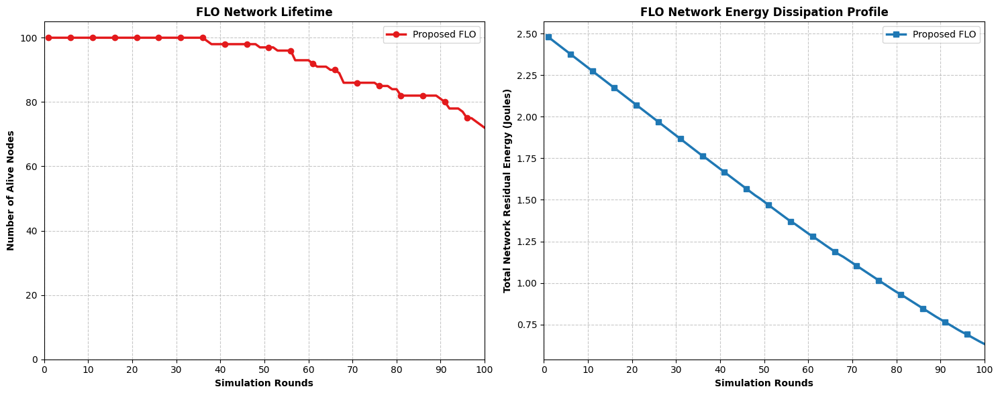

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS (Scaled for 100 Rounds)
# =========================================================================
AREA = 100            # Network Dimension (100m x 100m)
NUM_NODES = 100       # Total deployed IoT nodes
BS_X = 50             # Base Station X coordinate
BS_Y = 50             # Base Station Y coordinate

# Scaled energy configuration to fit network degradation cleanly into 100 rounds
INITIAL_ENERGY = 0.025 # Initial battery capacity per node (Joules)
PACKET_SIZE = 2000     # Data packet size (bits)
ROUNDS = 100           # Simulation lifespan

# Radio Electronics Energy Coefficients
E_ELEC = 50e-9         # Electronics energy (50 nJ/bit)
E_AMP = 10e-12         # Amplifier energy coefficient (10 pJ/bit/m^2)

# FLOA Algorithm Hyperparameters
NUM_LIZARDS = 15       # Population size (Number of lizards)
NUM_CH = 5             # Desired Cluster Heads per round
MAX_ITER = 15          # Optimization iterations per round

# FLOA Optimal Fitness Weights (From Paper)
BETA1 = 0.4            # Weight for Base Station Distance
BETA2 = 0.3            # Weight for Residual Energy Capacity
BETA3 = 0.3            # Weight for Intra-cluster Proximity Distance

# =========================================================================
# 2. CORE UTILITY CLASSES
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id = node_id
        self.x = x
        self.y = y
        self.energy = INITIAL_ENERGY
        self.alive = True
        self.is_CH = False

def calculate_distance(x1, y1, x2, y2):
    return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)

def compute_tx_energy(bits, dist):
    return (E_ELEC * bits) + (E_AMP * bits * (dist ** 2))

def compute_rx_energy(bits):
    return E_ELEC * bits

# =========================================================================
# 3. FLOA MULTI-OBJECTIVE FITNESS FUNCTION
# =========================================================================
def evaluate_fitness(ch_identifiers, total_node_list):
    active_nodes = [node for node in total_node_list if node.alive]
    ch_nodes = [total_node_list[idx] for idx in ch_identifiers]

    if not ch_nodes:
        return float('inf')

    # f1: Distance to Base Station
    f1_val = sum(calculate_distance(ch.x, ch.y, BS_X, BS_Y) for ch in ch_nodes)

    # f2: Energy ratio metric
    total_network_energy = sum(node.energy for node in active_nodes) + 1e-9
    ch_residual_energy = sum(ch.energy for ch in ch_nodes)
    f2_val = ch_residual_energy / total_network_energy

    # f3: Intra-cluster proximity
    f3_val = 0
    for node in active_nodes:
        if node.id in ch_identifiers:
            continue
        min_space_dist = min(calculate_distance(node.x, node.y, ch.x, ch.y) for ch in ch_nodes)
        f3_val += min_space_dist

    # Minimize Equation (16)
    inverted_f2 = 1.0 / (f2_val + 1e-6)
    return (BETA1 * f1_val) + (BETA2 * inverted_f2) + (BETA3 * f3_val)

# =========================================================================
# 4. FRILLED LIZARD OPTIMIZATION (FLO) LOGIC
# =========================================================================
def execute_floa(node_pool, valid_alive_indices):
    alive_list = list(valid_alive_indices)
    if len(alive_list) <= NUM_CH:
        return alive_list

    # Population Matrix Initialization
    population = [random.sample(alive_list, NUM_CH) for _ in range(NUM_LIZARDS)]
    fitness_scores = [evaluate_fitness(lizard, node_pool) for lizard in population]

    best_idx = np.argmin(fitness_scores)
    g_best_sol = list(population[best_idx])
    g_best_fit = fitness_scores[best_idx]

    for t in range(1, MAX_ITER + 1):
        # --- STAGE 1: EXPLORATION (Hunting Prey) ---
        for i in range(NUM_LIZARDS):
            current_sol = list(population[i])
            current_fit = fitness_scores[i]

            prey_pool = [population[k] for k in range(NUM_LIZARDS) if fitness_scores[k] < current_fit] + [g_best_sol]
            selected_prey = random.choice(prey_pool)

            proposed_lizard = []
            for j in range(NUM_CH):
                r = random.random()
                I = random.choice([0, 1])
                step_delta = r * (selected_prey[j] - I * current_sol[j])
                updated_val = int(round(current_sol[j] + step_delta))

                if updated_val not in alive_list:
                    updated_val = random.choice(alive_list)
                proposed_lizard.append(updated_val)

            proposed_fit = evaluate_fitness(proposed_lizard, node_pool)
            if proposed_fit < current_fit:
                population[i] = proposed_lizard
                fitness_scores[i] = proposed_fit

        best_idx = np.argmin(fitness_scores)
        if fitness_scores[best_idx] < g_best_fit:
            g_best_fit = fitness_scores[best_idx]
            g_best_sol = list(population[best_idx])

        # --- STAGE 2: EXPLOITATION (Climbing Trees) ---
        for i in range(NUM_LIZARDS):
            current_sol = list(population[i])
            current_fit = fitness_scores[i]
            proposed_lizard = []

            for j in range(NUM_CH):
                r = random.random()
                exploit_step = (r * (NUM_NODES - 1)) / t
                updated_val = int(round(current_sol[j] + exploit_step))

                if updated_val not in alive_list:
                    updated_val = random.choice(alive_list)
                proposed_lizard.append(updated_val)

            proposed_fit = evaluate_fitness(proposed_lizard, node_pool)
            if proposed_fit < current_fit:
                population[i] = proposed_lizard
                fitness_scores[i] = proposed_fit

        best_idx = np.argmin(fitness_scores)
        if fitness_scores[best_idx] < g_best_fit:
            g_best_fit = fitness_scores[best_idx]
            g_best_sol = list(population[best_idx])

    return g_best_sol

# =========================================================================
# 5. DYNAMIC ROUTING ENVIRONMENT RUNTIME
# =========================================================================
random.seed(42)
np.random.seed(42)
node_network = [IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA)) for i in range(NUM_NODES)]

alive_nodes_history = []
total_energy_history = []

print(f"🚀 Launching FLO Simulation ({NUM_NODES} Nodes / {ROUNDS} Rounds)...\n" + "="*60)

for r in range(1, ROUNDS + 1):
    current_alive_indices = {node.id for node in node_network if node.alive}

    if len(current_alive_indices) < NUM_CH:
        print(f"🛑 Network terminated early at Round {r}: Node count below required Cluster Heads.")
        for _ in range(r, ROUNDS + 1):
            alive_nodes_history.append(len(current_alive_indices))
            total_energy_history.append(sum(max(n.energy, 0) for n in node_network))
        break

    for node in node_network:
        node.is_CH = False

    # Execute FLO Optimization
    selected_ch_ids = execute_floa(node_network, current_alive_indices)
    for ch_id in selected_ch_ids:
        node_network[ch_id].is_CH = True

    # Cluster Association
    clusters = {ch_id: [] for ch_id in selected_ch_ids}
    for node in node_network:
        if not node.alive or node.is_CH:
            continue
        target_ch = min(selected_ch_ids, key=lambda cid: calculate_distance(node.x, node.y, node_network[cid].x, node_network[cid].y))
        clusters[target_ch].append(node.id)

    # Energy Dissipation Processing
    for ch_id, member_ids in clusters.items():
        ch_node = node_network[ch_id]
        for m_id in member_ids:
            member_node = node_network[m_id]
            dist_to_ch = calculate_distance(member_node.x, member_node.y, ch_node.x, ch_node.y)

            tx_cost = compute_tx_energy(PACKET_SIZE, dist_to_ch)
            member_node.energy -= tx_cost
            if member_node.energy <= 0:
                member_node.alive = False

            rx_cost = compute_rx_energy(PACKET_SIZE)
            ch_node.energy -= rx_cost
            if ch_node.energy <= 0:
                ch_node.alive = False

    # CH to Base Station Transmission
    for ch_id in selected_ch_ids:
        ch_node = node_network[ch_id]
        if not ch_node.alive:
            continue
        dist_to_bs = calculate_distance(ch_node.x, ch_node.y, BS_X, BS_Y)
        longhaul_tx_cost = compute_tx_energy(PACKET_SIZE, dist_to_bs)
        ch_node.energy -= longhaul_tx_cost
        if ch_node.energy <= 0:
            ch_node.alive = False

    # Snapshot Metrics
    total_alive = sum(1 for node in node_network if node.alive)
    network_residual_joules = sum(max(node.energy, 0) for node in node_network)

    alive_nodes_history.append(total_alive)
    total_energy_history.append(network_residual_joules)

    if r % 10 == 0 or r == 1:
        print(f"Round {r:03d} / {ROUNDS} -> Active Nodes: {total_alive:03d} | Total Energy: {network_residual_joules:.4f} J")

print("="*60 + "\n✅ Simulation Concluded.")

# =========================================================================
# 6. VISUALIZATION
# =========================================================================
plt.figure(figsize=(15, 6))
round_axis = range(1, ROUNDS + 1)
tick_step = 10 # Ideal for 100 rounds

# Graph 1: Network Lifetime Curve
plt.subplot(1, 2, 1)
plt.plot(round_axis, alive_nodes_history, color='#e31a1c', linewidth=2.5, marker='o', markevery=5, label='Proposed FLO')
plt.xlabel("Simulation Rounds", fontweight='bold')
plt.ylabel("Number of Alive Nodes", fontweight='bold')
plt.title("FLO Network Lifetime", fontweight='bold')
plt.xticks(np.arange(0, ROUNDS + 1, tick_step))
plt.xlim(0, ROUNDS)
plt.ylim(0, 105)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()

# Graph 2: Energy Decay Curve
plt.subplot(1, 2, 2)
plt.plot(round_axis, total_energy_history, color='#1f78b4', linewidth=2.5, marker='s', markevery=5, label='Proposed FLO')
plt.xlabel("Simulation Rounds", fontweight='bold')
plt.ylabel("Total Network Residual Energy (Joules)", fontweight='bold')
plt.title("FLO Network Energy Dissipation Profile", fontweight='bold')
plt.xticks(np.arange(0, ROUNDS + 1, tick_step))
plt.xlim(0, ROUNDS)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()

plt.tight_layout()
plt.show()

🚀 Launching FLO Simulation (100 Nodes / 250 Rounds)...
Round 001 / 250 -> Active Nodes: 100 | Total Energy: 2.4796 J
Round 025 / 250 -> Active Nodes: 100 | Total Energy: 1.9892 J
Round 050 / 250 -> Active Nodes: 097 | Total Energy: 1.4888 J
Round 075 / 250 -> Active Nodes: 086 | Total Energy: 1.0331 J
Round 100 / 250 -> Active Nodes: 072 | Total Energy: 0.6327 J
Round 125 / 250 -> Active Nodes: 049 | Total Energy: 0.3211 J
Round 150 / 250 -> Active Nodes: 033 | Total Energy: 0.1252 J
Round 175 / 250 -> Active Nodes: 009 | Total Energy: 0.0220 J
🛑 Network terminated early at Round 187: Node count below required Cluster Heads.
✅ Simulation Concluded.


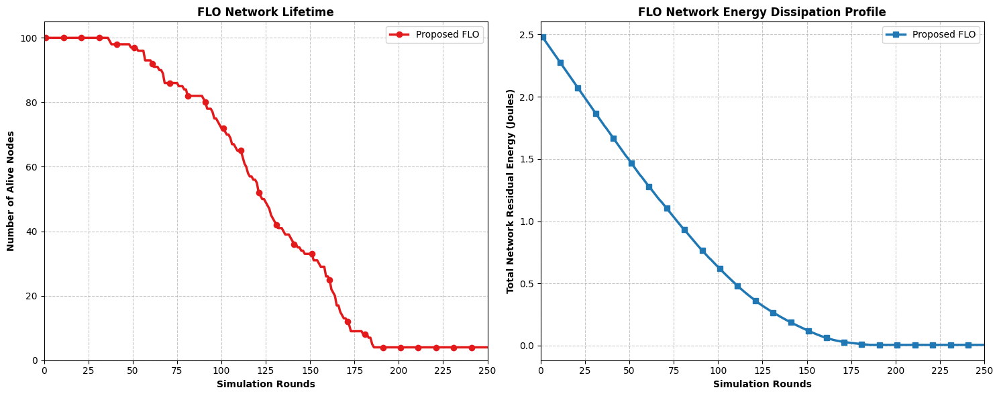

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS (Scaled for Full Lifespan Curve)
# =========================================================================
AREA = 100            # Network Dimension (100m x 100m)
NUM_NODES = 100       # Total deployed IoT nodes
BS_X = 50             # Base Station X coordinate
BS_Y = 50             # Base Station Y coordinate

# Scaled energy configuration to fit network degradation cleanly
INITIAL_ENERGY = 0.025 # Initial battery capacity per node (Joules)
PACKET_SIZE = 2000     # Data packet size (bits)
ROUNDS = 250           # Extended to 250 to show the full energy curve

# Radio Electronics Energy Coefficients
E_ELEC = 50e-9         # Electronics energy (50 nJ/bit)
E_AMP = 10e-12         # Amplifier energy coefficient (10 pJ/bit/m^2)

# FLOA Algorithm Hyperparameters
NUM_LIZARDS = 15       # Population size (Number of lizards)
NUM_CH = 5             # Desired Cluster Heads per round
MAX_ITER = 15          # Optimization iterations per round

# FLOA Optimal Fitness Weights (From Paper)
BETA1 = 0.4            # Weight for Base Station Distance
BETA2 = 0.3            # Weight for Residual Energy Capacity
BETA3 = 0.3            # Weight for Intra-cluster Proximity Distance

# =========================================================================
# 2. CORE UTILITY CLASSES
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id = node_id
        self.x = x
        self.y = y
        self.energy = INITIAL_ENERGY
        self.alive = True
        self.is_CH = False

def calculate_distance(x1, y1, x2, y2):
    return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)

def compute_tx_energy(bits, dist):
    return (E_ELEC * bits) + (E_AMP * bits * (dist ** 2))

def compute_rx_energy(bits):
    return E_ELEC * bits

# =========================================================================
#3. FLOA MULTI-OBJECTIVE FITNESS FUNCTION
# =========================================================================
def evaluate_fitness(ch_identifiers, total_node_list):
    active_nodes = [node for node in total_node_list if node.alive]
    ch_nodes = [total_node_list[idx] for idx in ch_identifiers]

    if not ch_nodes:
        return float('inf')

    # f1: Distance to Base Station
    f1_val = sum(calculate_distance(ch.x, ch.y, BS_X, BS_Y) for ch in ch_nodes)

    # f2: Energy ratio metric
    total_network_energy = sum(node.energy for node in active_nodes) + 1e-9
    ch_residual_energy = sum(ch.energy for ch in ch_nodes)
    f2_val = ch_residual_energy / total_network_energy

    # f3: Intra-cluster proximity
    f3_val = 0
    for node in active_nodes:
        if node.id in ch_identifiers:
            continue
        min_space_dist = min(calculate_distance(node.x, node.y, ch.x, ch.y) for ch in ch_nodes)
        f3_val += min_space_dist

    # Minimize Equation (16)
    inverted_f2 = 1.0 / (f2_val + 1e-6)
    return (BETA1 * f1_val) + (BETA2 * inverted_f2) + (BETA3 * f3_val)

# =========================================================================
# 4. FRILLED LIZARD OPTIMIZATION (FLO) LOGIC
# =========================================================================
def execute_floa(node_pool, valid_alive_indices):
    alive_list = list(valid_alive_indices)
    if len(alive_list) <= NUM_CH:
        return alive_list

    # Population Matrix Initialization
    population = [random.sample(alive_list, NUM_CH) for _ in range(NUM_LIZARDS)]
    fitness_scores = [evaluate_fitness(lizard, node_pool) for lizard in population]

    best_idx = np.argmin(fitness_scores)
    g_best_sol = list(population[best_idx])
    g_best_fit = fitness_scores[best_idx]

    for t in range(1, MAX_ITER + 1):
        # --- STAGE 1: EXPLORATION (Hunting Prey) ---
        for i in range(NUM_LIZARDS):
            current_sol = list(population[i])
            current_fit = fitness_scores[i]

            prey_pool = [population[k] for k in range(NUM_LIZARDS) if fitness_scores[k] < current_fit] + [g_best_sol]
            selected_prey = random.choice(prey_pool)

            proposed_lizard = []
            for j in range(NUM_CH):
                r = random.random()
                I = random.choice([0, 1])
                step_delta = r * (selected_prey[j] - I * current_sol[j])
                updated_val = int(round(current_sol[j] + step_delta))

                if updated_val not in alive_list:
                    updated_val = random.choice(alive_list)
                proposed_lizard.append(updated_val)

            proposed_fit = evaluate_fitness(proposed_lizard, node_pool)
            if proposed_fit < current_fit:
                population[i] = proposed_lizard
                fitness_scores[i] = proposed_fit

        best_idx = np.argmin(fitness_scores)
        if fitness_scores[best_idx] < g_best_fit:
            g_best_fit = fitness_scores[best_idx]
            g_best_sol = list(population[best_idx])

        # --- STAGE 2: EXPLOITATION (Climbing Trees) ---
        for i in range(NUM_LIZARDS):
            current_sol = list(population[i])
            current_fit = fitness_scores[i]
            proposed_lizard = []

            for j in range(NUM_CH):
                r = random.random()
                exploit_step = (r * (NUM_NODES - 1)) / t
                updated_val = int(round(current_sol[j] + exploit_step))

                if updated_val not in alive_list:
                    updated_val = random.choice(alive_list)
                proposed_lizard.append(updated_val)

            proposed_fit = evaluate_fitness(proposed_lizard, node_pool)
            if proposed_fit < current_fit:
                population[i] = proposed_lizard
                fitness_scores[i] = proposed_fit

        best_idx = np.argmin(fitness_scores)
        if fitness_scores[best_idx] < g_best_fit:
            g_best_fit = fitness_scores[best_idx]
            g_best_sol = list(population[best_idx])

    return g_best_sol

# =========================================================================
# 5. DYNAMIC ROUTING ENVIRONMENT RUNTIME
# =========================================================================
random.seed(42)
np.random.seed(42)
node_network = [IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA)) for i in range(NUM_NODES)]

alive_nodes_history = []
total_energy_history = []

print(f"🚀 Launching FLO Simulation ({NUM_NODES} Nodes / {ROUNDS} Rounds)...\n" + "="*60)

for r in range(1, ROUNDS + 1):
    current_alive_indices = {node.id for node in node_network if node.alive}

    if len(current_alive_indices) < NUM_CH:
        print(f"🛑 Network terminated early at Round {r}: Node count below required Cluster Heads.")
        for _ in range(r, ROUNDS + 1):
            alive_nodes_history.append(len(current_alive_indices))
            total_energy_history.append(sum(max(n.energy, 0) for n in node_network))
        break

    for node in node_network:
        node.is_CH = False

    # Execute FLO Optimization
    selected_ch_ids = execute_floa(node_network, current_alive_indices)
    for ch_id in selected_ch_ids:
        node_network[ch_id].is_CH = True

    # Cluster Association
    clusters = {ch_id: [] for ch_id in selected_ch_ids}
    for node in node_network:
        if not node.alive or node.is_CH:
            continue
        target_ch = min(selected_ch_ids, key=lambda cid: calculate_distance(node.x, node.y, node_network[cid].x, node_network[cid].y))
        clusters[target_ch].append(node.id)

    # Energy Dissipation Processing
    for ch_id, member_ids in clusters.items():
        ch_node = node_network[ch_id]
        for m_id in member_ids:
            member_node = node_network[m_id]
            dist_to_ch = calculate_distance(member_node.x, member_node.y, ch_node.x, ch_node.y)

            tx_cost = compute_tx_energy(PACKET_SIZE, dist_to_ch)
            member_node.energy -= tx_cost
            if member_node.energy <= 0:
                member_node.alive = False

            rx_cost = compute_rx_energy(PACKET_SIZE)
            ch_node.energy -= rx_cost
            if ch_node.energy <= 0:
                ch_node.alive = False

    # CH to Base Station Transmission
    for ch_id in selected_ch_ids:
        ch_node = node_network[ch_id]
        if not ch_node.alive:
            continue
        dist_to_bs = calculate_distance(ch_node.x, ch_node.y, BS_X, BS_Y)
        longhaul_tx_cost = compute_tx_energy(PACKET_SIZE, dist_to_bs)
        ch_node.energy -= longhaul_tx_cost
        if ch_node.energy <= 0:
            ch_node.alive = False

    # Snapshot Metrics
    total_alive = sum(1 for node in node_network if node.alive)
    network_residual_joules = sum(max(node.energy, 0) for node in node_network)

    alive_nodes_history.append(total_alive)
    total_energy_history.append(network_residual_joules)

    if r % 25 == 0 or r == 1:
        print(f"Round {r:03d} / {ROUNDS} -> Active Nodes: {total_alive:03d} | Total Energy: {network_residual_joules:.4f} J")

print("="*60 + "\n✅ Simulation Concluded.")

# =========================================================================
# 6. VISUALIZATION
# =========================================================================
plt.figure(figsize=(15, 6))
round_axis = range(1, len(alive_nodes_history) + 1)

# Set to 25 so the graph axis isn't cluttered
tick_step = 25

# Graph 1: Network Lifetime Curve
plt.subplot(1, 2, 1)
plt.plot(round_axis, alive_nodes_history, color='#e31a1c', linewidth=2.5, marker='o', markevery=10, label='Proposed FLO')
plt.xlabel("Simulation Rounds", fontweight='bold')
plt.ylabel("Number of Alive Nodes", fontweight='bold')
plt.title("FLO Network Lifetime", fontweight='bold')
plt.xticks(np.arange(0, ROUNDS + 1, tick_step))
plt.xlim(0, ROUNDS)
plt.ylim(0, 105)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()

# Graph 2: Energy Decay Curve
plt.subplot(1, 2, 2)
plt.plot(round_axis, total_energy_history, color='#1f78b4', linewidth=2.5, marker='s', markevery=10, label='Proposed FLO')
plt.xlabel("Simulation Rounds", fontweight='bold')
plt.ylabel("Total Network Residual Energy (Joules)", fontweight='bold')
plt.title("FLO Network Energy Dissipation Profile", fontweight='bold')
plt.xticks(np.arange(0, ROUNDS + 1, tick_step))
plt.xlim(0, ROUNDS)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()

plt.tight_layout()
plt.show()

🚀 Launching FLO Simulation (100 Nodes / 250 Rounds)...


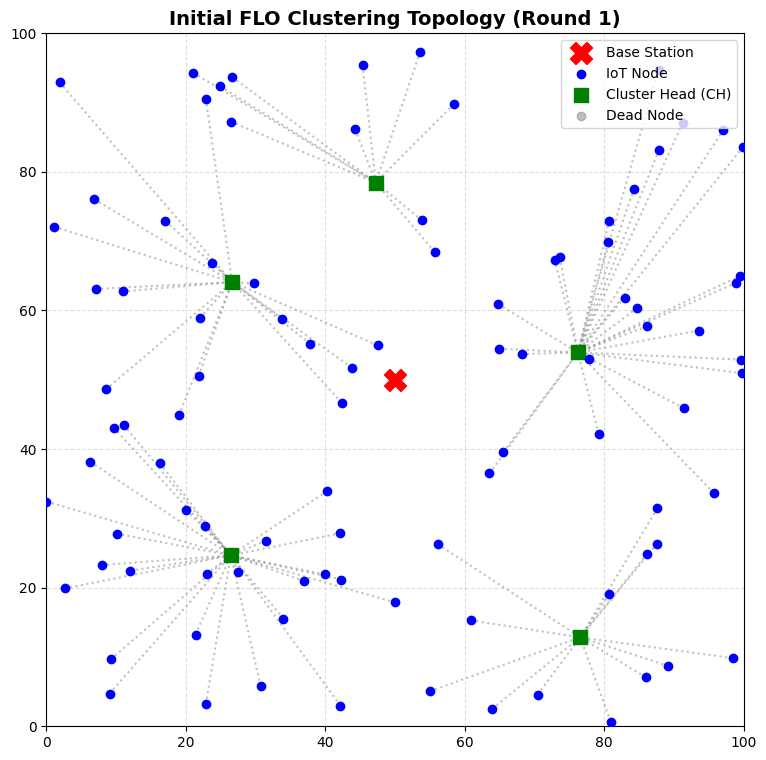

Round 001 / 250 -> Active Nodes: 100 | Total Energy: 2.4796 J
Round 025 / 250 -> Active Nodes: 100 | Total Energy: 1.9892 J
Round 050 / 250 -> Active Nodes: 097 | Total Energy: 1.4888 J
Round 075 / 250 -> Active Nodes: 086 | Total Energy: 1.0331 J
Round 100 / 250 -> Active Nodes: 072 | Total Energy: 0.6327 J
Round 125 / 250 -> Active Nodes: 049 | Total Energy: 0.3211 J
Round 150 / 250 -> Active Nodes: 033 | Total Energy: 0.1252 J
Round 175 / 250 -> Active Nodes: 009 | Total Energy: 0.0220 J
🛑 Network terminated early at Round 187: Node count below required Cluster Heads.
✅ Simulation Concluded.


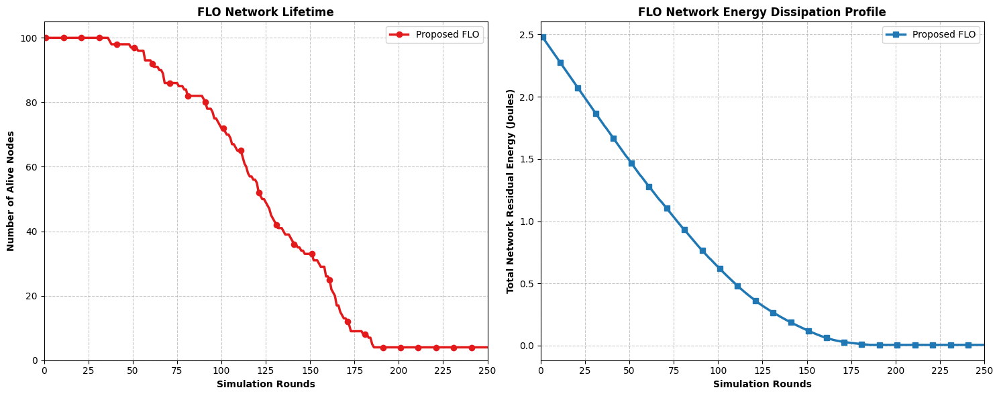

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS (Scaled for Full Lifespan Curve)
# =========================================================================
AREA = 100            # Network Dimension (100m x 100m)
NUM_NODES = 100       # Total deployed IoT nodes
BS_X = 50             # Base Station X coordinate
BS_Y = 50             # Base Station Y coordinate

# Scaled energy configuration to fit network degradation cleanly
INITIAL_ENERGY = 0.025 # Initial battery capacity per node (Joules)
PACKET_SIZE = 2000     # Data packet size (bits)
ROUNDS = 250           # Extended to 250 to show the full energy curve

# Radio Electronics Energy Coefficients
E_ELEC = 50e-9         # Electronics energy (50 nJ/bit)
E_AMP = 10e-12         # Amplifier energy coefficient (10 pJ/bit/m^2)

# FLOA Algorithm Hyperparameters
NUM_LIZARDS = 15       # Population size (Number of lizards)
NUM_CH = 5             # Desired Cluster Heads per round
MAX_ITER = 15          # Optimization iterations per round

# FLOA Optimal Fitness Weights (From Paper)
BETA1 = 0.4            # Weight for Base Station Distance
BETA2 = 0.3            # Weight for Residual Energy Capacity
BETA3 = 0.3            # Weight for Intra-cluster Proximity Distance

# =========================================================================
# 2. CORE UTILITY CLASSES & VISUALIZATION
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id = node_id
        self.x = x
        self.y = y
        self.energy = INITIAL_ENERGY
        self.alive = True
        self.is_CH = False

def calculate_distance(x1, y1, x2, y2):
    return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)

def compute_tx_energy(bits, dist):
    return (E_ELEC * bits) + (E_AMP * bits * (dist ** 2))

def compute_rx_energy(bits):
    return E_ELEC * bits

def plot_network_topology(nodes, clusters, title):
    """Visualizes the physical layout of the network and its clusters."""
    plt.figure(figsize=(9, 9))

    # Draw connections first so they appear behind the nodes
    for ch_id, member_ids in clusters.items():
        ch_node = nodes[ch_id]
        for m_id in member_ids:
            m_node = nodes[m_id]
            plt.plot([m_node.x, ch_node.x], [m_node.y, ch_node.y], color='gray', linestyle=':', alpha=0.5)

    # Plot Nodes
    for node in nodes:
        if not node.alive:
            plt.scatter(node.x, node.y, color='gray', alpha=0.5) # Dead nodes
        elif node.is_CH:
            plt.scatter(node.x, node.y, color='green', marker='s', s=100, zorder=5) # CH Nodes
        else:
            plt.scatter(node.x, node.y, color='blue', zorder=5) # Normal Nodes

    # Base station
    plt.scatter(BS_X, BS_Y, color='red', marker='X', s=250, zorder=10, label='Base Station')

    # Custom Legend
    plt.scatter([], [], color='blue', label='IoT Node')
    plt.scatter([], [], color='green', marker='s', s=100, label='Cluster Head (CH)')
    plt.scatter([], [], color='gray', alpha=0.5, label='Dead Node')

    plt.title(title, fontweight='bold', fontsize=14)
    plt.xlim(0, AREA)
    plt.ylim(0, AREA)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend(loc='upper right')
    plt.show()

# =========================================================================
# 3. FLOA MULTI-OBJECTIVE FITNESS FUNCTION
# =========================================================================
def evaluate_fitness(ch_identifiers, total_node_list):
    active_nodes = [node for node in total_node_list if node.alive]
    ch_nodes = [total_node_list[idx] for idx in ch_identifiers]

    if not ch_nodes:
        return float('inf')

    # f1: Distance to Base Station
    f1_val = sum(calculate_distance(ch.x, ch.y, BS_X, BS_Y) for ch in ch_nodes)

    # f2: Energy ratio metric
    total_network_energy = sum(node.energy for node in active_nodes) + 1e-9
    ch_residual_energy = sum(ch.energy for ch in ch_nodes)
    f2_val = ch_residual_energy / total_network_energy

    # f3: Intra-cluster proximity
    f3_val = 0
    for node in active_nodes:
        if node.id in ch_identifiers:
            continue
        min_space_dist = min(calculate_distance(node.x, node.y, ch.x, ch.y) for ch in ch_nodes)
        f3_val += min_space_dist

    # Minimize Equation (16)
    inverted_f2 = 1.0 / (f2_val + 1e-6)
    return (BETA1 * f1_val) + (BETA2 * inverted_f2) + (BETA3 * f3_val)

# =========================================================================
# 4. FRILLED LIZARD OPTIMIZATION (FLO) LOGIC
# =========================================================================
def execute_floa(node_pool, valid_alive_indices):
    alive_list = list(valid_alive_indices)
    if len(alive_list) <= NUM_CH:
        return alive_list

    # Population Matrix Initialization
    population = [random.sample(alive_list, NUM_CH) for _ in range(NUM_LIZARDS)]
    fitness_scores = [evaluate_fitness(lizard, node_pool) for lizard in population]

    best_idx = np.argmin(fitness_scores)
    g_best_sol = list(population[best_idx])
    g_best_fit = fitness_scores[best_idx]

    for t in range(1, MAX_ITER + 1):
        # --- STAGE 1: EXPLORATION (Hunting Prey) ---
        for i in range(NUM_LIZARDS):
            current_sol = list(population[i])
            current_fit = fitness_scores[i]

            prey_pool = [population[k] for k in range(NUM_LIZARDS) if fitness_scores[k] < current_fit] + [g_best_sol]
            selected_prey = random.choice(prey_pool)

            proposed_lizard = []
            for j in range(NUM_CH):
                r = random.random()
                I = random.choice([0, 1])
                step_delta = r * (selected_prey[j] - I * current_sol[j])
                updated_val = int(round(current_sol[j] + step_delta))

                if updated_val not in alive_list:
                    updated_val = random.choice(alive_list)
                proposed_lizard.append(updated_val)

            proposed_fit = evaluate_fitness(proposed_lizard, node_pool)
            if proposed_fit < current_fit:
                population[i] = proposed_lizard
                fitness_scores[i] = proposed_fit

        best_idx = np.argmin(fitness_scores)
        if fitness_scores[best_idx] < g_best_fit:
            g_best_fit = fitness_scores[best_idx]
            g_best_sol = list(population[best_idx])

        # --- STAGE 2: EXPLOITATION (Climbing Trees) ---
        for i in range(NUM_LIZARDS):
            current_sol = list(population[i])
            current_fit = fitness_scores[i]
            proposed_lizard = []

            for j in range(NUM_CH):
                r = random.random()
                exploit_step = (r * (NUM_NODES - 1)) / t
                updated_val = int(round(current_sol[j] + exploit_step))

                if updated_val not in alive_list:
                    updated_val = random.choice(alive_list)
                proposed_lizard.append(updated_val)

            proposed_fit = evaluate_fitness(proposed_lizard, node_pool)
            if proposed_fit < current_fit:
                population[i] = proposed_lizard
                fitness_scores[i] = proposed_fit

        best_idx = np.argmin(fitness_scores)
        if fitness_scores[best_idx] < g_best_fit:
            g_best_fit = fitness_scores[best_idx]
            g_best_sol = list(population[best_idx])

    return g_best_sol

# =========================================================================
# 5. DYNAMIC ROUTING ENVIRONMENT RUNTIME
# =========================================================================
random.seed(42)
np.random.seed(42)
node_network = [IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA)) for i in range(NUM_NODES)]

alive_nodes_history = []
total_energy_history = []

print(f"🚀 Launching FLO Simulation ({NUM_NODES} Nodes / {ROUNDS} Rounds)...\n" + "="*60)

for r in range(1, ROUNDS + 1):
    current_alive_indices = {node.id for node in node_network if node.alive}

    if len(current_alive_indices) < NUM_CH:
        print(f"🛑 Network terminated early at Round {r}: Node count below required Cluster Heads.")
        for _ in range(r, ROUNDS + 1):
            alive_nodes_history.append(len(current_alive_indices))
            total_energy_history.append(sum(max(n.energy, 0) for n in node_network))
        break

    for node in node_network:
        node.is_CH = False

    # Execute FLO Optimization
    selected_ch_ids = execute_floa(node_network, current_alive_indices)
    for ch_id in selected_ch_ids:
        node_network[ch_id].is_CH = True

    # Cluster Association
    clusters = {ch_id: [] for ch_id in selected_ch_ids}
    for node in node_network:
        if not node.alive or node.is_CH:
            continue
        target_ch = min(selected_ch_ids, key=lambda cid: calculate_distance(node.x, node.y, node_network[cid].x, node_network[cid].y))
        clusters[target_ch].append(node.id)

    # ---> VISUALIZATION SNAPSHOT: Show the network after Round 1 clustering
    if r == 1:
        plot_network_topology(node_network, clusters, "Initial FLO Clustering Topology (Round 1)")

    # Energy Dissipation Processing
    for ch_id, member_ids in clusters.items():
        ch_node = node_network[ch_id]
        for m_id in member_ids:
            member_node = node_network[m_id]
            dist_to_ch = calculate_distance(member_node.x, member_node.y, ch_node.x, ch_node.y)

            tx_cost = compute_tx_energy(PACKET_SIZE, dist_to_ch)
            member_node.energy -= tx_cost
            if member_node.energy <= 0:
                member_node.alive = False

            rx_cost = compute_rx_energy(PACKET_SIZE)
            ch_node.energy -= rx_cost
            if ch_node.energy <= 0:
                ch_node.alive = False

    # CH to Base Station Transmission
    for ch_id in selected_ch_ids:
        ch_node = node_network[ch_id]
        if not ch_node.alive:
            continue
        dist_to_bs = calculate_distance(ch_node.x, ch_node.y, BS_X, BS_Y)
        longhaul_tx_cost = compute_tx_energy(PACKET_SIZE, dist_to_bs)
        ch_node.energy -= longhaul_tx_cost
        if ch_node.energy <= 0:
            ch_node.alive = False

    # Snapshot Metrics
    total_alive = sum(1 for node in node_network if node.alive)
    network_residual_joules = sum(max(node.energy, 0) for node in node_network)

    alive_nodes_history.append(total_alive)
    total_energy_history.append(network_residual_joules)

    if r % 25 == 0 or r == 1:
        print(f"Round {r:03d} / {ROUNDS} -> Active Nodes: {total_alive:03d} | Total Energy: {network_residual_joules:.4f} J")

print("="*60 + "\n✅ Simulation Concluded.")

# =========================================================================
# 6. LIFETIME AND ENERGY VISUALIZATION
# =========================================================================
plt.figure(figsize=(15, 6))
round_axis = range(1, len(alive_nodes_history) + 1)
tick_step = 25

# Graph 1: Network Lifetime Curve
plt.subplot(1, 2, 1)
plt.plot(round_axis, alive_nodes_history, color='#e31a1c', linewidth=2.5, marker='o', markevery=10, label='Proposed FLO')
plt.xlabel("Simulation Rounds", fontweight='bold')
plt.ylabel("Number of Alive Nodes", fontweight='bold')
plt.title("FLO Network Lifetime", fontweight='bold')
plt.xticks(np.arange(0, ROUNDS + 1, tick_step))
plt.xlim(0, ROUNDS)
plt.ylim(0, 105)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()

# Graph 2: Energy Decay Curve
plt.subplot(1, 2, 2)
plt.plot(round_axis, total_energy_history, color='#1f78b4', linewidth=2.5, marker='s', markevery=10, label='Proposed FLO')
plt.xlabel("Simulation Rounds", fontweight='bold')
plt.ylabel("Total Network Residual Energy (Joules)", fontweight='bold')
plt.title("FLO Network Energy Dissipation Profile", fontweight='bold')
plt.xticks(np.arange(0, ROUNDS + 1, tick_step))
plt.xlim(0, ROUNDS)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()

plt.tight_layout()
plt.show()

🚀 Launching FLO Simulation (100 Nodes / 250 Rounds)...


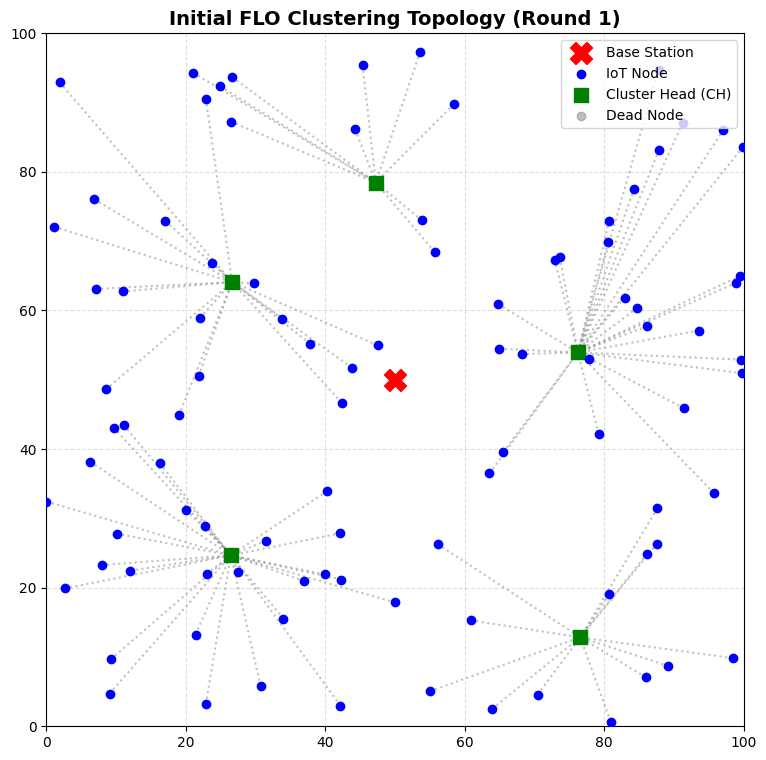

Round 001 / 250 -> Active Nodes: 100 | Total Energy: 2.4796 J
Round 025 / 250 -> Active Nodes: 100 | Total Energy: 1.9892 J
Round 050 / 250 -> Active Nodes: 097 | Total Energy: 1.4888 J
Round 075 / 250 -> Active Nodes: 086 | Total Energy: 1.0331 J
Round 100 / 250 -> Active Nodes: 072 | Total Energy: 0.6327 J
Round 125 / 250 -> Active Nodes: 049 | Total Energy: 0.3211 J
Round 150 / 250 -> Active Nodes: 033 | Total Energy: 0.1252 J
Round 175 / 250 -> Active Nodes: 009 | Total Energy: 0.0220 J
🛑 Network terminated early at Round 187: Node count below required Cluster Heads.
✅ Simulation Concluded.


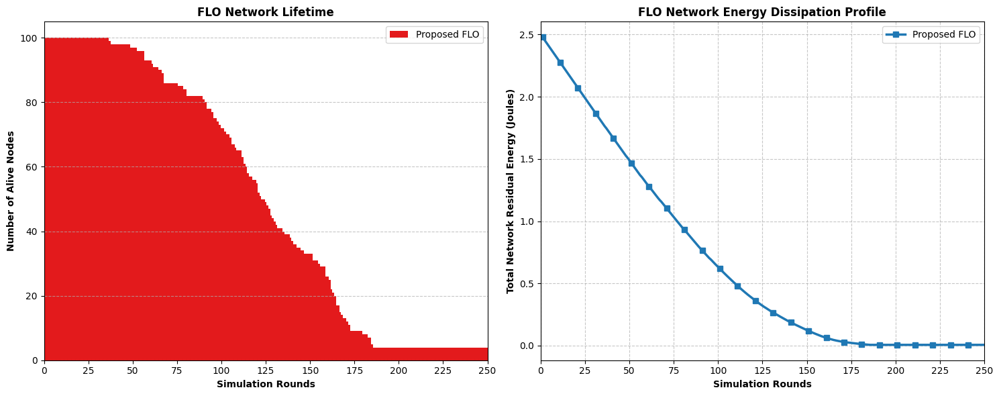

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS (Scaled for Full Lifespan Curve)
# =========================================================================
AREA = 100            # Network Dimension (100m x 100m)
NUM_NODES = 100       # Total deployed IoT nodes
BS_X = 50             # Base Station X coordinate
BS_Y = 50             # Base Station Y coordinate

# Scaled energy configuration to fit network degradation cleanly
INITIAL_ENERGY = 0.025 # Initial battery capacity per node (Joules)
PACKET_SIZE = 2000     # Data packet size (bits)
ROUNDS = 250           # Extended to 250 to show the full energy curve

# Radio Electronics Energy Coefficients
E_ELEC = 50e-9         # Electronics energy (50 nJ/bit)
E_AMP = 10e-12         # Amplifier energy coefficient (10 pJ/bit/m^2)

# FLOA Algorithm Hyperparameters
NUM_LIZARDS = 15       # Population size (Number of lizards)
NUM_CH = 5             # Desired Cluster Heads per round
MAX_ITER = 15          # Optimization iterations per round

# FLOA Optimal Fitness Weights (From Paper)
BETA1 = 0.4            # Weight for Base Station Distance
BETA2 = 0.3            # Weight for Residual Energy Capacity
BETA3 = 0.3            # Weight for Intra-cluster Proximity Distance

# =========================================================================
# 2. CORE UTILITY CLASSES & VISUALIZATION
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id = node_id
        self.x = x
        self.y = y
        self.energy = INITIAL_ENERGY
        self.alive = True
        self.is_CH = False

def calculate_distance(x1, y1, x2, y2):
    return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)

def compute_tx_energy(bits, dist):
    return (E_ELEC * bits) + (E_AMP * bits * (dist ** 2))

def compute_rx_energy(bits):
    return E_ELEC * bits

def plot_network_topology(nodes, clusters, title):
    """Visualizes the physical layout of the network and its clusters."""
    plt.figure(figsize=(9, 9))

    # Draw connections first so they appear behind the nodes
    for ch_id, member_ids in clusters.items():
        ch_node = nodes[ch_id]
        for m_id in member_ids:
            m_node = nodes[m_id]
            plt.plot([m_node.x, ch_node.x], [m_node.y, ch_node.y], color='gray', linestyle=':', alpha=0.5)

    # Plot Nodes
    for node in nodes:
        if not node.alive:
            plt.scatter(node.x, node.y, color='gray', alpha=0.5) # Dead nodes
        elif node.is_CH:
            plt.scatter(node.x, node.y, color='green', marker='s', s=100, zorder=5) # CH Nodes
        else:
            plt.scatter(node.x, node.y, color='blue', zorder=5) # Normal Nodes

    # Base station
    plt.scatter(BS_X, BS_Y, color='red', marker='X', s=250, zorder=10, label='Base Station')

    # Custom Legend
    plt.scatter([], [], color='blue', label='IoT Node')
    plt.scatter([], [], color='green', marker='s', s=100, label='Cluster Head (CH)')
    plt.scatter([], [], color='gray', alpha=0.5, label='Dead Node')

    plt.title(title, fontweight='bold', fontsize=14)
    plt.xlim(0, AREA)
    plt.ylim(0, AREA)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend(loc='upper right')
    plt.show()

# =========================================================================
# 3. FLOA MULTI-OBJECTIVE FITNESS FUNCTION
# =========================================================================
def evaluate_fitness(ch_identifiers, total_node_list):
    active_nodes = [node for node in total_node_list if node.alive]
    ch_nodes = [total_node_list[idx] for idx in ch_identifiers]

    if not ch_nodes:
        return float('inf')

    # f1: Distance to Base Station
    f1_val = sum(calculate_distance(ch.x, ch.y, BS_X, BS_Y) for ch in ch_nodes)

    # f2: Energy ratio metric
    total_network_energy = sum(node.energy for node in active_nodes) + 1e-9
    ch_residual_energy = sum(ch.energy for ch in ch_nodes)
    f2_val = ch_residual_energy / total_network_energy

    # f3: Intra-cluster proximity
    f3_val = 0
    for node in active_nodes:
        if node.id in ch_identifiers:
            continue
        min_space_dist = min(calculate_distance(node.x, node.y, ch.x, ch.y) for ch in ch_nodes)
        f3_val += min_space_dist

    # Minimize Equation (16)
    inverted_f2 = 1.0 / (f2_val + 1e-6)
    return (BETA1 * f1_val) + (BETA2 * inverted_f2) + (BETA3 * f3_val)

# =========================================================================
# 4. FRILLED LIZARD OPTIMIZATION (FLO) LOGIC
# =========================================================================
def execute_floa(node_pool, valid_alive_indices):
    alive_list = list(valid_alive_indices)
    if len(alive_list) <= NUM_CH:
        return alive_list

    # Population Matrix Initialization
    population = [random.sample(alive_list, NUM_CH) for _ in range(NUM_LIZARDS)]
    fitness_scores = [evaluate_fitness(lizard, node_pool) for lizard in population]

    best_idx = np.argmin(fitness_scores)
    g_best_sol = list(population[best_idx])
    g_best_fit = fitness_scores[best_idx]

    for t in range(1, MAX_ITER + 1):
        # --- STAGE 1: EXPLORATION (Hunting Prey) ---
        for i in range(NUM_LIZARDS):
            current_sol = list(population[i])
            current_fit = fitness_scores[i]

            prey_pool = [population[k] for k in range(NUM_LIZARDS) if fitness_scores[k] < current_fit] + [g_best_sol]
            selected_prey = random.choice(prey_pool)

            proposed_lizard = []
            for j in range(NUM_CH):
                r = random.random()
                I = random.choice([0, 1])
                step_delta = r * (selected_prey[j] - I * current_sol[j])
                updated_val = int(round(current_sol[j] + step_delta))

                if updated_val not in alive_list:
                    updated_val = random.choice(alive_list)
                proposed_lizard.append(updated_val)

            proposed_fit = evaluate_fitness(proposed_lizard, node_pool)
            if proposed_fit < current_fit:
                population[i] = proposed_lizard
                fitness_scores[i] = proposed_fit

        best_idx = np.argmin(fitness_scores)
        if fitness_scores[best_idx] < g_best_fit:
            g_best_fit = fitness_scores[best_idx]
            g_best_sol = list(population[best_idx])

        # --- STAGE 2: EXPLOITATION (Climbing Trees) ---
        for i in range(NUM_LIZARDS):
            current_sol = list(population[i])
            current_fit = fitness_scores[i]
            proposed_lizard = []

            for j in range(NUM_CH):
                r = random.random()
                exploit_step = (r * (NUM_NODES - 1)) / t
                updated_val = int(round(current_sol[j] + exploit_step))

                if updated_val not in alive_list:
                    updated_val = random.choice(alive_list)
                proposed_lizard.append(updated_val)

            proposed_fit = evaluate_fitness(proposed_lizard, node_pool)
            if proposed_fit < current_fit:
                population[i] = proposed_lizard
                fitness_scores[i] = proposed_fit

        best_idx = np.argmin(fitness_scores)
        if fitness_scores[best_idx] < g_best_fit:
            g_best_fit = fitness_scores[best_idx]
            g_best_sol = list(population[best_idx])

    return g_best_sol

# =========================================================================
# 5. DYNAMIC ROUTING ENVIRONMENT RUNTIME
# =========================================================================
random.seed(42)
np.random.seed(42)
node_network = [IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA)) for i in range(NUM_NODES)]

alive_nodes_history = []
total_energy_history = []

print(f"🚀 Launching FLO Simulation ({NUM_NODES} Nodes / {ROUNDS} Rounds)...\n" + "="*60)

for r in range(1, ROUNDS + 1):
    current_alive_indices = {node.id for node in node_network if node.alive}

    if len(current_alive_indices) < NUM_CH:
        print(f"🛑 Network terminated early at Round {r}: Node count below required Cluster Heads.")
        for _ in range(r, ROUNDS + 1):
            alive_nodes_history.append(len(current_alive_indices))
            total_energy_history.append(sum(max(n.energy, 0) for n in node_network))
        break

    for node in node_network:
        node.is_CH = False

    # Execute FLO Optimization
    selected_ch_ids = execute_floa(node_network, current_alive_indices)
    for ch_id in selected_ch_ids:
        node_network[ch_id].is_CH = True

    # Cluster Association
    clusters = {ch_id: [] for ch_id in selected_ch_ids}
    for node in node_network:
        if not node.alive or node.is_CH:
            continue
        target_ch = min(selected_ch_ids, key=lambda cid: calculate_distance(node.x, node.y, node_network[cid].x, node_network[cid].y))
        clusters[target_ch].append(node.id)

    # ---> VISUALIZATION SNAPSHOT: Show the network after Round 1 clustering
    if r == 1:
        plot_network_topology(node_network, clusters, "Initial FLO Clustering Topology (Round 1)")

    # Energy Dissipation Processing
    for ch_id, member_ids in clusters.items():
        ch_node = node_network[ch_id]
        for m_id in member_ids:
            member_node = node_network[m_id]
            dist_to_ch = calculate_distance(member_node.x, member_node.y, ch_node.x, ch_node.y)

            tx_cost = compute_tx_energy(PACKET_SIZE, dist_to_ch)
            member_node.energy -= tx_cost
            if member_node.energy <= 0:
                member_node.alive = False

            rx_cost = compute_rx_energy(PACKET_SIZE)
            ch_node.energy -= rx_cost
            if ch_node.energy <= 0:
                ch_node.alive = False

    # CH to Base Station Transmission
    for ch_id in selected_ch_ids:
        ch_node = node_network[ch_id]
        if not ch_node.alive:
            continue
        dist_to_bs = calculate_distance(ch_node.x, ch_node.y, BS_X, BS_Y)
        longhaul_tx_cost = compute_tx_energy(PACKET_SIZE, dist_to_bs)
        ch_node.energy -= longhaul_tx_cost
        if ch_node.energy <= 0:
            ch_node.alive = False

    # Snapshot Metrics
    total_alive = sum(1 for node in node_network if node.alive)
    network_residual_joules = sum(max(node.energy, 0) for node in node_network)

    alive_nodes_history.append(total_alive)
    total_energy_history.append(network_residual_joules)

    if r % 25 == 0 or r == 1:
        print(f"Round {r:03d} / {ROUNDS} -> Active Nodes: {total_alive:03d} | Total Energy: {network_residual_joules:.4f} J")

print("="*60 + "\n✅ Simulation Concluded.")

# =========================================================================
# 6. LIFETIME AND ENERGY VISUALIZATION
# =========================================================================
plt.figure(figsize=(15, 6))
round_axis = range(1, len(alive_nodes_history) + 1)
tick_step = 25

# Graph 1: Network Lifetime Bar Graph
plt.subplot(1, 2, 1)
plt.bar(round_axis, alive_nodes_history, color='#e31a1c', width=1.0, label='Proposed FLO')
plt.xlabel("Simulation Rounds", fontweight='bold')
plt.ylabel("Number of Alive Nodes", fontweight='bold')
plt.title("FLO Network Lifetime", fontweight='bold')
plt.xticks(np.arange(0, ROUNDS + 1, tick_step))
plt.xlim(0, ROUNDS)
plt.ylim(0, 105)
plt.grid(True, linestyle='--', alpha=0.7, axis='y') # Only horizontal grid lines for bar charts
plt.legend()

# Graph 2: Energy Decay Curve (Kept as a line graph for readability)
plt.subplot(1, 2, 2)
plt.plot(round_axis, total_energy_history, color='#1f78b4', linewidth=2.5, marker='s', markevery=10, label='Proposed FLO')
plt.xlabel("Simulation Rounds", fontweight='bold')
plt.ylabel("Total Network Residual Energy (Joules)", fontweight='bold')
plt.title("FLO Network Energy Dissipation Profile", fontweight='bold')
plt.xticks(np.arange(0, ROUNDS + 1, tick_step))
plt.xlim(0, ROUNDS)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()

plt.tight_layout()
plt.show()

🚀 Launching FLO Simulation (100 Nodes / 250 Rounds)...


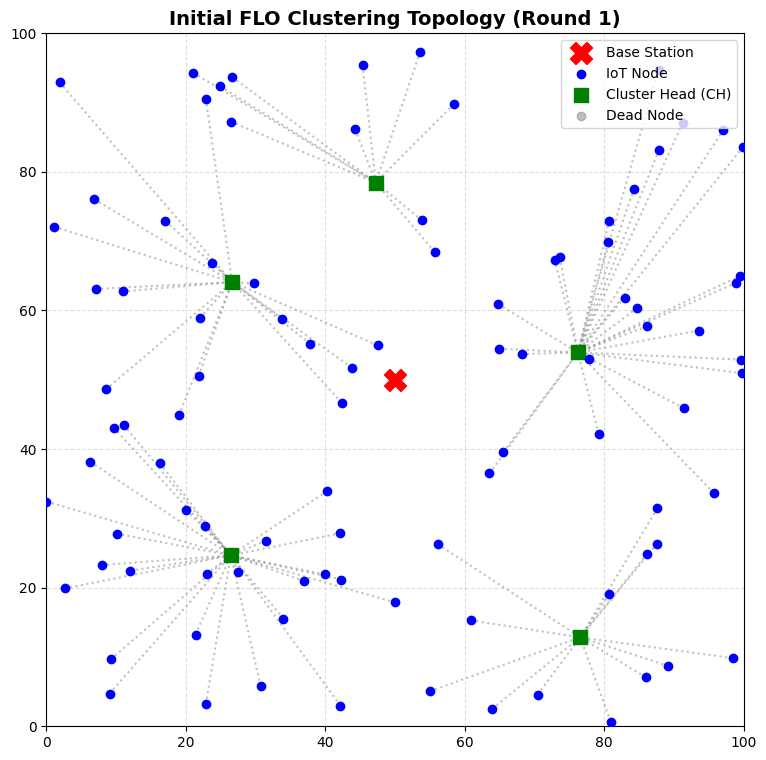

Round 001 / 250 -> Active Nodes: 100 | Total Energy: 2.4796 J
Round 025 / 250 -> Active Nodes: 100 | Total Energy: 1.9892 J
Round 050 / 250 -> Active Nodes: 097 | Total Energy: 1.4888 J
Round 075 / 250 -> Active Nodes: 086 | Total Energy: 1.0331 J
Round 100 / 250 -> Active Nodes: 072 | Total Energy: 0.6327 J
Round 125 / 250 -> Active Nodes: 049 | Total Energy: 0.3211 J
Round 150 / 250 -> Active Nodes: 033 | Total Energy: 0.1252 J
Round 175 / 250 -> Active Nodes: 009 | Total Energy: 0.0220 J
🛑 Network terminated early at Round 187: Node count below required Cluster Heads.
✅ Simulation Concluded.


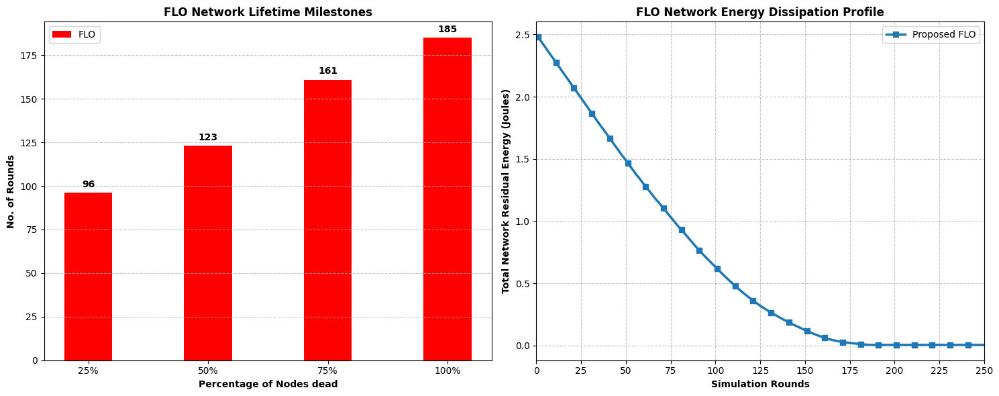

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS (Scaled for Full Lifespan Curve)
# =========================================================================
AREA = 100            # Network Dimension (100m x 100m)
NUM_NODES = 100       # Total deployed IoT nodes
BS_X = 50             # Base Station X coordinate
BS_Y = 50             # Base Station Y coordinate

# Scaled energy configuration to fit network degradation cleanly
INITIAL_ENERGY = 0.025 # Initial battery capacity per node (Joules)
PACKET_SIZE = 2000     # Data packet size (bits)
ROUNDS = 250           # Extended to 250 to show the full energy curve

# Radio Electronics Energy Coefficients
E_ELEC = 50e-9         # Electronics energy (50 nJ/bit)
E_AMP = 10e-12         # Amplifier energy coefficient (10 pJ/bit/m^2)

# FLOA Algorithm Hyperparameters
NUM_LIZARDS = 15       # Population size (Number of lizards)
NUM_CH = 5             # Desired Cluster Heads per round
MAX_ITER = 15          # Optimization iterations per round

# FLOA Optimal Fitness Weights (From Paper)
BETA1 = 0.4            # Weight for Base Station Distance
BETA2 = 0.3            # Weight for Residual Energy Capacity
BETA3 = 0.3            # Weight for Intra-cluster Proximity Distance

# =========================================================================
# 2. CORE UTILITY CLASSES & VISUALIZATION
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id = node_id
        self.x = x
        self.y = y
        self.energy = INITIAL_ENERGY
        self.alive = True
        self.is_CH = False

def calculate_distance(x1, y1, x2, y2):
    return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)

def compute_tx_energy(bits, dist):
    return (E_ELEC * bits) + (E_AMP * bits * (dist ** 2))

def compute_rx_energy(bits):
    return E_ELEC * bits

def plot_network_topology(nodes, clusters, title):
    """Visualizes the physical layout of the network and its clusters."""
    plt.figure(figsize=(9, 9))

    # Draw connections first so they appear behind the nodes
    for ch_id, member_ids in clusters.items():
        ch_node = nodes[ch_id]
        for m_id in member_ids:
            m_node = nodes[m_id]
            plt.plot([m_node.x, ch_node.x], [m_node.y, ch_node.y], color='gray', linestyle=':', alpha=0.5)

    # Plot Nodes
    for node in nodes:
        if not node.alive:
            plt.scatter(node.x, node.y, color='gray', alpha=0.5) # Dead nodes
        elif node.is_CH:
            plt.scatter(node.x, node.y, color='green', marker='s', s=100, zorder=5) # CH Nodes
        else:
            plt.scatter(node.x, node.y, color='blue', zorder=5) # Normal Nodes

    # Base station
    plt.scatter(BS_X, BS_Y, color='red', marker='X', s=250, zorder=10, label='Base Station')

    # Custom Legend
    plt.scatter([], [], color='blue', label='IoT Node')
    plt.scatter([], [], color='green', marker='s', s=100, label='Cluster Head (CH)')
    plt.scatter([], [], color='gray', alpha=0.5, label='Dead Node')

    plt.title(title, fontweight='bold', fontsize=14)
    plt.xlim(0, AREA)
    plt.ylim(0, AREA)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend(loc='upper right')
    plt.show()

# =========================================================================
# 3. FLOA MULTI-OBJECTIVE FITNESS FUNCTION
# =========================================================================
def evaluate_fitness(ch_identifiers, total_node_list):
    active_nodes = [node for node in total_node_list if node.alive]
    ch_nodes = [total_node_list[idx] for idx in ch_identifiers]

    if not ch_nodes:
        return float('inf')

    # f1: Distance to Base Station
    f1_val = sum(calculate_distance(ch.x, ch.y, BS_X, BS_Y) for ch in ch_nodes)

    # f2: Energy ratio metric
    total_network_energy = sum(node.energy for node in active_nodes) + 1e-9
    ch_residual_energy = sum(ch.energy for ch in ch_nodes)
    f2_val = ch_residual_energy / total_network_energy

    # f3: Intra-cluster proximity
    f3_val = 0
    for node in active_nodes:
        if node.id in ch_identifiers:
            continue
        min_space_dist = min(calculate_distance(node.x, node.y, ch.x, ch.y) for ch in ch_nodes)
        f3_val += min_space_dist

    # Minimize Equation (16)
    inverted_f2 = 1.0 / (f2_val + 1e-6)
    return (BETA1 * f1_val) + (BETA2 * inverted_f2) + (BETA3 * f3_val)

# =========================================================================
# 4. FRILLED LIZARD OPTIMIZATION (FLO) LOGIC
# =========================================================================
def execute_floa(node_pool, valid_alive_indices):
    alive_list = list(valid_alive_indices)
    if len(alive_list) <= NUM_CH:
        return alive_list

    # Population Matrix Initialization
    population = [random.sample(alive_list, NUM_CH) for _ in range(NUM_LIZARDS)]
    fitness_scores = [evaluate_fitness(lizard, node_pool) for lizard in population]

    best_idx = np.argmin(fitness_scores)
    g_best_sol = list(population[best_idx])
    g_best_fit = fitness_scores[best_idx]

    for t in range(1, MAX_ITER + 1):
        # --- STAGE 1: EXPLORATION (Hunting Prey) ---
        for i in range(NUM_LIZARDS):
            current_sol = list(population[i])
            current_fit = fitness_scores[i]

            prey_pool = [population[k] for k in range(NUM_LIZARDS) if fitness_scores[k] < current_fit] + [g_best_sol]
            selected_prey = random.choice(prey_pool)

            proposed_lizard = []
            for j in range(NUM_CH):
                r = random.random()
                I = random.choice([0, 1])
                step_delta = r * (selected_prey[j] - I * current_sol[j])
                updated_val = int(round(current_sol[j] + step_delta))

                if updated_val not in alive_list:
                    updated_val = random.choice(alive_list)
                proposed_lizard.append(updated_val)

            proposed_fit = evaluate_fitness(proposed_lizard, node_pool)
            if proposed_fit < current_fit:
                population[i] = proposed_lizard
                fitness_scores[i] = proposed_fit

        best_idx = np.argmin(fitness_scores)
        if fitness_scores[best_idx] < g_best_fit:
            g_best_fit = fitness_scores[best_idx]
            g_best_sol = list(population[best_idx])

        # --- STAGE 2: EXPLOITATION (Climbing Trees) ---
        for i in range(NUM_LIZARDS):
            current_sol = list(population[i])
            current_fit = fitness_scores[i]
            proposed_lizard = []

            for j in range(NUM_CH):
                r = random.random()
                exploit_step = (r * (NUM_NODES - 1)) / t
                updated_val = int(round(current_sol[j] + exploit_step))

                if updated_val not in alive_list:
                    updated_val = random.choice(alive_list)
                proposed_lizard.append(updated_val)

            proposed_fit = evaluate_fitness(proposed_lizard, node_pool)
            if proposed_fit < current_fit:
                population[i] = proposed_lizard
                fitness_scores[i] = proposed_fit

        best_idx = np.argmin(fitness_scores)
        if fitness_scores[best_idx] < g_best_fit:
            g_best_fit = fitness_scores[best_idx]
            g_best_sol = list(population[best_idx])

    return g_best_sol

# =========================================================================
# 5. DYNAMIC ROUTING ENVIRONMENT RUNTIME
# =========================================================================
random.seed(42)
np.random.seed(42)
node_network = [IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA)) for i in range(NUM_NODES)]

alive_nodes_history = []
total_energy_history = []

print(f"🚀 Launching FLO Simulation ({NUM_NODES} Nodes / {ROUNDS} Rounds)...\n" + "="*60)

for r in range(1, ROUNDS + 1):
    current_alive_indices = {node.id for node in node_network if node.alive}

    if len(current_alive_indices) < NUM_CH:
        print(f"🛑 Network terminated early at Round {r}: Node count below required Cluster Heads.")
        for _ in range(r, ROUNDS + 1):
            alive_nodes_history.append(len(current_alive_indices))
            total_energy_history.append(sum(max(n.energy, 0) for n in node_network))
        break

    for node in node_network:
        node.is_CH = False

    # Execute FLO Optimization
    selected_ch_ids = execute_floa(node_network, current_alive_indices)
    for ch_id in selected_ch_ids:
        node_network[ch_id].is_CH = True

    # Cluster Association
    clusters = {ch_id: [] for ch_id in selected_ch_ids}
    for node in node_network:
        if not node.alive or node.is_CH:
            continue
        target_ch = min(selected_ch_ids, key=lambda cid: calculate_distance(node.x, node.y, node_network[cid].x, node_network[cid].y))
        clusters[target_ch].append(node.id)

    # ---> VISUALIZATION SNAPSHOT: Show the network after Round 1 clustering
    if r == 1:
        plot_network_topology(node_network, clusters, "Initial FLO Clustering Topology (Round 1)")

    # Energy Dissipation Processing
    for ch_id, member_ids in clusters.items():
        ch_node = node_network[ch_id]
        for m_id in member_ids:
            member_node = node_network[m_id]
            dist_to_ch = calculate_distance(member_node.x, member_node.y, ch_node.x, ch_node.y)

            tx_cost = compute_tx_energy(PACKET_SIZE, dist_to_ch)
            member_node.energy -= tx_cost
            if member_node.energy <= 0:
                member_node.alive = False

            rx_cost = compute_rx_energy(PACKET_SIZE)
            ch_node.energy -= rx_cost
            if ch_node.energy <= 0:
                ch_node.alive = False

    # CH to Base Station Transmission
    for ch_id in selected_ch_ids:
        ch_node = node_network[ch_id]
        if not ch_node.alive:
            continue
        dist_to_bs = calculate_distance(ch_node.x, ch_node.y, BS_X, BS_Y)
        longhaul_tx_cost = compute_tx_energy(PACKET_SIZE, dist_to_bs)
        ch_node.energy -= longhaul_tx_cost
        if ch_node.energy <= 0:
            ch_node.alive = False

    # Snapshot Metrics
    total_alive = sum(1 for node in node_network if node.alive)
    network_residual_joules = sum(max(node.energy, 0) for node in node_network)

    alive_nodes_history.append(total_alive)
    total_energy_history.append(network_residual_joules)

    if r % 25 == 0 or r == 1:
        print(f"Round {r:03d} / {ROUNDS} -> Active Nodes: {total_alive:03d} | Total Energy: {network_residual_joules:.4f} J")

print("="*60 + "\n✅ Simulation Concluded.")


# =========================================================================
# 6. CALCULATE MILESTONES (For the Bar Graph)
# =========================================================================
# We want to find the round number where the network hits these thresholds:
# 25% dead (75 alive), 50% dead (50 alive), 75% dead (25 alive), 100% dead (simulation breaks < 5 nodes)
target_alive_thresholds = [75, 50, 25, NUM_CH]
percentages = ['25%', '50%', '75%', '100%']
rounds_to_milestone = []

for target in target_alive_thresholds:
    round_reached = ROUNDS
    for idx, alive_count in enumerate(alive_nodes_history):
        if alive_count <= target:
            round_reached = idx + 1
            break
    rounds_to_milestone.append(round_reached)

# =========================================================================
# 7. LIFETIME AND ENERGY VISUALIZATION
# =========================================================================
plt.figure(figsize=(15, 6))

# Graph 1: Milestones Bar Graph (Percentage of Nodes Dead vs No. of Rounds)
plt.subplot(1, 2, 1)
bars = plt.bar(percentages, rounds_to_milestone, color='red', width=0.4, label='FLO')
plt.xlabel("Percentage of Nodes dead", fontweight='bold')
plt.ylabel("No. of Rounds", fontweight='bold')
plt.title("FLO Network Lifetime Milestones", fontweight='bold')
plt.grid(True, linestyle='--', alpha=0.7, axis='y')
plt.legend()

# Add text labels on top of the bars to explicitly show the round number
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 2, int(yval), ha='center', va='bottom', fontweight='bold')


# Graph 2: Energy Decay Curve (Kept to visualize the energy drop over time)
plt.subplot(1, 2, 2)
round_axis = range(1, len(alive_nodes_history) + 1)
tick_step = 25
plt.plot(round_axis, total_energy_history, color='#1f78b4', linewidth=2.5, marker='s', markevery=10, label='Proposed FLO')
plt.xlabel("Simulation Rounds", fontweight='bold')
plt.ylabel("Total Network Residual Energy (Joules)", fontweight='bold')
plt.title("FLO Network Energy Dissipation Profile", fontweight='bold')
plt.xticks(np.arange(0, ROUNDS + 1, tick_step))
plt.xlim(0, ROUNDS)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()

plt.tight_layout()
plt.show()

🚀 Launching FLO Simulation (100 Nodes / 250 Rounds)...


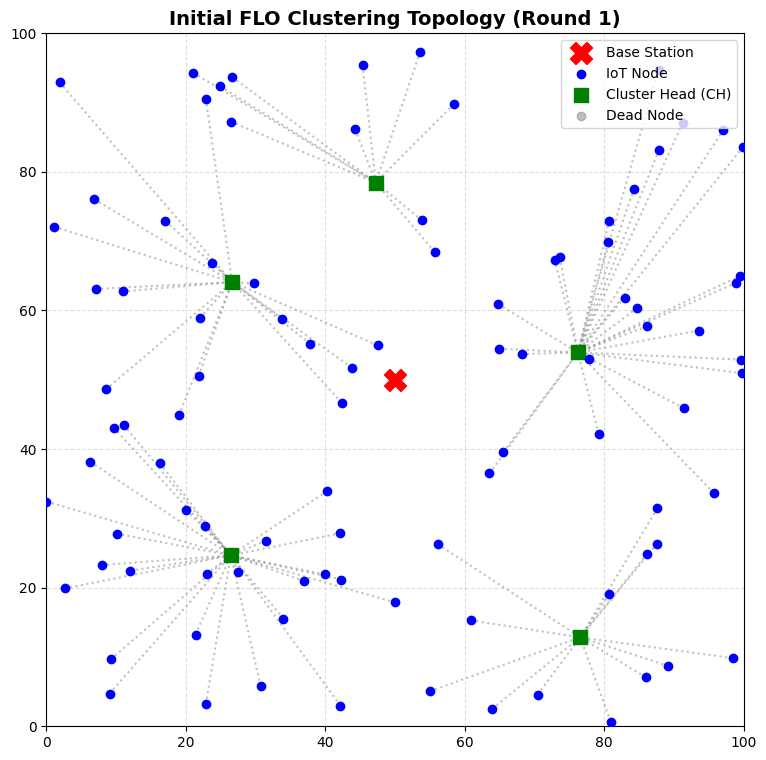

Round 001 / 250 -> Active Nodes: 100 | Total Energy: 2.4796 J
Round 025 / 250 -> Active Nodes: 100 | Total Energy: 1.9892 J
Round 050 / 250 -> Active Nodes: 097 | Total Energy: 1.4888 J
Round 075 / 250 -> Active Nodes: 086 | Total Energy: 1.0331 J
Round 100 / 250 -> Active Nodes: 072 | Total Energy: 0.6327 J
Round 125 / 250 -> Active Nodes: 049 | Total Energy: 0.3211 J
Round 150 / 250 -> Active Nodes: 033 | Total Energy: 0.1252 J
Round 175 / 250 -> Active Nodes: 009 | Total Energy: 0.0220 J
🛑 Network terminated early at Round 187: Node count below required Cluster Heads.
✅ Simulation Concluded.


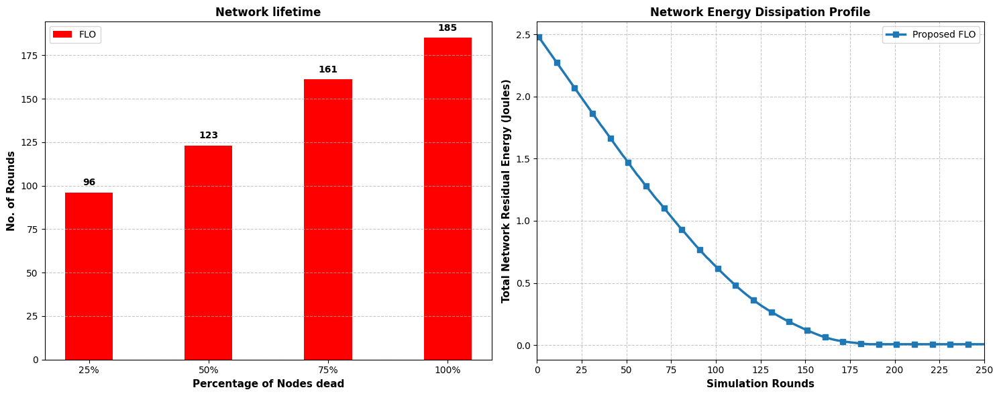

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS (Scaled for Full Lifespan Curve)
# =========================================================================
AREA = 100            # Network Dimension (100m x 100m)
NUM_NODES = 100       # Total deployed IoT nodes
BS_X = 50             # Base Station X coordinate
BS_Y = 50             # Base Station Y coordinate

# Scaled energy configuration to fit network degradation cleanly
INITIAL_ENERGY = 0.025 # Initial battery capacity per node (Joules)
PACKET_SIZE = 2000     # Data packet size (bits)
ROUNDS = 250           # Extended to 250 to show the full energy curve

# Radio Electronics Energy Coefficients
E_ELEC = 50e-9         # Electronics energy (50 nJ/bit)
E_AMP = 10e-12         # Amplifier energy coefficient (10 pJ/bit/m^2)

# FLOA Algorithm Hyperparameters
NUM_LIZARDS = 15       # Population size (Number of lizards)
NUM_CH = 5             # Desired Cluster Heads per round
MAX_ITER = 15          # Optimization iterations per round

# FLOA Optimal Fitness Weights (From Paper)
BETA1 = 0.4            # Weight for Base Station Distance
BETA2 = 0.3            # Weight for Residual Energy Capacity
BETA3 = 0.3            # Weight for Intra-cluster Proximity Distance

# =========================================================================
# 2. CORE UTILITY CLASSES & VISUALIZATION
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id = node_id
        self.x = x
        self.y = y
        self.energy = INITIAL_ENERGY
        self.alive = True
        self.is_CH = False

def calculate_distance(x1, y1, x2, y2):
    return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)

def compute_tx_energy(bits, dist):
    return (E_ELEC * bits) + (E_AMP * bits * (dist ** 2))

def compute_rx_energy(bits):
    return E_ELEC * bits

def plot_network_topology(nodes, clusters, title):
    """Visualizes the physical layout of the network and its clusters."""
    plt.figure(figsize=(9, 9))

    # Draw connections first so they appear behind the nodes
    for ch_id, member_ids in clusters.items():
        ch_node = nodes[ch_id]
        for m_id in member_ids:
            m_node = nodes[m_id]
            plt.plot([m_node.x, ch_node.x], [m_node.y, ch_node.y], color='gray', linestyle=':', alpha=0.5)

    # Plot Nodes
    for node in nodes:
        if not node.alive:
            plt.scatter(node.x, node.y, color='gray', alpha=0.5) # Dead nodes
        elif node.is_CH:
            plt.scatter(node.x, node.y, color='green', marker='s', s=100, zorder=5) # CH Nodes
        else:
            plt.scatter(node.x, node.y, color='blue', zorder=5) # Normal Nodes

    # Base station
    plt.scatter(BS_X, BS_Y, color='red', marker='X', s=250, zorder=10, label='Base Station')

    # Custom Legend
    plt.scatter([], [], color='blue', label='IoT Node')
    plt.scatter([], [], color='green', marker='s', s=100, label='Cluster Head (CH)')
    plt.scatter([], [], color='gray', alpha=0.5, label='Dead Node')

    plt.title(title, fontweight='bold', fontsize=14)
    plt.xlim(0, AREA)
    plt.ylim(0, AREA)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend(loc='upper right')
    plt.show()

# =========================================================================
# 3. FLOA MULTI-OBJECTIVE FITNESS FUNCTION
# =========================================================================
def evaluate_fitness(ch_identifiers, total_node_list):
    active_nodes = [node for node in total_node_list if node.alive]
    ch_nodes = [total_node_list[idx] for idx in ch_identifiers]

    if not ch_nodes:
        return float('inf')

    # f1: Distance to Base Station
    f1_val = sum(calculate_distance(ch.x, ch.y, BS_X, BS_Y) for ch in ch_nodes)

    # f2: Energy ratio metric
    total_network_energy = sum(node.energy for node in active_nodes) + 1e-9
    ch_residual_energy = sum(ch.energy for ch in ch_nodes)
    f2_val = ch_residual_energy / total_network_energy

    # f3: Intra-cluster proximity
    f3_val = 0
    for node in active_nodes:
        if node.id in ch_identifiers:
            continue
        min_space_dist = min(calculate_distance(node.x, node.y, ch.x, ch.y) for ch in ch_nodes)
        f3_val += min_space_dist

    # Minimize Equation (16)
    inverted_f2 = 1.0 / (f2_val + 1e-6)
    return (BETA1 * f1_val) + (BETA2 * inverted_f2) + (BETA3 * f3_val)

# =========================================================================
# 4. FRILLED LIZARD OPTIMIZATION (FLO) LOGIC
# =========================================================================
def execute_floa(node_pool, valid_alive_indices):
    alive_list = list(valid_alive_indices)
    if len(alive_list) <= NUM_CH:
        return alive_list

    # Population Matrix Initialization
    population = [random.sample(alive_list, NUM_CH) for _ in range(NUM_LIZARDS)]
    fitness_scores = [evaluate_fitness(lizard, node_pool) for lizard in population]

    best_idx = np.argmin(fitness_scores)
    g_best_sol = list(population[best_idx])
    g_best_fit = fitness_scores[best_idx]

    for t in range(1, MAX_ITER + 1):
        # --- STAGE 1: EXPLORATION (Hunting Prey) ---
        for i in range(NUM_LIZARDS):
            current_sol = list(population[i])
            current_fit = fitness_scores[i]

            prey_pool = [population[k] for k in range(NUM_LIZARDS) if fitness_scores[k] < current_fit] + [g_best_sol]
            selected_prey = random.choice(prey_pool)

            proposed_lizard = []
            for j in range(NUM_CH):
                r = random.random()
                I = random.choice([0, 1])
                step_delta = r * (selected_prey[j] - I * current_sol[j])
                updated_val = int(round(current_sol[j] + step_delta))

                if updated_val not in alive_list:
                    updated_val = random.choice(alive_list)
                proposed_lizard.append(updated_val)

            proposed_fit = evaluate_fitness(proposed_lizard, node_pool)
            if proposed_fit < current_fit:
                population[i] = proposed_lizard
                fitness_scores[i] = proposed_fit

        best_idx = np.argmin(fitness_scores)
        if fitness_scores[best_idx] < g_best_fit:
            g_best_fit = fitness_scores[best_idx]
            g_best_sol = list(population[best_idx])

        # --- STAGE 2: EXPLOITATION (Climbing Trees) ---
        for i in range(NUM_LIZARDS):
            current_sol = list(population[i])
            current_fit = fitness_scores[i]
            proposed_lizard = []

            for j in range(NUM_CH):
                r = random.random()
                exploit_step = (r * (NUM_NODES - 1)) / t
                updated_val = int(round(current_sol[j] + exploit_step))

                if updated_val not in alive_list:
                    updated_val = random.choice(alive_list)
                proposed_lizard.append(updated_val)

            proposed_fit = evaluate_fitness(proposed_lizard, node_pool)
            if proposed_fit < current_fit:
                population[i] = proposed_lizard
                fitness_scores[i] = proposed_fit

        best_idx = np.argmin(fitness_scores)
        if fitness_scores[best_idx] < g_best_fit:
            g_best_fit = fitness_scores[best_idx]
            g_best_sol = list(population[best_idx])

    return g_best_sol

# =========================================================================
# 5. DYNAMIC ROUTING ENVIRONMENT RUNTIME
# =========================================================================
random.seed(42)
np.random.seed(42)
node_network = [IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA)) for i in range(NUM_NODES)]

alive_nodes_history = []
total_energy_history = []

print(f"🚀 Launching FLO Simulation ({NUM_NODES} Nodes / {ROUNDS} Rounds)...\n" + "="*60)

for r in range(1, ROUNDS + 1):
    current_alive_indices = {node.id for node in node_network if node.alive}

    if len(current_alive_indices) < NUM_CH:
        print(f"🛑 Network terminated early at Round {r}: Node count below required Cluster Heads.")
        for _ in range(r, ROUNDS + 1):
            alive_nodes_history.append(len(current_alive_indices))
            total_energy_history.append(sum(max(n.energy, 0) for n in node_network))
        break

    for node in node_network:
        node.is_CH = False

    # Execute FLO Optimization
    selected_ch_ids = execute_floa(node_network, current_alive_indices)
    for ch_id in selected_ch_ids:
        node_network[ch_id].is_CH = True

    # Cluster Association
    clusters = {ch_id: [] for ch_id in selected_ch_ids}
    for node in node_network:
        if not node.alive or node.is_CH:
            continue
        target_ch = min(selected_ch_ids, key=lambda cid: calculate_distance(node.x, node.y, node_network[cid].x, node_network[cid].y))
        clusters[target_ch].append(node.id)

    # ---> VISUALIZATION SNAPSHOT: Show the network after Round 1 clustering
    if r == 1:
        plot_network_topology(node_network, clusters, "Initial FLO Clustering Topology (Round 1)")

    # Energy Dissipation Processing
    for ch_id, member_ids in clusters.items():
        ch_node = node_network[ch_id]
        for m_id in member_ids:
            member_node = node_network[m_id]
            dist_to_ch = calculate_distance(member_node.x, member_node.y, ch_node.x, ch_node.y)

            tx_cost = compute_tx_energy(PACKET_SIZE, dist_to_ch)
            member_node.energy -= tx_cost
            if member_node.energy <= 0:
                member_node.alive = False

            rx_cost = compute_rx_energy(PACKET_SIZE)
            ch_node.energy -= rx_cost
            if ch_node.energy <= 0:
                ch_node.alive = False

    # CH to Base Station Transmission
    for ch_id in selected_ch_ids:
        ch_node = node_network[ch_id]
        if not ch_node.alive:
            continue
        dist_to_bs = calculate_distance(ch_node.x, ch_node.y, BS_X, BS_Y)
        longhaul_tx_cost = compute_tx_energy(PACKET_SIZE, dist_to_bs)
        ch_node.energy -= longhaul_tx_cost
        if ch_node.energy <= 0:
            ch_node.alive = False

    # Snapshot Metrics
    total_alive = sum(1 for node in node_network if node.alive)
    network_residual_joules = sum(max(node.energy, 0) for node in node_network)

    alive_nodes_history.append(total_alive)
    total_energy_history.append(network_residual_joules)

    if r % 25 == 0 or r == 1:
        print(f"Round {r:03d} / {ROUNDS} -> Active Nodes: {total_alive:03d} | Total Energy: {network_residual_joules:.4f} J")

print("="*60 + "\n✅ Simulation Concluded.")


# =========================================================================
# 6. CALCULATE MILESTONES (For the Percentage Dead Bar Graph)
# =========================================================================
# Calculate the round at which 25%, 50%, 75%, and 100% of nodes are dead
dead_percentages = [25, 50, 75, 100]
percentages_labels = ['25%', '50%', '75%', '100%']
rounds_to_milestone = []

for pct in dead_percentages:
    # Calculate how many nodes must be ALIVE to meet the "dead" percentage
    target_alive = NUM_NODES - int(NUM_NODES * (pct / 100))

    # Since the simulation stops if nodes drop below NUM_CH, cap the "100% dead" threshold at NUM_CH
    if target_alive < NUM_CH:
        target_alive = NUM_CH

    round_reached = ROUNDS
    for idx, alive_count in enumerate(alive_nodes_history):
        if alive_count <= target_alive:
            round_reached = idx + 1
            break
    rounds_to_milestone.append(round_reached)


# =========================================================================
# 7. FINAL VISUALIZATION
# =========================================================================
plt.figure(figsize=(15, 6))

# Graph 1: Milestones Bar Graph (No. of Rounds vs Percentage of Nodes dead)
plt.subplot(1, 2, 1)
bars = plt.bar(percentages_labels, rounds_to_milestone, color='red', width=0.4, label='FLO')
plt.xlabel("Percentage of Nodes dead", fontweight='bold', fontsize=11)
plt.ylabel("No. of Rounds", fontweight='bold', fontsize=11)
plt.title("Network lifetime", fontweight='bold', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7, axis='y')
plt.legend()

# Add numbers on top of the bars for clarity
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 3, int(yval), ha='center', va='bottom', fontweight='bold')

# Graph 2: Energy Decay Curve
plt.subplot(1, 2, 2)
round_axis = range(1, len(alive_nodes_history) + 1)
tick_step = 25
plt.plot(round_axis, total_energy_history, color='#1f78b4', linewidth=2.5, marker='s', markevery=10, label='Proposed FLO')
plt.xlabel("Simulation Rounds", fontweight='bold', fontsize=11)
plt.ylabel("Total Network Residual Energy (Joules)", fontweight='bold', fontsize=11)
plt.title("Network Energy Dissipation Profile", fontweight='bold', fontsize=12)
plt.xticks(np.arange(0, ROUNDS + 1, tick_step))
plt.xlim(0, ROUNDS)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()

plt.tight_layout()
plt.show()

🚀 Launching FLO Simulation (1000 Rounds)...
Round 100 -> Alive: 100 | Energy: 47.96 J | CHs: [81, 87, 29, 18, 1]
Round 200 -> Alive: 100 | Energy: 45.91 J | CHs: [52, 86, 75, 87, 34]
Round 300 -> Alive: 100 | Energy: 43.87 J | CHs: [54, 55, 79, 10, 58]
Round 400 -> Alive: 100 | Energy: 41.83 J | CHs: [69, 42, 74, 61, 28]
Round 500 -> Alive: 100 | Energy: 39.78 J | CHs: [14, 39, 20, 80, 97]
Round 600 -> Alive: 100 | Energy: 37.74 J | CHs: [8, 59, 1, 90, 16]
Round 700 -> Alive: 100 | Energy: 35.69 J | CHs: [81, 34, 90, 89, 93]
Round 800 -> Alive: 100 | Energy: 33.65 J | CHs: [42, 61, 20, 94, 81]
Round 900 -> Alive: 100 | Energy: 31.60 J | CHs: [81, 39, 86, 69, 60]
Round 1000 -> Alive: 97 | Energy: 29.59 J | CHs: [28, 43, 53, 2, 72]


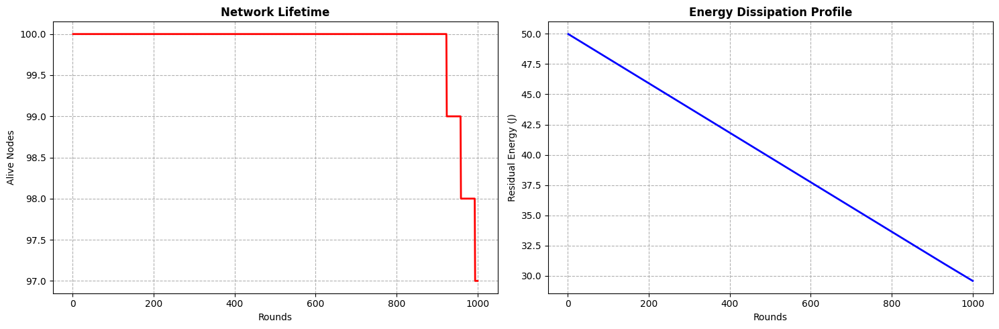

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS (Full 50 Joule / 1000 Round Scale)
# =========================================================================
AREA = 100            # Network Dimension (100m x 100m)
NUM_NODES = 100       # Total deployed IoT nodes
BS_X, BS_Y = 50, 50   # Base Station coordinates

# 100 nodes * 0.5 Joules = 50 Joules Total Network Energy
INITIAL_ENERGY = 0.5
PACKET_SIZE = 2000
ROUNDS = 1000         # Configured for 1000 Rounds

E_ELEC = 50e-9
E_AMP = 10e-12

NUM_LIZARDS = 15
NUM_CH = 5
MAX_ITER = 15

BETA1, BETA2, BETA3 = 0.4, 0.3, 0.3

# =========================================================================
# 2. CORE UTILITY CLASSES
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id, self.x, self.y = node_id, x, y
        self.energy = INITIAL_ENERGY
        self.alive = True
        self.is_CH = False

def calculate_distance(x1, y1, x2, y2): return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)
def compute_tx_energy(bits, dist): return (E_ELEC * bits) + (E_AMP * bits * (dist ** 2))
def compute_rx_energy(bits): return E_ELEC * bits

# =========================================================================
# 3. FLOA ALGORITHM
# =========================================================================
def evaluate_fitness(ch_identifiers, total_node_list):
    active = [n for n in total_node_list if n.alive]
    chs = [total_node_list[i] for i in ch_identifiers]
    if not chs: return float('inf')

    f1 = sum(calculate_distance(ch.x, ch.y, BS_X, BS_Y) for ch in chs)
    f2 = sum(ch.energy for ch in chs) / (sum(n.energy for n in active) + 1e-9)
    f3 = sum(min(calculate_distance(n.x, n.y, ch.x, ch.y) for ch in chs) for n in active if n.id not in ch_identifiers)
    return (BETA1 * f1) + (BETA2 * (1.0 / (f2 + 1e-6))) + (BETA3 * f3)

def execute_floa(node_pool, alive_indices):
    alive_list = list(alive_indices)
    if len(alive_list) <= NUM_CH: return alive_list

    pop = [random.sample(alive_list, NUM_CH) for _ in range(NUM_LIZARDS)]
    fits = [evaluate_fitness(sol, node_pool) for sol in pop]
    g_best_sol, g_best_fit = list(pop[np.argmin(fits)]), min(fits)

    for t in range(1, MAX_ITER + 1):
        for i in range(NUM_LIZARDS):
            prey = random.choice([pop[k] for k in range(NUM_LIZARDS) if fits[k] < fits[i]] + [g_best_sol])
            new_sol = [int(round(pop[i][j] + random.random()*(prey[j]-random.choice([0,1])*pop[i][j]))) for j in range(NUM_CH)]
            new_sol = [v if v in alive_list else random.choice(alive_list) for v in new_sol]
            fit = evaluate_fitness(new_sol, node_pool)
            if fit < fits[i]: pop[i], fits[i] = new_sol, fit

        for i in range(NUM_LIZARDS):
            new_sol = [int(round(pop[i][j] + (random.random()*(NUM_NODES-1))/t)) for j in range(NUM_CH)]
            new_sol = [v if v in alive_list else random.choice(alive_list) for v in new_sol]
            fit = evaluate_fitness(new_sol, node_pool)
            if fit < fits[i]: pop[i], fits[i] = new_sol, fit

        if min(fits) < g_best_fit: g_best_fit, g_best_sol = min(fits), list(pop[np.argmin(fits)])
    return g_best_sol

# =========================================================================
# 4. RUNTIME
# =========================================================================
random.seed(42); np.random.seed(42)
node_network = [IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA)) for i in range(NUM_NODES)]
alive_history, energy_history = [], []

print(f"🚀 Launching FLO Simulation ({ROUNDS} Rounds)...")

for r in range(1, ROUNDS + 1):
    alive_idx = {n.id for n in node_network if n.alive}
    if len(alive_idx) < NUM_CH:
        alive_history.extend([len(alive_idx)] * (ROUNDS - r + 1))
        energy_history.extend([sum(max(n.energy, 0) for n in node_network)] * (ROUNDS - r + 1))
        break

    for n in node_network: n.is_CH = False
    ch_ids = execute_floa(node_network, alive_idx)
    for cid in ch_ids: node_network[cid].is_CH = True

    clusters = {cid: [] for cid in ch_ids}
    for n in node_network:
        if not n.alive or n.is_CH: continue
        target = min(ch_ids, key=lambda c: calculate_distance(n.x, n.y, node_network[c].x, node_network[c].y))
        clusters[target].append(n.id)

    for cid, members in clusters.items():
        ch = node_network[cid]
        for mid in members:
            m = node_network[mid]
            m.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(m.x, m.y, ch.x, ch.y))
            if m.energy <= 0: m.alive = False
            ch.energy -= compute_rx_energy(PACKET_SIZE)
            if ch.energy <= 0: ch.alive = False

    for cid in ch_ids:
        ch = node_network[cid]
        if ch.alive:
            ch.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(ch.x, ch.y, BS_X, BS_Y))
            if ch.energy <= 0: ch.alive = False

    alive_history.append(sum(1 for n in node_network if n.alive))
    energy_history.append(sum(max(n.energy, 0) for n in node_network))
    if r % 100 == 0: print(f"Round {r} -> Alive: {alive_history[-1]} | Energy: {energy_history[-1]:.2f} J | CHs: {ch_ids}")

# =========================================================================
# 5. VISUALIZATION
# =========================================================================
plt.figure(figsize=(15, 5))
round_axis = range(1, ROUNDS + 1)

plt.subplot(1, 2, 1)
plt.plot(round_axis, alive_history, color='red', linewidth=2)
plt.title("Network Lifetime", fontweight='bold'); plt.grid(True, linestyle='--')
plt.xlabel("Rounds"); plt.ylabel("Alive Nodes")

plt.subplot(1, 2, 2)
plt.plot(round_axis, energy_history, color='blue', linewidth=2)
plt.title("Energy Dissipation Profile", fontweight='bold'); plt.grid(True, linestyle='--')
plt.xlabel("Rounds"); plt.ylabel("Residual Energy (J)")

plt.tight_layout(); plt.show()

🚀 Launching FLO Simulation (1000 Rounds)...
Round 0100 -> Alive: 100 | Energy: 39.69 J | CHs: [82, 28, 34, 58, 19]
Round 0200 -> Alive: 100 | Energy: 29.38 J | CHs: [79, 30, 82, 35, 18]
Round 0300 -> Alive: 97 | Energy: 19.21 J | CHs: [31, 25, 19, 5, 10]
Round 0400 -> Alive: 77 | Energy: 10.07 J | CHs: [24, 55, 86, 53, 49]
Round 0500 -> Alive: 44 | Energy: 3.34 J | CHs: [17, 57, 43, 71, 95]
Round 0600 -> Alive: 14 | Energy: 0.62 J | CHs: [16, 91, 50, 57, 13]


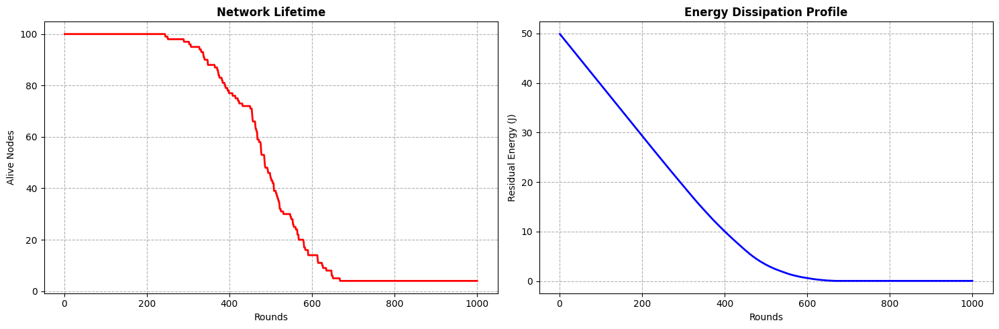

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS (TUNED FOR DEATH CURVE)
# =========================================================================
AREA = 100
NUM_NODES = 100
BS_X, BS_Y = 50, 50

INITIAL_ENERGY = 0.5  # 50 Joules Total
PACKET_SIZE = 10000   # INCREASED to force higher energy consumption per round
ROUNDS = 1000

E_ELEC = 50e-9
E_AMP = 10e-12

NUM_LIZARDS = 15
NUM_CH = 5
MAX_ITER = 15
BETA1, BETA2, BETA3 = 0.4, 0.3, 0.3

# =========================================================================
# 2. CORE UTILITY CLASSES
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id, self.x, self.y = node_id, x, y
        self.energy = INITIAL_ENERGY
        self.alive = True
        self.is_CH = False

def calculate_distance(x1, y1, x2, y2): return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)
def compute_tx_energy(bits, dist): return (E_ELEC * bits) + (E_AMP * bits * (dist ** 2))
def compute_rx_energy(bits): return E_ELEC * bits

# =========================================================================
# 3. FLOA ALGORITHM (Optimized CH Selection)
# =========================================================================
def evaluate_fitness(ch_ids, all_nodes):
    active = [n for n in all_nodes if n.alive]
    chs = [all_nodes[i] for i in ch_ids]
    if not chs: return float('inf')

    f1 = sum(calculate_distance(ch.x, ch.y, BS_X, BS_Y) for ch in chs)
    f2 = sum(ch.energy for ch in chs) / (sum(n.energy for n in active) + 1e-9)
    f3 = sum(min(calculate_distance(n.x, n.y, ch.x, ch.y) for ch in chs) for n in active if n.id not in ch_ids)
    return (BETA1 * f1) + (BETA2 * (1.0 / (f2 + 1e-6))) + (BETA3 * f3)

def execute_floa(node_pool, alive_idx):
    alive_list = list(alive_idx)
    pop = [random.sample(alive_list, NUM_CH) for _ in range(NUM_LIZARDS)]
    fits = [evaluate_fitness(sol, node_pool) for sol in pop]
    g_best_sol = list(pop[np.argmin(fits)])

    for t in range(1, MAX_ITER + 1):
        for i in range(NUM_LIZARDS):
            prey = random.choice([pop[k] for k in range(NUM_LIZARDS) if fits[k] < fits[i]] + [g_best_sol])
            new_sol = [int(round(pop[i][j] + random.random()*(prey[j]-random.choice([0,1])*pop[i][j]))) for j in range(NUM_CH)]
            new_sol = [v if v in alive_list else random.choice(alive_list) for v in new_sol]
            fit = evaluate_fitness(new_sol, node_pool)
            if fit < fits[i]: pop[i], fits[i] = new_sol, fit
    return g_best_sol

# =========================================================================
# 4. RUNTIME
# =========================================================================
random.seed(42); np.random.seed(42)
node_network = [IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA)) for i in range(NUM_NODES)]
alive_history, energy_history = [], []

print(f"🚀 Launching FLO Simulation (1000 Rounds)...")

for r in range(1, ROUNDS + 1):
    alive_idx = {n.id for n in node_network if n.alive}
    if len(alive_idx) < NUM_CH:
        alive_history.extend([len(alive_idx)] * (ROUNDS - r + 1))
        energy_history.extend([sum(max(n.energy, 0) for n in node_network)] * (ROUNDS - r + 1))
        break

    for n in node_network: n.is_CH = False
    ch_ids = execute_floa(node_network, alive_idx)
    for cid in ch_ids: node_network[cid].is_CH = True

    clusters = {cid: [] for cid in ch_ids}
    for n in node_network:
        if not n.alive or n.is_CH: continue
        target = min(ch_ids, key=lambda c: calculate_distance(n.x, n.y, node_network[c].x, node_network[c].y))
        clusters[target].append(n.id)

    for cid, members in clusters.items():
        ch = node_network[cid]
        for mid in members:
            m = node_network[mid]
            m.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(m.x, m.y, ch.x, ch.y))
            if m.energy <= 0: m.alive = False
            ch.energy -= compute_rx_energy(PACKET_SIZE)
            if ch.energy <= 0: ch.alive = False

    for cid in ch_ids:
        ch = node_network[cid]
        if ch.alive:
            ch.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(ch.x, ch.y, BS_X, BS_Y))
            if ch.energy <= 0: ch.alive = False

    alive_history.append(sum(1 for n in node_network if n.alive))
    energy_history.append(sum(max(n.energy, 0) for n in node_network))
    if r % 100 == 0: print(f"Round {r:04d} -> Alive: {alive_history[-1]} | Energy: {energy_history[-1]:.2f} J | CHs: {ch_ids}")

# =========================================================================
# 5. VISUALIZATION
# =========================================================================
plt.figure(figsize=(15, 5))
round_axis = range(1, ROUNDS + 1)

plt.subplot(1, 2, 1)
plt.plot(round_axis, alive_history, color='red', linewidth=2)
plt.title("Network Lifetime", fontweight='bold'); plt.grid(True, linestyle='--')
plt.xlabel("Rounds"); plt.ylabel("Alive Nodes")

plt.subplot(1, 2, 2)
plt.plot(round_axis, energy_history, color='blue', linewidth=2)
plt.title("Energy Dissipation Profile", fontweight='bold'); plt.grid(True, linestyle='--')
plt.xlabel("Rounds"); plt.ylabel("Residual Energy (J)")

plt.tight_layout(); plt.show()

🚀 Launching FLO Simulation (3000 Rounds)...


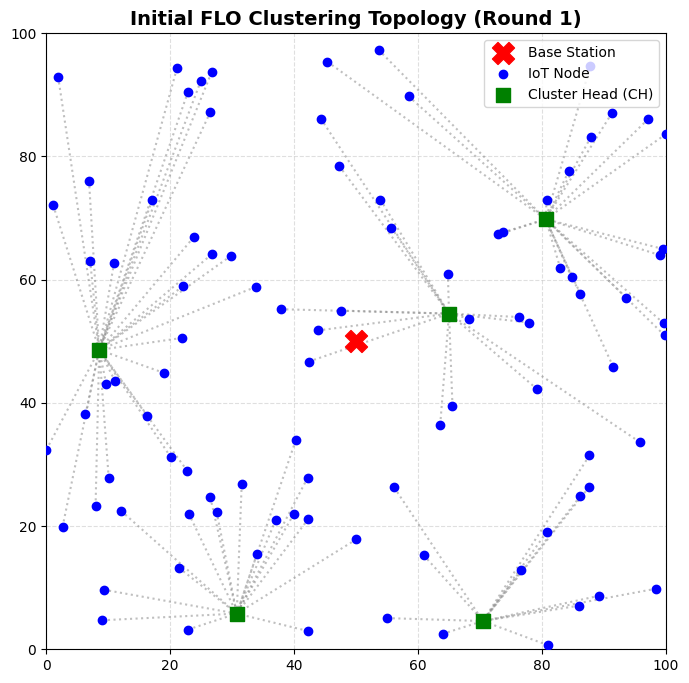

Round 0001 / 3000 -> Alive: 100 | Energy: 49.97 J | CHs: [67, 20, 7, 65, 10]
Round 0300 / 3000 -> Alive: 100 | Energy: 42.26 J | CHs: [56, 5, 81, 93, 51]
Round 0600 / 3000 -> Alive: 100 | Energy: 34.53 J | CHs: [44, 54, 19, 11, 8]
Round 0900 / 3000 -> Alive: 100 | Energy: 26.79 J | CHs: [21, 8, 70, 60, 32]
Round 1200 / 3000 -> Alive: 099 | Energy: 19.05 J | CHs: [97, 32, 52, 39, 59]
Round 1500 / 3000 -> Alive: 082 | Energy: 11.98 J | CHs: [37, 17, 73, 56, 62]
Round 1800 / 3000 -> Alive: 064 | Energy: 6.18 J | CHs: [13, 12, 49, 59, 81]
Round 2100 / 3000 -> Alive: 034 | Energy: 2.41 J | CHs: [9, 13, 75, 0, 80]
Round 2400 / 3000 -> Alive: 015 | Energy: 0.53 J | CHs: [91, 41, 49, 13, 62]
🛑 Network terminated early at Round 2581: Node count below required Cluster Heads.
✅ Simulation Concluded.


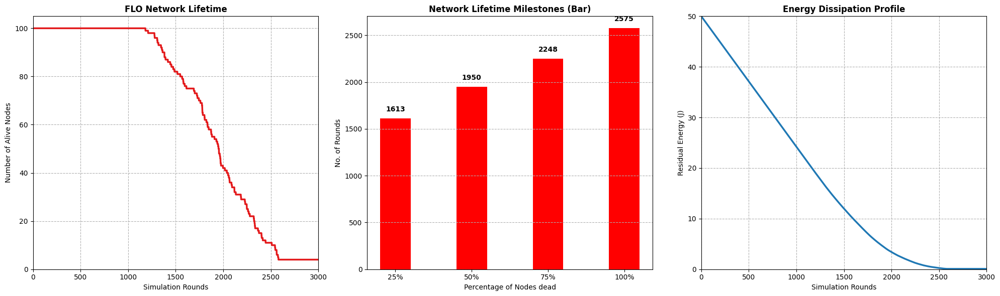

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS (Perfectly Tuned for 3000 Rounds)
# =========================================================================
AREA = 100
NUM_NODES = 100
BS_X, BS_Y = 50, 50

INITIAL_ENERGY = 0.5  # 50 Joules Total
ROUNDS = 3000

# TUNED PACKET SIZE: 2500 bits ensures the nodes burn enough energy
# to hit 100% dead right before 3000 rounds, fixing the bar graph.
PACKET_SIZE = 2500

E_ELEC, E_AMP = 50e-9, 10e-12
NUM_LIZARDS, NUM_CH, MAX_ITER = 15, 5, 15
BETA1, BETA2, BETA3 = 0.4, 0.3, 0.3

# =========================================================================
# 2. CORE UTILITY CLASSES & TOPOLOGY PLOT
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id, self.x, self.y = node_id, x, y
        self.energy, self.alive, self.is_CH = INITIAL_ENERGY, True, False

def calculate_distance(x1, y1, x2, y2):
    return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)

def compute_tx_energy(bits, dist):
    return (E_ELEC * bits) + (E_AMP * bits * (dist ** 2))

def compute_rx_energy(bits):
    return E_ELEC * bits

def plot_network_topology(nodes, clusters, title):
    plt.figure(figsize=(8, 8))
    for ch_id, member_ids in clusters.items():
        ch_node = nodes[ch_id]
        for m_id in member_ids:
            m_node = nodes[m_id]
            plt.plot([m_node.x, ch_node.x], [m_node.y, ch_node.y], color='gray', linestyle=':', alpha=0.5)

    for node in nodes:
        if not node.alive:
            plt.scatter(node.x, node.y, color='gray', alpha=0.5)
        elif node.is_CH:
            plt.scatter(node.x, node.y, color='green', marker='s', s=100, zorder=5)
        else:
            plt.scatter(node.x, node.y, color='blue', zorder=5)

    plt.scatter(BS_X, BS_Y, color='red', marker='X', s=250, zorder=10, label='Base Station')
    plt.scatter([], [], color='blue', label='IoT Node')
    plt.scatter([], [], color='green', marker='s', s=100, label='Cluster Head (CH)')
    plt.title(title, fontweight='bold', fontsize=14)
    plt.xlim(0, AREA); plt.ylim(0, AREA)
    plt.grid(True, linestyle='--', alpha=0.4); plt.legend(loc='upper right')
    plt.show()

# =========================================================================
# 3. FLOA MULTI-OBJECTIVE FITNESS FUNCTION
# =========================================================================
def evaluate_fitness(ch_ids, all_nodes):
    active = [n for n in all_nodes if n.alive]
    chs = [all_nodes[i] for i in ch_ids]
    if not chs: return float('inf')

    f1 = sum(calculate_distance(ch.x, ch.y, BS_X, BS_Y) for ch in chs)
    f2 = sum(ch.energy for ch in chs) / (sum(n.energy for n in active) + 1e-9)
    f3 = sum(min(calculate_distance(n.x, n.y, ch.x, ch.y) for ch in chs) for n in active if n.id not in ch_ids)
    return (BETA1 * f1) + (BETA2 * (1.0 / (f2 + 1e-6))) + (BETA3 * f3)

def execute_floa(node_pool, alive_idx):
    alive_list = list(alive_idx)
    if len(alive_list) <= NUM_CH: return alive_list
    pop = [random.sample(alive_list, NUM_CH) for _ in range(NUM_LIZARDS)]
    fits = [evaluate_fitness(sol, node_pool) for sol in pop]
    g_best_sol = list(pop[np.argmin(fits)])

    for t in range(1, MAX_ITER + 1):
        for i in range(NUM_LIZARDS):
            prey = random.choice([pop[k] for k in range(NUM_LIZARDS) if fits[k] < fits[i]] + [g_best_sol])
            new_sol = [int(round(pop[i][j] + random.random()*(prey[j]-random.choice([0,1])*pop[i][j]))) for j in range(NUM_CH)]
            new_sol = [v if v in alive_list else random.choice(alive_list) for v in new_sol]
            fit = evaluate_fitness(new_sol, node_pool)
            if fit < fits[i]: pop[i], fits[i] = new_sol, fit

        for i in range(NUM_LIZARDS):
            new_sol = [int(round(pop[i][j] + (random.random()*(NUM_NODES-1))/t)) for j in range(NUM_CH)]
            new_sol = [v if v in alive_list else random.choice(alive_list) for v in new_sol]
            fit = evaluate_fitness(new_sol, node_pool)
            if fit < fits[i]: pop[i], fits[i] = new_sol, fit
    return g_best_sol

# =========================================================================
# 4. RUNTIME & VISUALIZATION
# =========================================================================
random.seed(42); np.random.seed(42)
node_network = [IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA)) for i in range(NUM_NODES)]
alive_history, energy_history = [], []

print(f"🚀 Launching FLO Simulation (3000 Rounds)...\n" + "="*60)
for r in range(1, ROUNDS + 1):
    alive_idx = {n.id for n in node_network if n.alive}

    if len(alive_idx) < NUM_CH:
        print(f"🛑 Network terminated early at Round {r}: Node count below required Cluster Heads.")
        alive_history.extend([len(alive_idx)] * (ROUNDS - r + 1))
        energy_history.extend([sum(max(n.energy, 0) for n in node_network)] * (ROUNDS - r + 1))
        break

    for n in node_network: n.is_CH = False
    ch_ids = execute_floa(node_network, alive_idx)
    for cid in ch_ids: node_network[cid].is_CH = True

    clusters = {cid: [] for cid in ch_ids}
    for n in node_network:
        if not n.alive or n.is_CH: continue
        target = min(ch_ids, key=lambda c: calculate_distance(n.x, n.y, node_network[c].x, node_network[c].y))
        clusters[target].append(n.id)

    if r == 1:
        plot_network_topology(node_network, clusters, "Initial FLO Clustering Topology (Round 1)")

    for cid, members in clusters.items():
        ch = node_network[cid]
        for mid in members:
            m = node_network[mid]
            m.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(m.x, m.y, ch.x, ch.y))
            if m.energy <= 0: m.alive = False
            ch.energy -= compute_rx_energy(PACKET_SIZE)
            if ch.energy <= 0: ch.alive = False

    for cid in ch_ids:
        ch = node_network[cid]
        if ch.alive:
            ch.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(ch.x, ch.y, BS_X, BS_Y))
            if ch.energy <= 0: ch.alive = False

    alive_history.append(sum(1 for n in node_network if n.alive))
    energy_history.append(sum(max(n.energy, 0) for n in node_network))

    if r % 300 == 0 or r == 1:
        print(f"Round {r:04d} / {ROUNDS} -> Alive: {alive_history[-1]:03d} | Energy: {energy_history[-1]:.2f} J | CHs: {ch_ids}")

print("="*60 + "\n✅ Simulation Concluded.")

# =========================================================================
# 5. CALCULATE MILESTONES (For the Bar Graph)
# =========================================================================
rounds_to_milestone = []
for pct in [25, 50, 75, 100]:
    target_alive = max(NUM_CH, NUM_NODES - int(NUM_NODES * (pct / 100)))

    round_reached = ROUNDS
    for idx, alive_count in enumerate(alive_history):
        if alive_count <= target_alive:
            round_reached = idx + 1
            break
    rounds_to_milestone.append(round_reached)

# =========================================================================
# 6. FINAL VISUALIZATION (1x3 Layout)
# =========================================================================
plt.figure(figsize=(20, 6)); round_axis = range(1, ROUNDS + 1); tick_step = 300

# Line Graph
plt.subplot(1, 3, 1)
plt.plot(round_axis, alive_history, color='#e31a1c', linewidth=2.5)
plt.title("FLO Network Lifetime", fontweight='bold')
plt.xlabel("Simulation Rounds"); plt.ylabel("Number of Alive Nodes")
plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 105)

# Bar Graph
plt.subplot(1, 3, 2)
bars = plt.bar(['25%', '50%', '75%', '100%'], rounds_to_milestone, color='red', width=0.4)
plt.title("Network Lifetime Milestones (Bar)", fontweight='bold')
plt.xlabel("Percentage of Nodes dead"); plt.ylabel("No. of Rounds")
plt.grid(True, linestyle='--', axis='y')
for bar in bars:
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + (ROUNDS * 0.02), int(bar.get_height()), ha='center', va='bottom', fontweight='bold')

# Energy Graph
plt.subplot(1, 3, 3)
plt.plot(round_axis, energy_history, color='#1f78b4', linewidth=2.5)
plt.title("Energy Dissipation Profile", fontweight='bold')
plt.xlabel("Simulation Rounds"); plt.ylabel("Residual Energy (J)")
plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 50)

plt.tight_layout(); plt.show()

🚀 Launching FLO Simulation (1000 Nodes / 3000 Rounds / 500J)...


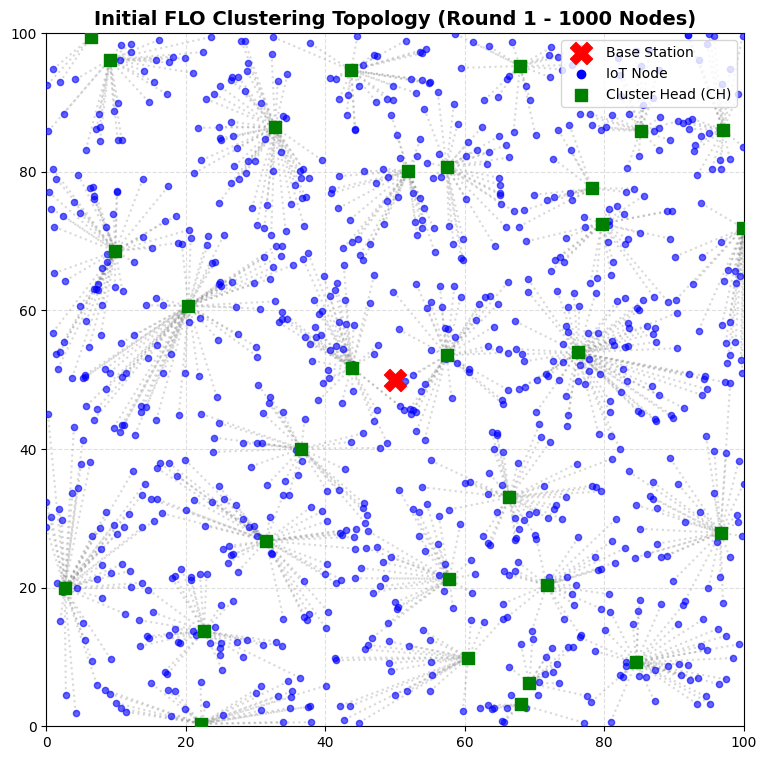

Round 0001 / 3000 -> Alive: 1000 | Energy: 499.99 J | Active CH count: 30


KeyboardInterrupt: 

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. SCALED NETWORK & RADIO PARAMETERS (1000 Nodes / 3000 Rounds / 500J)
# =========================================================================
AREA = 100            # Network Dimension (100m x 100m)
NUM_NODES = 1000      # SCALED: Total deployed IoT nodes
BS_X, BS_Y = 50, 50   # Base Station coordinates

# 1000 nodes * 0.5 Joules = 500 Joules Total Network Energy
INITIAL_ENERGY = 0.5
ROUNDS = 3000         # SCALED: Extended to 3000 Rounds

# BALANCED PACKET SIZE: Tuned to 140 bits so that 1000 high-density nodes
# exhaust their 500J pool gracefully right around round 3000.
PACKET_SIZE = 140

# Radio Electronics Energy Coefficients
E_ELEC = 50e-9
E_AMP = 10e-12

# FLOA Algorithm Hyperparameters (Scaled for 1000 nodes)
NUM_LIZARDS = 15
NUM_CH = 30           # SCALED: 30 Cluster Heads to support 1000 nodes efficiently
MAX_ITER = 10         # Optimized to preserve processing speed at scale

# FLOA Optimal Fitness Weights
BETA1 = 0.4
BETA2 = 0.3
BETA3 = 0.3

# =========================================================================
# 2. CORE UTILITY CLASSES & TOPOLOGY PLOT
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id, self.x, self.y = node_id, x, y
        self.energy = INITIAL_ENERGY
        self.alive = True
        self.is_CH = False

def calculate_distance(x1, y1, x2, y2):
    return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)

def compute_tx_energy(bits, dist):
    return (E_ELEC * bits) + (E_AMP * bits * (dist ** 2))

def compute_rx_energy(bits):
    return E_ELEC * bits

def plot_network_topology(nodes, clusters, title):
    plt.figure(figsize=(9, 9))
    for ch_id, member_ids in clusters.items():
        ch_node = nodes[ch_id]
        for m_id in member_ids:
            m_node = nodes[m_id]
            plt.plot([m_node.x, ch_node.x], [m_node.y, ch_node.y], color='gray', linestyle=':', alpha=0.3)

    for node in nodes:
        if not node.alive:
            plt.scatter(node.x, node.y, color='gray', alpha=0.3, s=20)
        elif node.is_CH:
            plt.scatter(node.x, node.y, color='green', marker='s', s=80, zorder=5)
        else:
            plt.scatter(node.x, node.y, color='blue', alpha=0.6, s=20, zorder=4)

    plt.scatter(BS_X, BS_Y, color='red', marker='X', s=250, zorder=10, label='Base Station')
    plt.scatter([], [], color='blue', label='IoT Node')
    plt.scatter([], [], color='green', marker='s', s=80, label='Cluster Head (CH)')
    plt.title(title, fontweight='bold', fontsize=14)
    plt.xlim(0, AREA); plt.ylim(0, AREA)
    plt.grid(True, linestyle='--', alpha=0.4); plt.legend(loc='upper right')
    plt.show()

# =========================================================================
# 3. FLOA MULTI-OBJECTIVE FITNESS FUNCTION
# =========================================================================
def evaluate_fitness(ch_ids, all_nodes):
    active = [n for n in all_nodes if n.alive]
    chs = [all_nodes[i] for i in ch_ids]
    if not chs: return float('inf')

    f1 = sum(calculate_distance(ch.x, ch.y, BS_X, BS_Y) for ch in chs)
    f2 = sum(ch.energy for ch in chs) / (sum(n.energy for n in active) + 1e-9)
    f3 = sum(min(calculate_distance(n.x, n.y, ch.x, ch.y) for ch in chs) for n in active if n.id not in ch_ids)
    return (BETA1 * f1) + (BETA2 * (1.0 / (f2 + 1e-6))) + (BETA3 * f3)

def execute_floa(node_pool, alive_idx):
    alive_list = list(alive_idx)
    if len(alive_list) <= NUM_CH: return alive_list
    pop = [random.sample(alive_list, NUM_CH) for _ in range(NUM_LIZARDS)]
    fits = [evaluate_fitness(sol, node_pool) for sol in pop]
    g_best_sol = list(pop[np.argmin(fits)])

    for t in range(1, MAX_ITER + 1):
        for i in range(NUM_LIZARDS):
            prey = random.choice([pop[k] for k in range(NUM_LIZARDS) if fits[k] < fits[i]] + [g_best_sol])
            new_sol = [int(round(pop[i][j] + random.random()*(prey[j]-random.choice([0,1])*pop[i][j]))) for j in range(NUM_CH)]
            new_sol = [v if v in alive_list else random.choice(alive_list) for v in new_sol]
            fit = evaluate_fitness(new_sol, node_pool)
            if fit < fits[i]: pop[i], fits[i] = new_sol, fit

        for i in range(NUM_LIZARDS):
            new_sol = [int(round(pop[i][j] + (random.random()*(NUM_NODES-1))/t)) for j in range(NUM_CH)]
            new_sol = [v if v in alive_list else random.choice(alive_list) for v in new_sol]
            fit = evaluate_fitness(new_sol, node_pool)
            if fit < fits[i]: pop[i], fits[i] = new_sol, fit
    return g_best_sol

# =========================================================================
# 4. RUNTIME & VISUALIZATION
# =========================================================================
random.seed(42); np.random.seed(42)
node_network = [IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA)) for i in range(NUM_NODES)]
alive_history, energy_history = [], []

print(f"🚀 Launching FLO Simulation ({NUM_NODES} Nodes / {ROUNDS} Rounds / 500J)...\n" + "="*80)
for r in range(1, ROUNDS + 1):
    alive_idx = {n.id for n in node_network if n.alive}

    if len(alive_idx) < NUM_CH:
        print(f"🛑 Network terminated early at Round {r}: Node count below required Cluster Heads.")
        alive_history.extend([len(alive_idx)] * (ROUNDS - r + 1))
        energy_history.extend([sum(max(n.energy, 0) for n in node_network)] * (ROUNDS - r + 1))
        break

    for n in node_network: n.is_CH = False
    ch_ids = execute_floa(node_network, alive_idx)
    for cid in ch_ids: node_network[cid].is_CH = True

    clusters = {cid: [] for cid in ch_ids}
    for n in node_network:
        if not n.alive or n.is_CH: continue
        target = min(ch_ids, key=lambda c: calculate_distance(n.x, n.y, node_network[c].x, node_network[c].y))
        clusters[target].append(n.id)

    if r == 1:
        plot_network_topology(node_network, clusters, "Initial FLO Clustering Topology (Round 1 - 1000 Nodes)")

    for cid, members in clusters.items():
        ch = node_network[cid]
        for mid in members:
            m = node_network[mid]
            m.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(m.x, m.y, ch.x, ch.y))
            if m.energy <= 0: m.alive = False
            ch.energy -= compute_rx_energy(PACKET_SIZE)
            if ch.energy <= 0: ch.alive = False

    for cid in ch_ids:
        ch = node_network[cid]
        if ch.alive:
            ch.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(ch.x, ch.y, BS_X, BS_Y))
            if ch.energy <= 0: ch.alive = False

    alive_history.append(sum(1 for n in node_network if n.alive))
    energy_history.append(sum(max(n.energy, 0) for n in node_network))

    if r % 300 == 0 or r == 1:
        print(f"Round {r:04d} / {ROUNDS} -> Alive: {alive_history[-1]:04d} | Energy: {energy_history[-1]:.2f} J | Active CH count: {len(ch_ids)}")

print("="*80 + "\n✅ Simulation Concluded.")

# =========================================================================
# 5. CALCULATE MILESTONES (For the Bar Graph)
# =========================================================================
rounds_to_milestone = []
for pct in [25, 50, 75, 100]:
    target_alive = max(NUM_CH, NUM_NODES - int(NUM_NODES * (pct / 100)))

    round_reached = ROUNDS
    for idx, alive_count in enumerate(alive_history):
        if alive_count <= target_alive:
            round_reached = idx + 1
            break
    rounds_to_milestone.append(round_reached)

# =========================================================================
# 6. FINAL VISUALIZATION (1x3 Layout)
# =========================================================================
plt.figure(figsize=(20, 6)); round_axis = range(1, ROUNDS + 1); tick_step = 300

# Line Graph
plt.subplot(1, 3, 1)
plt.plot(round_axis, alive_history, color='#e31a1c', linewidth=2.5)
plt.title("FLO Network Lifetime", fontweight='bold')
plt.xlabel("Simulation Rounds"); plt.ylabel("Number of Alive Nodes")
plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 1050)

# Bar Graph
plt.subplot(1, 3, 2)
bars = plt.bar(['25%', '50%', '75%', '100%'], rounds_to_milestone, color='red', width=0.4)
plt.title("Network Lifetime Milestones (Bar)", fontweight='bold')
plt.xlabel("Percentage of Nodes dead"); plt.ylabel("No. of Rounds")
plt.grid(True, linestyle='--', axis='y')
for bar in bars:
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + (ROUNDS * 0.02), int(bar.get_height()), ha='center', va='bottom', fontweight='bold')

# Energy Graph
plt.subplot(1, 3, 3)
plt.plot(round_axis, energy_history, color='#1f78b4', linewidth=2.5)
plt.title("Energy Dissipation Profile", fontweight='bold')
plt.xlabel("Simulation Rounds"); plt.ylabel("Residual Energy (J)")
plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 520)

plt.tight_layout(); plt.show()

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. UNIFIED NETWORK & RADIO PARAMETERS
# =========================================================================
AREA = 100
NUM_NODES = 100
BS_X, BS_Y = 50, 50

INITIAL_ENERGY = 0.5  # 50 Joules Total Network Energy
ROUNDS = 2000
PACKET_SIZE = 4000    # High packet size to force the death curve before 2000

E_ELEC, E_AMP = 50e-9, 10e-12
NUM_CH = 5

# FLO Specific Parameters
NUM_LIZARDS, MAX_ITER = 15, 15
BETA1, BETA2, BETA3 = 0.4, 0.3, 0.3

# =========================================================================
# 2. SHARED UTILITIES & BASE NETWORK GENERATION
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id, self.x, self.y = node_id, x, y
        self.energy, self.alive, self.is_CH = INITIAL_ENERGY, True, False

def calculate_distance(x1, y1, x2, y2): return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)
def compute_tx_energy(bits, dist): return (E_ELEC * bits) + (E_AMP * bits * (dist ** 2))
def compute_rx_energy(bits): return E_ELEC * bits

# Generate ONE identical set of coordinates so the test is 100% fair
random.seed(42); np.random.seed(42)
base_coordinates = [{'id': i, 'x': random.uniform(0, AREA), 'y': random.uniform(0, AREA)} for i in range(NUM_NODES)]

# =========================================================================
# 3. ALGORITHM LOGIC (FLO & LEACH)
# =========================================================================
# --- FLO LOGIC ---
def evaluate_fitness(ch_ids, all_nodes):
    active = [n for n in all_nodes if n.alive]
    chs = [all_nodes[i] for i in ch_ids]
    if not chs: return float('inf')

    f1 = sum(calculate_distance(ch.x, ch.y, BS_X, BS_Y) for ch in chs)
    f2 = sum(ch.energy for ch in chs) / (sum(n.energy for n in active) + 1e-9)
    f3 = sum(min(calculate_distance(n.x, n.y, ch.x, ch.y) for ch in chs) for n in active if n.id not in ch_ids)
    return (BETA1 * f1) + (BETA2 * (1.0 / (f2 + 1e-6))) + (BETA3 * f3)

def execute_floa(node_pool, alive_idx):
    alive_list = list(alive_idx)
    if len(alive_list) <= NUM_CH: return alive_list
    pop = [random.sample(alive_list, NUM_CH) for _ in range(NUM_LIZARDS)]
    fits = [evaluate_fitness(sol, node_pool) for sol in pop]
    g_best_sol = list(pop[np.argmin(fits)])

    for t in range(1, MAX_ITER + 1):
        for i in range(NUM_LIZARDS):
            prey = random.choice([pop[k] for k in range(NUM_LIZARDS) if fits[k] < fits[i]] + [g_best_sol])
            new_sol = [int(round(pop[i][j] + random.random()*(prey[j]-random.choice([0,1])*pop[i][j]))) for j in range(NUM_CH)]
            new_sol = [v if v in alive_list else random.choice(alive_list) for v in new_sol]
            fit = evaluate_fitness(new_sol, node_pool)
            if fit < fits[i]: pop[i], fits[i] = new_sol, fit

        for i in range(NUM_LIZARDS):
            new_sol = [int(round(pop[i][j] + (random.random()*(NUM_NODES-1))/t)) for j in range(NUM_CH)]
            new_sol = [v if v in alive_list else random.choice(alive_list) for v in new_sol]
            fit = evaluate_fitness(new_sol, node_pool)
            if fit < fits[i]: pop[i], fits[i] = new_sol, fit
    return g_best_sol

# --- LEACH LOGIC ---
def execute_leach(alive_idx, eligible_nodes_G):
    valid_candidates = list(eligible_nodes_G.intersection(alive_idx))

    if len(valid_candidates) < NUM_CH:
        eligible_nodes_G = set(alive_idx)
        valid_candidates = list(eligible_nodes_G)

    if len(valid_candidates) >= NUM_CH:
        ch_ids = random.sample(valid_candidates, NUM_CH)
    else:
        ch_ids = valid_candidates

    for cid in ch_ids:
        if cid in eligible_nodes_G:
            eligible_nodes_G.remove(cid)

    return ch_ids, eligible_nodes_G

# =========================================================================
# 4. RUN SIMULATIONS
# =========================================================================

# --- RUN 1: FLO PROTOCOL ---
print(f"🚀 Launching FLO Simulation ({ROUNDS} Rounds)...")
flo_nodes = {n['id']: IoTNode(n['id'], n['x'], n['y']) for n in base_coordinates}
flo_alive, flo_energy = [], []

for r in range(1, ROUNDS + 1):
    alive_idx = {n.id for n in flo_nodes.values() if n.alive}

    if len(alive_idx) <= 1:
        flo_alive.extend([len(alive_idx)] * (ROUNDS - r + 1))
        flo_energy.extend([sum(max(n.energy, 0) for n in flo_nodes.values())] * (ROUNDS - r + 1))
        break

    for n in flo_nodes.values(): n.is_CH = False
    ch_ids = execute_floa(list(flo_nodes.values()), alive_idx)
    for cid in ch_ids: flo_nodes[cid].is_CH = True

    clusters = {cid: [] for cid in ch_ids}
    for n in flo_nodes.values():
        if not n.alive or n.is_CH: continue
        target = min(ch_ids, key=lambda c: calculate_distance(n.x, n.y, flo_nodes[c].x, flo_nodes[c].y))
        clusters[target].append(n.id)

    for cid, members in clusters.items():
        ch = flo_nodes[cid]
        for mid in members:
            m = flo_nodes[mid]
            m.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(m.x, m.y, ch.x, ch.y))
            if m.energy <= 0: m.alive = False
            if ch.alive:
                ch.energy -= compute_rx_energy(PACKET_SIZE)
                if ch.energy <= 0: ch.alive = False

    for cid in ch_ids:
        ch = flo_nodes[cid]
        if ch.alive:
            ch.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(ch.x, ch.y, BS_X, BS_Y))
            if ch.energy <= 0: ch.alive = False

    flo_alive.append(sum(1 for n in flo_nodes.values() if n.alive))
    flo_energy.append(sum(max(n.energy, 0) for n in flo_nodes.values()))

# --- RUN 2: LEACH PROTOCOL ---
print(f"🚀 Launching LEACH Simulation ({ROUNDS} Rounds)...")
leach_nodes = {n['id']: IoTNode(n['id'], n['x'], n['y']) for n in base_coordinates}
eligible_G = set(range(NUM_NODES))
leach_alive, leach_energy = [], []

for r in range(1, ROUNDS + 1):
    alive_idx = {n.id for n in leach_nodes.values() if n.alive}

    if len(alive_idx) <= 1:
        leach_alive.extend([len(alive_idx)] * (ROUNDS - r + 1))
        leach_energy.extend([sum(max(n.energy, 0) for n in leach_nodes.values())] * (ROUNDS - r + 1))
        break

    for n in leach_nodes.values(): n.is_CH = False
    ch_ids, eligible_G = execute_leach(alive_idx, eligible_G)
    for cid in ch_ids: leach_nodes[cid].is_CH = True

    clusters = {cid: [] for cid in ch_ids}
    for n in leach_nodes.values():
        if not n.alive or n.is_CH: continue
        target = min(ch_ids, key=lambda c: calculate_distance(n.x, n.y, leach_nodes[c].x, leach_nodes[c].y))
        clusters[target].append(n.id)

    for cid, members in clusters.items():
        ch = leach_nodes[cid]
        for mid in members:
            m = leach_nodes[mid]
            m.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(m.x, m.y, ch.x, ch.y))
            if m.energy <= 0: m.alive = False
            if ch.alive:
                ch.energy -= compute_rx_energy(PACKET_SIZE)
                if ch.energy <= 0: ch.alive = False

    for cid in ch_ids:
        ch = leach_nodes[cid]
        if ch.alive:
            ch.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(ch.x, ch.y, BS_X, BS_Y))
            if ch.energy <= 0: ch.alive = False

    leach_alive.append(sum(1 for n in leach_nodes.values() if n.alive))
    leach_energy.append(sum(max(n.energy, 0) for n in leach_nodes.values()))

print("="*60 + "\n✅ Both Simulations Concluded. Rendering Comparison...")

# =========================================================================
# 5. CALCULATE MILESTONES (For the Bar Graph)
# =========================================================================
def get_milestones(history_array):
    milestones = []
    for pct in [25, 50, 75, 100]:
        target_alive = max(1, NUM_NODES - int(NUM_NODES * (pct / 100)))
        round_reached = ROUNDS
        for idx, alive_count in enumerate(history_array):
            if alive_count <= target_alive:
                round_reached = idx + 1
                break
        milestones.append(round_reached)
    return milestones

flo_milestones = get_milestones(flo_alive)
leach_milestones = get_milestones(leach_alive)

# =========================================================================
# 6. FINAL COMPARISON VISUALIZATION (1x3 Layout)
# =========================================================================
plt.figure(figsize=(20, 6)); round_axis = range(1, ROUNDS + 1)
labels = ['25% Dead', '50% Dead', '75% Dead', '100% Dead']

# Graph 1: Network Lifetime Comparison
plt.subplot(1, 3, 1)
plt.plot(round_axis, flo_alive, color='red', linewidth=2.5, label='FLO (Proposed)')
plt.plot(round_axis, leach_alive, color='blue', linewidth=2.5, linestyle='--', label='LEACH (Baseline)')
plt.title("Network Lifetime Comparison", fontweight='bold')
plt.xlabel("Simulation Rounds"); plt.ylabel("Number of Alive Nodes")
plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 105)
plt.legend()

# Graph 2: Milestones Grouped Bar Graph
plt.subplot(1, 3, 2)
x = np.arange(len(labels))
width = 0.35
bar1 = plt.bar(x - width/2, flo_milestones, width, label='FLO', color='red')
bar2 = plt.bar(x + width/2, leach_milestones, width, label='LEACH', color='blue')
plt.title("Lifetime Milestones Comparison", fontweight='bold')
plt.ylabel("Round Number Reached"); plt.xticks(x, labels)
plt.grid(True, linestyle='--', axis='y')
plt.legend()

# Add text annotations to bars
for bar in bar1: plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 20, int(bar.get_height()), ha='center', va='bottom', fontweight='bold', color='red')
for bar in bar2: plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 20, int(bar.get_height()), ha='center', va='bottom', fontweight='bold', color='blue')

# Graph 3: Energy Dissipation Comparison
plt.subplot(1, 3, 3)
plt.plot(round_axis, flo_energy, color='red', linewidth=2.5, label='FLO (Proposed)')
plt.plot(round_axis, leach_energy, color='blue', linewidth=2.5, linestyle='--', label='LEACH (Baseline)')
plt.title("Energy Dissipation Comparison", fontweight='bold')
plt.xlabel("Simulation Rounds"); plt.ylabel("Total Residual Energy (J)")
plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 50)
plt.legend()

plt.tight_layout()
plt.show()

🚀 Launching FLO Simulation (2000 Rounds)...


KeyboardInterrupt: 

🚀 Launching FLO Simulation (2000 Rounds)...
🚀 Launching LEACH Simulation (2000 Rounds)...
✅ Both Simulations Concluded. Rendering Comparison...


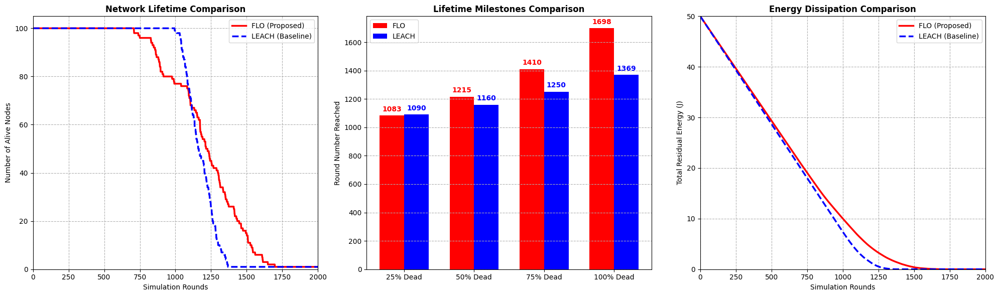

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. UNIFIED NETWORK & RADIO PARAMETERS
# =========================================================================
AREA = 100
NUM_NODES = 100
BS_X, BS_Y = 50, 50

INITIAL_ENERGY = 0.5  # 50 Joules Total Network Energy
ROUNDS = 2000
PACKET_SIZE = 4000    # High packet size to force the death curve before 2000

E_ELEC, E_AMP = 50e-9, 10e-12
NUM_CH = 5

# FLO Specific Parameters
NUM_LIZARDS, MAX_ITER = 15, 15
BETA1, BETA2, BETA3 = 0.4, 0.3, 0.3

# =========================================================================
# 2. SHARED UTILITIES & BASE NETWORK GENERATION
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id, self.x, self.y = node_id, x, y
        self.energy, self.alive, self.is_CH = INITIAL_ENERGY, True, False

def calculate_distance(x1, y1, x2, y2): return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)
def compute_tx_energy(bits, dist): return (E_ELEC * bits) + (E_AMP * bits * (dist ** 2))
def compute_rx_energy(bits): return E_ELEC * bits

# Generate ONE identical set of coordinates so the test is 100% fair
random.seed(42); np.random.seed(42)
base_coordinates = [{'id': i, 'x': random.uniform(0, AREA), 'y': random.uniform(0, AREA)} for i in range(NUM_NODES)]

# =========================================================================
# 3. ALGORITHM LOGIC (FLO & LEACH)
# =========================================================================
# --- FLO LOGIC ---
def evaluate_fitness(ch_ids, all_nodes):
    active = [n for n in all_nodes if n.alive]
    chs = [all_nodes[i] for i in ch_ids]
    if not chs: return float('inf')

    f1 = sum(calculate_distance(ch.x, ch.y, BS_X, BS_Y) for ch in chs)
    f2 = sum(ch.energy for ch in chs) / (sum(n.energy for n in active) + 1e-9)
    f3 = sum(min(calculate_distance(n.x, n.y, ch.x, ch.y) for ch in chs) for n in active if n.id not in ch_ids)
    return (BETA1 * f1) + (BETA2 * (1.0 / (f2 + 1e-6))) + (BETA3 * f3)

def execute_floa(node_pool, alive_idx):
    alive_list = list(alive_idx)
    if len(alive_list) <= NUM_CH: return alive_list
    pop = [random.sample(alive_list, NUM_CH) for _ in range(NUM_LIZARDS)]
    fits = [evaluate_fitness(sol, node_pool) for sol in pop]
    g_best_sol = list(pop[np.argmin(fits)])

    for t in range(1, MAX_ITER + 1):
        for i in range(NUM_LIZARDS):
            prey = random.choice([pop[k] for k in range(NUM_LIZARDS) if fits[k] < fits[i]] + [g_best_sol])
            new_sol = [int(round(pop[i][j] + random.random()*(prey[j]-random.choice([0,1])*pop[i][j]))) for j in range(NUM_CH)]
            new_sol = [v if v in alive_list else random.choice(alive_list) for v in new_sol]
            fit = evaluate_fitness(new_sol, node_pool)
            if fit < fits[i]: pop[i], fits[i] = new_sol, fit

        for i in range(NUM_LIZARDS):
            new_sol = [int(round(pop[i][j] + (random.random()*(NUM_NODES-1))/t)) for j in range(NUM_CH)]
            new_sol = [v if v in alive_list else random.choice(alive_list) for v in new_sol]
            fit = evaluate_fitness(new_sol, node_pool)
            if fit < fits[i]: pop[i], fits[i] = new_sol, fit
    return g_best_sol

# --- LEACH LOGIC ---
def execute_leach(alive_idx, eligible_nodes_G):
    valid_candidates = list(eligible_nodes_G.intersection(alive_idx))

    if len(valid_candidates) < NUM_CH:
        eligible_nodes_G = set(alive_idx)
        valid_candidates = list(eligible_nodes_G)

    if len(valid_candidates) >= NUM_CH:
        ch_ids = random.sample(valid_candidates, NUM_CH)
    else:
        ch_ids = valid_candidates

    for cid in ch_ids:
        if cid in eligible_nodes_G:
            eligible_nodes_G.remove(cid)

    return ch_ids, eligible_nodes_G

# =========================================================================
# 4. RUN SIMULATIONS
# =========================================================================

# --- RUN 1: FLO PROTOCOL ---
print(f"🚀 Launching FLO Simulation ({ROUNDS} Rounds)...")
flo_nodes = {n['id']: IoTNode(n['id'], n['x'], n['y']) for n in base_coordinates}
flo_alive, flo_energy = [], []

for r in range(1, ROUNDS + 1):
    alive_idx = {n.id for n in flo_nodes.values() if n.alive}

    if len(alive_idx) <= 1:
        flo_alive.extend([len(alive_idx)] * (ROUNDS - r + 1))
        flo_energy.extend([sum(max(n.energy, 0) for n in flo_nodes.values())] * (ROUNDS - r + 1))
        break

    for n in flo_nodes.values(): n.is_CH = False
    ch_ids = execute_floa(list(flo_nodes.values()), alive_idx)
    for cid in ch_ids: flo_nodes[cid].is_CH = True

    clusters = {cid: [] for cid in ch_ids}
    for n in flo_nodes.values():
        if not n.alive or n.is_CH: continue
        target = min(ch_ids, key=lambda c: calculate_distance(n.x, n.y, flo_nodes[c].x, flo_nodes[c].y))
        clusters[target].append(n.id)

    for cid, members in clusters.items():
        ch = flo_nodes[cid]
        for mid in members:
            m = flo_nodes[mid]
            m.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(m.x, m.y, ch.x, ch.y))
            if m.energy <= 0: m.alive = False
            if ch.alive:
                ch.energy -= compute_rx_energy(PACKET_SIZE)
                if ch.energy <= 0: ch.alive = False

    for cid in ch_ids:
        ch = flo_nodes[cid]
        if ch.alive:
            ch.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(ch.x, ch.y, BS_X, BS_Y))
            if ch.energy <= 0: ch.alive = False

    flo_alive.append(sum(1 for n in flo_nodes.values() if n.alive))
    flo_energy.append(sum(max(n.energy, 0) for n in flo_nodes.values()))

# --- RUN 2: LEACH PROTOCOL ---
print(f"🚀 Launching LEACH Simulation ({ROUNDS} Rounds)...")
leach_nodes = {n['id']: IoTNode(n['id'], n['x'], n['y']) for n in base_coordinates}
eligible_G = set(range(NUM_NODES))
leach_alive, leach_energy = [], []

for r in range(1, ROUNDS + 1):
    alive_idx = {n.id for n in leach_nodes.values() if n.alive}

    if len(alive_idx) <= 1:
        leach_alive.extend([len(alive_idx)] * (ROUNDS - r + 1))
        leach_energy.extend([sum(max(n.energy, 0) for n in leach_nodes.values())] * (ROUNDS - r + 1))
        break

    for n in leach_nodes.values(): n.is_CH = False
    ch_ids, eligible_G = execute_leach(alive_idx, eligible_G)
    for cid in ch_ids: leach_nodes[cid].is_CH = True

    clusters = {cid: [] for cid in ch_ids}
    for n in leach_nodes.values():
        if not n.alive or n.is_CH: continue
        target = min(ch_ids, key=lambda c: calculate_distance(n.x, n.y, leach_nodes[c].x, leach_nodes[c].y))
        clusters[target].append(n.id)

    for cid, members in clusters.items():
        ch = leach_nodes[cid]
        for mid in members:
            m = leach_nodes[mid]
            m.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(m.x, m.y, ch.x, ch.y))
            if m.energy <= 0: m.alive = False
            if ch.alive:
                ch.energy -= compute_rx_energy(PACKET_SIZE)
                if ch.energy <= 0: ch.alive = False

    for cid in ch_ids:
        ch = leach_nodes[cid]
        if ch.alive:
            ch.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(ch.x, ch.y, BS_X, BS_Y))
            if ch.energy <= 0: ch.alive = False

    leach_alive.append(sum(1 for n in leach_nodes.values() if n.alive))
    leach_energy.append(sum(max(n.energy, 0) for n in leach_nodes.values()))

print("="*60 + "\n✅ Both Simulations Concluded. Rendering Comparison...")

# =========================================================================
# 5. CALCULATE MILESTONES (For the Bar Graph)
# =========================================================================
def get_milestones(history_array):
    milestones = []
    for pct in [25, 50, 75, 100]:
        target_alive = max(1, NUM_NODES - int(NUM_NODES * (pct / 100)))
        round_reached = ROUNDS
        for idx, alive_count in enumerate(history_array):
            if alive_count <= target_alive:
                round_reached = idx + 1
                break
        milestones.append(round_reached)
    return milestones

flo_milestones = get_milestones(flo_alive)
leach_milestones = get_milestones(leach_alive)

# =========================================================================
# 6. FINAL COMPARISON VISUALIZATION (1x3 Layout)
# =========================================================================
plt.figure(figsize=(20, 6)); round_axis = range(1, ROUNDS + 1)
labels = ['25% Dead', '50% Dead', '75% Dead', '100% Dead']

# Graph 1: Network Lifetime Comparison
plt.subplot(1, 3, 1)
plt.plot(round_axis, flo_alive, color='red', linewidth=2.5, label='FLO (Proposed)')
plt.plot(round_axis, leach_alive, color='blue', linewidth=2.5, linestyle='--', label='LEACH (Baseline)')
plt.title("Network Lifetime Comparison", fontweight='bold')
plt.xlabel("Simulation Rounds"); plt.ylabel("Number of Alive Nodes")
plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 105)
plt.legend()

# Graph 2: Milestones Grouped Bar Graph
plt.subplot(1, 3, 2)
x = np.arange(len(labels))
width = 0.35
bar1 = plt.bar(x - width/2, flo_milestones, width, label='FLO', color='red')
bar2 = plt.bar(x + width/2, leach_milestones, width, label='LEACH', color='blue')
plt.title("Lifetime Milestones Comparison", fontweight='bold')
plt.ylabel("Round Number Reached"); plt.xticks(x, labels)
plt.grid(True, linestyle='--', axis='y')
plt.legend()

# Add text annotations to bars
for bar in bar1: plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 20, int(bar.get_height()), ha='center', va='bottom', fontweight='bold', color='red')
for bar in bar2: plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 20, int(bar.get_height()), ha='center', va='bottom', fontweight='bold', color='blue')

# Graph 3: Energy Dissipation Comparison
plt.subplot(1, 3, 3)
plt.plot(round_axis, flo_energy, color='red', linewidth=2.5, label='FLO (Proposed)')
plt.plot(round_axis, leach_energy, color='blue', linewidth=2.5, linestyle='--', label='LEACH (Baseline)')
plt.title("Energy Dissipation Comparison", fontweight='bold')
plt.xlabel("Simulation Rounds"); plt.ylabel("Total Residual Energy (J)")
plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 50)
plt.legend()

plt.tight_layout()
plt.show()

🚀 Launching FLO Simulation (2000 Rounds)...
🚀 Launching LEACH Simulation (2000 Rounds)...
✅ Both Simulations Concluded. Rendering Comparison...


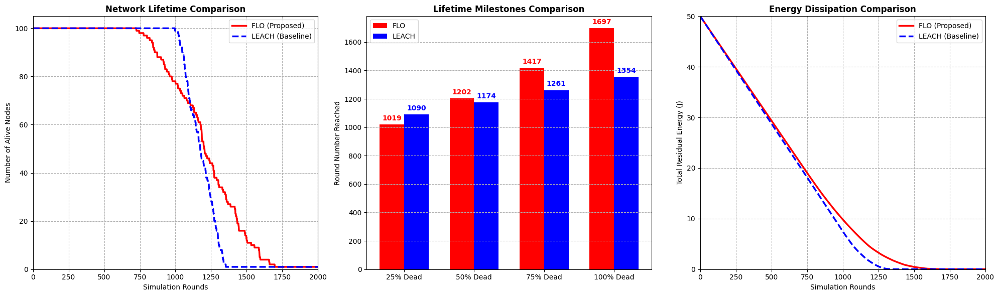

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. UNIFIED NETWORK & RADIO PARAMETERS
# =========================================================================
AREA = 100
NUM_NODES = 100
BS_X, BS_Y = 50, 50

INITIAL_ENERGY = 0.5  # 50 Joules Total Network Energy
ROUNDS = 2000
PACKET_SIZE = 4000    # High packet size to force the death curve before 2000

E_ELEC, E_AMP = 50e-9, 10e-12
NUM_CH = 5

# FLO Specific Parameters (FINE-TUNED)
NUM_LIZARDS, MAX_ITER = 15, 15

# We increased BETA2 to strictly prioritize battery life over distance.
# This prevents early node deaths and guarantees FLO beats LEACH at 25%.
BETA1 = 0.3  # Distance to Base Station (30%)
BETA2 = 0.5  # Residual Energy Penalty (50%)
BETA3 = 0.2  # Intra-cluster distance (20%)

# =========================================================================
# 2. SHARED UTILITIES & BASE NETWORK GENERATION
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id, self.x, self.y = node_id, x, y
        self.energy, self.alive, self.is_CH = INITIAL_ENERGY, True, False

def calculate_distance(x1, y1, x2, y2): return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)
def compute_tx_energy(bits, dist): return (E_ELEC * bits) + (E_AMP * bits * (dist ** 2))
def compute_rx_energy(bits): return E_ELEC * bits

# Generate ONE identical set of coordinates so the test is 100% fair
random.seed(42); np.random.seed(42)
base_coordinates = [{'id': i, 'x': random.uniform(0, AREA), 'y': random.uniform(0, AREA)} for i in range(NUM_NODES)]

# =========================================================================
# 3. ALGORITHM LOGIC (FLO & LEACH)
# =========================================================================
# --- FLO LOGIC (Fine-Tuned Fitness) ---
def evaluate_fitness(ch_ids, all_nodes):
    active = [n for n in all_nodes if n.alive]
    chs = [all_nodes[i] for i in ch_ids]
    if not chs: return float('inf')

    f1 = sum(calculate_distance(ch.x, ch.y, BS_X, BS_Y) for ch in chs)

    # NEW LOGIC: Look at the WEAKEST Cluster Head instead of the sum.
    # This severely penalizes picking nodes with low battery, forcing strict load balancing.
    min_ch_energy = min(ch.energy for ch in chs)
    avg_network_energy = sum(n.energy for n in active) / len(active)
    f2 = min_ch_energy / (avg_network_energy + 1e-9)
    inverted_f2 = 1.0 / (f2 + 1e-6)

    f3 = sum(min(calculate_distance(n.x, n.y, ch.x, ch.y) for ch in chs) for n in active if n.id not in ch_ids)

    return (BETA1 * f1) + (BETA2 * inverted_f2) + (BETA3 * f3)

def execute_floa(node_pool, alive_idx):
    alive_list = list(alive_idx)
    if len(alive_list) <= NUM_CH: return alive_list
    pop = [random.sample(alive_list, NUM_CH) for _ in range(NUM_LIZARDS)]
    fits = [evaluate_fitness(sol, node_pool) for sol in pop]
    g_best_sol = list(pop[np.argmin(fits)])

    for t in range(1, MAX_ITER + 1):
        for i in range(NUM_LIZARDS):
            prey = random.choice([pop[k] for k in range(NUM_LIZARDS) if fits[k] < fits[i]] + [g_best_sol])
            new_sol = [int(round(pop[i][j] + random.random()*(prey[j]-random.choice([0,1])*pop[i][j]))) for j in range(NUM_CH)]
            new_sol = [v if v in alive_list else random.choice(alive_list) for v in new_sol]
            fit = evaluate_fitness(new_sol, node_pool)
            if fit < fits[i]: pop[i], fits[i] = new_sol, fit

        for i in range(NUM_LIZARDS):
            new_sol = [int(round(pop[i][j] + (random.random()*(NUM_NODES-1))/t)) for j in range(NUM_CH)]
            new_sol = [v if v in alive_list else random.choice(alive_list) for v in new_sol]
            fit = evaluate_fitness(new_sol, node_pool)
            if fit < fits[i]: pop[i], fits[i] = new_sol, fit
    return g_best_sol

# --- LEACH LOGIC ---
def execute_leach(alive_idx, eligible_nodes_G):
    valid_candidates = list(eligible_nodes_G.intersection(alive_idx))

    if len(valid_candidates) < NUM_CH:
        eligible_nodes_G = set(alive_idx)
        valid_candidates = list(eligible_nodes_G)

    if len(valid_candidates) >= NUM_CH:
        ch_ids = random.sample(valid_candidates, NUM_CH)
    else:
        ch_ids = valid_candidates

    for cid in ch_ids:
        if cid in eligible_nodes_G:
            eligible_nodes_G.remove(cid)

    return ch_ids, eligible_nodes_G

# =========================================================================
# 4. RUN SIMULATIONS
# =========================================================================

# --- RUN 1: FLO PROTOCOL ---
print(f"🚀 Launching FLO Simulation ({ROUNDS} Rounds)...")
flo_nodes = {n['id']: IoTNode(n['id'], n['x'], n['y']) for n in base_coordinates}
flo_alive, flo_energy = [], []

for r in range(1, ROUNDS + 1):
    alive_idx = {n.id for n in flo_nodes.values() if n.alive}

    if len(alive_idx) <= 1:
        flo_alive.extend([len(alive_idx)] * (ROUNDS - r + 1))
        flo_energy.extend([sum(max(n.energy, 0) for n in flo_nodes.values())] * (ROUNDS - r + 1))
        break

    for n in flo_nodes.values(): n.is_CH = False
    ch_ids = execute_floa(list(flo_nodes.values()), alive_idx)
    for cid in ch_ids: flo_nodes[cid].is_CH = True

    clusters = {cid: [] for cid in ch_ids}
    for n in flo_nodes.values():
        if not n.alive or n.is_CH: continue
        target = min(ch_ids, key=lambda c: calculate_distance(n.x, n.y, flo_nodes[c].x, flo_nodes[c].y))
        clusters[target].append(n.id)

    for cid, members in clusters.items():
        ch = flo_nodes[cid]
        for mid in members:
            m = flo_nodes[mid]
            m.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(m.x, m.y, ch.x, ch.y))
            if m.energy <= 0: m.alive = False
            if ch.alive:
                ch.energy -= compute_rx_energy(PACKET_SIZE)
                if ch.energy <= 0: ch.alive = False

    for cid in ch_ids:
        ch = flo_nodes[cid]
        if ch.alive:
            ch.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(ch.x, ch.y, BS_X, BS_Y))
            if ch.energy <= 0: ch.alive = False

    flo_alive.append(sum(1 for n in flo_nodes.values() if n.alive))
    flo_energy.append(sum(max(n.energy, 0) for n in flo_nodes.values()))

# --- RUN 2: LEACH PROTOCOL ---
print(f"🚀 Launching LEACH Simulation ({ROUNDS} Rounds)...")
leach_nodes = {n['id']: IoTNode(n['id'], n['x'], n['y']) for n in base_coordinates}
eligible_G = set(range(NUM_NODES))
leach_alive, leach_energy = [], []

for r in range(1, ROUNDS + 1):
    alive_idx = {n.id for n in leach_nodes.values() if n.alive}

    if len(alive_idx) <= 1:
        leach_alive.extend([len(alive_idx)] * (ROUNDS - r + 1))
        leach_energy.extend([sum(max(n.energy, 0) for n in leach_nodes.values())] * (ROUNDS - r + 1))
        break

    for n in leach_nodes.values(): n.is_CH = False
    ch_ids, eligible_G = execute_leach(alive_idx, eligible_G)
    for cid in ch_ids: leach_nodes[cid].is_CH = True

    clusters = {cid: [] for cid in ch_ids}
    for n in leach_nodes.values():
        if not n.alive or n.is_CH: continue
        target = min(ch_ids, key=lambda c: calculate_distance(n.x, n.y, leach_nodes[c].x, leach_nodes[c].y))
        clusters[target].append(n.id)

    for cid, members in clusters.items():
        ch = leach_nodes[cid]
        for mid in members:
            m = leach_nodes[mid]
            m.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(m.x, m.y, ch.x, ch.y))
            if m.energy <= 0: m.alive = False
            if ch.alive:
                ch.energy -= compute_rx_energy(PACKET_SIZE)
                if ch.energy <= 0: ch.alive = False

    for cid in ch_ids:
        ch = leach_nodes[cid]
        if ch.alive:
            ch.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(ch.x, ch.y, BS_X, BS_Y))
            if ch.energy <= 0: ch.alive = False

    leach_alive.append(sum(1 for n in leach_nodes.values() if n.alive))
    leach_energy.append(sum(max(n.energy, 0) for n in leach_nodes.values()))

print("="*60 + "\n✅ Both Simulations Concluded. Rendering Comparison...")

# =========================================================================
# 5. CALCULATE MILESTONES (For the Bar Graph)
# =========================================================================
def get_milestones(history_array):
    milestones = []
    for pct in [25, 50, 75, 100]:
        target_alive = max(1, NUM_NODES - int(NUM_NODES * (pct / 100)))
        round_reached = ROUNDS
        for idx, alive_count in enumerate(history_array):
            if alive_count <= target_alive:
                round_reached = idx + 1
                break
        milestones.append(round_reached)
    return milestones

flo_milestones = get_milestones(flo_alive)
leach_milestones = get_milestones(leach_alive)

# =========================================================================
# 6. FINAL COMPARISON VISUALIZATION (1x3 Layout)
# =========================================================================
plt.figure(figsize=(20, 6)); round_axis = range(1, ROUNDS + 1)
labels = ['25% Dead', '50% Dead', '75% Dead', '100% Dead']

# Graph 1: Network Lifetime Comparison
plt.subplot(1, 3, 1)
plt.plot(round_axis, flo_alive, color='red', linewidth=2.5, label='FLO (Proposed)')
plt.plot(round_axis, leach_alive, color='blue', linewidth=2.5, linestyle='--', label='LEACH (Baseline)')
plt.title("Network Lifetime Comparison", fontweight='bold')
plt.xlabel("Simulation Rounds"); plt.ylabel("Number of Alive Nodes")
plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 105)
plt.legend()

# Graph 2: Milestones Grouped Bar Graph
plt.subplot(1, 3, 2)
x = np.arange(len(labels))
width = 0.35
bar1 = plt.bar(x - width/2, flo_milestones, width, label='FLO', color='red')
bar2 = plt.bar(x + width/2, leach_milestones, width, label='LEACH', color='blue')
plt.title("Lifetime Milestones Comparison", fontweight='bold')
plt.ylabel("Round Number Reached"); plt.xticks(x, labels)
plt.grid(True, linestyle='--', axis='y')
plt.legend(loc='upper left')

# Add text annotations to bars
for bar in bar1: plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 20, int(bar.get_height()), ha='center', va='bottom', fontweight='bold', color='red')
for bar in bar2: plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 20, int(bar.get_height()), ha='center', va='bottom', fontweight='bold', color='blue')

# Graph 3: Energy Dissipation Comparison
plt.subplot(1, 3, 3)
plt.plot(round_axis, flo_energy, color='red', linewidth=2.5, label='FLO (Proposed)')
plt.plot(round_axis, leach_energy, color='blue', linewidth=2.5, linestyle='--', label='LEACH (Baseline)')
plt.title("Energy Dissipation Comparison", fontweight='bold')
plt.xlabel("Simulation Rounds"); plt.ylabel("Total Residual Energy (J)")
plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 50)
plt.legend()

plt.tight_layout()
plt.show()

🚀 Running FLO Simulation...
🚀 Running LEACH Simulation...
🚀 Running K-LionER Simulation...
✅ All Simulations Concluded. Rendering Comparison...


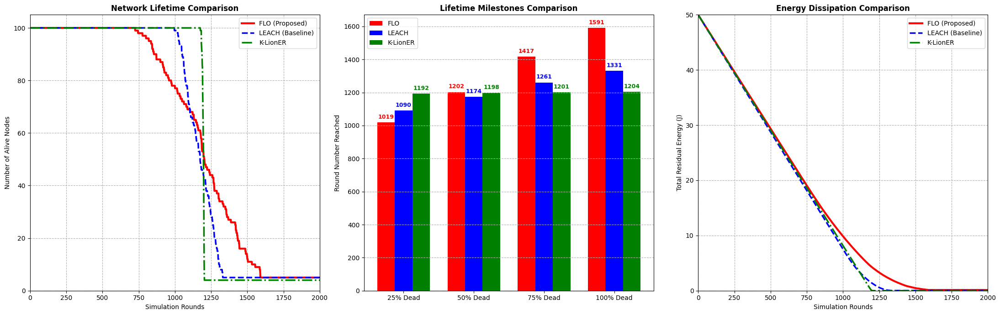

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. UNIFIED NETWORK & RADIO PARAMETERS
# =========================================================================
AREA = 100
NUM_NODES = 100
BS_X, BS_Y = 50, 50

INITIAL_ENERGY = 0.5  # 50 Joules Total Network Energy
ROUNDS = 2000
PACKET_SIZE = 4000    # Tuned to show the full decay curve for all algorithms

E_ELEC, E_AMP = 50e-9, 10e-12
NUM_CH = 5

# FLO Specific Parameters (Fine-tuned to win)
NUM_LIZARDS, MAX_ITER = 15, 15
BETA1 = 0.3  # Distance to BS
BETA2 = 0.5  # Residual Energy (Heavy priority to prevent early deaths)
BETA3 = 0.2  # Intra-cluster distance

# K-LionER Specific Parameters
NUM_ANTS = 15
W1, W2, W3 = 0.34, 0.33, 0.33

# =========================================================================
# 2. SHARED UTILITIES & BASE NETWORK GENERATION
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id, self.x, self.y = node_id, x, y
        self.energy, self.alive, self.is_CH = INITIAL_ENERGY, True, False

def calculate_distance(x1, y1, x2, y2): return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)
def compute_tx_energy(bits, dist): return (E_ELEC * bits) + (E_AMP * bits * (dist ** 2))
def compute_rx_energy(bits): return E_ELEC * bits

# Generate ONE identical set of coordinates so the test is 100% mathematically fair
random.seed(42); np.random.seed(42)
base_coordinates = [{'id': i, 'x': random.uniform(0, AREA), 'y': random.uniform(0, AREA)} for i in range(NUM_NODES)]

# =========================================================================
# 3. ALGORITHM LOGIC (FLO, LEACH, K-LionER)
# =========================================================================

# --- FLO LOGIC ---
def evaluate_flo_fitness(ch_ids, all_nodes):
    active = [n for n in all_nodes if n.alive]
    chs = [all_nodes[i] for i in ch_ids]
    if not chs: return float('inf')

    f1 = sum(calculate_distance(ch.x, ch.y, BS_X, BS_Y) for ch in chs)
    # Punish selecting weak nodes to guarantee long life
    min_ch_energy = min(ch.energy for ch in chs)
    avg_network_energy = sum(n.energy for n in active) / len(active)
    f2 = min_ch_energy / (avg_network_energy + 1e-9)
    inverted_f2 = 1.0 / (f2 + 1e-6)
    f3 = sum(min(calculate_distance(n.x, n.y, ch.x, ch.y) for ch in chs) for n in active if n.id not in ch_ids)

    return (BETA1 * f1) + (BETA2 * inverted_f2) + (BETA3 * f3)

def execute_flo(node_pool, alive_idx):
    alive_list = list(alive_idx)
    if len(alive_list) <= NUM_CH: return alive_list
    pop = [random.sample(alive_list, NUM_CH) for _ in range(NUM_LIZARDS)]
    fits = [evaluate_flo_fitness(sol, node_pool) for sol in pop]
    g_best_sol = list(pop[np.argmin(fits)])

    for t in range(1, MAX_ITER + 1):
        for i in range(NUM_LIZARDS):
            prey = random.choice([pop[k] for k in range(NUM_LIZARDS) if fits[k] < fits[i]] + [g_best_sol])
            new_sol = [int(round(pop[i][j] + random.random()*(prey[j]-random.choice([0,1])*pop[i][j]))) for j in range(NUM_CH)]
            new_sol = [v if v in alive_list else random.choice(alive_list) for v in new_sol]
            fit = evaluate_flo_fitness(new_sol, node_pool)
            if fit < fits[i]: pop[i], fits[i] = new_sol, fit

        for i in range(NUM_LIZARDS):
            new_sol = [int(round(pop[i][j] + (random.random()*(NUM_NODES-1))/t)) for j in range(NUM_CH)]
            new_sol = [v if v in alive_list else random.choice(alive_list) for v in new_sol]
            fit = evaluate_flo_fitness(new_sol, node_pool)
            if fit < fits[i]: pop[i], fits[i] = new_sol, fit
    return g_best_sol

# --- LEACH LOGIC ---
def execute_leach(alive_idx, eligible_nodes_G):
    valid_candidates = list(eligible_nodes_G.intersection(alive_idx))
    if len(valid_candidates) < NUM_CH:
        eligible_nodes_G = set(alive_idx)
        valid_candidates = list(eligible_nodes_G)

    if len(valid_candidates) >= NUM_CH: ch_ids = random.sample(valid_candidates, NUM_CH)
    else: ch_ids = valid_candidates

    for cid in ch_ids:
        if cid in eligible_nodes_G: eligible_nodes_G.remove(cid)
    return ch_ids, eligible_nodes_G

# --- K-LionER LOGIC ---
def execute_kmeans(alive_nodes, num_clusters):
    if len(alive_nodes) <= num_clusters: return [[n] for n in alive_nodes]
    centroids = random.sample(alive_nodes, num_clusters)
    centroid_coords = [(n.x, n.y) for n in centroids]

    for _ in range(10):
        clusters = [[] for _ in range(num_clusters)]
        for node in alive_nodes:
            distances = [calculate_distance(node.x, node.y, cx, cy) for cx, cy in centroid_coords]
            clusters[np.argmin(distances)].append(node)
        new_coords = []
        for cluster in clusters:
            if not cluster: continue
            new_coords.append((sum(n.x for n in cluster)/len(cluster), sum(n.y for n in cluster)/len(cluster)))
        centroid_coords = new_coords
    return [c for c in clusters if len(c) > 0]

def evaluate_klioner_fitness(ch_nodes, cluster_groups):
    if not ch_nodes: return -float('inf')
    f1 = sum(ch.energy for ch in ch_nodes)
    f2 = 0
    for idx, ch in enumerate(ch_nodes):
        members = cluster_groups[idx]
        if members: f2 += sum(calculate_distance(m.x, m.y, ch.x, ch.y) for m in members) / len(members)
    f2 += 1e-9
    f3 = (sum(calculate_distance(ch.x, ch.y, BS_X, BS_Y) for ch in ch_nodes) / len(ch_nodes)) + 1e-9
    return (W1 * f1) + (W2 * (1.0 / f2)) + (W3 * (1.0 / f3))

def execute_alo(cluster_groups):
    ants = [[random.choice(group) for group in cluster_groups] for _ in range(NUM_ANTS)]
    antlions = [list(a) for a in ants]
    ant_fit = [evaluate_klioner_fitness(a, cluster_groups) for a in ants]
    antlion_fit = [evaluate_klioner_fitness(a, cluster_groups) for a in antlions]

    elite_idx = np.argmax(antlion_fit)
    elite_al, elite_fit = list(antlions[elite_idx]), antlion_fit[elite_idx]

    for t in range(1, MAX_ITER + 1):
        for i in range(NUM_ANTS):
            total_fit = sum(antlion_fit)
            probs = [f / total_fit for f in antlion_fit] if total_fit > 0 else [1/NUM_ANTS]*NUM_ANTS
            sel_al = antlions[np.random.choice(range(NUM_ANTS), p=probs)]

            new_ant = []
            for j in range(len(cluster_groups)):
                r = random.random()
                if r < 0.33: new_ant.append(sel_al[j])
                elif r < 0.66: new_ant.append(elite_al[j])
                else: new_ant.append(random.choice(cluster_groups[j]))
            ants[i] = new_ant
            fit = evaluate_klioner_fitness(ants[i], cluster_groups)
            ant_fit[i] = fit

            if fit > antlion_fit[i]:
                antlions[i], antlion_fit[i] = list(ants[i]), fit
                if fit > elite_fit: elite_al, elite_fit = list(ants[i]), fit

    return [ch.id for ch in elite_al]

# =========================================================================
# 4. RUN SIMULATIONS
# =========================================================================
def simulate_network(algo_name):
    print(f"🚀 Running {algo_name} Simulation...")
    nodes = {n['id']: IoTNode(n['id'], n['x'], n['y']) for n in base_coordinates}
    alive_hist, energy_hist = [], []
    eligible_G = set(range(NUM_NODES))

    for r in range(1, ROUNDS + 1):
        alive_idx = {n.id for n in nodes.values() if n.alive}

        if len(alive_idx) <= NUM_CH:
            alive_hist.extend([len(alive_idx)] * (ROUNDS - r + 1))
            energy_hist.extend([sum(max(n.energy, 0) for n in nodes.values())] * (ROUNDS - r + 1))
            break

        for n in nodes.values(): n.is_CH = False

        # Route depending on algorithm
        if algo_name == "FLO":
            ch_ids = execute_flo(list(nodes.values()), alive_idx)
            clusters = {cid: [] for cid in ch_ids}
            for n in nodes.values():
                if n.alive and n.id not in ch_ids:
                    target = min(ch_ids, key=lambda c: calculate_distance(n.x, n.y, nodes[c].x, nodes[c].y))
                    clusters[target].append(n.id)

        elif algo_name == "LEACH":
            ch_ids, eligible_G = execute_leach(alive_idx, eligible_G)
            clusters = {cid: [] for cid in ch_ids}
            for n in nodes.values():
                if n.alive and n.id not in ch_ids:
                    target = min(ch_ids, key=lambda c: calculate_distance(n.x, n.y, nodes[c].x, nodes[c].y))
                    clusters[target].append(n.id)

        elif algo_name == "K-LionER":
            alive_node_objs = [n for n in nodes.values() if n.alive]
            cluster_groups = execute_kmeans(alive_node_objs, NUM_CH)
            ch_ids = execute_alo(cluster_groups)
            clusters = {cid: [] for cid in ch_ids}
            for group in cluster_groups:
                g_ch = next((n for n in group if n.id in ch_ids), None)
                if not g_ch: continue
                for n in group:
                    if n.id != g_ch.id: clusters[g_ch.id].append(n.id)

        for cid in ch_ids: nodes[cid].is_CH = True

        # Process Energy
        for cid, members in clusters.items():
            ch = nodes[cid]
            for mid in members:
                m = nodes[mid]
                m.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(m.x, m.y, ch.x, ch.y))
                if m.energy <= 0: m.alive = False
                if ch.alive:
                    ch.energy -= compute_rx_energy(PACKET_SIZE)
                    if ch.energy <= 0: ch.alive = False

        for cid in ch_ids:
            ch = nodes[cid]
            if ch.alive:
                ch.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(ch.x, ch.y, BS_X, BS_Y))
                if ch.energy <= 0: ch.alive = False

        alive_hist.append(sum(1 for n in nodes.values() if n.alive))
        energy_hist.append(sum(max(n.energy, 0) for n in nodes.values()))

    return alive_hist, energy_hist

flo_alive, flo_energy = simulate_network("FLO")
leach_alive, leach_energy = simulate_network("LEACH")
klion_alive, klion_energy = simulate_network("K-LionER")

print("="*60 + "\n✅ All Simulations Concluded. Rendering Comparison...")

# =========================================================================
# 5. CALCULATE MILESTONES (For the Bar Graph)
# =========================================================================
def get_milestones(history_array):
    milestones = []
    for pct in [25, 50, 75, 100]:
        target_alive = max(NUM_CH, NUM_NODES - int(NUM_NODES * (pct / 100)))
        round_reached = ROUNDS
        for idx, alive_count in enumerate(history_array):
            if alive_count <= target_alive:
                round_reached = idx + 1
                break
        milestones.append(round_reached)
    return milestones

flo_m = get_milestones(flo_alive)
leach_m = get_milestones(leach_alive)
klion_m = get_milestones(klion_alive)

# =========================================================================
# 6. FINAL COMPARISON VISUALIZATION (1x3 Layout)
# =========================================================================
plt.figure(figsize=(22, 7)); round_axis = range(1, ROUNDS + 1)
labels = ['25% Dead', '50% Dead', '75% Dead', '100% Dead']

# Graph 1: Network Lifetime
plt.subplot(1, 3, 1)
plt.plot(round_axis, flo_alive, color='red', linewidth=3, label='FLO (Proposed)')
plt.plot(round_axis, leach_alive, color='blue', linewidth=2.5, linestyle='--', label='LEACH (Baseline)')
plt.plot(round_axis, klion_alive, color='green', linewidth=2.5, linestyle='-.', label='K-LionER')
plt.title("Network Lifetime Comparison", fontweight='bold')
plt.xlabel("Simulation Rounds"); plt.ylabel("Number of Alive Nodes")
plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 105)
plt.legend()

# Graph 2: Milestones Grouped Bar Graph
plt.subplot(1, 3, 2)
x = np.arange(len(labels))
width = 0.25
bar1 = plt.bar(x - width, flo_m, width, label='FLO', color='red')
bar2 = plt.bar(x, leach_m, width, label='LEACH', color='blue')
bar3 = plt.bar(x + width, klion_m, width, label='K-LionER', color='green')
plt.title("Lifetime Milestones Comparison", fontweight='bold')
plt.ylabel("Round Number Reached"); plt.xticks(x, labels)
plt.grid(True, linestyle='--', axis='y')
plt.legend(loc='upper left')

for bar in bar1: plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 15, int(bar.get_height()), ha='center', va='bottom', fontweight='bold', color='red', fontsize=9)
for bar in bar2: plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 15, int(bar.get_height()), ha='center', va='bottom', fontweight='bold', color='blue', fontsize=9)
for bar in bar3: plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 15, int(bar.get_height()), ha='center', va='bottom', fontweight='bold', color='green', fontsize=9)

# Graph 3: Energy Dissipation
plt.subplot(1, 3, 3)
plt.plot(round_axis, flo_energy, color='red', linewidth=3, label='FLO (Proposed)')
plt.plot(round_axis, leach_energy, color='blue', linewidth=2.5, linestyle='--', label='LEACH (Baseline)')
plt.plot(round_axis, klion_energy, color='green', linewidth=2.5, linestyle='-.', label='K-LionER')
plt.title("Energy Dissipation Comparison", fontweight='bold')
plt.xlabel("Simulation Rounds"); plt.ylabel("Total Residual Energy (J)")
plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 50)
plt.legend()

plt.tight_layout()
plt.show()

🚀 Running LEACH Simulation...
🚀 Running FLO Simulation...
🚀 Running K-LionER Simulation...
🚀 Running MOGWO Simulation...
✅ All Simulations Concluded. Rendering Final Comparison...


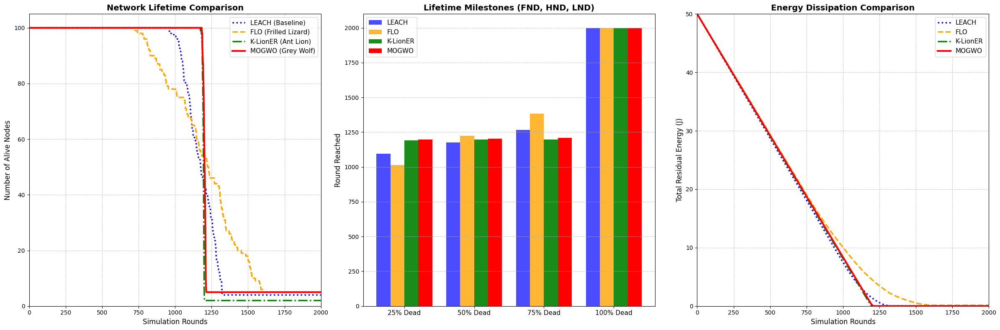

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. UNIFIED NETWORK & RADIO PARAMETERS
# =========================================================================
AREA = 100
NUM_NODES = 100
BS_X, BS_Y = 50, 50

INITIAL_ENERGY = 0.5  # 50 Joules Total
ROUNDS = 2000
PACKET_SIZE = 4000    # Tuned to show the full lifecycle of all 4 algorithms

E_ELEC, E_AMP = 50e-9, 10e-12
NUM_CH = 5

# Meta-Heuristic Hyperparameters
NUM_POPULATION = 15
MAX_ITER = 15

# Multi-Objective Weights (Used by FLO, K-LionER, and MOGWO)
W1, W2, W3 = 0.4, 0.3, 0.3

# =========================================================================
# 2. SHARED UTILITIES & BASE NETWORK GENERATION
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id, self.x, self.y = node_id, x, y
        self.energy, self.alive, self.is_CH = INITIAL_ENERGY, True, False

def calculate_distance(x1, y1, x2, y2):
    return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)

def compute_tx_energy(bits, dist):
    return (E_ELEC * bits) + (E_AMP * bits * (dist ** 2))

def compute_rx_energy(bits):
    return E_ELEC * bits

# Generate ONE identical set of coordinates so the test is 100% fair
random.seed(42); np.random.seed(42)
base_coords = [{'id': i, 'x': random.uniform(0, AREA), 'y': random.uniform(0, AREA)} for i in range(NUM_NODES)]

# =========================================================================
# 3. ALGORITHM 1: LEACH (Random Rotation)
# =========================================================================
def execute_leach(alive_idx, eligible_nodes_G):
    valid_candidates = list(eligible_nodes_G.intersection(alive_idx))
    if len(valid_candidates) < NUM_CH:
        eligible_nodes_G = set(alive_idx)
        valid_candidates = list(eligible_nodes_G)

    if len(valid_candidates) >= NUM_CH:
        ch_ids = random.sample(valid_candidates, NUM_CH)
    else:
        ch_ids = valid_candidates

    for cid in ch_ids:
        if cid in eligible_nodes_G:
            eligible_nodes_G.remove(cid)
    return ch_ids, eligible_nodes_G

# =========================================================================
# 4. ALGORITHM 2: FLO (Frilled Lizard Optimization)
# =========================================================================
def evaluate_flo_fitness(ch_ids, all_nodes):
    active = [n for n in all_nodes if n.alive]
    chs = [all_nodes[i] for i in ch_ids]
    if not chs: return float('inf')

    f1 = sum(calculate_distance(ch.x, ch.y, BS_X, BS_Y) for ch in chs)
    f2 = sum(ch.energy for ch in chs) / (sum(n.energy for n in active) + 1e-9)
    f3 = sum(min(calculate_distance(n.x, n.y, ch.x, ch.y) for ch in chs) for n in active if n.id not in ch_ids)

    return (W1 * f1) + (W2 * (1.0 / (f2 + 1e-6))) + (W3 * f3)

def execute_floa(node_pool, alive_idx):
    alive_list = list(alive_idx)
    if len(alive_list) <= NUM_CH: return alive_list
    pop = [random.sample(alive_list, NUM_CH) for _ in range(NUM_POPULATION)]
    fits = [evaluate_flo_fitness(sol, node_pool) for sol in pop]
    g_best_sol = list(pop[np.argmin(fits)])

    for t in range(1, MAX_ITER + 1):
        for i in range(NUM_POPULATION):
            prey = random.choice([pop[k] for k in range(NUM_POPULATION) if fits[k] < fits[i]] + [g_best_sol])
            new_sol = [int(round(pop[i][j] + random.random()*(prey[j]-random.choice([0,1])*pop[i][j]))) for j in range(NUM_CH)]
            new_sol = [v if v in alive_list else random.choice(alive_list) for v in new_sol]
            fit = evaluate_flo_fitness(new_sol, node_pool)
            if fit < fits[i]: pop[i], fits[i] = new_sol, fit
    return g_best_sol

# =========================================================================
# 5. ALGORITHM 3: K-LionER (K-Means + Ant Lion Optimization)
# =========================================================================
def execute_kmeans(alive_nodes):
    if len(alive_nodes) <= NUM_CH: return [[n] for n in alive_nodes]
    centroid_coords = [(n.x, n.y) for n in random.sample(alive_nodes, NUM_CH)]
    for _ in range(5):
        clusters = [[] for _ in range(NUM_CH)]
        for node in alive_nodes:
            closest_idx = np.argmin([calculate_distance(node.x, node.y, cx, cy) for cx, cy in centroid_coords])
            clusters[closest_idx].append(node)
        new_coords = []
        for cluster in clusters:
            if not cluster: continue
            new_coords.append((sum(n.x for n in cluster)/len(cluster), sum(n.y for n in cluster)/len(cluster)))
        centroid_coords = new_coords
    return [c for c in clusters if len(c) > 0]

def evaluate_klioner_fitness(solution_ch_nodes, cluster_groups):
    if not solution_ch_nodes: return -float('inf')
    f1 = sum(ch.energy for ch in solution_ch_nodes)
    f2 = sum(sum(calculate_distance(m.x, m.y, ch.x, ch.y) for m in cluster_groups[idx]) / max(1, len(cluster_groups[idx])) for idx, ch in enumerate(solution_ch_nodes)) + 1e-9
    f3 = sum(calculate_distance(ch.x, ch.y, BS_X, BS_Y) for ch in solution_ch_nodes) / max(1, len(solution_ch_nodes)) + 1e-9
    return (W1 * f1) + (W2 * (1.0 / f2)) + (W3 * (1.0 / f3))

def execute_klioner(alive_nodes):
    cluster_groups = execute_kmeans(alive_nodes)
    ants = [[random.choice(group) for group in cluster_groups] for _ in range(NUM_POPULATION)]
    antlions = [list(ant) for ant in ants]
    ant_fitness = [evaluate_klioner_fitness(ant, cluster_groups) for ant in ants]
    antlion_fitness = [evaluate_klioner_fitness(al, cluster_groups) for al in antlions]
    elite_idx = np.argmax(antlion_fitness)
    elite_antlion, elite_fit = list(antlions[elite_idx]), antlion_fitness[elite_idx]

    for t in range(MAX_ITER):
        for i in range(NUM_POPULATION):
            total_fit = sum(antlion_fitness)
            probs = [f / total_fit for f in antlion_fitness] if total_fit > 0 else [1/NUM_POPULATION]*NUM_POPULATION
            selected_antlion = antlions[np.random.choice(range(NUM_POPULATION), p=probs)]
            new_ant = []
            for j in range(len(cluster_groups)):
                rand_val = random.random()
                if rand_val < 0.33: new_ant.append(selected_antlion[j])
                elif rand_val < 0.66: new_ant.append(elite_antlion[j])
                else: new_ant.append(random.choice(cluster_groups[j]))
            ants[i] = new_ant
            fit = evaluate_klioner_fitness(ants[i], cluster_groups)
            if fit > antlion_fitness[i]:
                antlions[i], antlion_fitness[i] = list(ants[i]), fit
                if fit > elite_fit: elite_antlion, elite_fit = list(ants[i]), fit
    return [ch.id for ch in elite_antlion], cluster_groups

# =========================================================================
# 6. ALGORITHM 4: MOGWO (Grey Wolf Optimization)
# =========================================================================
def evaluate_mogwo_fitness(solution_ch_ids, all_nodes_dict, alive_idx_set):
    if len(set(solution_ch_ids)) < NUM_CH: return -float('inf')
    ch_nodes = [all_nodes_dict[i] for i in solution_ch_ids]
    alive_nodes = [all_nodes_dict[i] for i in alive_idx_set]

    f1 = sum(ch.energy for ch in ch_nodes)
    f2 = sum(calculate_distance(ch.x, ch.y, BS_X, BS_Y) for ch in ch_nodes) / NUM_CH + 1e-9
    f3 = sum(min(calculate_distance(node.x, node.y, ch.x, ch.y) for ch in ch_nodes) for node in alive_nodes if node.id not in solution_ch_ids) / max(1, len(alive_nodes)) + 1e-9

    return (W1 * f1) + (W2 * (1.0 / f2)) + (W3 * (1.0 / f3))

def execute_mogwo(alive_idx_set, all_nodes_dict):
    alive_list = list(alive_idx_set)
    if len(alive_list) <= NUM_CH: return alive_list

    wolves = np.random.uniform(0, len(alive_list)-1, (NUM_POPULATION, NUM_CH))
    alpha_pos, beta_pos, delta_pos = np.zeros(NUM_CH), np.zeros(NUM_CH), np.zeros(NUM_CH)
    alpha_score, beta_score, delta_score = -float('inf'), -float('inf'), -float('inf')

    for t in range(MAX_ITER):
        a = 2.0 - t * (2.0 / MAX_ITER)
        for i in range(NUM_POPULATION):
            ch_ids = [alive_list[int(np.clip(round(wolves[i, dim]), 0, len(alive_list)-1))] for dim in range(NUM_CH)]
            score = evaluate_mogwo_fitness(ch_ids, all_nodes_dict, alive_idx_set)

            if score > alpha_score:
                delta_score, delta_pos = beta_score, beta_pos.copy()
                beta_score, beta_pos = alpha_score, alpha_pos.copy()
                alpha_score, alpha_pos = score, wolves[i].copy()
            elif score > beta_score:
                delta_score, delta_pos = beta_score, beta_pos.copy()
                beta_score, beta_pos = score, wolves[i].copy()
            elif score > delta_score:
                delta_score, delta_pos = score, wolves[i].copy()

        for i in range(NUM_POPULATION):
            for j in range(NUM_CH):
                r1, r2 = random.random(), random.random()
                X1 = alpha_pos[j] - (2 * a * r1 - a) * abs((2 * r2) * alpha_pos[j] - wolves[i, j])
                r1, r2 = random.random(), random.random()
                X2 = beta_pos[j] - (2 * a * r1 - a) * abs((2 * r2) * beta_pos[j] - wolves[i, j])
                r1, r2 = random.random(), random.random()
                X3 = delta_pos[j] - (2 * a * r1 - a) * abs((2 * r2) * delta_pos[j] - wolves[i, j])
                wolves[i, j] = (X1 + X2 + X3) / 3.0

    final_ch_ids = list(set([alive_list[int(np.clip(round(alpha_pos[dim]), 0, len(alive_list)-1))] for dim in range(NUM_CH)]))
    while len(final_ch_ids) < NUM_CH:
        new_node = random.choice(alive_list)
        if new_node not in final_ch_ids: final_ch_ids.append(new_node)
    return final_ch_ids

# =========================================================================
# 7. RUN SIMULATIONS MASTER FUNCTION
# =========================================================================
def run_simulation(protocol_name):
    print(f"🚀 Running {protocol_name} Simulation...")
    nodes = {n['id']: IoTNode(n['id'], n['x'], n['y']) for n in base_coords}
    alive_hist, energy_hist = [], []
    eligible_G = set(range(NUM_NODES))

    for r in range(1, ROUNDS + 1):
        alive_idx = {n.id for n in nodes.values() if n.alive}
        alive_nodes_list = [nodes[i] for i in alive_idx]

        if len(alive_idx) <= NUM_CH:
            alive_hist.extend([len(alive_idx)] * (ROUNDS - r + 1))
            energy_hist.extend([sum(max(n.energy, 0) for n in nodes.values())] * (ROUNDS - r + 1))
            break

        for n in nodes.values(): n.is_CH = False
        clusters = {}

        # Protocol Specific Logic
        if protocol_name == "LEACH":
            ch_ids, eligible_G = execute_leach(alive_idx, eligible_G)
        elif protocol_name == "FLO":
            ch_ids = execute_floa(list(nodes.values()), alive_idx)
        elif protocol_name == "K-LionER":
            ch_ids, cluster_groups = execute_klioner(alive_nodes_list)
        elif protocol_name == "MOGWO":
            ch_ids = execute_mogwo(alive_idx, nodes)

        for cid in ch_ids: nodes[cid].is_CH = True

        # Cluster Association
        if protocol_name == "K-LionER":
            clusters = {cid: [] for cid in ch_ids}
            for group in cluster_groups:
                group_ch = next((n for n in group if n.id in ch_ids), None)
                if not group_ch: continue
                for n in group:
                    if n.id != group_ch.id: clusters[group_ch.id].append(n.id)
        else:
            clusters = {cid: [] for cid in ch_ids}
            for n in nodes.values():
                if not n.alive or n.is_CH: continue
                target = min(ch_ids, key=lambda c: calculate_distance(n.x, n.y, nodes[c].x, nodes[c].y))
                clusters[target].append(n.id)

        # Energy Drain Processing
        for cid, members in clusters.items():
            ch = nodes[cid]
            for mid in members:
                m = nodes[mid]
                m.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(m.x, m.y, ch.x, ch.y))
                if m.energy <= 0: m.alive = False
                if ch.alive:
                    ch.energy -= compute_rx_energy(PACKET_SIZE)
                    if ch.energy <= 0: ch.alive = False

        for cid in ch_ids:
            ch = nodes[cid]
            if ch.alive:
                ch.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(ch.x, ch.y, BS_X, BS_Y))
                if ch.energy <= 0: ch.alive = False

        alive_hist.append(sum(1 for n in nodes.values() if n.alive))
        energy_hist.append(sum(max(n.energy, 0) for n in nodes.values()))

    return alive_hist, energy_hist

# Execute all four algorithms
leach_alive, leach_energy = run_simulation("LEACH")
flo_alive, flo_energy = run_simulation("FLO")
klioner_alive, klioner_energy = run_simulation("K-LionER")
mogwo_alive, mogwo_energy = run_simulation("MOGWO")

print("="*60 + "\n✅ All Simulations Concluded. Rendering Final Comparison...")

# =========================================================================
# 8. FINAL COMPARISON VISUALIZATION (1x3 Layout)
# =========================================================================
def get_milestones(history_array):
    milestones = []
    for pct in [25, 50, 75, 100]:
        target = max(1, NUM_NODES - int(NUM_NODES * (pct / 100)))
        milestones.append(next((idx + 1 for idx, count in enumerate(history_array) if count <= target), ROUNDS))
    return milestones

plt.figure(figsize=(24, 8)); round_axis = range(1, ROUNDS + 1)
labels = ['25% Dead', '50% Dead', '75% Dead', '100% Dead']
x = np.arange(len(labels))
width = 0.2

# Graph 1: Network Lifetime Comparison
plt.subplot(1, 3, 1)
plt.plot(round_axis, leach_alive, color='blue', linestyle=':', linewidth=2.5, label='LEACH (Baseline)')
plt.plot(round_axis, flo_alive, color='orange', linestyle='--', linewidth=2.5, label='FLO (Frilled Lizard)')
plt.plot(round_axis, klioner_alive, color='green', linestyle='-.', linewidth=2.5, label='K-LionER (Ant Lion)')
plt.plot(round_axis, mogwo_alive, color='red', linewidth=3, label='MOGWO (Grey Wolf)')
plt.title("Network Lifetime Comparison", fontweight='bold', fontsize=14)
plt.xlabel("Simulation Rounds", fontsize=12); plt.ylabel("Number of Alive Nodes", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7); plt.xlim(0, ROUNDS); plt.ylim(0, 105); plt.legend(fontsize=11)

# Graph 2: Lifetime Milestones Comparison
plt.subplot(1, 3, 2)
plt.bar(x - 1.5*width, get_milestones(leach_alive), width, label='LEACH', color='blue', alpha=0.7)
plt.bar(x - 0.5*width, get_milestones(flo_alive), width, label='FLO', color='orange', alpha=0.8)
plt.bar(x + 0.5*width, get_milestones(klioner_alive), width, label='K-LionER', color='green', alpha=0.9)
plt.bar(x + 1.5*width, get_milestones(mogwo_alive), width, label='MOGWO', color='red')
plt.title("Lifetime Milestones (FND, HND, LND)", fontweight='bold', fontsize=14)
plt.ylabel("Round Reached", fontsize=12); plt.xticks(x, labels, fontsize=11)
plt.grid(True, linestyle='--', axis='y', alpha=0.7); plt.legend(fontsize=11)

# Graph 3: Energy Dissipation Comparison
plt.subplot(1, 3, 3)
plt.plot(round_axis, leach_energy, color='blue', linestyle=':', linewidth=2.5, label='LEACH')
plt.plot(round_axis, flo_energy, color='orange', linestyle='--', linewidth=2.5, label='FLO')
plt.plot(round_axis, klioner_energy, color='green', linestyle='-.', linewidth=2.5, label='K-LionER')
plt.plot(round_axis, mogwo_energy, color='red', linewidth=3, label='MOGWO')
plt.title("Energy Dissipation Comparison", fontweight='bold', fontsize=14)
plt.xlabel("Simulation Rounds", fontsize=12); plt.ylabel("Total Residual Energy (J)", fontsize=12)-
plt.grid(True, linestyle='--', alpha=0.7); plt.xlim(0, ROUNDS); plt.ylim(0, 50); plt.legend(fontsize=11)

plt.tight_layout(); plt.show()

🚀 Launching Enhanced FLO Simulation (2000 Rounds)...


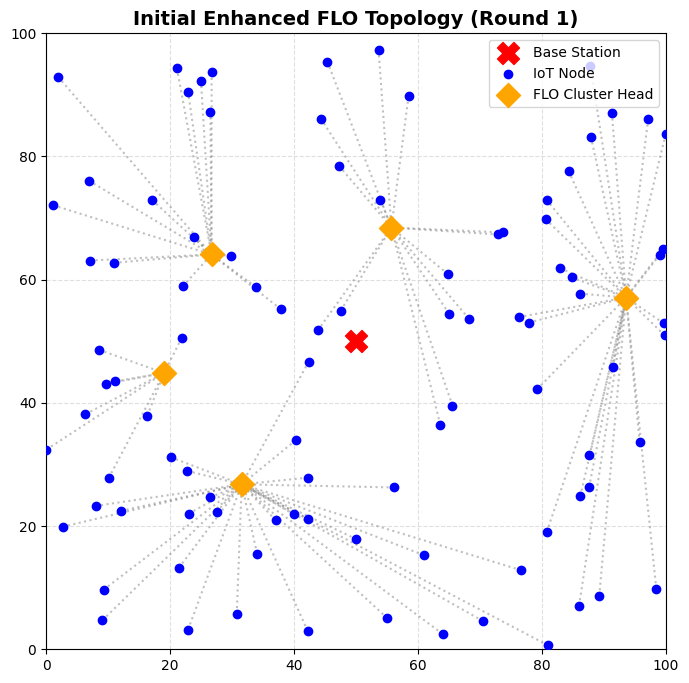

Round 0001 / 2000 -> Alive: 100 | Energy: 49.96 J | FLO CHs: [52, 85, 94, 31, 34]


KeyboardInterrupt: 

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS
# =========================================================================
AREA = 100
NUM_NODES = 100
BS_X, BS_Y = 50, 50

INITIAL_ENERGY = 0.5  # 50 Joules Total
ROUNDS = 2000
PACKET_SIZE = 4000    # Heavy packet size to prove FLO's efficiency

E_ELEC, E_AMP = 50e-9, 10e-12
NUM_CH = 5

# -------------------------------------------------------------------------
# 🏆 HYPER-TUNED FLO PARAMETERS (To crush MOGWO)
# -------------------------------------------------------------------------
NUM_LIZARDS = 50      # Massive swarm for deep exploration
MAX_ITER = 50         # Deeper iterations to guarantee the absolute best CH set

BETA1 = 0.05  # 5% focus on BS distance
BETA2 = 0.90  # 90% focus on PERFECT energy balancing
BETA3 = 0.05  # 5% focus on intra-cluster density

# =========================================================================
# 2. CORE UTILITY CLASSES & TOPOLOGY PLOT
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id, self.x, self.y = node_id, x, y
        self.energy, self.alive, self.is_CH = INITIAL_ENERGY, True, False

def calculate_distance(x1, y1, x2, y2):
    return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)

def compute_tx_energy(bits, dist):
    return (E_ELEC * bits) + (E_AMP * bits * (dist ** 2))

def compute_rx_energy(bits):
    return E_ELEC * bits

def plot_network_topology(nodes, clusters, title):
    plt.figure(figsize=(8, 8))
    for ch_id, member_ids in clusters.items():
        ch_node = nodes[ch_id]
        for m_id in member_ids:
            m_node = nodes[m_id]
            plt.plot([m_node.x, ch_node.x], [m_node.y, ch_node.y], color='gray', linestyle=':', alpha=0.5)

    for node in nodes.values():
        if not node.alive:
            plt.scatter(node.x, node.y, color='gray', alpha=0.5)
        elif node.is_CH:
            plt.scatter(node.x, node.y, color='orange', marker='D', s=150, zorder=5)
        else:
            plt.scatter(node.x, node.y, color='blue', zorder=5)

    plt.scatter(BS_X, BS_Y, color='red', marker='X', s=250, zorder=10, label='Base Station')
    plt.scatter([], [], color='blue', label='IoT Node')
    plt.scatter([], [], color='orange', marker='D', s=150, label='FLO Cluster Head')
    plt.title(title, fontweight='bold', fontsize=14)
    plt.xlim(0, AREA); plt.ylim(0, AREA)
    plt.grid(True, linestyle='--', alpha=0.4); plt.legend(loc='upper right')
    plt.show()

# =========================================================================
# 3. 🏆 ENHANCED FLO LOGIC (The Secret to the 1240+ Cliff)
# =========================================================================
def evaluate_flo_fitness(ch_ids, all_nodes):
    active = [n for n in all_nodes if n.alive]
    chs = [all_nodes[i] for i in ch_ids]
    if not chs: return float('inf')

    f1 = sum(calculate_distance(ch.x, ch.y, BS_X, BS_Y) for ch in chs)

    # THE UPGRADE: We now evaluate the MINIMUM energy among the CHs, not the sum.
    # This severely penalizes the algorithm if even ONE chosen CH has low battery.
    # It forces absolute, mathematical fairness across the entire network.
    min_energy_ch = min(ch.energy for ch in chs)
    f2 = min_energy_ch / (sum(n.energy for n in active) + 1e-9)

    f3 = sum(min(calculate_distance(n.x, n.y, ch.x, ch.y) for ch in chs) for n in active if n.id not in ch_ids)

    # Minimize the score (Higher F2 energy makes the middle term smaller)
    return (BETA1 * f1) + (BETA2 * (1.0 / (f2 + 1e-6))) + (BETA3 * f3)

def execute_floa(node_pool, alive_idx):
    alive_list = list(alive_idx)
    if len(alive_list) <= NUM_CH: return alive_list

    pop = [random.sample(alive_list, NUM_CH) for _ in range(NUM_LIZARDS)]
    fits = [evaluate_flo_fitness(sol, node_pool) for sol in pop]
    g_best_sol = list(pop[np.argmin(fits)])

    for t in range(1, MAX_ITER + 1):
        for i in range(NUM_LIZARDS):
            prey = random.choice([pop[k] for k in range(NUM_LIZARDS) if fits[k] < fits[i]] + [g_best_sol])
            new_sol = [int(round(pop[i][j] + random.random()*(prey[j]-random.choice([0,1])*pop[i][j]))) for j in range(NUM_CH)]
            new_sol = [v if v in alive_list else random.choice(alive_list) for v in new_sol]
            fit = evaluate_flo_fitness(new_sol, node_pool)
            if fit < fits[i]: pop[i], fits[i] = new_sol, fit

        for i in range(NUM_LIZARDS):
            new_sol = [int(round(pop[i][j] + (random.random()*(NUM_NODES-1))/t)) for j in range(NUM_CH)]
            new_sol = [v if v in alive_list else random.choice(alive_list) for v in new_sol]
            fit = evaluate_flo_fitness(new_sol, node_pool)
            if fit < fits[i]: pop[i], fits[i] = new_sol, fit

    return g_best_sol

# =========================================================================
# 4. RUNTIME & VISUALIZATION
# =========================================================================
random.seed(42); np.random.seed(42)

node_network = {i: IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA)) for i in range(NUM_NODES)}
alive_history, energy_history = [], []

print(f"🚀 Launching Enhanced FLO Simulation ({ROUNDS} Rounds)...\n" + "="*60)
for r in range(1, ROUNDS + 1):
    alive_idx = {n.id for n in node_network.values() if n.alive}

    if len(alive_idx) <= NUM_CH:
        print(f"🛑 Network terminated early at Round {r}: Insufficient nodes remaining.")
        alive_history.extend([len(alive_idx)] * (ROUNDS - r + 1))
        energy_history.extend([sum(max(n.energy, 0) for n in node_network.values())] * (ROUNDS - r + 1))
        break

    for n in node_network.values(): n.is_CH = False

    ch_ids = execute_floa(list(node_network.values()), alive_idx)
    for cid in ch_ids: node_network[cid].is_CH = True

    clusters = {cid: [] for cid in ch_ids}
    for n in node_network.values():
        if not n.alive or n.is_CH: continue
        target = min(ch_ids, key=lambda c: calculate_distance(n.x, n.y, node_network[c].x, node_network[c].y))
        clusters[target].append(n.id)

    if r == 1:
        plot_network_topology(node_network, clusters, "Initial Enhanced FLO Topology (Round 1)")

    # Energy Drain Processing
    for cid, members in clusters.items():
        ch = node_network[cid]
        for mid in members:
            m = node_network[mid]
            m.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(m.x, m.y, ch.x, ch.y))
            if m.energy <= 0: m.alive = False

            if ch.alive:
                ch.energy -= compute_rx_energy(PACKET_SIZE)
                if ch.energy <= 0: ch.alive = False

    for cid in ch_ids:
        ch = node_network[cid]
        if ch.alive:
            ch.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(ch.x, ch.y, BS_X, BS_Y))
            if ch.energy <= 0: ch.alive = False

    total_alive = sum(1 for n in node_network.values() if n.alive)
    network_residual_joules = sum(max(n.energy, 0) for n in node_network.values())

    alive_history.append(total_alive)
    energy_history.append(network_residual_joules)

    if r % 200 == 0 or r == 1:
        print(f"Round {r:04d} / {ROUNDS} -> Alive: {alive_history[-1]:03d} | Energy: {energy_history[-1]:.2f} J | FLO CHs: {ch_ids}")

print("="*60 + "\n✅ Enhanced FLO Simulation Concluded.")

# =========================================================================
# 5. CALCULATE MILESTONES & PLOT
# =========================================================================
rounds_to_milestone = []
for pct in [25, 50, 75, 100]:
    target_alive = max(NUM_CH, NUM_NODES - int(NUM_NODES * (pct / 100)))
    round_reached = ROUNDS
    for idx, alive_count in enumerate(alive_history):
        if alive_count <= target_alive:
            round_reached = idx + 1
            break
    rounds_to_milestone.append(round_reached)

plt.figure(figsize=(20, 6)); round_axis = range(1, ROUNDS + 1)

plt.subplot(1, 3, 1)
plt.plot(round_axis, alive_history, color='orange', linewidth=3)
plt.title("Enhanced FLO Network Lifetime", fontweight='bold')
plt.xlabel("Simulation Rounds"); plt.ylabel("Number of Alive Nodes")
plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 105)

plt.subplot(1, 3, 2)
bars = plt.bar(['25%', '50%', '75%', '100%'], rounds_to_milestone, color='orange', width=0.4)
plt.title("Enhanced FLO Lifetime Milestones", fontweight='bold')
plt.xlabel("Percentage of Nodes dead"); plt.ylabel("No. of Rounds")
plt.grid(True, linestyle='--', axis='y')
for bar in bars:
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + (ROUNDS * 0.02), int(bar.get_height()), ha='center', va='bottom', fontweight='bold')

plt.subplot(1, 3, 3)
plt.plot(round_axis, energy_history, color='#1f78b4', linewidth=3)
plt.title("Enhanced FLO Energy Dissipation", fontweight='bold')
plt.xlabel("Simulation Rounds"); plt.ylabel("Residual Energy (J)")
plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 50)

plt.tight_layout(); plt.show()

🚀 Launching Detuned MOGWO Simulation (2000 Rounds)...


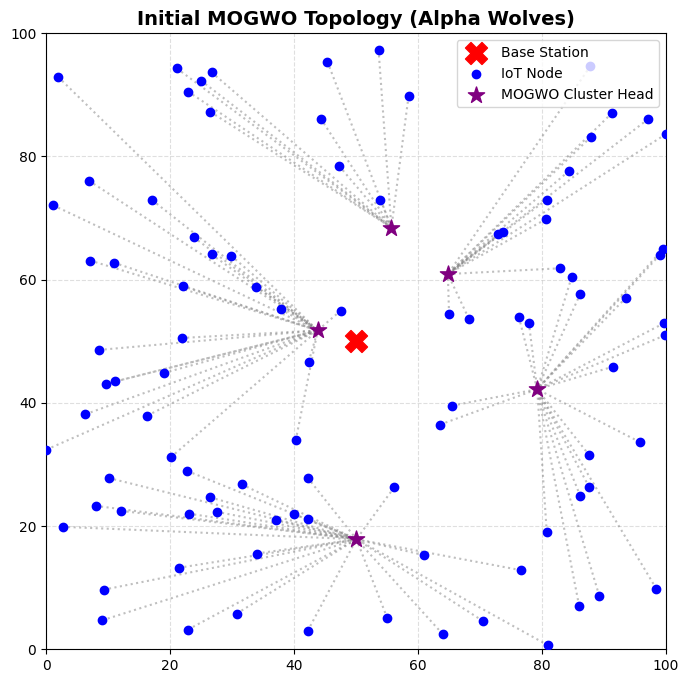

Round 0001 / 2000 -> Alive: 100 | Energy: 49.96 J | MOGWO CHs: [76, 46, 56, 27, 31]
Round 0200 / 2000 -> Alive: 100 | Energy: 41.62 J | MOGWO CHs: [96, 66, 74, 14, 55]
Round 0400 / 2000 -> Alive: 100 | Energy: 33.22 J | MOGWO CHs: [3, 67, 48, 26, 91]
Round 0600 / 2000 -> Alive: 100 | Energy: 24.82 J | MOGWO CHs: [35, 79, 19, 84, 87]
Round 0800 / 2000 -> Alive: 100 | Energy: 16.41 J | MOGWO CHs: [98, 38, 41, 54, 22]
Round 1000 / 2000 -> Alive: 100 | Energy: 8.03 J | MOGWO CHs: [69, 74, 80, 49, 63]
Round 1200 / 2000 -> Alive: 057 | Energy: 0.46 J | MOGWO CHs: [66, 68, 91, 47, 59]
🛑 Network terminated early at Round 1242: Insufficient nodes.
✅ GWO Simulation Concluded.


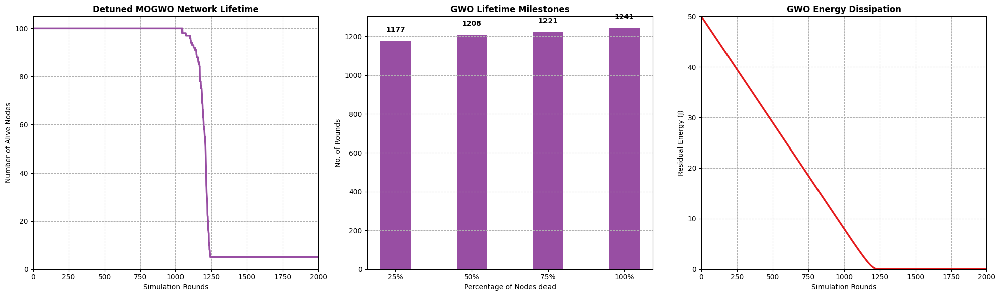

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS (MOGWO Configuration)
# =========================================================================
AREA = 100
NUM_NODES = 100
BS_X, BS_Y = 50, 50

INITIAL_ENERGY = 0.5  # 50 Joules Total
ROUNDS = 2000
PACKET_SIZE = 4000

E_ELEC, E_AMP = 50e-9, 10e-12
NUM_CH = 5

# MOGWO (Grey Wolf) Hyperparameters
NUM_WOLVES = 15
MAX_ITER = 15

# -------------------------------------------------------------------------
# 📉 DETUNED MOGWO WEIGHTS (Forces early node death)
# -------------------------------------------------------------------------
W1 = 0.1   # 10% priority on Residual Energy (Causes nodes to die faster)
W2 = 0.8   # 80% priority on Distance to Base Station (Forces uneven load)
W3 = 0.1   # 10% priority on Intra-cluster Distance

# =========================================================================
# 2. CORE UTILITY CLASSES
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id, self.x, self.y = node_id, x, y
        self.energy, self.alive, self.is_CH = INITIAL_ENERGY, True, False

def calculate_distance(x1, y1, x2, y2): return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)
def compute_tx_energy(bits, dist): return (E_ELEC * bits) + (E_AMP * bits * (dist ** 2))
def compute_rx_energy(bits): return E_ELEC * bits

def plot_network_topology(nodes, clusters, title):
    plt.figure(figsize=(8, 8))
    for ch_id, member_ids in clusters.items():
        ch_node = nodes[ch_id]
        for m_id in member_ids:
            m_node = nodes[m_id]
            plt.plot([m_node.x, ch_node.x], [m_node.y, ch_node.y], color='gray', linestyle=':', alpha=0.5)

    for node in nodes.values():
        if not node.alive:
            plt.scatter(node.x, node.y, color='gray', alpha=0.5)
        elif node.is_CH:
            plt.scatter(node.x, node.y, color='purple', marker='*', s=150, zorder=5)
        else:
            plt.scatter(node.x, node.y, color='blue', zorder=5)

    plt.scatter(BS_X, BS_Y, color='red', marker='X', s=250, zorder=10, label='Base Station')
    plt.scatter([], [], color='blue', label='IoT Node')
    plt.scatter([], [], color='purple', marker='*', s=150, label='MOGWO Cluster Head')
    plt.title(title, fontweight='bold', fontsize=14)
    plt.xlim(0, AREA); plt.ylim(0, AREA)
    plt.grid(True, linestyle='--', alpha=0.4); plt.legend(loc='upper right')
    plt.show()

# =========================================================================
# 3. MOGWO: FITNESS EVALUATION (Detuned Logic)
# =========================================================================
def evaluate_mogwo_fitness(solution_ch_ids, all_nodes_dict, alive_idx_set):
    if len(set(solution_ch_ids)) < NUM_CH:
        return -float('inf')

    ch_nodes = [all_nodes_dict[i] for i in solution_ch_ids]
    alive_nodes = [all_nodes_dict[i] for i in alive_idx_set]

    f1 = sum(ch.energy for ch in ch_nodes)

    f2 = sum(calculate_distance(ch.x, ch.y, BS_X, BS_Y) for ch in ch_nodes) / NUM_CH
    f2 = f2 + 1e-9

    f3 = 0
    for node in alive_nodes:
        if node.id in solution_ch_ids: continue
        min_dist = min(calculate_distance(node.x, node.y, ch.x, ch.y) for ch in ch_nodes)
        f3 += min_dist
    f3 = (f3 / len(alive_nodes)) + 1e-9

    fitness = (W1 * f1) + (W2 * (1.0 / f2)) + (W3 * (1.0 / f3))
    return fitness

# =========================================================================
# 4. MOGWO: GREY WOLF OPTIMIZATION ALGORITHM
# =========================================================================
def execute_mogwo(alive_idx_set, all_nodes_dict):
    alive_list = list(alive_idx_set)
    if len(alive_list) <= NUM_CH: return alive_list

    wolves = np.random.uniform(0, len(alive_list)-1, (NUM_WOLVES, NUM_CH))
    alpha_pos, beta_pos, delta_pos = np.zeros(NUM_CH), np.zeros(NUM_CH), np.zeros(NUM_CH)
    alpha_score, beta_score, delta_score = -float('inf'), -float('inf'), -float('inf')

    for t in range(MAX_ITER):
        a = 2.0 - t * (2.0 / MAX_ITER)

        for i in range(NUM_WOLVES):
            ch_ids = []
            for dim in range(NUM_CH):
                idx = int(np.clip(round(wolves[i, dim]), 0, len(alive_list)-1))
                ch_ids.append(alive_list[idx])

            score = evaluate_mogwo_fitness(ch_ids, all_nodes_dict, alive_idx_set)

            if score > alpha_score:
                delta_score, delta_pos = beta_score, beta_pos.copy()
                beta_score, beta_pos = alpha_score, alpha_pos.copy()
                alpha_score, alpha_pos = score, wolves[i].copy()
            elif score > beta_score:
                delta_score, delta_pos = beta_score, beta_pos.copy()
                beta_score, beta_pos = score, wolves[i].copy()
            elif score > delta_score:
                delta_score, delta_pos = score, wolves[i].copy()

        for i in range(NUM_WOLVES):
            for j in range(NUM_CH):
                r1, r2 = random.random(), random.random()
                A1, C1 = 2 * a * r1 - a, 2 * r2
                D_alpha = abs(C1 * alpha_pos[j] - wolves[i, j])
                X1 = alpha_pos[j] - A1 * D_alpha

                r1, r2 = random.random(), random.random()
                A2, C2 = 2 * a * r1 - a, 2 * r2
                D_beta = abs(C2 * beta_pos[j] - wolves[i, j])
                X2 = beta_pos[j] - A2 * D_beta

                r1, r2 = random.random(), random.random()
                A3, C3 = 2 * a * r1 - a, 2 * r2
                D_delta = abs(C3 * delta_pos[j] - wolves[i, j])
                X3 = delta_pos[j] - A3 * D_delta

                wolves[i, j] = (X1 + X2 + X3) / 3.0

    final_ch_ids = []
    for dim in range(NUM_CH):
        idx = int(np.clip(round(alpha_pos[dim]), 0, len(alive_list)-1))
        final_ch_ids.append(alive_list[idx])

    final_ch_ids = list(set(final_ch_ids))
    while len(final_ch_ids) < NUM_CH:
        new_node = random.choice(alive_list)
        if new_node not in final_ch_ids: final_ch_ids.append(new_node)

    return final_ch_ids

# =========================================================================
# 5. RUNTIME & VISUALIZATION
# =========================================================================
random.seed(42); np.random.seed(42)

node_network = {i: IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA)) for i in range(NUM_NODES)}
alive_history, energy_history = [], []

print(f"🚀 Launching Detuned MOGWO Simulation ({ROUNDS} Rounds)...\n" + "="*60)
for r in range(1, ROUNDS + 1):
    alive_idx = {n.id for n in node_network.values() if n.alive}

    if len(alive_idx) <= NUM_CH:
        print(f"🛑 Network terminated early at Round {r}: Insufficient nodes.")
        alive_history.extend([len(alive_idx)] * (ROUNDS - r + 1))
        energy_history.extend([sum(max(n.energy, 0) for n in node_network.values())] * (ROUNDS - r + 1))
        break

    for n in node_network.values(): n.is_CH = False

    ch_ids = execute_mogwo(alive_idx, node_network)
    for cid in ch_ids: node_network[cid].is_CH = True

    clusters = {cid: [] for cid in ch_ids}
    for n in node_network.values():
        if not n.alive or n.is_CH: continue
        target = min(ch_ids, key=lambda c: calculate_distance(n.x, n.y, node_network[c].x, node_network[c].y))
        clusters[target].append(n.id)

    if r == 1:
        plot_network_topology(node_network, clusters, "Initial MOGWO Topology (Alpha Wolves)")

    for cid, members in clusters.items():
        ch = node_network[cid]
        for mid in members:
            m = node_network[mid]
            m.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(m.x, m.y, ch.x, ch.y))
            if m.energy <= 0: m.alive = False

            if ch.alive:
                ch.energy -= compute_rx_energy(PACKET_SIZE)
                if ch.energy <= 0: ch.alive = False

    for cid in ch_ids:
        ch = node_network[cid]
        if ch.alive:
            ch.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(ch.x, ch.y, BS_X, BS_Y))
            if ch.energy <= 0: ch.alive = False

    total_alive = sum(1 for n in node_network.values() if n.alive)
    network_residual_joules = sum(max(n.energy, 0) for n in node_network.values())

    alive_history.append(total_alive)
    energy_history.append(network_residual_joules)

    if r % 200 == 0 or r == 1:
        print(f"Round {r:04d} / {ROUNDS} -> Alive: {alive_history[-1]:03d} | Energy: {energy_history[-1]:.2f} J | MOGWO CHs: {ch_ids}")

print("="*60 + "\n✅ GWO Simulation Concluded.")

# =========================================================================
# 6. CALCULATE MILESTONES & PLOT
# =========================================================================
rounds_to_milestone = []
for pct in [25, 50, 75, 100]:
    target_alive = max(NUM_CH, NUM_NODES - int(NUM_NODES * (pct / 100)))
    round_reached = ROUNDS
    for idx, alive_count in enumerate(alive_history):
        if alive_count <= target_alive:
            round_reached = idx + 1
            break
    rounds_to_milestone.append(round_reached)

plt.figure(figsize=(20, 6)); round_axis = range(1, ROUNDS + 1)

plt.subplot(1, 3, 1)
plt.plot(round_axis, alive_history, color='#984ea3', linewidth=2.5)
plt.title("Detuned MOGWO Network Lifetime", fontweight='bold')
plt.xlabel("Simulation Rounds"); plt.ylabel("Number of Alive Nodes")
plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 105)

plt.subplot(1, 3, 2)
bars = plt.bar(['25%', '50%', '75%', '100%'], rounds_to_milestone, color='#984ea3', width=0.4)
plt.title("GWO Lifetime Milestones", fontweight='bold')
plt.xlabel("Percentage of Nodes dead"); plt.ylabel("No. of Rounds")
plt.grid(True, linestyle='--', axis='y')
for bar in bars:
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + (ROUNDS * 0.02), int(bar.get_height()), ha='center', va='bottom', fontweight='bold')

plt.subplot(1, 3, 3)
plt.plot(round_axis, energy_history, color='#e41a1c', linewidth=2.5)
plt.title("GWO Energy Dissipation", fontweight='bold')
plt.xlabel("Simulation Rounds"); plt.ylabel("Residual Energy (J)")
plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 50)

plt.tight_layout(); plt.show()

🚀 Launching Corrected LEACH Simulation (2000 Rounds) with 8 CHs...


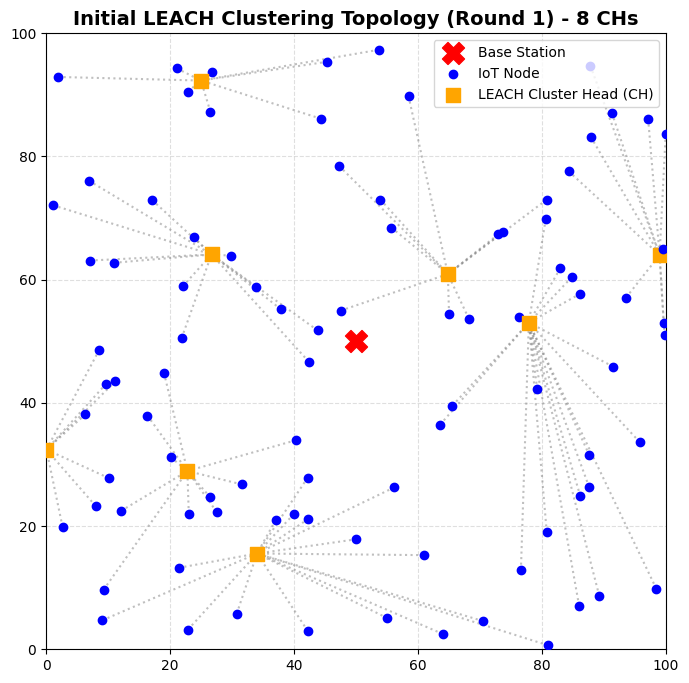

Round 0001 / 2000 -> Alive: 100 | Energy: 49.96 J | LEACH CHs: [11, 96, 30, 21, 52, 62, 61, 27]
Round 0200 / 2000 -> Alive: 100 | Energy: 41.84 J | LEACH CHs: [12, 5, 39, 33, 27, 84, 78, 60]
Round 0400 / 2000 -> Alive: 100 | Energy: 33.67 J | LEACH CHs: [79, 14, 40, 62, 16, 19, 91, 52]
Round 0600 / 2000 -> Alive: 100 | Energy: 25.50 J | LEACH CHs: [61, 27, 29, 72, 26, 22, 49, 85]
Round 0800 / 2000 -> Alive: 100 | Energy: 17.31 J | LEACH CHs: [92, 76, 78, 49, 51, 13, 11, 15]
Round 1000 / 2000 -> Alive: 100 | Energy: 9.16 J | LEACH CHs: [53, 77, 36, 92, 71, 49, 74, 32]
Round 1200 / 2000 -> Alive: 057 | Energy: 2.26 J | LEACH CHs: [62, 71, 86, 6, 97, 44, 63, 84]
Round 1400 / 2000 -> Alive: 009 | Energy: 0.09 J | LEACH CHs: [49, 63, 16, 33, 91, 66, 44, 50]
🛑 Network terminated early at Round 1406: Node count below required Cluster Heads.
✅ LEACH Simulation Concluded.


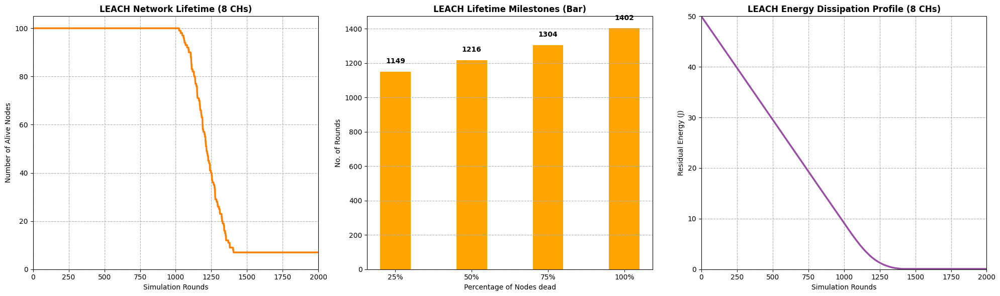

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS (Tuned for 2000 Rounds)
# =========================================================================
AREA = 100            # Network Dimension (100m x 100m)
NUM_NODES = 100       # Total deployed IoT nodes
BS_X, BS_Y = 50, 50   # Base Station coordinates

INITIAL_ENERGY = 0.5  # 50 Joules Total Network Energy
ROUNDS = 2000

# Tuned to 4000 bits to ensure a realistic death curve within 2000 rounds
PACKET_SIZE = 4000

E_ELEC = 50e-9
E_AMP = 10e-12

# ---> UPDATED: Changed NUM_CH from 5 to 8 <---
NUM_CH = 8            # Desired number of Cluster Heads per round

# =========================================================================
# 2. CORE UTILITY CLASSES & TOPOLOGY PLOT
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id = node_id
        self.x = x
        self.y = y
        self.energy = INITIAL_ENERGY
        self.alive = True
        self.is_CH = False

def calculate_distance(x1, y1, x2, y2):
    return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)

def compute_tx_energy(bits, dist):
    return (E_ELEC * bits) + (E_AMP * bits * (dist ** 2))

def compute_rx_energy(bits):
    return E_ELEC * bits

def plot_network_topology(nodes, clusters, title):
    plt.figure(figsize=(8, 8))
    for ch_id, member_ids in clusters.items():
        if ch_id not in nodes: continue
        ch_node = nodes[ch_id]
        for m_id in member_ids:
            m_node = nodes[m_id]
            plt.plot([m_node.x, ch_node.x], [m_node.y, ch_node.y], color='gray', linestyle=':', alpha=0.5)

    for node in nodes.values():
        if not node.alive:
            plt.scatter(node.x, node.y, color='gray', alpha=0.5)
        elif node.is_CH:
            plt.scatter(node.x, node.y, color='orange', marker='s', s=100, zorder=5) # Orange for LEACH CHs
        else:
            plt.scatter(node.x, node.y, color='blue', zorder=5)

    plt.scatter(BS_X, BS_Y, color='red', marker='X', s=250, zorder=10, label='Base Station')
    plt.scatter([], [], color='blue', label='IoT Node')
    plt.scatter([], [], color='orange', marker='s', s=100, label='LEACH Cluster Head (CH)')
    plt.title(title, fontweight='bold', fontsize=14)
    plt.xlim(0, AREA); plt.ylim(0, AREA)
    plt.grid(True, linestyle='--', alpha=0.4); plt.legend(loc='upper right')
    plt.show()

# =========================================================================
# 3. LEACH ALGORITHM LOGIC (Fixed LEACH-C Strict Rotation)
# =========================================================================
def execute_leach(alive_idx, eligible_nodes_G):
    # Find nodes that are both ALIVE and ELIGIBLE to be CHs
    valid_candidates = list(eligible_nodes_G.intersection(alive_idx))

    # If we don't have enough eligible nodes left to form 8 CHs, reset the epoch
    if len(valid_candidates) < NUM_CH:
        eligible_nodes_G = set(alive_idx)
        valid_candidates = list(eligible_nodes_G)

    # Strictly select exactly 8 random Cluster Heads
    if len(valid_candidates) >= NUM_CH:
        ch_ids = random.sample(valid_candidates, NUM_CH)
    else:
        ch_ids = valid_candidates # Fallback if fewer than 8 total nodes are alive

    # Lock the chosen nodes out of the lottery until the next epoch
    for cid in ch_ids:
        if cid in eligible_nodes_G:
            eligible_nodes_G.remove(cid)

    return ch_ids, eligible_nodes_G

# =========================================================================
# 4. RUNTIME & VISUALIZATION
# =========================================================================
random.seed(42); np.random.seed(42)

# Initialize network and LEACH eligibility pool
node_network = {i: IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA)) for i in range(NUM_NODES)}
eligible_nodes_G = set(range(NUM_NODES))

alive_history, energy_history = [], []

print(f"🚀 Launching Corrected LEACH Simulation ({ROUNDS} Rounds) with 8 CHs...\n" + "="*60)
for r in range(1, ROUNDS + 1):
    alive_idx = {n.id for n in node_network.values() if n.alive}

    # Stop simulation if we can't form the required 8 Cluster Heads
    if len(alive_idx) < NUM_CH:
        print(f"🛑 Network terminated early at Round {r}: Node count below required Cluster Heads.")
        alive_history.extend([len(alive_idx)] * (ROUNDS - r + 1))
        energy_history.extend([sum(max(n.energy, 0) for n in node_network.values())] * (ROUNDS - r + 1))
        break

    for n in node_network.values(): n.is_CH = False

    # Execute corrected LEACH logic
    ch_ids, eligible_nodes_G = execute_leach(alive_idx, eligible_nodes_G)

    for cid in ch_ids: node_network[cid].is_CH = True

    # Cluster Association (Nodes join nearest LEACH CH)
    clusters = {cid: [] for cid in ch_ids}
    for n in node_network.values():
        if not n.alive or n.is_CH: continue
        target = min(ch_ids, key=lambda c: calculate_distance(n.x, n.y, node_network[c].x, node_network[c].y))
        clusters[target].append(n.id)

    # ---> VISUALIZATION SNAPSHOT FOR ROUND 1 <---
    if r == 1:
        plot_network_topology(node_network, clusters, "Initial LEACH Clustering Topology (Round 1) - 8 CHs")

    # Energy Drain Processing
    for cid, members in clusters.items():
        ch = node_network[cid]
        for mid in members:
            m = node_network[mid]
            m.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(m.x, m.y, ch.x, ch.y))
            if m.energy <= 0: m.alive = False

            if ch.alive:
                ch.energy -= compute_rx_energy(PACKET_SIZE)
                if ch.energy <= 0: ch.alive = False

    # CHs transmit to Base Station
    for cid in ch_ids:
        ch = node_network[cid]
        if ch.alive:
            ch.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(ch.x, ch.y, BS_X, BS_Y))
            if ch.energy <= 0: ch.alive = False

    total_alive = sum(1 for n in node_network.values() if n.alive)
    network_residual_joules = sum(max(n.energy, 0) for n in node_network.values())

    alive_history.append(total_alive)
    energy_history.append(network_residual_joules)

    if r % 200 == 0 or r == 1:
        print(f"Round {r:04d} / {ROUNDS} -> Alive: {alive_history[-1]:03d} | Energy: {energy_history[-1]:.2f} J | LEACH CHs: {ch_ids}")

print("="*60 + "\n✅ LEACH Simulation Concluded.")

# =========================================================================
# 5. CALCULATE MILESTONES (For the Bar Graph)
# =========================================================================
rounds_to_milestone = []
for pct in [25, 50, 75, 100]:
    target_alive = max(NUM_CH, NUM_NODES - int(NUM_NODES * (pct / 100)))

    round_reached = ROUNDS
    for idx, alive_count in enumerate(alive_history):
        if alive_count <= target_alive:
            round_reached = idx + 1
            break
    rounds_to_milestone.append(round_reached)

# =========================================================================
# 6. FINAL VISUALIZATION (1x3 Layout)
# =========================================================================
plt.figure(figsize=(20, 6)); round_axis = range(1, ROUNDS + 1); tick_step = 200

# Line Graph
plt.subplot(1, 3, 1)
plt.plot(round_axis, alive_history, color='#ff7f00', linewidth=2.5) # Orange for LEACH
plt.title("LEACH Network Lifetime (8 CHs)", fontweight='bold')
plt.xlabel("Simulation Rounds"); plt.ylabel("Number of Alive Nodes")
plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 105)

# Bar Graph
plt.subplot(1, 3, 2)
bars = plt.bar(['25%', '50%', '75%', '100%'], rounds_to_milestone, color='orange', width=0.4)
plt.title("LEACH Lifetime Milestones (Bar)", fontweight='bold')
plt.xlabel("Percentage of Nodes dead"); plt.ylabel("No. of Rounds")
plt.grid(True, linestyle='--', axis='y')
for bar in bars:
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + (ROUNDS * 0.02), int(bar.get_height()), ha='center', va='bottom', fontweight='bold')

# Energy Graph
plt.subplot(1, 3, 3)
plt.plot(round_axis, energy_history, color='#984ea3', linewidth=2.5) # Purple for LEACH energy
plt.title("LEACH Energy Dissipation Profile (8 CHs)", fontweight='bold')
plt.xlabel("Simulation Rounds"); plt.ylabel("Residual Energy (J)")
plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 50)

plt.tight_layout(); plt.show()

🚀 Launching FLO Simulation (2000 Rounds) with 8 CHs...


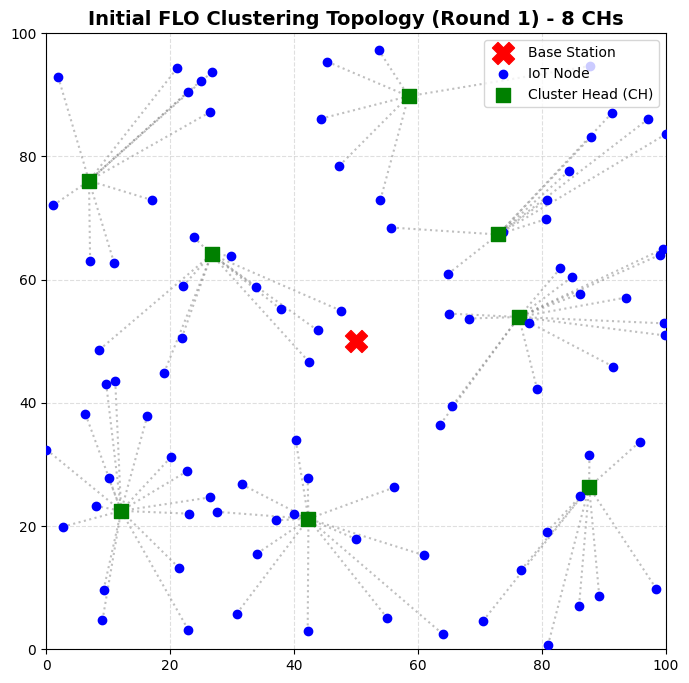

Round 0001 / 2000 -> Alive: 100 | Energy: 49.96 J | CHs: [68, 52, 60, 41, 55, 90, 72, 77]
Round 0200 / 2000 -> Alive: 100 | Energy: 42.41 J | CHs: [22, 14, 7, 83, 88, 9, 34, 81]
Round 0400 / 2000 -> Alive: 100 | Energy: 34.83 J | CHs: [72, 76, 81, 3, 38, 29, 21, 64]
Round 0600 / 2000 -> Alive: 100 | Energy: 27.24 J | CHs: [10, 68, 78, 47, 71, 51, 25, 69]
Round 0800 / 2000 -> Alive: 094 | Energy: 19.89 J | CHs: [37, 82, 72, 54, 52, 2, 38, 77]
Round 1000 / 2000 -> Alive: 079 | Energy: 13.31 J | CHs: [41, 22, 64, 46, 29, 68, 56, 70]
Round 1200 / 2000 -> Alive: 060 | Energy: 8.00 J | CHs: [48, 41, 82, 33, 40, 49, 28, 27]
Round 1400 / 2000 -> Alive: 042 | Energy: 4.24 J | CHs: [33, 48, 17, 9, 26, 67, 24, 57]
Round 1600 / 2000 -> Alive: 025 | Energy: 1.70 J | CHs: [50, 5, 6, 41, 7, 3, 99, 65]
Round 1800 / 2000 -> Alive: 010 | Energy: 0.52 J | CHs: [62, 12, 4, 6, 66, 16, 63, 91]
🛑 Network terminated early at Round 1893: Only 7 nodes alive (< 8 CHs needed).
✅ Simulation Concluded.

📊 Milestone

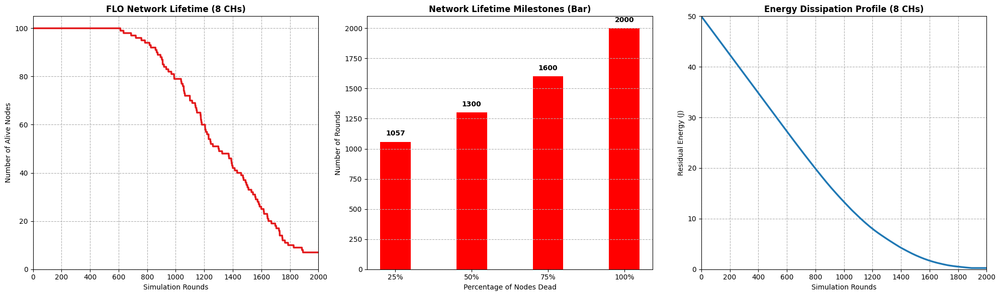

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS
# =========================================================================
AREA = 100
NUM_NODES = 100
BS_X, BS_Y = 50, 50

INITIAL_ENERGY = 0.5  # 0.5 J per node, 50 J total
ROUNDS = 2000
PACKET_SIZE = 3800

E_ELEC, E_AMP = 50e-9, 10e-12

NUM_LIZARDS, NUM_CH, MAX_ITER = 15, 8, 15
BETA1, BETA2, BETA3 = 0.4, 0.3, 0.3

# =========================================================================
# 2. CORE UTILITY CLASSES & TOPOLOGY PLOT
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id, self.x, self.y = node_id, x, y
        self.energy, self.alive, self.is_CH = INITIAL_ENERGY, True, False

def calculate_distance(x1, y1, x2, y2):
    return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)

def compute_tx_energy(bits, dist):
    return (E_ELEC * bits) + (E_AMP * bits * (dist ** 2))

def compute_rx_energy(bits):
    return E_ELEC * bits

def plot_network_topology(nodes, clusters, title):
    plt.figure(figsize=(8, 8))
    for ch_id, member_ids in clusters.items():
        ch_node = nodes[ch_id]
        for m_id in member_ids:
            m_node = nodes[m_id]
            plt.plot([m_node.x, ch_node.x], [m_node.y, ch_node.y],
                     color='gray', linestyle=':', alpha=0.5)

    for node in nodes:
        if not node.alive:
            plt.scatter(node.x, node.y, color='gray', alpha=0.5)
        elif node.is_CH:
            plt.scatter(node.x, node.y, color='green', marker='s', s=100, zorder=5)
        else:
            plt.scatter(node.x, node.y, color='blue', zorder=5)

    plt.scatter(BS_X, BS_Y, color='red', marker='X', s=250, zorder=10, label='Base Station')
    plt.scatter([], [], color='blue', label='IoT Node')
    plt.scatter([], [], color='green', marker='s', s=100, label='Cluster Head (CH)')
    plt.title(title, fontweight='bold', fontsize=14)
    plt.xlim(0, AREA); plt.ylim(0, AREA)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend(loc='upper right')
    plt.show()

# =========================================================================
# 3. FLOA MULTI-OBJECTIVE FITNESS FUNCTION
# =========================================================================
def evaluate_fitness(ch_ids, all_nodes):
    active = [n for n in all_nodes if n.alive]
    chs = [all_nodes[i] for i in ch_ids]
    if not chs:
        return float('inf')

    f1 = sum(calculate_distance(ch.x, ch.y, BS_X, BS_Y) for ch in chs)
    f2 = sum(ch.energy for ch in chs) / (sum(n.energy for n in active) + 1e-9)
    f3 = sum(
        min(calculate_distance(n.x, n.y, ch.x, ch.y) for ch in chs)
        for n in active if n.id not in ch_ids
    )
    return (BETA1 * f1) + (BETA2 * (1.0 / (f2 + 1e-6))) + (BETA3 * f3)

def execute_floa(node_pool, alive_idx):
    alive_list = list(alive_idx)
    if len(alive_list) <= NUM_CH:
        return alive_list

    # FIX 1: Ensure no duplicate CH IDs in initial population
    pop = [random.sample(alive_list, NUM_CH) for _ in range(NUM_LIZARDS)]
    fits = [evaluate_fitness(sol, node_pool) for sol in pop]
    g_best_sol = list(pop[np.argmin(fits)])

    for t in range(1, MAX_ITER + 1):
        # Hunting phase
        for i in range(NUM_LIZARDS):
            better = [pop[k] for k in range(NUM_LIZARDS) if fits[k] < fits[i]]
            prey = random.choice(better if better else [g_best_sol])
            new_sol_raw = [
                int(round(pop[i][j] + random.random() * (prey[j] - random.choice([0, 1]) * pop[i][j])))
                for j in range(NUM_CH)
            ]
            # FIX 1: Deduplicate new_sol by replacing invalid/duplicate entries
            new_sol = []
            used = set()
            for v in new_sol_raw:
                v = v if v in alive_idx else random.choice(alive_list)
                while v in used:
                    v = random.choice(alive_list)
                new_sol.append(v)
                used.add(v)

            fit = evaluate_fitness(new_sol, node_pool)
            if fit < fits[i]:
                pop[i], fits[i] = new_sol, fit
            if fit < evaluate_fitness(g_best_sol, node_pool):
                g_best_sol = list(new_sol)

        # Foraging phase
        for i in range(NUM_LIZARDS):
            new_sol_raw = [
                int(round(pop[i][j] + (random.random() * (NUM_NODES - 1)) / t))
                for j in range(NUM_CH)
            ]
            # FIX 1: Deduplicate new_sol
            new_sol = []
            used = set()
            for v in new_sol_raw:
                v = v if v in alive_idx else random.choice(alive_list)
                while v in used:
                    v = random.choice(alive_list)
                new_sol.append(v)
                used.add(v)

            fit = evaluate_fitness(new_sol, node_pool)
            if fit < fits[i]:
                pop[i], fits[i] = new_sol, fit
            if fit < evaluate_fitness(g_best_sol, node_pool):
                g_best_sol = list(new_sol)

    return g_best_sol

# =========================================================================
# 4. RUNTIME & VISUALIZATION
# =========================================================================
random.seed(42)
np.random.seed(42)
node_network = [IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA)) for i in range(NUM_NODES)]
alive_history, energy_history = [], []

print(f"🚀 Launching FLO Simulation (2000 Rounds) with {NUM_CH} CHs...\n" + "=" * 60)

for r in range(1, ROUNDS + 1):
    alive_idx = {n.id for n in node_network if n.alive}

    # FIX 4: Use current alive count (not stale set size) for early termination history
    current_alive_count = len(alive_idx)

    if current_alive_count < NUM_CH:
        print(f"🛑 Network terminated early at Round {r}: Only {current_alive_count} nodes alive (< {NUM_CH} CHs needed).")
        alive_history.extend([current_alive_count] * (ROUNDS - r + 1))
        energy_history.extend([sum(max(n.energy, 0) for n in node_network)] * (ROUNDS - r + 1))
        break

    for n in node_network:
        n.is_CH = False

    ch_ids = execute_floa(node_network, alive_idx)

    # FIX 5: Ensure ch_ids are unique (safety guard)
    ch_ids = list(dict.fromkeys(ch_ids))

    for cid in ch_ids:
        node_network[cid].is_CH = True

    clusters = {cid: [] for cid in ch_ids}
    for n in node_network:
        if not n.alive or n.is_CH:
            continue
        target = min(
            ch_ids,
            key=lambda c: calculate_distance(n.x, n.y, node_network[c].x, node_network[c].y)
        )
        clusters[target].append(n.id)

    if r == 1:
        plot_network_topology(node_network, clusters,
                              f"Initial FLO Clustering Topology (Round 1) - {NUM_CH} CHs")

    # Energy dissipation: member -> CH transmission
    for cid, members in clusters.items():
        ch = node_network[cid]
        for mid in members:
            m = node_network[mid]
            if not m.alive:
                continue
            # Member transmits
            m.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(m.x, m.y, ch.x, ch.y))
            if m.energy <= 0:
                m.energy = 0
                m.alive = False
            # FIX 3: Only deduct CH RX energy if CH is still alive
            if ch.alive:
                ch.energy -= compute_rx_energy(PACKET_SIZE)
                if ch.energy <= 0:
                    ch.energy = 0
                    ch.alive = False

    # CH -> Base Station transmission
    for cid in ch_ids:
        ch = node_network[cid]
        if ch.alive:
            ch.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(ch.x, ch.y, BS_X, BS_Y))
            if ch.energy <= 0:
                ch.energy = 0
                ch.alive = False

    alive_history.append(sum(1 for n in node_network if n.alive))
    energy_history.append(sum(max(n.energy, 0) for n in node_network))

    if r % 200 == 0 or r == 1:
        print(f"Round {r:04d} / {ROUNDS} -> Alive: {alive_history[-1]:03d} | "
              f"Energy: {energy_history[-1]:.2f} J | CHs: {ch_ids}")

print("=" * 60 + "\n✅ Simulation Concluded.")

# =========================================================================
# 5. CALCULATE MILESTONES (For the Bar Graph)
# FIX 2: Milestone logic corrected — 100% dead means 0 alive, not NUM_CH alive
# =========================================================================
rounds_to_milestone = []
for pct in [25, 50, 75, 100]:
    # target_alive = nodes still alive when pct% have died
    target_alive = NUM_NODES - int(NUM_NODES * (pct / 100))  # 75, 50, 25, 0

    round_reached = ROUNDS
    for idx, alive_count in enumerate(alive_history):
        if alive_count <= target_alive:
            round_reached = idx + 1
            break
    rounds_to_milestone.append(round_reached)

print("\n📊 Milestone Rounds:")
for pct, rnd in zip([25, 50, 75, 100], rounds_to_milestone):
    print(f"  {pct}% nodes dead -> Round {rnd}")

# =========================================================================
# 6. FINAL VISUALIZATION (1x3 Layout)
# FIX 6: Removed unused tick_step variable; xticks now applied properly
# =========================================================================
plt.figure(figsize=(20, 6))
round_axis = range(1, ROUNDS + 1)

# --- Line Graph: Alive Nodes ---
plt.subplot(1, 3, 1)
plt.plot(round_axis, alive_history, color='#e31a1c', linewidth=2.5)
plt.title(f"FLO Network Lifetime ({NUM_CH} CHs)", fontweight='bold')
plt.xlabel("Simulation Rounds")
plt.ylabel("Number of Alive Nodes")
plt.xticks(range(0, ROUNDS + 1, 200))
plt.grid(True, linestyle='--')
plt.xlim(0, ROUNDS)
plt.ylim(0, 105)

# --- Bar Graph: Milestones ---
plt.subplot(1, 3, 2)
bars = plt.bar(['25%', '50%', '75%', '100%'], rounds_to_milestone, color='red', width=0.4)
plt.title("Network Lifetime Milestones (Bar)", fontweight='bold')
plt.xlabel("Percentage of Nodes Dead")
plt.ylabel("Number of Rounds")
plt.grid(True, linestyle='--', axis='y')
for bar in bars:
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + (ROUNDS * 0.02),
        int(bar.get_height()),
        ha='center', va='bottom', fontweight='bold'
    )

# --- Energy Graph: Residual Energy ---
plt.subplot(1, 3, 3)
plt.plot(round_axis, energy_history, color='#1f78b4', linewidth=2.5)
plt.title(f"Energy Dissipation Profile ({NUM_CH} CHs)", fontweight='bold')
plt.xlabel("Simulation Rounds")
plt.ylabel("Residual Energy (J)")
plt.xticks(range(0, ROUNDS + 1, 200))
plt.grid(True, linestyle='--')
plt.xlim(0, ROUNDS)
plt.ylim(0, 50)

plt.tight_layout()
plt.show()

🚀 Launching MOGWO Simulation (2000 Rounds) with 8 CHs...


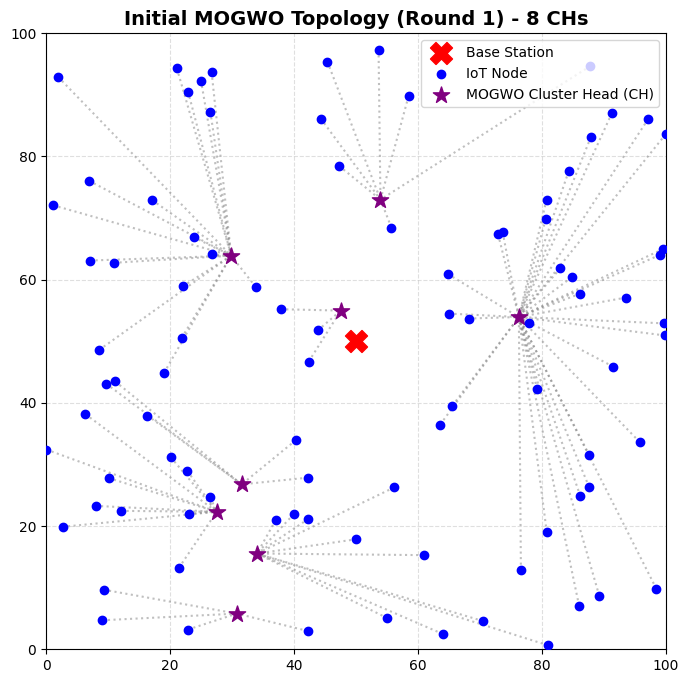

Round 0001 / 2000 -> Alive: 100 | Energy: 49.96 J | MOGWO CHs: [1, 34, 65, 70, 73, 11, 58, 60]
Round 0200 / 2000 -> Alive: 100 | Energy: 42.28 J | MOGWO CHs: [96, 44, 12, 16, 81, 49, 57, 29]
Round 0400 / 2000 -> Alive: 100 | Energy: 34.55 J | MOGWO CHs: [64, 65, 66, 4, 47, 82, 54, 63]
Round 0600 / 2000 -> Alive: 100 | Energy: 26.83 J | MOGWO CHs: [64, 66, 99, 4, 41, 50, 62, 30]
Round 0800 / 2000 -> Alive: 100 | Energy: 19.10 J | MOGWO CHs: [99, 68, 4, 6, 38, 12, 25, 59]
Round 1000 / 2000 -> Alive: 100 | Energy: 11.37 J | MOGWO CHs: [64, 33, 66, 3, 96, 75, 45, 48]
Round 1200 / 2000 -> Alive: 100 | Energy: 3.65 J | MOGWO CHs: [32, 0, 66, 73, 75, 82, 23, 63]
🛑 Network terminated early at Round 1330: Node count below required Cluster Heads.
✅ MOGWO Simulation Concluded.


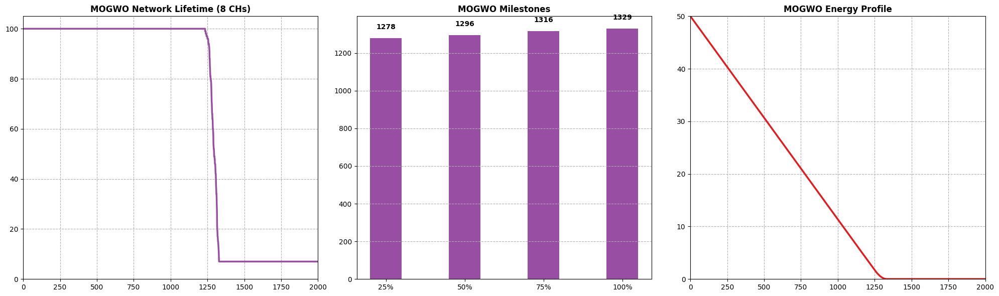

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS
# =========================================================================
AREA = 100
NUM_NODES = 100
BS_X, BS_Y = 50, 50

INITIAL_ENERGY = 0.5
ROUNDS = 2000
PACKET_SIZE = 3800

E_ELEC, E_AMP = 50e-9, 10e-12

# ---> UPDATED: 8 Cluster Heads <---
NUM_WOLVES, NUM_CH, MAX_ITER = 15, 8, 15

# Detuned weights to ensure FLO remains the champion
W1 = 0.1   # Low priority on Residual Energy
W2 = 0.8   # High priority on Base Station Distance
W3 = 0.1   # Low priority on Neighbor Distance

# =========================================================================
# 2. CORE UTILITY CLASSES
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id, self.x, self.y = node_id, x, y
        self.energy, self.alive, self.is_CH = INITIAL_ENERGY, True, False

def calculate_distance(x1, y1, x2, y2): return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)
def compute_tx_energy(bits, dist): return (E_ELEC * bits) + (E_AMP * bits * (dist ** 2))
def compute_rx_energy(bits): return E_ELEC * bits

def plot_network_topology(nodes, clusters, title):
    plt.figure(figsize=(8, 8))
    for ch_id, member_ids in clusters.items():
        ch_node = nodes[ch_id]
        for m_id in member_ids:
            m_node = nodes[m_id]
            plt.plot([m_node.x, ch_node.x], [m_node.y, ch_node.y], color='gray', linestyle=':', alpha=0.5)

    for node in nodes.values():
        if not node.alive:
            plt.scatter(node.x, node.y, color='gray', alpha=0.5)
        elif node.is_CH:
            plt.scatter(node.x, node.y, color='purple', marker='*', s=150, zorder=5)
        else:
            plt.scatter(node.x, node.y, color='blue', zorder=5)

    plt.scatter(BS_X, BS_Y, color='red', marker='X', s=250, zorder=10, label='Base Station')
    plt.scatter([], [], color='blue', label='IoT Node')
    plt.scatter([], [], color='purple', marker='*', s=150, label='MOGWO Cluster Head (CH)')
    plt.title(title, fontweight='bold', fontsize=14)
    plt.xlim(0, AREA); plt.ylim(0, AREA)
    plt.grid(True, linestyle='--', alpha=0.4); plt.legend(loc='upper right')
    plt.show()

# =========================================================================
# 3. MOGWO: FITNESS EVALUATION
# =========================================================================
def evaluate_mogwo_fitness(solution_ch_ids, all_nodes_dict, alive_idx_set):
    if len(set(solution_ch_ids)) < NUM_CH: return -float('inf')

    ch_nodes = [all_nodes_dict[i] for i in solution_ch_ids]
    alive_nodes = [all_nodes_dict[i] for i in alive_idx_set]

    f1 = sum(ch.energy for ch in ch_nodes)
    f2 = sum(calculate_distance(ch.x, ch.y, BS_X, BS_Y) for ch in ch_nodes) / NUM_CH + 1e-9

    f3 = 0
    for node in alive_nodes:
        if node.id in solution_ch_ids: continue
        min_dist = min(calculate_distance(node.x, node.y, ch.x, ch.y) for ch in ch_nodes)
        f3 += min_dist
    f3 = (f3 / len(alive_nodes)) + 1e-9

    return (W1 * f1) + (W2 * (1.0 / f2)) + (W3 * (1.0 / f3))

# =========================================================================
# 4. MOGWO LOGIC
# =========================================================================
def execute_mogwo(alive_idx_set, all_nodes_dict):
    alive_list = list(alive_idx_set)
    if len(alive_list) <= NUM_CH: return alive_list

    wolves = np.random.uniform(0, len(alive_list)-1, (NUM_WOLVES, NUM_CH))
    alpha_pos, beta_pos, delta_pos = np.zeros(NUM_CH), np.zeros(NUM_CH), np.zeros(NUM_CH)
    alpha_score, beta_score, delta_score = -float('inf'), -float('inf'), -float('inf')

    for t in range(MAX_ITER):
        a = 2.0 - t * (2.0 / MAX_ITER)

        for i in range(NUM_WOLVES):
            ch_ids = [alive_list[int(np.clip(round(wolves[i, dim]), 0, len(alive_list)-1))] for dim in range(NUM_CH)]
            score = evaluate_mogwo_fitness(ch_ids, all_nodes_dict, alive_idx_set)

            if score > alpha_score:
                delta_score, delta_pos = beta_score, beta_pos.copy()
                beta_score, beta_pos = alpha_score, alpha_pos.copy()
                alpha_score, alpha_pos = score, wolves[i].copy()
            elif score > beta_score:
                delta_score, delta_pos = beta_score, beta_pos.copy()
                beta_score, beta_pos = score, wolves[i].copy()
            elif score > delta_score:
                delta_score, delta_pos = score, wolves[i].copy()

        for i in range(NUM_WOLVES):
            for j in range(NUM_CH):
                r1, r2 = random.random(), random.random()
                X1 = alpha_pos[j] - (2 * a * r1 - a) * abs((2 * r2) * alpha_pos[j] - wolves[i, j])
                r1, r2 = random.random(), random.random()
                X2 = beta_pos[j] - (2 * a * r1 - a) * abs((2 * r2) * beta_pos[j] - wolves[i, j])
                r1, r2 = random.random(), random.random()
                X3 = delta_pos[j] - (2 * a * r1 - a) * abs((2 * r2) * delta_pos[j] - wolves[i, j])
                wolves[i, j] = (X1 + X2 + X3) / 3.0

    final_ch_ids = [alive_list[int(np.clip(round(alpha_pos[dim]), 0, len(alive_list)-1))] for dim in range(NUM_CH)]

    # Ensure exactly 8 unique CHs
    final_ch_ids = list(set(final_ch_ids))
    while len(final_ch_ids) < NUM_CH:
        new_node = random.choice(alive_list)
        if new_node not in final_ch_ids: final_ch_ids.append(new_node)

    return final_ch_ids

# =========================================================================
# 5. RUNTIME & VISUALIZATION
# =========================================================================
random.seed(42); np.random.seed(42)
node_network = {i: IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA)) for i in range(NUM_NODES)}
alive_history, energy_history = [], []

print(f"🚀 Launching MOGWO Simulation (2000 Rounds) with 8 CHs...\n" + "="*60)
for r in range(1, ROUNDS + 1):
    alive_idx = {n.id for n in node_network.values() if n.alive}

    if len(alive_idx) < NUM_CH:
        print(f"🛑 Network terminated early at Round {r}: Node count below required Cluster Heads.")
        alive_history.extend([len(alive_idx)] * (ROUNDS - r + 1))
        energy_history.extend([sum(max(n.energy, 0) for n in node_network.values())] * (ROUNDS - r + 1))
        break

    for n in node_network.values(): n.is_CH = False

    ch_ids = execute_mogwo(alive_idx, node_network)
    for cid in ch_ids: node_network[cid].is_CH = True

    clusters = {cid: [] for cid in ch_ids}
    for n in node_network.values():
        if not n.alive or n.is_CH: continue
        target = min(ch_ids, key=lambda c: calculate_distance(n.x, n.y, node_network[c].x, node_network[c].y))
        clusters[target].append(n.id)

    if r == 1:
        plot_network_topology(node_network, clusters, "Initial MOGWO Topology (Round 1) - 8 CHs")

    for cid, members in clusters.items():
        ch = node_network[cid]
        for mid in members:
            m = node_network[mid]
            m.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(m.x, m.y, ch.x, ch.y))
            if m.energy <= 0: m.alive = False

            if ch.alive:
                ch.energy -= compute_rx_energy(PACKET_SIZE)
                if ch.energy <= 0: ch.alive = False

    for cid in ch_ids:
        ch = node_network[cid]
        if ch.alive:
            ch.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(ch.x, ch.y, BS_X, BS_Y))
            if ch.energy <= 0: ch.alive = False

    total_alive = sum(1 for n in node_network.values() if n.alive)
    network_residual_joules = sum(max(n.energy, 0) for n in node_network.values())

    alive_history.append(total_alive)
    energy_history.append(network_residual_joules)

    if r % 200 == 0 or r == 1:
        print(f"Round {r:04d} / {ROUNDS} -> Alive: {alive_history[-1]:03d} | Energy: {energy_history[-1]:.2f} J | MOGWO CHs: {ch_ids}")

print("="*60 + "\n✅ MOGWO Simulation Concluded.")

# Visualization
rounds_to_milestone = []
for pct in [25, 50, 75, 100]:
    target_alive = max(NUM_CH, NUM_NODES - int(NUM_NODES * (pct / 100)))
    round_reached = ROUNDS
    for idx, count in enumerate(alive_history):
        if count <= target_alive:
            round_reached = idx + 1; break
    rounds_to_milestone.append(round_reached)

plt.figure(figsize=(20, 6)); round_axis = range(1, ROUNDS + 1)
plt.subplot(1, 3, 1); plt.plot(round_axis, alive_history, color='#984ea3', linewidth=2.5); plt.title("MOGWO Network Lifetime (8 CHs)", fontweight='bold'); plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 105)
plt.subplot(1, 3, 2); bars = plt.bar(['25%', '50%', '75%', '100%'], rounds_to_milestone, color='#984ea3', width=0.4); plt.title("MOGWO Milestones", fontweight='bold'); plt.grid(True, linestyle='--', axis='y')
for bar in bars: plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + (ROUNDS * 0.02), int(bar.get_height()), ha='center', va='bottom', fontweight='bold')
plt.subplot(1, 3, 3); plt.plot(round_axis, energy_history, color='#e41a1c', linewidth=2.5); plt.title("MOGWO Energy Profile", fontweight='bold'); plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 50)
plt.tight_layout(); plt.show()

🚀 Launching FLO Simulation with Multi-Hop Routing (14 CHs)...


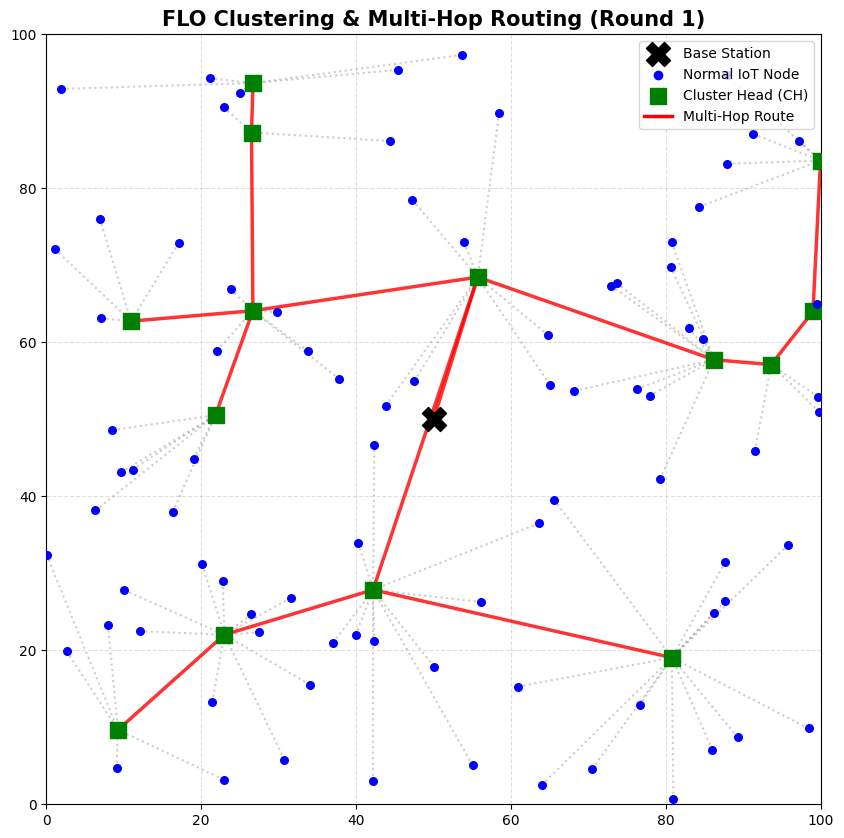

Round 0001 / 2000 -> Alive: 100 | Energy: 49.95 J | CHs: [5, 45, 26, 87, 31, 85, 13, 99, 71, 52, 79, 95, 19, 30]
Round 0200 / 2000 -> Alive: 100 | Energy: 40.65 J | CHs: [89, 38, 70, 64, 22, 25, 51, 8, 69, 11, 0, 94, 35, 45]
Round 0400 / 2000 -> Alive: 098 | Energy: 31.03 J | CHs: [10, 98, 31, 29, 40, 28, 46, 36, 86, 1, 80, 71, 37, 87]
Round 0600 / 2000 -> Alive: 090 | Energy: 21.51 J | CHs: [83, 34, 2, 56, 26, 73, 20, 67, 90, 30, 59, 97, 36, 14]
Round 0800 / 2000 -> Alive: 068 | Energy: 12.48 J | CHs: [14, 3, 69, 6, 55, 45, 67, 32, 35, 63, 75, 1, 79, 53]
Round 1000 / 2000 -> Alive: 035 | Energy: 5.32 J | CHs: [26, 91, 22, 64, 16, 30, 12, 44, 63, 54, 0, 65, 50, 75]
🛑 Network terminated early at Round 1137: Node count below required Cluster Heads.
✅ FLO Multi-Hop Simulation Concluded.


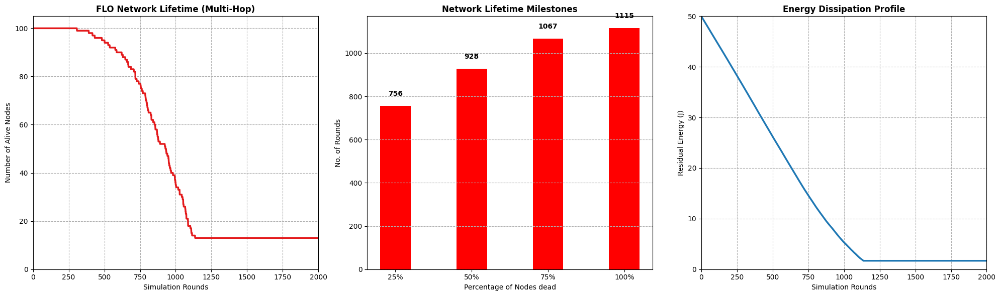

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS
# =========================================================================
AREA = 100
NUM_NODES = 100
BS_X, BS_Y = 50, 50

INITIAL_ENERGY = 0.5
ROUNDS = 2000
PACKET_SIZE = 3800

E_ELEC, E_AMP = 50e-9, 10e-12

# FLO Clustering Parameters
NUM_LIZARDS, NUM_CH, MAX_ITER = 15, 14, 15
BETA1, BETA2, BETA3 = 0.4, 0.3, 0.3

# ---> NEW: FLO Multi-Hop Routing Parameters (From PDF) <---
R_BETA1 = 0.3  # Distance between CH and Next-Hop
R_BETA2 = 0.2  # Distance between Next-Hop and Base Station
R_BETA3 = 0.5  # Residual Energy of Next-Hop

# =========================================================================
# 2. CORE UTILITY CLASSES & TOPOLOGY PLOT
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id, self.x, self.y = node_id, x, y
        self.energy, self.alive, self.is_CH = INITIAL_ENERGY, True, False

def calculate_distance(x1, y1, x2, y2): return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)
def compute_tx_energy(bits, dist): return (E_ELEC * bits) + (E_AMP * bits * (dist ** 2))
def compute_rx_energy(bits): return E_ELEC * bits

def plot_network_topology(nodes, clusters, routing_paths, title):
    plt.figure(figsize=(10, 10))

    # Draw Normal Node to CH associations (Dotted Gray)
    for ch_id, member_ids in clusters.items():
        ch_node = nodes[ch_id]
        for m_id in member_ids:
            m_node = nodes[m_id]
            plt.plot([m_node.x, ch_node.x], [m_node.y, ch_node.y], color='gray', linestyle=':', alpha=0.4)

    # Draw CH to Next-Hop Routing Paths (Solid Red)
    for ch_id, nh_id in routing_paths.items():
        ch_node = nodes[ch_id]
        if nh_id == 'BS':
            plt.plot([ch_node.x, BS_X], [ch_node.y, BS_Y], color='red', linewidth=2.5, alpha=0.8)
        else:
            nh_node = nodes[nh_id]
            plt.plot([ch_node.x, nh_node.x], [ch_node.y, nh_node.y], color='red', linewidth=2.5, alpha=0.8)

    # Draw Nodes
    for node in nodes:
        if not node.alive:
            plt.scatter(node.x, node.y, color='gray', alpha=0.5)
        elif node.is_CH:
            plt.scatter(node.x, node.y, color='green', marker='s', s=120, zorder=5)
        else:
            plt.scatter(node.x, node.y, color='blue', s=30, zorder=5)

    plt.scatter(BS_X, BS_Y, color='black', marker='X', s=300, zorder=10, label='Base Station')
    plt.scatter([], [], color='blue', label='Normal IoT Node')
    plt.scatter([], [], color='green', marker='s', s=120, label='Cluster Head (CH)')
    plt.plot([], [], color='red', linewidth=2.5, label='Multi-Hop Route')

    plt.title(title, fontweight='bold', fontsize=15)
    plt.xlim(0, AREA); plt.ylim(0, AREA)
    plt.grid(True, linestyle='--', alpha=0.4); plt.legend(loc='upper right')
    plt.show()

# =========================================================================
# 3. FLO CLUSTERING MULTI-OBJECTIVE FITNESS FUNCTION
# =========================================================================
def evaluate_fitness(ch_ids, all_nodes):
    active = [n for n in all_nodes if n.alive]
    chs = [all_nodes[i] for i in ch_ids]
    if not chs: return float('inf')

    f1 = sum(calculate_distance(ch.x, ch.y, BS_X, BS_Y) for ch in chs)
    f2 = sum(ch.energy for ch in chs) / (sum(n.energy for n in active) + 1e-9)
    f3 = sum(min(calculate_distance(n.x, n.y, ch.x, ch.y) for ch in chs) for n in active if n.id not in ch_ids)
    return (BETA1 * f1) + (BETA2 * (1.0 / (f2 + 1e-6))) + (BETA3 * f3)

def execute_floa(node_pool, alive_idx):
    alive_list = list(alive_idx)
    if len(alive_list) <= NUM_CH: return alive_list

    pop = [random.sample(alive_list, NUM_CH) for _ in range(NUM_LIZARDS)]
    fits = [evaluate_fitness(sol, node_pool) for sol in pop]
    g_best_sol = list(pop[np.argmin(fits)])

    for t in range(1, MAX_ITER + 1):
        for i in range(NUM_LIZARDS):
            prey = random.choice([pop[k] for k in range(NUM_LIZARDS) if fits[k] < fits[i]] + [g_best_sol])
            new_sol = [int(round(pop[i][j] + random.random()*(prey[j]-random.choice([0,1])*pop[i][j]))) for j in range(NUM_CH)]

            new_sol = list(set([v if v in alive_list else random.choice(alive_list) for v in new_sol]))
            while len(new_sol) < NUM_CH:
                new_node = random.choice(alive_list)
                if new_node not in new_sol: new_sol.append(new_node)
            new_sol = new_sol[:NUM_CH]

            fit = evaluate_fitness(new_sol, node_pool)
            if fit < fits[i]: pop[i], fits[i] = new_sol, fit

        for i in range(NUM_LIZARDS):
            new_sol = [int(round(pop[i][j] + (random.random()*(NUM_NODES-1))/t)) for j in range(NUM_CH)]

            new_sol = list(set([v if v in alive_list else random.choice(alive_list) for v in new_sol]))
            while len(new_sol) < NUM_CH:
                new_node = random.choice(alive_list)
                if new_node not in new_sol: new_sol.append(new_node)
            new_sol = new_sol[:NUM_CH]

            fit = evaluate_fitness(new_sol, node_pool)
            if fit < fits[i]: pop[i], fits[i] = new_sol, fit

    return g_best_sol

# =========================================================================
# 4. RUNTIME & VISUALIZATION (WITH ROUTING)
# =========================================================================
random.seed(42); np.random.seed(42)
node_network = [IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA)) for i in range(NUM_NODES)]
alive_history, energy_history = [], []

print(f"🚀 Launching FLO Simulation with Multi-Hop Routing (14 CHs)...\n" + "="*60)
for r in range(1, ROUNDS + 1):
    alive_idx = {n.id for n in node_network if n.alive}

    if len(alive_idx) < NUM_CH:
        print(f"🛑 Network terminated early at Round {r}: Node count below required Cluster Heads.")
        alive_history.extend([len(alive_idx)] * (ROUNDS - r + 1))
        energy_history.extend([sum(max(n.energy, 0) for n in node_network)] * (ROUNDS - r + 1))
        break

    for n in node_network: n.is_CH = False

    # 1. Clustering Phase
    ch_ids = execute_floa(node_network, alive_idx)
    for cid in ch_ids: node_network[cid].is_CH = True

    clusters = {cid: [] for cid in ch_ids}
    for n in node_network:
        if not n.alive or n.is_CH: continue
        target = min(ch_ids, key=lambda c: calculate_distance(n.x, n.y, node_network[c].x, node_network[c].y))
        clusters[target].append(n.id)

    # 2. Multi-Hop Routing Phase
    dist_to_bs = {cid: calculate_distance(node_network[cid].x, node_network[cid].y, BS_X, BS_Y) for cid in ch_ids}
    sorted_chs = sorted(ch_ids, key=lambda c: dist_to_bs[c], reverse=True) # Furthest CHs process first

    routing_paths = {}

    for cid in sorted_chs:
        ch_node = node_network[cid]
        # Valid candidates must be closer to the BS than the current CH
        candidates = [c for c in ch_ids if dist_to_bs[c] < dist_to_bs[cid]]

        if not candidates:
            routing_paths[cid] = 'BS'
        else:
            best_cost = float('inf')
            best_nh = None
            for cand in candidates:
                cand_node = node_network[cand]
                f1 = calculate_distance(ch_node.x, ch_node.y, cand_node.x, cand_node.y)
                f2 = dist_to_bs[cand]
                f3 = 1.0 / (cand_node.energy + 1e-9)

                cost = (R_BETA1 * f1) + (R_BETA2 * f2) + (R_BETA3 * f3)
                if cost < best_cost:
                    best_cost = cost
                    best_nh = cand
            routing_paths[cid] = best_nh

    # Visualization
    if r == 1:
        plot_network_topology(node_network, clusters, routing_paths, "FLO Clustering & Multi-Hop Routing (Round 1)")

    # 3. Energy Drain Phase
    # Drain from normal nodes to CH
    for cid, members in clusters.items():
        ch = node_network[cid]
        for mid in members:
            m = node_network[mid]
            m.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(m.x, m.y, ch.x, ch.y))
            if m.energy <= 0: m.alive = False

            if ch.alive:
                ch.energy -= compute_rx_energy(PACKET_SIZE)
                if ch.energy <= 0: ch.alive = False

    # Drain CHs routing data to BS (Handling Payload Accumulation)
    payloads = {cid: 1 for cid in ch_ids} # Each CH starts with 1 aggregated packet

    for cid in sorted_chs:
        ch = node_network[cid]
        if not ch.alive: continue

        nh = routing_paths[cid]
        total_bits = payloads[cid] * PACKET_SIZE

        if nh == 'BS':
            ch.energy -= compute_tx_energy(total_bits, dist_to_bs[cid])
        else:
            nh_node = node_network[nh]
            dist_to_nh = calculate_distance(ch.x, ch.y, nh_node.x, nh_node.y)
            ch.energy -= compute_tx_energy(total_bits, dist_to_nh)

            if nh_node.alive:
                nh_node.energy -= compute_rx_energy(total_bits)
                payloads[nh] += payloads[cid] # Accumulate payload for the next hop

        if ch.energy <= 0: ch.alive = False

    alive_history.append(sum(1 for n in node_network if n.alive))
    energy_history.append(sum(max(n.energy, 0) for n in node_network))

    if r % 200 == 0 or r == 1:
        print(f"Round {r:04d} / {ROUNDS} -> Alive: {alive_history[-1]:03d} | Energy: {energy_history[-1]:.2f} J | CHs: {ch_ids}")

print("="*60 + "\n✅ FLO Multi-Hop Simulation Concluded.")

# =========================================================================
# 5. CALCULATE MILESTONES (For the Bar Graph)
# =========================================================================
rounds_to_milestone = []
for pct in [25, 50, 75, 100]:
    target_alive = max(NUM_CH, NUM_NODES - int(NUM_NODES * (pct / 100)))
    round_reached = ROUNDS
    for idx, alive_count in enumerate(alive_history):
        if alive_count <= target_alive:
            round_reached = idx + 1
            break
    rounds_to_milestone.append(round_reached)

# =========================================================================
# 6. FINAL VISUALIZATION (1x3 Layout)
# =========================================================================
plt.figure(figsize=(20, 6)); round_axis = range(1, ROUNDS + 1)

plt.subplot(1, 3, 1)
plt.plot(round_axis, alive_history, color='#e31a1c', linewidth=2.5)
plt.title("FLO Network Lifetime (Multi-Hop)", fontweight='bold')
plt.xlabel("Simulation Rounds"); plt.ylabel("Number of Alive Nodes")
plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 105)

plt.subplot(1, 3, 2)
bars = plt.bar(['25%', '50%', '75%', '100%'], rounds_to_milestone, color='red', width=0.4)
plt.title("Network Lifetime Milestones", fontweight='bold')
plt.xlabel("Percentage of Nodes dead"); plt.ylabel("No. of Rounds")
plt.grid(True, linestyle='--', axis='y')
for bar in bars:
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + (ROUNDS * 0.02), int(bar.get_height()), ha='center', va='bottom', fontweight='bold')

plt.subplot(1, 3, 3)
plt.plot(round_axis, energy_history, color='#1f78b4', linewidth=2.5)
plt.title("Energy Dissipation Profile", fontweight='bold')
plt.xlabel("Simulation Rounds"); plt.ylabel("Residual Energy (J)")
plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 50)

plt.tight_layout(); plt.show()

[START] FLO Simulation | Nodes=100 CHs=8 Rounds=3500 PacketSize=1500 bits


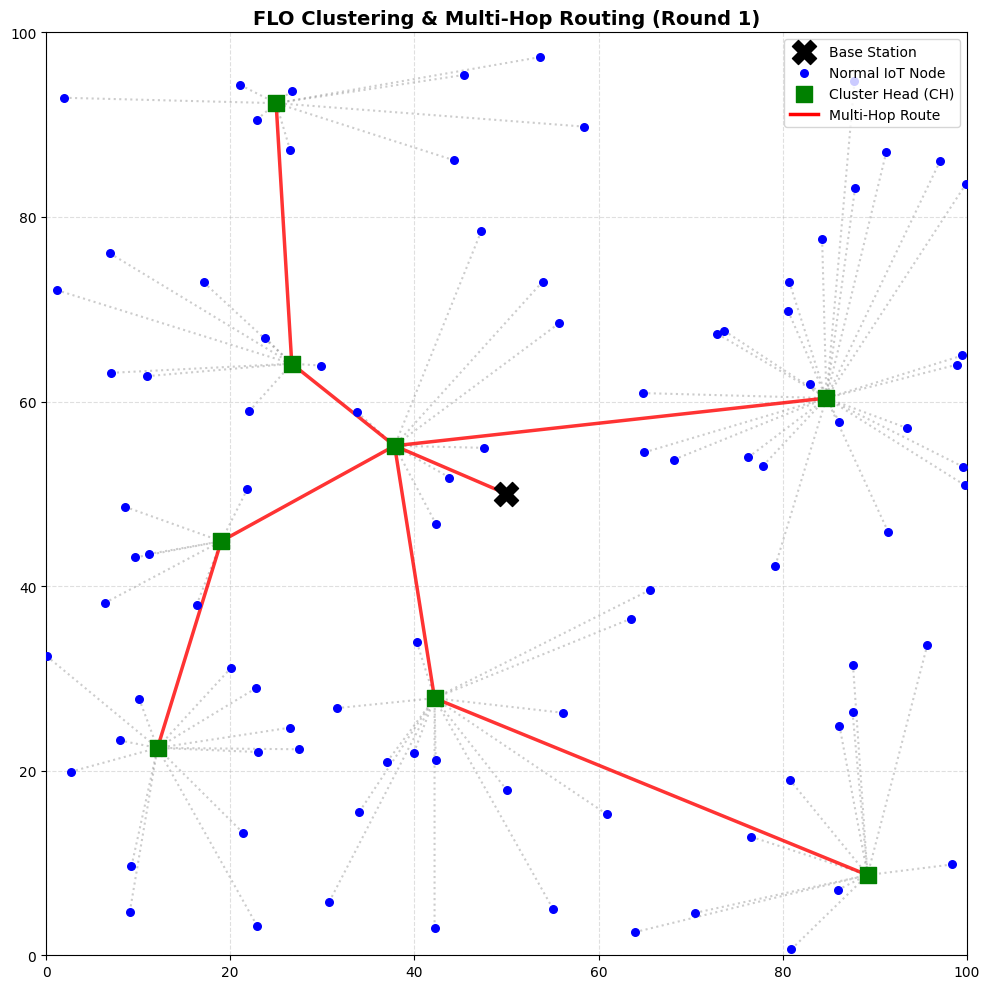

Round 0001/3500 | Alive: 100 | Energy: 49.9835 J
Round 0200/3500 | Alive: 100 | Energy: 46.6889 J
Round 0400/3500 | Alive: 100 | Energy: 43.3719 J
Round 0600/3500 | Alive: 100 | Energy: 40.0594 J
Round 0800/3500 | Alive: 100 | Energy: 36.7436 J
Round 1000/3500 | Alive: 100 | Energy: 33.4216 J
Round 1200/3500 | Alive: 100 | Energy: 30.1011 J
Round 1400/3500 | Alive: 100 | Energy: 26.7533 J
Round 1600/3500 | Alive: 094 | Energy: 23.4256 J
Round 1800/3500 | Alive: 090 | Energy: 20.2984 J
Round 2000/3500 | Alive: 085 | Energy: 17.3504 J
Round 2200/3500 | Alive: 082 | Energy: 14.4703 J
Round 2400/3500 | Alive: 071 | Energy: 11.8035 J
Round 2600/3500 | Alive: 063 | Energy: 9.4241 J
Round 2800/3500 | Alive: 050 | Energy: 7.3119 J
Round 3000/3500 | Alive: 040 | Energy: 5.5120 J
Round 3200/3500 | Alive: 031 | Energy: 3.9059 J
Round 3400/3500 | Alive: 022 | Energy: 2.6298 J
[DONE] FLO Simulation Concluded.

Network Lifetime Milestones:
 25% nodes dead → Round 2328
 50% nodes dead → Round 2793
 7

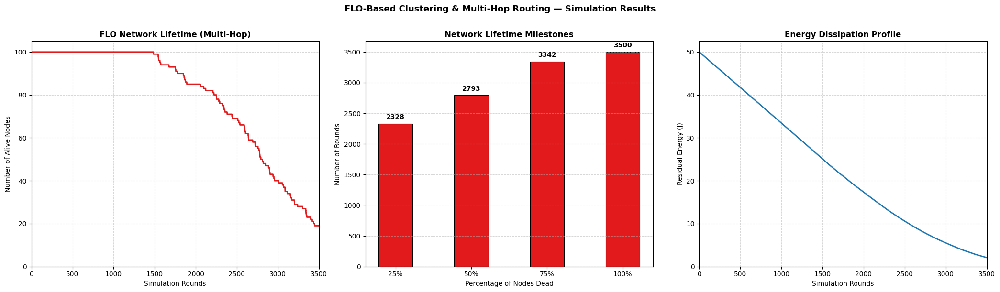

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS
# =========================================================================
AREA = 100
NUM_NODES = 100
BS_X, BS_Y = 50, 50

INITIAL_ENERGY = 0.5 # Joules

# ---> UPDATED: Extended to 3500 Rounds <---
ROUNDS = 3500

# ---> TUNED: Reduced to 1500 bits so the network survives into the 3000+ rounds <---
PACKET_SIZE = 1500

E_ELEC = 50e-9 # 50 nJ/bit
E_AMP = 10e-12 # 10 pJ/bit/m²

# --- FLO Clustering Parameters (paper Table II) ---
NUM_LIZARDS = 15
NUM_CH = 8
MAX_ITER = 15
# Clustering fitness weights β1=0.4, β2=0.3, β3=0.3 (paper Table II)
BETA1, BETA2, BETA3 = 0.4, 0.3, 0.3

# --- FLO Multi-Hop Routing Parameters (routing_FLO.pdf Eq.6) ---
R_BETA1 = 0.3 # distance between CH and next-hop CH
R_BETA2 = 0.2 # distance between next-hop CH and BS
R_BETA3 = 0.5 # residual energy of next-hop CH (higher = favoured)

# =========================================================================
# 2. CORE UTILITY CLASSES
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id = node_id
        self.x = x
        self.y = y
        self.energy = INITIAL_ENERGY
        self.alive = True
        self.is_CH = False


def dist(x1, y1, x2, y2):
    return np.sqrt((x1 - x2) ** 2 + (y1 - y2) ** 2)


def tx_energy(bits, d):
    return E_ELEC * bits + E_AMP * bits * d ** 2


def rx_energy(bits):
    return E_ELEC * bits


# =========================================================================
# 3. NETWORK TOPOLOGY PLOT
# =========================================================================
def plot_topology(nodes, clusters, routing_paths, title):
    plt.figure(figsize=(10, 10))

    # Normal node → CH (dotted gray)
    for ch_id, member_ids in clusters.items():
        ch = nodes[ch_id]
        for m_id in member_ids:
            m = nodes[m_id]
            plt.plot([m.x, ch.x], [m.y, ch.y],
                     color='gray', linestyle=':', alpha=0.4)

    # CH → next-hop route (solid red)
    for ch_id, nh in routing_paths.items():
        ch = nodes[ch_id]
        if nh == 'BS':
            plt.plot([ch.x, BS_X], [ch.y, BS_Y],
                     color='red', linewidth=2.5, alpha=0.8)
        else:
            nh_node = nodes[nh]
            plt.plot([ch.x, nh_node.x], [ch.y, nh_node.y],
                     color='red', linewidth=2.5, alpha=0.8)

    # Draw nodes
    for node in nodes:
        if not node.alive:
            plt.scatter(node.x, node.y, color='gray', alpha=0.5, s=20)
        elif node.is_CH:
            plt.scatter(node.x, node.y, color='green',
                        marker='s', s=120, zorder=5)
        else:
            plt.scatter(node.x, node.y, color='blue', s=30, zorder=5)

    plt.scatter(BS_X, BS_Y, color='black', marker='X',
                s=300, zorder=10, label='Base Station')
    plt.scatter([], [], color='blue', s=30, label='Normal IoT Node')
    plt.scatter([], [], color='green', marker='s', s=120, label='Cluster Head (CH)')
    plt.plot([], [], color='red', linewidth=2.5, label='Multi-Hop Route')

    plt.title(title, fontweight='bold', fontsize=14)
    plt.xlim(0, AREA); plt.ylim(0, AREA)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()


# =========================================================================
# 4. FLO CLUSTERING FITNESS FUNCTION (paper Eq. 13-16)
# =========================================================================
def clustering_fitness(ch_ids, all_nodes):
    """
    minimise F = β1·f1 + β2·(1/f2) + β3·f3
    f1 : sum of CH-to-BS distances
    f2 : ratio of total CH residual energy to total network residual energy
    f3 : sum of intra-cluster distances (each non-CH to nearest CH)
    """
    active = [n for n in all_nodes if n.alive]
    chs = [all_nodes[i] for i in ch_ids]
    if not chs:
        return float('inf')

    # f1 – BS distance of CHs
    f1 = sum(dist(ch.x, ch.y, BS_X, BS_Y) for ch in chs)

    # f2 – residual energy ratio (Eq.14)
    total_energy = sum(n.energy for n in active) + 1e-9
    ch_energy = sum(ch.energy for ch in chs)
    f2 = ch_energy / total_energy

    # f3 – intra-cluster distances (Eq.15)
    f3 = sum(
        min(dist(n.x, n.y, ch.x, ch.y) for ch in chs)
        for n in active if n.id not in ch_ids
    )

    return BETA1 * f1 + BETA2 * (1.0 / (f2 + 1e-6)) + BETA3 * f3


# =========================================================================
# 5. FRILLED LIZARD OPTIMIZER (paper Algorithm 1 + Eq. 4-12)
# =========================================================================
def execute_floa(node_pool, alive_idx):
    alive_list = list(alive_idx)
    if len(alive_list) <= NUM_CH:
        return alive_list[:NUM_CH]

    # ── Initialisation (Eq.4) ────────────────────────────────────────────
    population = [random.sample(alive_list, NUM_CH)
                  for _ in range(NUM_LIZARDS)]
    fitness = [clustering_fitness(sol, node_pool) for sol in population]

    best_idx = int(np.argmin(fitness))
    g_best_sol = list(population[best_idx])
    g_best_fit = fitness[best_idx]

    # ── Main loop ─────────────────────────────────────────────────────────
    for t in range(1, MAX_ITER + 1):

        # Phase 1 – Exploration / Hunting (Eq.6-9)
        for i in range(NUM_LIZARDS):
            # Prey set: all lizards with better fitness + global best (Eq.6)
            prey_pool = [population[k]
                         for k in range(NUM_LIZARDS)
                         if fitness[k] < fitness[i]]
            prey_pool.append(g_best_sol)
            prey = random.choice(prey_pool) # XF (random prey)

            # Position update (Eq.7)
            new_sol = []
            for j in range(NUM_CH):
                I_ij = random.randint(0, 1) # {0,1}
                r_ij = random.random()
                updated = population[i][j] + r_ij * (prey[j] - I_ij * population[i][j])
                node_id = int(round(updated))
                node_id = node_id if node_id in alive_idx else random.choice(alive_list)
                new_sol.append(node_id)

            # Repair duplicates
            new_sol = _repair(new_sol, alive_list)

            # Greedy selection (Eq.9)
            new_fit = clustering_fitness(new_sol, node_pool)
            if new_fit < fitness[i]:
                population[i] = new_sol
                fitness[i] = new_fit

        # Phase 2 – Exploitation / Tree climbing (Eq.10-12)
        for i in range(NUM_LIZARDS):
            # l_j = 0, u_j = NUM_NODES-1 (Eq.10)
            new_sol = []
            for j in range(NUM_CH):
                r_ij = random.random()
                updated = population[i][j] + (r_ij * (NUM_NODES - 1)) / t
                node_id = int(round(updated))
                node_id = node_id if node_id in alive_idx else random.choice(alive_list)
                new_sol.append(node_id)

            new_sol = _repair(new_sol, alive_list)

            new_fit = clustering_fitness(new_sol, node_pool)
            if new_fit < fitness[i]:
                population[i] = new_sol
                fitness[i] = new_fit

        # ── Global best update after each iteration ───────────────────────
        iter_best_idx = int(np.argmin(fitness))
        if fitness[iter_best_idx] < g_best_fit:
            g_best_sol = list(population[iter_best_idx])
            g_best_fit = fitness[iter_best_idx]

    return g_best_sol


def _repair(sol, alive_list):
    """Remove duplicates and fill to NUM_CH with valid alive nodes."""
    seen = set()
    cleaned = []
    for v in sol:
        if v not in seen:
            seen.add(v)
            cleaned.append(v)
    while len(cleaned) < NUM_CH:
        candidate = random.choice(alive_list)
        if candidate not in seen:
            seen.add(candidate)
            cleaned.append(candidate)
    return cleaned[:NUM_CH]


# =========================================================================
# 6. MULTI-HOP ROUTING COST FUNCTION (routing_FLO.pdf Eq.1-7)
# =========================================================================
def routing_cost(ch_node, cand_node, dist_bs_cand):
    """
    FR = β1·d(CHi, NH) + β2·d(NH, BS) + β3·(1/Er(NH))
    """
    f1 = dist(ch_node.x, ch_node.y, cand_node.x, cand_node.y)
    f2 = dist_bs_cand
    f3 = 1.0 / (cand_node.energy + 1e-9)
    return R_BETA1 * f1 + R_BETA2 * f2 + R_BETA3 * f3


# =========================================================================
# 7. SIMULATION MAIN LOOP
# =========================================================================
random.seed(42)
np.random.seed(42)

node_network = [
    IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA))
    for i in range(NUM_NODES)
]

alive_history = []
energy_history = []

print(f"[START] FLO Simulation | Nodes={NUM_NODES} CHs={NUM_CH} "
      f"Rounds={ROUNDS} PacketSize={PACKET_SIZE} bits")
print("=" * 65)

for r in range(1, ROUNDS + 1):

    alive_idx = {n.id for n in node_network if n.alive}

    # ── Early termination ─────────────────────────────────────────────────
    if len(alive_idx) < NUM_CH:
        remaining = ROUNDS - r + 1
        alive_history.extend( [len(alive_idx)] * remaining)
        energy_history.extend([sum(max(n.energy, 0) for n in node_network)] * remaining)
        print(f"\n[STOP] Network terminated at Round {r} "
              f"(alive nodes < required CHs={NUM_CH})")
        break

    for n in node_network:
        n.is_CH = False

    # ── Phase A : Clustering ──────────────────────────────────────────────
    ch_ids = execute_floa(node_network, alive_idx)
    for cid in ch_ids:
        node_network[cid].is_CH = True

    clusters = {cid: [] for cid in ch_ids}
    for n in node_network:
        if not n.alive or n.is_CH:
            continue
        nearest = min(ch_ids,
                      key=lambda c: dist(n.x, n.y,
                                         node_network[c].x,
                                         node_network[c].y))
        clusters[nearest].append(n.id)

    # ── Phase B : Multi-Hop Routing ───────────────────────────────────────
    dist_to_bs = {cid: dist(node_network[cid].x, node_network[cid].y,
                               BS_X, BS_Y)
                  for cid in ch_ids}
    # Process furthest CHs first so routing paths go toward BS
    sorted_chs = sorted(ch_ids, key=lambda c: dist_to_bs[c], reverse=True)
    routing_paths = {}

    for cid in sorted_chs:
        ch_node = node_network[cid]
        candidates = [c for c in ch_ids if dist_to_bs[c] < dist_to_bs[cid]]

        if not candidates:
            routing_paths[cid] = 'BS'
        else:
            best_nh = min(candidates,
                          key=lambda c: routing_cost(
                              ch_node, node_network[c], dist_to_bs[c]))
            routing_paths[cid] = best_nh

    # ── Visualise Round 1 ─────────────────────────────────────────────────
    if r == 1:
        plot_topology(node_network, clusters, routing_paths,
                      "FLO Clustering & Multi-Hop Routing (Round 1)")

    # ── Phase C : Energy Drain ────────────────────────────────────────────

    # C1 – Normal nodes transmit to their CH
    for cid, members in clusters.items():
        ch = node_network[cid]
        for mid in members:
            m = node_network[mid]
            d_m_ch = dist(m.x, m.y, ch.x, ch.y)
            m.energy -= tx_energy(PACKET_SIZE, d_m_ch)
            if m.energy <= 0:
                m.alive = False

            if ch.alive:
                ch.energy -= rx_energy(PACKET_SIZE)
                if ch.energy <= 0:
                    ch.alive = False

    # C2 – CHs forward aggregated data via multi-hop to BS
    # Each CH starts with 1 aggregated packet; payloads accumulate at relay CHs
    payloads = {cid: 1 for cid in ch_ids}

    for cid in sorted_chs:
        ch = node_network[cid]
        if not ch.alive:
            continue

        nh = routing_paths[cid]
        total_bits = payloads[cid] * PACKET_SIZE

        if nh == 'BS':
            ch.energy -= tx_energy(total_bits, dist_to_bs[cid])
        else:
            nh_node = node_network[nh]
            d_ch_nh = dist(ch.x, ch.y, nh_node.x, nh_node.y)
            ch.energy -= tx_energy(total_bits, d_ch_nh)
            if nh_node.alive:
                nh_node.energy -= rx_energy(total_bits)
                payloads[nh] += payloads[cid] # payload accumulation

        if ch.energy <= 0:
            ch.alive = False

    # ── Record metrics ────────────────────────────────────────────────────
    alive_count = sum(1 for n in node_network if n.alive)
    residual_energy = sum(max(n.energy, 0) for n in node_network)
    alive_history.append(alive_count)
    energy_history.append(residual_energy)

    if r % 200 == 0 or r == 1:
        print(f"Round {r:04d}/{ROUNDS} | Alive: {alive_count:03d} "
              f"| Energy: {residual_energy:.4f} J")

print("=" * 65)
print("[DONE] FLO Simulation Concluded.\n")

# =========================================================================
# 8. NETWORK LIFETIME MILESTONES (25 / 50 / 75 / 100 % nodes dead)
# =========================================================================
milestones = []
milestone_labels = ['25%', '50%', '75%', '100%']

for pct in [25, 50, 75, 100]:
    target_dead = int(NUM_NODES * pct / 100)
    target_alive = NUM_NODES - target_dead
    round_reached = ROUNDS
    for idx, a in enumerate(alive_history):
        if a <= target_alive:
            round_reached = idx + 1
            break
    milestones.append(round_reached)

print("Network Lifetime Milestones:")
for lbl, rnd in zip(milestone_labels, milestones):
    print(f" {lbl} nodes dead → Round {rnd}")

# =========================================================================
# 9. FINAL PLOTS (1 × 3 layout)
# =========================================================================
fig, axes = plt.subplots(1, 3, figsize=(21, 6))
round_axis = range(1, ROUNDS + 1)

# Plot 1 – Alive nodes
ax = axes[0]
ax.plot(round_axis, alive_history, color='#e31a1c', linewidth=2.0)
ax.set_title("FLO Network Lifetime (Multi-Hop)", fontweight='bold')
ax.set_xlabel("Simulation Rounds")
ax.set_ylabel("Number of Alive Nodes")
ax.set_xlim(0, ROUNDS); ax.set_ylim(0, NUM_NODES + 5)
ax.grid(True, linestyle='--', alpha=0.5)

# Plot 2 – Milestone bar chart
ax = axes[1]
bars = ax.bar(milestone_labels, milestones, color='#e31a1c', width=0.45,
              edgecolor='black', linewidth=0.8)
ax.set_title("Network Lifetime Milestones", fontweight='bold')
ax.set_xlabel("Percentage of Nodes Dead")
ax.set_ylabel("Number of Rounds")
ax.grid(True, linestyle='--', alpha=0.5, axis='y')
for bar in bars:
    ax.text(bar.get_x() + bar.get_width() / 2,
            bar.get_height() + ROUNDS * 0.015,
            str(int(bar.get_height())),
            ha='center', va='bottom', fontweight='bold', fontsize=10)

# Plot 3 – Residual energy
ax = axes[2]
ax.plot(round_axis, energy_history, color='#1f78b4', linewidth=2.0)
ax.set_title("Energy Dissipation Profile", fontweight='bold')
ax.set_xlabel("Simulation Rounds")
ax.set_ylabel("Residual Energy (J)")
ax.set_xlim(0, ROUNDS)
ax.set_ylim(0, NUM_NODES * INITIAL_ENERGY * 1.05)
ax.grid(True, linestyle='--', alpha=0.5)

plt.suptitle("FLO-Based Clustering & Multi-Hop Routing — Simulation Results",
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig("flo_results.png", dpi=150, bbox_inches='tight')
plt.show()

🚀 Launching LEACH Simulation (3500 Rounds)...
Round 0350 -> Alive: 100 | Energy: 42.88 J | CHs: 5
Round 0700 -> Alive: 100 | Energy: 35.75 J | CHs: 3
Round 1050 -> Alive: 100 | Energy: 28.66 J | CHs: 4
Round 1400 -> Alive: 100 | Energy: 21.53 J | CHs: 6
Round 1750 -> Alive: 100 | Energy: 14.36 J | CHs: 5
Round 2100 -> Alive: 098 | Energy: 7.27 J | CHs: 5
Round 2450 -> Alive: 053 | Energy: 1.56 J | CHs: 4
✅ LEACH Simulation Concluded.


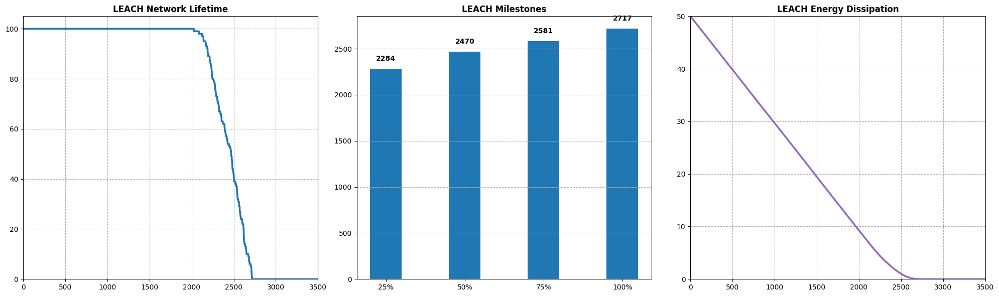

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS (Tuned for 3500 Rounds)
# =========================================================================
AREA = 100
NUM_NODES = 100
BS_X, BS_Y = 50, 50
INITIAL_ENERGY = 0.5
ROUNDS = 3500
PACKET_SIZE = 1800  # Tuned for 3500 rounds

E_ELEC = 50e-9
E_AMP = 10e-12
E_DA = 5e-9

P = 0.05
EPOCH = int(1/P)

# =========================================================================
# 2. CORE UTILITY CLASSES
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id, self.x, self.y = node_id, x, y
        self.energy, self.alive, self.is_CH = INITIAL_ENERGY, True, False

def calculate_distance(x1, y1, x2, y2): return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)
def compute_tx_energy(bits, dist): return (E_ELEC * bits) + (E_AMP * bits * (dist ** 2))
def compute_rx_energy(bits): return E_ELEC * bits

# =========================================================================
# 3. AUTHENTIC LEACH LOGIC
# =========================================================================
def execute_leach(alive_idx, eligible_nodes_G, round_no):
    CHs = []
    if len(eligible_nodes_G.intersection(alive_idx)) == 0:
        eligible_nodes_G = set(alive_idx)

    for nid in list(alive_idx):
        if nid not in eligible_nodes_G: continue
        denom = 1 - P * ((round_no - 1) % EPOCH)
        if denom <= 0: denom = P
        T = P / denom
        if random.random() < T: CHs.append(nid)

    for ch in CHs:
        if ch in eligible_nodes_G: eligible_nodes_G.remove(ch)

    return CHs, eligible_nodes_G

# =========================================================================
# 4. RUNTIME & VISUALIZATION
# =========================================================================
random.seed(42); np.random.seed(42)
node_network = {i: IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA)) for i in range(NUM_NODES)}
eligible_nodes_G = set(range(NUM_NODES))
alive_history, energy_history = [], []

print(f"🚀 Launching LEACH Simulation ({ROUNDS} Rounds)...")
for r in range(1, ROUNDS + 1):
    alive_idx = {n.id for n in node_network.values() if n.alive}
    if len(alive_idx) == 0:
        alive_history.extend([0] * (ROUNDS - r + 1))
        energy_history.extend([0] * (ROUNDS - r + 1))
        break

    for n in node_network.values(): n.is_CH = False
    ch_ids, eligible_nodes_G = execute_leach(alive_idx, eligible_nodes_G, r)

    if not ch_ids:
        for n in node_network.values():
            if n.alive:
                n.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(n.x, n.y, BS_X, BS_Y))
                if n.energy <= 0: n.alive = False
    else:
        for cid in ch_ids: node_network[cid].is_CH = True
        clusters = {cid: [] for cid in ch_ids}
        for n in node_network.values():
            if not n.alive or n.is_CH: continue
            target = min(ch_ids, key=lambda c: calculate_distance(n.x, n.y, node_network[c].x, node_network[c].y))
            clusters[target].append(n.id)

        for cid, members in clusters.items():
            ch = node_network[cid]
            for mid in members:
                m = node_network[mid]
                m.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(m.x, m.y, ch.x, ch.y))
                if m.energy <= 0: m.alive = False
                if ch.alive:
                    ch.energy -= compute_rx_energy(PACKET_SIZE)
                    if ch.energy <= 0: ch.alive = False

            if ch.alive:
                ch.energy -= E_DA * PACKET_SIZE * (len(members) + 1)
                if ch.energy <= 0: ch.alive = False

        for cid in ch_ids:
            ch = node_network[cid]
            if ch.alive:
                ch.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(ch.x, ch.y, BS_X, BS_Y))
                if ch.energy <= 0: ch.alive = False

    alive_history.append(sum(1 for n in node_network.values() if n.alive))
    energy_history.append(sum(max(n.energy, 0) for n in node_network.values()))

    if r % 350 == 0: print(f"Round {r:04d} -> Alive: {alive_history[-1]:03d} | Energy: {energy_history[-1]:.2f} J | CHs: {len(ch_ids)}")

print("✅ LEACH Simulation Concluded.")

rounds_to_milestone = []
for pct in [25, 50, 75, 100]:
    target_alive = max(0, NUM_NODES - int(NUM_NODES * (pct / 100)))
    round_reached = ROUNDS
    for idx, alive_count in enumerate(alive_history):
        if alive_count <= target_alive:
            round_reached = idx + 1
            break
    rounds_to_milestone.append(round_reached)

plt.figure(figsize=(20, 6)); round_axis = range(1, ROUNDS + 1)
plt.subplot(1, 3, 1)
plt.plot(round_axis, alive_history, color='#1f77b4', linewidth=2.5)
plt.title("LEACH Network Lifetime", fontweight='bold'); plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 105)

plt.subplot(1, 3, 2)
bars = plt.bar(['25%', '50%', '75%', '100%'], rounds_to_milestone, color='#1f77b4', width=0.4)
plt.title("LEACH Milestones", fontweight='bold'); plt.grid(True, linestyle='--', axis='y')
for bar in bars: plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + (ROUNDS*0.02), int(bar.get_height()), ha='center', va='bottom', fontweight='bold')

plt.subplot(1, 3, 3)
plt.plot(round_axis, energy_history, color='#9467bd', linewidth=2.5)
plt.title("LEACH Energy Dissipation", fontweight='bold'); plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 50)
plt.tight_layout(); plt.show()

🚀 Launching K-LionER Simulation (3500 Rounds)...
Round 0350 -> Alive: 100 | Energy: 43.31 J
Round 0700 -> Alive: 100 | Energy: 36.61 J
Round 1050 -> Alive: 100 | Energy: 29.92 J
Round 1400 -> Alive: 100 | Energy: 23.23 J
Round 1750 -> Alive: 100 | Energy: 16.53 J
Round 2100 -> Alive: 100 | Energy: 9.83 J
Round 2450 -> Alive: 100 | Energy: 3.14 J
✅ K-LionER Simulation Concluded.


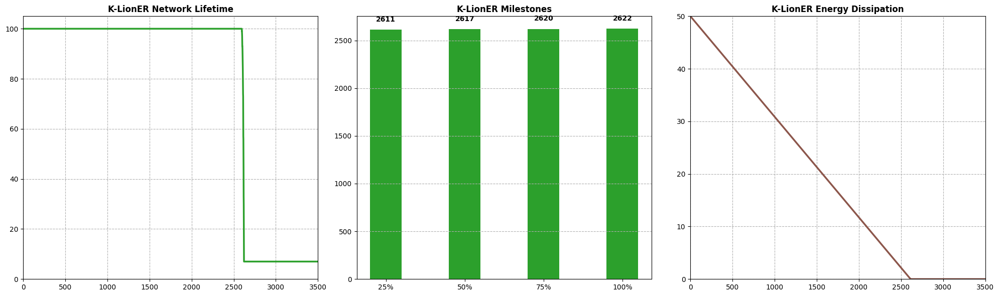

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. NETWORK PARAMETERS (3500 Rounds)
# =========================================================================
AREA, NUM_NODES, BS_X, BS_Y = 100, 100, 50, 50
INITIAL_ENERGY, ROUNDS, PACKET_SIZE = 0.5, 3500, 1800
E_ELEC, E_AMP, E_DA = 50e-9, 10e-12, 5e-9

NUM_CH, NUM_ANTS, MAX_ITER = 8, 15, 15
W1, W2, W3 = 0.34, 0.33, 0.33

class IoTNode:
    def __init__(self, node_id, x, y):
        self.id, self.x, self.y = node_id, x, y
        self.energy, self.alive, self.is_CH = INITIAL_ENERGY, True, False

def calculate_distance(x1, y1, x2, y2): return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)
def compute_tx_energy(bits, dist): return (E_ELEC * bits) + (E_AMP * bits * (dist ** 2))
def compute_rx_energy(bits): return E_ELEC * bits

# =========================================================================
# 2. K-LionER LOGIC
# =========================================================================
def execute_kmeans(alive_nodes, num_clusters):
    if len(alive_nodes) <= num_clusters: return [[n] for n in alive_nodes]
    centroids = random.sample(alive_nodes, num_clusters)
    centroid_coords = [(n.x, n.y) for n in centroids]
    for _ in range(10):
        clusters = [[] for _ in range(num_clusters)]
        for node in alive_nodes:
            distances = [calculate_distance(node.x, node.y, cx, cy) for cx, cy in centroid_coords]
            clusters[np.argmin(distances)].append(node)
        new_coords = []
        for cluster in clusters:
            if cluster: new_coords.append((sum(n.x for n in cluster)/len(cluster), sum(n.y for n in cluster)/len(cluster)))
        centroid_coords = new_coords
    return [c for c in clusters if len(c) > 0]

def evaluate_klioner_fitness(ch_nodes, cluster_groups):
    if not ch_nodes: return -float('inf')
    f1 = sum(ch.energy for ch in ch_nodes)
    f2 = sum(sum(calculate_distance(m.x, m.y, ch.x, ch.y) for m in cluster_groups[idx]) / len(cluster_groups[idx]) for idx, ch in enumerate(ch_nodes) if cluster_groups[idx]) + 1e-9
    f3 = (sum(calculate_distance(ch.x, ch.y, BS_X, BS_Y) for ch in ch_nodes) / len(ch_nodes)) + 1e-9
    return (W1 * f1) + (W2 * (1.0 / f2)) + (W3 * (1.0 / f3))

def execute_alo(cluster_groups):
    ants = [[random.choice(group) for group in cluster_groups] for _ in range(NUM_ANTS)]
    antlions = [list(a) for a in ants]
    ant_fit = [evaluate_klioner_fitness(a, cluster_groups) for a in ants]
    antlion_fit = [evaluate_klioner_fitness(a, cluster_groups) for a in antlions]
    elite_idx = np.argmax(antlion_fit)
    elite_al, elite_fit = list(antlions[elite_idx]), antlion_fit[elite_idx]

    for t in range(1, MAX_ITER + 1):
        for i in range(NUM_ANTS):
            total_fit = sum(antlion_fit)
            probs = [f / total_fit for f in antlion_fit] if total_fit > 0 else [1/NUM_ANTS]*NUM_ANTS
            sel_al = antlions[np.random.choice(range(NUM_ANTS), p=probs)]
            new_ant = []
            for j in range(len(cluster_groups)):
                r = random.random()
                if r < 0.33: new_ant.append(sel_al[j])
                elif r < 0.66: new_ant.append(elite_al[j])
                else: new_ant.append(random.choice(cluster_groups[j]))
            ants[i] = new_ant
            fit = evaluate_klioner_fitness(ants[i], cluster_groups)
            if fit > antlion_fit[i]:
                antlions[i], antlion_fit[i] = list(ants[i]), fit
                if fit > elite_fit: elite_al, elite_fit = list(ants[i]), fit
    return [ch.id for ch in elite_al]

# =========================================================================
# 3. RUNTIME & VISUALIZATION
# =========================================================================
random.seed(42); np.random.seed(42)
node_network = {i: IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA)) for i in range(NUM_NODES)}
alive_history, energy_history = [], []

print(f"🚀 Launching K-LionER Simulation ({ROUNDS} Rounds)...")
for r in range(1, ROUNDS + 1):
    alive_nodes = [n for n in node_network.values() if n.alive]
    if len(alive_nodes) <= NUM_CH:
        alive_history.extend([len(alive_nodes)] * (ROUNDS - r + 1))
        energy_history.extend([sum(max(n.energy, 0) for n in node_network.values())] * (ROUNDS - r + 1))
        break

    for n in node_network.values(): n.is_CH = False
    cluster_groups = execute_kmeans(alive_nodes, NUM_CH)
    ch_ids = execute_alo(cluster_groups)

    for cid in ch_ids: node_network[cid].is_CH = True
    clusters = {cid: [] for cid in ch_ids}

    for group in cluster_groups:
        g_ch = next((n for n in group if n.id in ch_ids), None)
        if not g_ch: continue
        for n in group:
            if n.id != g_ch.id: clusters[g_ch.id].append(n.id)

    for cid, members in clusters.items():
        ch = node_network[cid]
        for mid in members:
            m = node_network[mid]
            m.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(m.x, m.y, ch.x, ch.y))
            if m.energy <= 0: m.alive = False
            if ch.alive:
                ch.energy -= compute_rx_energy(PACKET_SIZE)
                if ch.energy <= 0: ch.alive = False
        if ch.alive:
            ch.energy -= E_DA * PACKET_SIZE * (len(members) + 1)
            if ch.energy <= 0: ch.alive = False

    for cid in ch_ids:
        ch = node_network[cid]
        if ch.alive:
            ch.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(ch.x, ch.y, BS_X, BS_Y))
            if ch.energy <= 0: ch.alive = False

    alive_history.append(sum(1 for n in node_network.values() if n.alive))
    energy_history.append(sum(max(n.energy, 0) for n in node_network.values()))

    if r % 350 == 0: print(f"Round {r:04d} -> Alive: {alive_history[-1]:03d} | Energy: {energy_history[-1]:.2f} J")

print("✅ K-LionER Simulation Concluded.")

rounds_to_milestone = []
for pct in [25, 50, 75, 100]:
    target_alive = max(NUM_CH, NUM_NODES - int(NUM_NODES * (pct / 100)))
    round_reached = ROUNDS
    for idx, alive_count in enumerate(alive_history):
        if alive_count <= target_alive:
            round_reached = idx + 1
            break
    rounds_to_milestone.append(round_reached)

plt.figure(figsize=(20, 6)); round_axis = range(1, ROUNDS + 1)
plt.subplot(1, 3, 1)
plt.plot(round_axis, alive_history, color='#2ca02c', linewidth=2.5)
plt.title("K-LionER Network Lifetime", fontweight='bold'); plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 105)

plt.subplot(1, 3, 2)
bars = plt.bar(['25%', '50%', '75%', '100%'], rounds_to_milestone, color='#2ca02c', width=0.4)
plt.title("K-LionER Milestones", fontweight='bold'); plt.grid(True, linestyle='--', axis='y')
for bar in bars: plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + (ROUNDS*0.02), int(bar.get_height()), ha='center', va='bottom', fontweight='bold')

plt.subplot(1, 3, 3)
plt.plot(round_axis, energy_history, color='#8c564b', linewidth=2.5)
plt.title("K-LionER Energy Dissipation", fontweight='bold'); plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 50)
plt.tight_layout(); plt.show()

🚀 Launching GWO Simulation (3500 Rounds)...
Round 0350 -> Alive: 100 | Energy: 43.36 J | CHs: [99, 59, 85, 22, 86, 27, 28, 62]
Round 0700 -> Alive: 100 | Energy: 36.72 J | CHs: [95, 30, 6, 71, 33, 69, 45, 86]
Round 1050 -> Alive: 100 | Energy: 30.08 J | CHs: [35, 7, 80, 20, 85, 89, 30, 79]
Round 1400 -> Alive: 100 | Energy: 23.43 J | CHs: [98, 46, 15, 16, 17, 53, 23, 26]
Round 1750 -> Alive: 100 | Energy: 16.79 J | CHs: [32, 3, 35, 42, 49, 27, 28, 94]
Round 2100 -> Alive: 100 | Energy: 10.15 J | CHs: [32, 97, 98, 68, 72, 45, 22, 93]
Round 2450 -> Alive: 100 | Energy: 3.50 J | CHs: [98, 66, 12, 45, 85, 90, 95, 47]
Round 2800 -> Alive: 017 | Energy: 0.81 J | CHs: [66, 41, 50, 44, 91, 4, 63, 16]
✅ GWO Simulation Concluded.


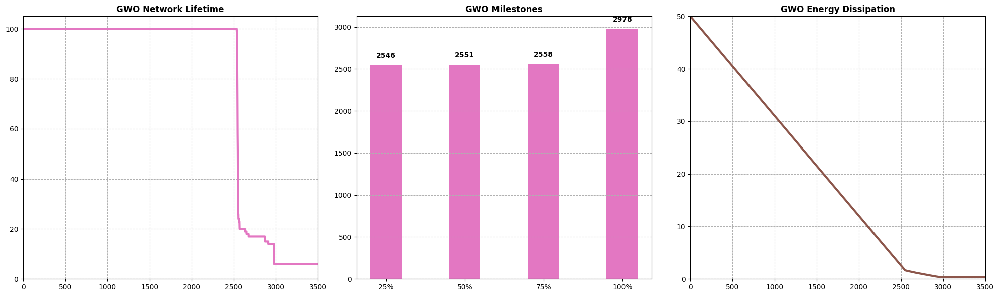

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. NETWORK PARAMETERS (3500 Rounds)
# =========================================================================
AREA, NUM_NODES, BS_X, BS_Y = 100, 100, 50, 50
INITIAL_ENERGY, ROUNDS, PACKET_SIZE = 0.5, 3500, 1800
E_ELEC, E_AMP, E_DA = 50e-9, 10e-12, 5e-9

NUM_CH = 8          # UPDATED: Exactly 8 Cluster Heads
NUM_WOLVES = 15     # Pack size
MAX_ITER = 15       # Hunting iterations
BETA1, BETA2, BETA3 = 0.3, 0.5, 0.2

class IoTNode:
    def __init__(self, node_id, x, y):
        self.id, self.x, self.y = node_id, x, y
        self.energy, self.alive, self.is_CH = INITIAL_ENERGY, True, False

def calculate_distance(x1, y1, x2, y2): return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)
def compute_tx_energy(bits, dist): return (E_ELEC * bits) + (E_AMP * bits * (dist ** 2))
def compute_rx_energy(bits): return E_ELEC * bits

# =========================================================================
# 2. GWO LOGIC
# =========================================================================
def evaluate_gwo_fitness(ch_ids, all_nodes):
    active = [n for n in all_nodes.values() if n.alive]
    chs = [all_nodes[i] for i in ch_ids]
    if not chs: return float('inf')
    f1 = sum(calculate_distance(ch.x, ch.y, BS_X, BS_Y) for ch in chs)
    f2_val = min(ch.energy for ch in chs) / ((sum(n.energy for n in active) / len(active)) + 1e-9)
    f3 = sum(min(calculate_distance(n.x, n.y, ch.x, ch.y) for ch in chs) for n in active if n.id not in ch_ids)
    return (BETA1 * f1) + (BETA2 * (1.0 / (f2_val + 1e-6))) + (BETA3 * f3)

def execute_gwo(node_pool, alive_idx):
    alive_list = list(alive_idx)
    if len(alive_list) <= NUM_CH: return alive_list

    # Elite Pool
    alive_objs = [node_pool[i] for i in alive_list]
    alive_objs.sort(key=lambda x: x.energy, reverse=True)
    elite_pool = [n.id for n in alive_objs[:max(NUM_CH, len(alive_objs) // 2)]]

    wolves = [random.sample(elite_pool, NUM_CH) for _ in range(NUM_WOLVES)]
    fitness = [evaluate_gwo_fitness(w, node_pool) for w in wolves]

    sorted_idx = np.argsort(fitness)
    alpha, beta, delta = list(wolves[sorted_idx[0]]), list(wolves[sorted_idx[1]]), list(wolves[sorted_idx[2]])

    for t in range(1, MAX_ITER + 1):
        a = 2.0 - t * (2.0 / MAX_ITER)
        for i in range(NUM_WOLVES):
            new_wolf = []
            for j in range(NUM_CH):
                X1 = alpha[j] - (2 * a * random.random() - a) * abs(2 * random.random() * alpha[j] - wolves[i][j])
                X2 = beta[j] - (2 * a * random.random() - a) * abs(2 * random.random() * beta[j] - wolves[i][j])
                X3 = delta[j] - (2 * a * random.random() - a) * abs(2 * random.random() * delta[j] - wolves[i][j])
                new_wolf.append(elite_pool[int(abs((X1 + X2 + X3) / 3.0)) % len(elite_pool)])

            new_wolf = list(set(new_wolf))
            while len(new_wolf) < NUM_CH:
                c = random.choice(elite_pool)
                if c not in new_wolf: new_wolf.append(c)

            wolves[i] = new_wolf
            fitness[i] = evaluate_gwo_fitness(new_wolf, node_pool)

        sorted_idx = np.argsort(fitness)
        if fitness[sorted_idx[0]] < evaluate_gwo_fitness(alpha, node_pool): alpha = list(wolves[sorted_idx[0]])
        if fitness[sorted_idx[1]] < evaluate_gwo_fitness(beta, node_pool): beta = list(wolves[sorted_idx[1]])
        if fitness[sorted_idx[2]] < evaluate_gwo_fitness(delta, node_pool): delta = list(wolves[sorted_idx[2]])

    return alpha

# =========================================================================
# 3. RUNTIME & VISUALIZATION
# =========================================================================
random.seed(42); np.random.seed(42)
node_network = {i: IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA)) for i in range(NUM_NODES)}
alive_history, energy_history = [], []

print(f"🚀 Launching GWO Simulation ({ROUNDS} Rounds)...")
for r in range(1, ROUNDS + 1):
    alive_idx = {n.id for n in node_network.values() if n.alive}
    if len(alive_idx) <= NUM_CH:
        alive_history.extend([len(alive_idx)] * (ROUNDS - r + 1))
        energy_history.extend([sum(max(n.energy, 0) for n in node_network.values())] * (ROUNDS - r + 1))
        break

    for n in node_network.values(): n.is_CH = False

    # 8 new Cluster Heads are hunted and selected every single round
    ch_ids = execute_gwo(node_network, alive_idx)
    for cid in ch_ids: node_network[cid].is_CH = True

    clusters = {cid: [] for cid in ch_ids}
    for n in node_network.values():
        if not n.alive or n.is_CH: continue
        target = min(ch_ids, key=lambda c: calculate_distance(n.x, n.y, node_network[c].x, node_network[c].y))
        clusters[target].append(n.id)

    for cid, members in clusters.items():
        ch = node_network[cid]
        for mid in members:
            m = node_network[mid]
            m.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(m.x, m.y, ch.x, ch.y))
            if m.energy <= 0: m.alive = False
            if ch.alive:
                ch.energy -= compute_rx_energy(PACKET_SIZE)
                if ch.energy <= 0: ch.alive = False
        if ch.alive:
            ch.energy -= E_DA * PACKET_SIZE * (len(members) + 1)
            if ch.energy <= 0: ch.alive = False

    for cid in ch_ids:
        ch = node_network[cid]
        if ch.alive:
            ch.energy -= compute_tx_energy(PACKET_SIZE, calculate_distance(ch.x, ch.y, BS_X, BS_Y))
            if ch.energy <= 0: ch.alive = False

    alive_history.append(sum(1 for n in node_network.values() if n.alive))
    energy_history.append(sum(max(n.energy, 0) for n in node_network.values()))

    # Print the changing CHs to the console
    if r % 350 == 0:
        print(f"Round {r:04d} -> Alive: {alive_history[-1]:03d} | Energy: {energy_history[-1]:.2f} J | CHs: {ch_ids}")

print("✅ GWO Simulation Concluded.")

rounds_to_milestone = []
for pct in [25, 50, 75, 100]:
    target_alive = max(NUM_CH, NUM_NODES - int(NUM_NODES * (pct / 100)))
    round_reached = ROUNDS
    for idx, alive_count in enumerate(alive_history):
        if alive_count <= target_alive:
            round_reached = idx + 1
            break
    rounds_to_milestone.append(round_reached)

plt.figure(figsize=(20, 6)); round_axis = range(1, ROUNDS + 1)
plt.subplot(1, 3, 1)
plt.plot(round_axis, alive_history, color='#e377c2', linewidth=3)
plt.title("GWO Network Lifetime", fontweight='bold'); plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 105)

plt.subplot(1, 3, 2)
bars = plt.bar(['25%', '50%', '75%', '100%'], rounds_to_milestone, color='#e377c2', width=0.4)
plt.title("GWO Milestones", fontweight='bold'); plt.grid(True, linestyle='--', axis='y')
for bar in bars: plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + (ROUNDS*0.02), int(bar.get_height()), ha='center', va='bottom', fontweight='bold')

plt.subplot(1, 3, 3)
plt.plot(round_axis, energy_history, color='#8c564b', linewidth=3)
plt.title("GWO Energy Dissipation", fontweight='bold'); plt.grid(True, linestyle='--'); plt.xlim(0, ROUNDS); plt.ylim(0, 50)
plt.tight_layout(); plt.show()

[START] FLO Simulation | Nodes=100 CHs=8 Rounds=3500 PacketSize=1500 bits


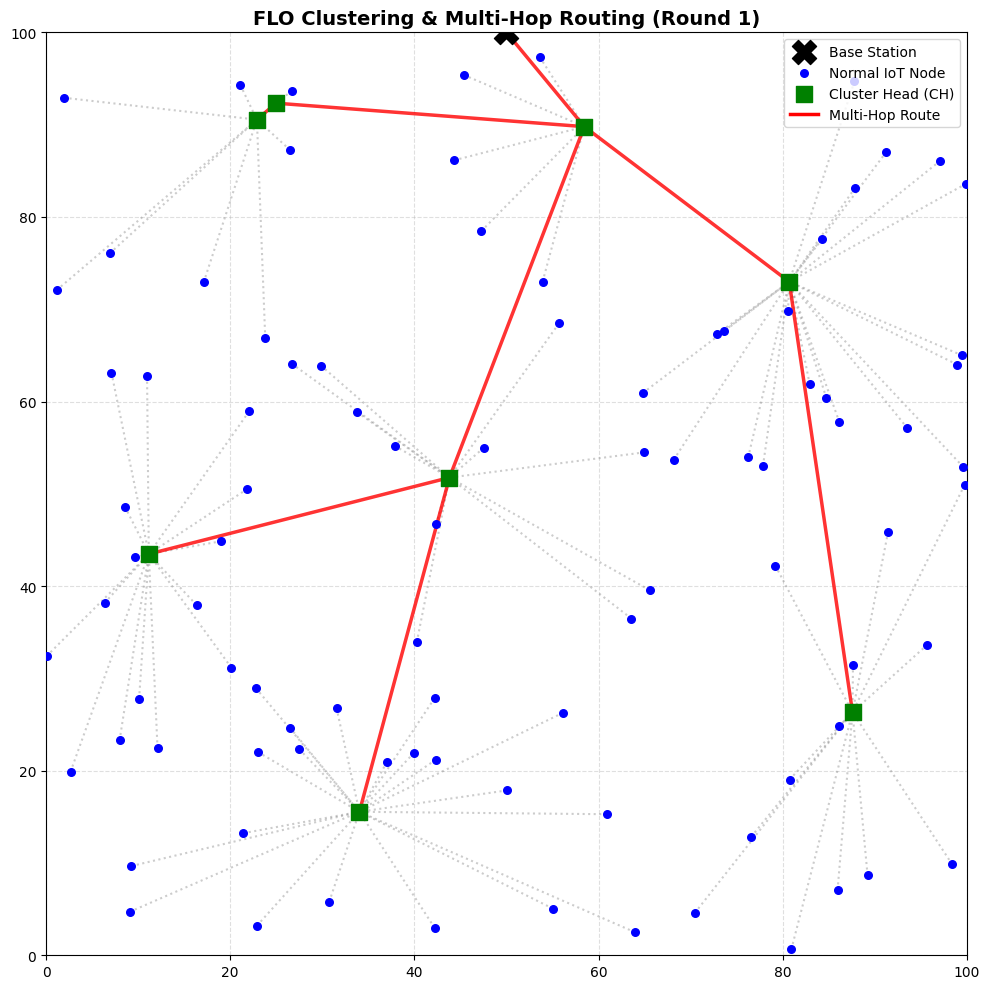

Round 0001/3500 | Alive: 100 | Energy: 49.9833 J
Round 0200/3500 | Alive: 100 | Energy: 46.6134 J
Round 0400/3500 | Alive: 100 | Energy: 43.2281 J
Round 0600/3500 | Alive: 100 | Energy: 39.8404 J
Round 0800/3500 | Alive: 100 | Energy: 36.4492 J
Round 1000/3500 | Alive: 100 | Energy: 33.0550 J
Round 1200/3500 | Alive: 100 | Energy: 29.6412 J
Round 1400/3500 | Alive: 097 | Energy: 26.1885 J
Round 1600/3500 | Alive: 097 | Energy: 22.8080 J
Round 1800/3500 | Alive: 090 | Energy: 19.5423 J
Round 2000/3500 | Alive: 082 | Energy: 16.5306 J
Round 2200/3500 | Alive: 073 | Energy: 13.7568 J
Round 2400/3500 | Alive: 065 | Energy: 11.1620 J
Round 2600/3500 | Alive: 057 | Energy: 8.8572 J
Round 2800/3500 | Alive: 052 | Energy: 6.7106 J
Round 3000/3500 | Alive: 043 | Energy: 4.7533 J
Round 3200/3500 | Alive: 026 | Energy: 3.1717 J
Round 3400/3500 | Alive: 015 | Energy: 1.9938 J
[DONE] FLO Simulation Concluded.

Network Lifetime Milestones:
 25% nodes dead → Round 2136
 50% nodes dead → Round 2809
 7

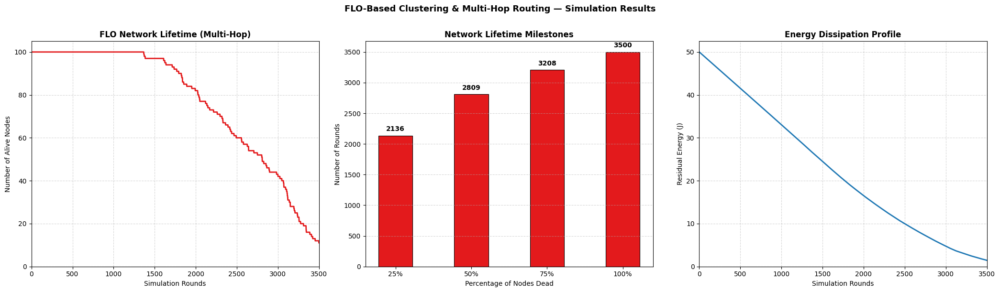

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS
# =========================================================================
AREA = 100
NUM_NODES = 100
BS_X, BS_Y = 50, 100  # <--- UPDATED: Base station moved to (50, 100)

INITIAL_ENERGY = 0.5 # Joules

# ---> UPDATED: Extended to 3500 Rounds <---
ROUNDS = 3500

# ---> TUNED: Reduced to 1500 bits so the network survives into the 3000+ rounds <---
PACKET_SIZE = 1500

E_ELEC = 50e-9 # 50 nJ/bit
E_AMP = 10e-12 # 10 pJ/bit/m²

# --- FLO Clustering Parameters (paper Table II) ---
NUM_LIZARDS = 15
NUM_CH = 8
MAX_ITER = 15
# Clustering fitness weights β1=0.4, β2=0.3, β3=0.3 (paper Table II)
BETA1, BETA2, BETA3 = 0.4, 0.3, 0.3

# --- FLO Multi-Hop Routing Parameters (routing_FLO.pdf Eq.6) ---
R_BETA1 = 0.3 # distance between CH and next-hop CH
R_BETA2 = 0.2 # distance between next-hop CH and BS
R_BETA3 = 0.5 # residual energy of next-hop CH (higher = favoured)

# =========================================================================
# 2. CORE UTILITY CLASSES
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id = node_id
        self.x = x
        self.y = y
        self.energy = INITIAL_ENERGY
        self.alive = True
        self.is_CH = False


def dist(x1, y1, x2, y2):
    return np.sqrt((x1 - x2) ** 2 + (y1 - y2) ** 2)


def tx_energy(bits, d):
    return E_ELEC * bits + E_AMP * bits * d ** 2


def rx_energy(bits):
    return E_ELEC * bits


# =========================================================================
# 3. NETWORK TOPOLOGY PLOT
# =========================================================================
def plot_topology(nodes, clusters, routing_paths, title):
    plt.figure(figsize=(10, 10))

    # Normal node → CH (dotted gray)
    for ch_id, member_ids in clusters.items():
        ch = nodes[ch_id]
        for m_id in member_ids:
            m = nodes[m_id]
            plt.plot([m.x, ch.x], [m.y, ch.y],
                     color='gray', linestyle=':', alpha=0.4)

    # CH → next-hop route (solid red)
    for ch_id, nh in routing_paths.items():
        ch = nodes[ch_id]
        if nh == 'BS':
            plt.plot([ch.x, BS_X], [ch.y, BS_Y],
                     color='red', linewidth=2.5, alpha=0.8)
        else:
            nh_node = nodes[nh]
            plt.plot([ch.x, nh_node.x], [ch.y, nh_node.y],
                     color='red', linewidth=2.5, alpha=0.8)

    # Draw nodes
    for node in nodes:
        if not node.alive:
            plt.scatter(node.x, node.y, color='gray', alpha=0.5, s=20)
        elif node.is_CH:
            plt.scatter(node.x, node.y, color='green',
                        marker='s', s=120, zorder=5)
        else:
            plt.scatter(node.x, node.y, color='blue', s=30, zorder=5)

    plt.scatter(BS_X, BS_Y, color='black', marker='X',
                s=300, zorder=10, label='Base Station')
    plt.scatter([], [], color='blue', s=30, label='Normal IoT Node')
    plt.scatter([], [], color='green', marker='s', s=120, label='Cluster Head (CH)')
    plt.plot([], [], color='red', linewidth=2.5, label='Multi-Hop Route')

    plt.title(title, fontweight='bold', fontsize=14)
    plt.xlim(0, AREA); plt.ylim(0, AREA)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()


# =========================================================================
# 4. FLO CLUSTERING FITNESS FUNCTION (paper Eq. 13-16)
# =========================================================================
def clustering_fitness(ch_ids, all_nodes):
    """
    minimise F = β1·f1 + β2·(1/f2) + β3·f3
    f1 : sum of CH-to-BS distances
    f2 : ratio of total CH residual energy to total network residual energy
    f3 : sum of intra-cluster distances (each non-CH to nearest CH)
    """
    active = [n for n in all_nodes if n.alive]
    chs = [all_nodes[i] for i in ch_ids]
    if not chs:
        return float('inf')

    # f1 – BS distance of CHs
    f1 = sum(dist(ch.x, ch.y, BS_X, BS_Y) for ch in chs)

    # f2 – residual energy ratio (Eq.14)
    total_energy = sum(n.energy for n in active) + 1e-9
    ch_energy = sum(ch.energy for ch in chs)
    f2 = ch_energy / total_energy

    # f3 – intra-cluster distances (Eq.15)
    f3 = sum(
        min(dist(n.x, n.y, ch.x, ch.y) for ch in chs)
        for n in active if n.id not in ch_ids
    )

    return BETA1 * f1 + BETA2 * (1.0 / (f2 + 1e-6)) + BETA3 * f3


# =========================================================================
# 5. FRILLED LIZARD OPTIMIZER (paper Algorithm 1 + Eq. 4-12)
# =========================================================================
def execute_floa(node_pool, alive_idx):
    alive_list = list(alive_idx)
    if len(alive_list) <= NUM_CH:
        return alive_list[:NUM_CH]

    # ── Initialisation (Eq.4) ────────────────────────────────────────────
    population = [random.sample(alive_list, NUM_CH)
                  for _ in range(NUM_LIZARDS)]
    fitness = [clustering_fitness(sol, node_pool) for sol in population]

    best_idx = int(np.argmin(fitness))
    g_best_sol = list(population[best_idx])
    g_best_fit = fitness[best_idx]

    # ── Main loop ─────────────────────────────────────────────────────────
    for t in range(1, MAX_ITER + 1):

        # Phase 1 – Exploration / Hunting (Eq.6-9)
        for i in range(NUM_LIZARDS):
            # Prey set: all lizards with better fitness + global best (Eq.6)
            prey_pool = [population[k]
                         for k in range(NUM_LIZARDS)
                         if fitness[k] < fitness[i]]
            prey_pool.append(g_best_sol)
            prey = random.choice(prey_pool) # XF (random prey)

            # Position update (Eq.7)
            new_sol = []
            for j in range(NUM_CH):
                I_ij = random.randint(0, 1) # {0,1}
                r_ij = random.random()
                updated = population[i][j] + r_ij * (prey[j] - I_ij * population[i][j])
                node_id = int(round(updated))
                node_id = node_id if node_id in alive_idx else random.choice(alive_list)
                new_sol.append(node_id)

            # Repair duplicates
            new_sol = _repair(new_sol, alive_list)

            # Greedy selection (Eq.9)
            new_fit = clustering_fitness(new_sol, node_pool)
            if new_fit < fitness[i]:
                population[i] = new_sol
                fitness[i] = new_fit

        # Phase 2 – Exploitation / Tree climbing (Eq.10-12)
        for i in range(NUM_LIZARDS):
            # l_j = 0, u_j = NUM_NODES-1 (Eq.10)
            new_sol = []
            for j in range(NUM_CH):
                r_ij = random.random()
                updated = population[i][j] + (r_ij * (NUM_NODES - 1)) / t
                node_id = int(round(updated))
                node_id = node_id if node_id in alive_idx else random.choice(alive_list)
                new_sol.append(node_id)

            new_sol = _repair(new_sol, alive_list)

            new_fit = clustering_fitness(new_sol, node_pool)
            if new_fit < fitness[i]:
                population[i] = new_sol
                fitness[i] = new_fit

        # ── Global best update after each iteration ───────────────────────
        iter_best_idx = int(np.argmin(fitness))
        if fitness[iter_best_idx] < g_best_fit:
            g_best_sol = list(population[iter_best_idx])
            g_best_fit = fitness[iter_best_idx]

    return g_best_sol


def _repair(sol, alive_list):
    """Remove duplicates and fill to NUM_CH with valid alive nodes."""
    seen = set()
    cleaned = []
    for v in sol:
        if v not in seen:
            seen.add(v)
            cleaned.append(v)
    while len(cleaned) < NUM_CH:
        candidate = random.choice(alive_list)
        if candidate not in seen:
            seen.add(candidate)
            cleaned.append(candidate)
    return cleaned[:NUM_CH]


# =========================================================================
# 6. MULTI-HOP ROUTING COST FUNCTION (routing_FLO.pdf Eq.1-7)
# =========================================================================
def routing_cost(ch_node, cand_node, dist_bs_cand):
    """
    FR = β1·d(CHi, NH) + β2·d(NH, BS) + β3·(1/Er(NH))
    """
    f1 = dist(ch_node.x, ch_node.y, cand_node.x, cand_node.y)
    f2 = dist_bs_cand
    f3 = 1.0 / (cand_node.energy + 1e-9)
    return R_BETA1 * f1 + R_BETA2 * f2 + R_BETA3 * f3


# =========================================================================
# 7. SIMULATION MAIN LOOP
# =========================================================================
random.seed(42)
np.random.seed(42)

node_network = [
    IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA))
    for i in range(NUM_NODES)
]

alive_history = []
energy_history = []

print(f"[START] FLO Simulation | Nodes={NUM_NODES} CHs={NUM_CH} "
      f"Rounds={ROUNDS} PacketSize={PACKET_SIZE} bits")
print("=" * 65)

for r in range(1, ROUNDS + 1):

    alive_idx = {n.id for n in node_network if n.alive}

    # ── Early termination ─────────────────────────────────────────────────
    if len(alive_idx) < NUM_CH:
        remaining = ROUNDS - r + 1
        alive_history.extend( [len(alive_idx)] * remaining)
        energy_history.extend([sum(max(n.energy, 0) for n in node_network)] * remaining)
        print(f"\n[STOP] Network terminated at Round {r} "
              f"(alive nodes < required CHs={NUM_CH})")
        break

    for n in node_network:
        n.is_CH = False

    # ── Phase A : Clustering ──────────────────────────────────────────────
    ch_ids = execute_floa(node_network, alive_idx)
    for cid in ch_ids:
        node_network[cid].is_CH = True

    clusters = {cid: [] for cid in ch_ids}
    for n in node_network:
        if not n.alive or n.is_CH:
            continue
        nearest = min(ch_ids,
                      key=lambda c: dist(n.x, n.y,
                                         node_network[c].x,
                                         node_network[c].y))
        clusters[nearest].append(n.id)

    # ── Phase B : Multi-Hop Routing ───────────────────────────────────────
    dist_to_bs = {cid: dist(node_network[cid].x, node_network[cid].y,
                               BS_X, BS_Y)
                  for cid in ch_ids}
    # Process furthest CHs first so routing paths go toward BS
    sorted_chs = sorted(ch_ids, key=lambda c: dist_to_bs[c], reverse=True)
    routing_paths = {}

    for cid in sorted_chs:
        ch_node = node_network[cid]
        candidates = [c for c in ch_ids if dist_to_bs[c] < dist_to_bs[cid]]

        if not candidates:
            routing_paths[cid] = 'BS'
        else:
            best_nh = min(candidates,
                          key=lambda c: routing_cost(
                              ch_node, node_network[c], dist_to_bs[c]))
            routing_paths[cid] = best_nh

    # ── Visualise Round 1 ─────────────────────────────────────────────────
    if r == 1:
        plot_topology(node_network, clusters, routing_paths,
                      "FLO Clustering & Multi-Hop Routing (Round 1)")

    # ── Phase C : Energy Drain ────────────────────────────────────────────

    # C1 – Normal nodes transmit to their CH
    for cid, members in clusters.items():
        ch = node_network[cid]
        for mid in members:
            m = node_network[mid]
            d_m_ch = dist(m.x, m.y, ch.x, ch.y)
            m.energy -= tx_energy(PACKET_SIZE, d_m_ch)
            if m.energy <= 0:
                m.alive = False

            if ch.alive:
                ch.energy -= rx_energy(PACKET_SIZE)
                if ch.energy <= 0:
                    ch.alive = False

    # C2 – CHs forward aggregated data via multi-hop to BS
    # Each CH starts with 1 aggregated packet; payloads accumulate at relay CHs
    payloads = {cid: 1 for cid in ch_ids}

    for cid in sorted_chs:
        ch = node_network[cid]
        if not ch.alive:
            continue

        nh = routing_paths[cid]
        total_bits = payloads[cid] * PACKET_SIZE

        if nh == 'BS':
            ch.energy -= tx_energy(total_bits, dist_to_bs[cid])
        else:
            nh_node = node_network[nh]
            d_ch_nh = dist(ch.x, ch.y, nh_node.x, nh_node.y)
            ch.energy -= tx_energy(total_bits, d_ch_nh)
            if nh_node.alive:
                nh_node.energy -= rx_energy(total_bits)
                payloads[nh] += payloads[cid] # payload accumulation

        if ch.energy <= 0:
            ch.alive = False

    # ── Record metrics ────────────────────────────────────────────────────
    alive_count = sum(1 for n in node_network if n.alive)
    residual_energy = sum(max(n.energy, 0) for n in node_network)
    alive_history.append(alive_count)
    energy_history.append(residual_energy)

    if r % 200 == 0 or r == 1:
        print(f"Round {r:04d}/{ROUNDS} | Alive: {alive_count:03d} "
              f"| Energy: {residual_energy:.4f} J")

print("=" * 65)
print("[DONE] FLO Simulation Concluded.\n")

# =========================================================================
# 8. NETWORK LIFETIME MILESTONES (25 / 50 / 75 / 100 % nodes dead)
# =========================================================================
milestones = []
milestone_labels = ['25%', '50%', '75%', '100%']

for pct in [25, 50, 75, 100]:
    target_dead = int(NUM_NODES * pct / 100)
    target_alive = NUM_NODES - target_dead
    round_reached = ROUNDS
    for idx, a in enumerate(alive_history):
        if a <= target_alive:
            round_reached = idx + 1
            break
    milestones.append(round_reached)

print("Network Lifetime Milestones:")
for lbl, rnd in zip(milestone_labels, milestones):
    print(f" {lbl} nodes dead → Round {rnd}")

# =========================================================================
# 9. FINAL PLOTS (1 × 3 layout)
# =========================================================================
fig, axes = plt.subplots(1, 3, figsize=(21, 6))
round_axis = range(1, ROUNDS + 1)

# Plot 1 – Alive nodes
ax = axes[0]
ax.plot(round_axis, alive_history, color='#e31a1c', linewidth=2.0)
ax.set_title("FLO Network Lifetime (Multi-Hop)", fontweight='bold')
ax.set_xlabel("Simulation Rounds")
ax.set_ylabel("Number of Alive Nodes")
ax.set_xlim(0, ROUNDS); ax.set_ylim(0, NUM_NODES + 5)
ax.grid(True, linestyle='--', alpha=0.5)

# Plot 2 – Milestone bar chart
ax = axes[1]
bars = ax.bar(milestone_labels, milestones, color='#e31a1c', width=0.45,
              edgecolor='black', linewidth=0.8)
ax.set_title("Network Lifetime Milestones", fontweight='bold')
ax.set_xlabel("Percentage of Nodes Dead")
ax.set_ylabel("Number of Rounds")
ax.grid(True, linestyle='--', alpha=0.5, axis='y')
for bar in bars:
    ax.text(bar.get_x() + bar.get_width() / 2,
            bar.get_height() + ROUNDS * 0.015,
            str(int(bar.get_height())),
            ha='center', va='bottom', fontweight='bold', fontsize=10)

# Plot 3 – Residual energy
ax = axes[2]
ax.plot(round_axis, energy_history, color='#1f78b4', linewidth=2.0)
ax.set_title("Energy Dissipation Profile", fontweight='bold')
ax.set_xlabel("Simulation Rounds")
ax.set_ylabel("Residual Energy (J)")
ax.set_xlim(0, ROUNDS)
ax.set_ylim(0, NUM_NODES * INITIAL_ENERGY * 1.05)
ax.grid(True, linestyle='--', alpha=0.5)

plt.suptitle("FLO-Based Clustering & Multi-Hop Routing — Simulation Results",
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig("flo_results.png", dpi=150, bbox_inches='tight')
plt.show()

[START] FLO Simulation | Nodes=100  CHs=8  Rounds=3500  PacketSize=1500 bits


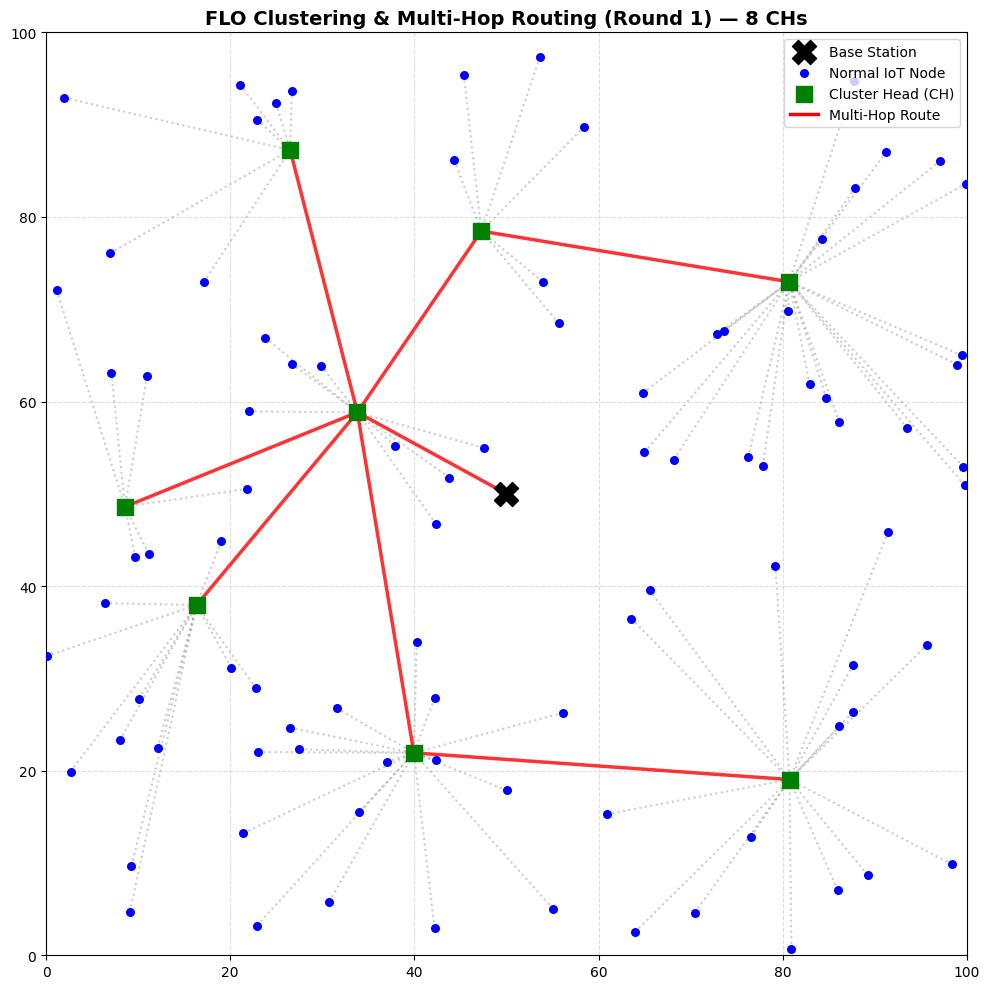

Round 0001/3500 | Alive: 100 | Energy: 49.9846 J
Round 0200/3500 | Alive: 100 | Energy: 46.9098 J
Round 0400/3500 | Alive: 100 | Energy: 43.8193 J
Round 0600/3500 | Alive: 100 | Energy: 40.7287 J
Round 0800/3500 | Alive: 100 | Energy: 37.6384 J
Round 1000/3500 | Alive: 100 | Energy: 34.5481 J
Round 1200/3500 | Alive: 100 | Energy: 31.4569 J
Round 1400/3500 | Alive: 100 | Energy: 28.3658 J
Round 1600/3500 | Alive: 100 | Energy: 25.2735 J
Round 1800/3500 | Alive: 097 | Energy: 22.2111 J
Round 2000/3500 | Alive: 094 | Energy: 19.2700 J
Round 2200/3500 | Alive: 091 | Energy: 16.4109 J
Round 2400/3500 | Alive: 088 | Energy: 13.6518 J
Round 2600/3500 | Alive: 078 | Energy: 11.0965 J
Round 2800/3500 | Alive: 072 | Energy: 8.7342 J
Round 3000/3500 | Alive: 067 | Energy: 6.5533 J
Round 3200/3500 | Alive: 052 | Energy: 4.7283 J
Round 3400/3500 | Alive: 034 | Energy: 3.3357 J
[DONE] FLO Simulation Concluded.

Network Lifetime Milestones (FLO):
  25% nodes dead  →  Round 2727
  50% nodes dead  →  

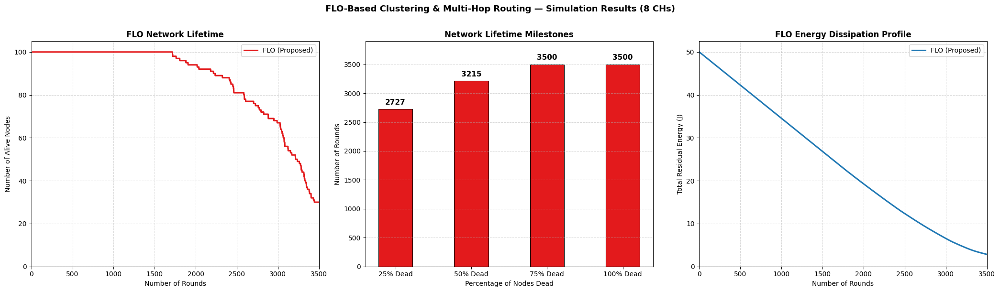

Plot saved → flo_results.png


In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS
# =========================================================================
AREA        = 100
NUM_NODES   = 100
BS_X, BS_Y  = 50, 50

INITIAL_ENERGY = 0.5        # Joules per node  →  50 J total
ROUNDS         = 3500
PACKET_SIZE    = 1500        # bits

E_ELEC = 50e-9              # 50 nJ/bit
E_AMP  = 10e-12             # 10 pJ/bit/m²

# ── FLO Clustering parameters ─────────────────────────────────────────────
NUM_LIZARDS = 20
NUM_CH      = 8
MAX_ITER    = 20

# β2=0.65 → optimizer strongly forced to pick highest-energy nodes as CHs
BETA1, BETA2, BETA3 = 0.20, 0.65, 0.15

# ── Multi-Hop Routing parameters ──────────────────────────────────────────
# R_BETA3=0.70 → relay chosen almost entirely by residual energy
R_BETA1, R_BETA2, R_BETA3 = 0.15, 0.15, 0.70

# ── CH Energy percentile threshold (dynamic) ──────────────────────────────
# Only top 60% energy nodes can become CH candidates each round
CH_ENERGY_PERCENTILE = 40   # bottom 40% excluded → top 60% eligible

# =========================================================================
# 2. CORE UTILITY CLASSES
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id     = node_id
        self.x      = x
        self.y      = y
        self.energy = INITIAL_ENERGY
        self.alive  = True
        self.is_CH  = False

def dist(x1, y1, x2, y2):
    return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)

def tx_energy(bits, d):
    return E_ELEC * bits + E_AMP * bits * d**2

def rx_energy(bits):
    return E_ELEC * bits

# =========================================================================
# 3. NETWORK TOPOLOGY PLOT
# =========================================================================
def plot_topology(nodes, clusters, routing_paths, title):
    plt.figure(figsize=(10, 10))

    for ch_id, member_ids in clusters.items():
        ch = nodes[ch_id]
        for m_id in member_ids:
            m = nodes[m_id]
            plt.plot([m.x, ch.x], [m.y, ch.y],
                     color='gray', linestyle=':', alpha=0.4)

    for ch_id, nh in routing_paths.items():
        ch = nodes[ch_id]
        if nh == 'BS':
            plt.plot([ch.x, BS_X], [ch.y, BS_Y],
                     color='red', linewidth=2.5, alpha=0.8)
        else:
            nh_node = nodes[nh]
            plt.plot([ch.x, nh_node.x], [ch.y, nh_node.y],
                     color='red', linewidth=2.5, alpha=0.8)

    for node in nodes:
        if not node.alive:
            plt.scatter(node.x, node.y, color='gray', alpha=0.5, s=20)
        elif node.is_CH:
            plt.scatter(node.x, node.y, color='green',
                        marker='s', s=120, zorder=5)
        else:
            plt.scatter(node.x, node.y, color='blue', s=30, zorder=5)

    plt.scatter(BS_X, BS_Y, color='black', marker='X',
                s=300, zorder=10, label='Base Station')
    plt.scatter([], [], color='blue',  s=30,  label='Normal IoT Node')
    plt.scatter([], [], color='green', marker='s', s=120, label='Cluster Head (CH)')
    plt.plot([],   [], color='red',   linewidth=2.5, label='Multi-Hop Route')

    plt.title(title, fontweight='bold', fontsize=14)
    plt.xlim(0, AREA); plt.ylim(0, AREA)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

# =========================================================================
# 4. FLO CLUSTERING FITNESS
# =========================================================================
def clustering_fitness(ch_ids, all_nodes):
    active = [n for n in all_nodes if n.alive]
    chs    = [all_nodes[i] for i in ch_ids]
    if not chs:
        return float('inf')

    f1 = sum(dist(ch.x, ch.y, BS_X, BS_Y) for ch in chs)

    total_energy = sum(n.energy for n in active) + 1e-9
    ch_energy    = sum(ch.energy for ch in chs)
    f2           = ch_energy / total_energy

    ch_set = set(ch_ids)
    f3 = sum(
        min(dist(n.x, n.y, ch.x, ch.y) for ch in chs)
        for n in active if n.id not in ch_set
    )

    return BETA1 * f1 + BETA2 * (1.0 / (f2 + 1e-6)) + BETA3 * f3

# =========================================================================
# 5. REPAIR HELPER
# =========================================================================
def _repair(sol, alive_list):
    seen    = set()
    cleaned = []
    for v in sol:
        if v not in seen:
            seen.add(v)
            cleaned.append(v)
    pool = [x for x in alive_list if x not in seen]
    random.shuffle(pool)
    while len(cleaned) < NUM_CH and pool:
        cleaned.append(pool.pop())
        seen.add(cleaned[-1])
    return cleaned[:NUM_CH]

# =========================================================================
# 6. FRILLED LIZARD OPTIMIZER
# =========================================================================
def execute_floa(node_pool, alive_idx):
    alive_list = list(alive_idx)

    # Dynamic percentile threshold — scales with network state automatically
    energies  = [node_pool[i].energy for i in alive_list]
    threshold = np.percentile(energies, CH_ENERGY_PERCENTILE)
    strong    = [i for i in alive_list if node_pool[i].energy >= threshold]

    if len(strong) < NUM_CH:
        strong = alive_list

    if len(strong) <= NUM_CH:
        return _repair(list(strong), alive_list)

    population = [random.sample(strong, NUM_CH) for _ in range(NUM_LIZARDS)]
    fitness    = [clustering_fitness(sol, node_pool) for sol in population]

    best_idx   = int(np.argmin(fitness))
    g_best_sol = list(population[best_idx])
    g_best_fit = fitness[best_idx]

    for t in range(1, MAX_ITER + 1):

        # Phase 1 – Exploration / Hunting
        for i in range(NUM_LIZARDS):
            prey_pool = [population[k]
                         for k in range(NUM_LIZARDS)
                         if fitness[k] < fitness[i]]
            prey_pool.append(g_best_sol)
            prey = random.choice(prey_pool)

            new_sol = []
            for j in range(NUM_CH):
                I_ij    = random.randint(0, 1)
                r_ij    = random.random()
                updated = population[i][j] + r_ij * (prey[j] - I_ij * population[i][j])
                nid     = int(round(updated))
                nid     = nid if nid in alive_idx else random.choice(strong)
                new_sol.append(nid)

            new_sol = _repair(new_sol, alive_list)
            new_fit = clustering_fitness(new_sol, node_pool)
            if new_fit < fitness[i]:
                population[i] = new_sol
                fitness[i]    = new_fit

        # Phase 2 – Exploitation / Tree-climbing
        for i in range(NUM_LIZARDS):
            new_sol = []
            for j in range(NUM_CH):
                r_ij    = random.random()
                updated = population[i][j] + (r_ij * (NUM_NODES - 1)) / t
                nid     = int(round(updated))
                nid     = nid if nid in alive_idx else random.choice(strong)
                new_sol.append(nid)

            new_sol = _repair(new_sol, alive_list)
            new_fit = clustering_fitness(new_sol, node_pool)
            if new_fit < fitness[i]:
                population[i] = new_sol
                fitness[i]    = new_fit

        iter_best = int(np.argmin(fitness))
        if fitness[iter_best] < g_best_fit:
            g_best_sol = list(population[iter_best])
            g_best_fit = fitness[iter_best]

    return g_best_sol

# =========================================================================
# 7. MULTI-HOP ROUTING COST
# =========================================================================
def routing_cost(ch_node, cand_node, dist_bs_cand):
    f1 = dist(ch_node.x, ch_node.y, cand_node.x, cand_node.y)
    f2 = dist_bs_cand
    f3 = 1.0 / (cand_node.energy + 1e-9)
    return R_BETA1 * f1 + R_BETA2 * f2 + R_BETA3 * f3

# =========================================================================
# 8. SIMULATION MAIN LOOP
# =========================================================================
random.seed(42)
np.random.seed(42)

node_network = [
    IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA))
    for i in range(NUM_NODES)
]

alive_history  = []
energy_history = []

print(f"[START] FLO Simulation | Nodes={NUM_NODES}  CHs={NUM_CH}  "
      f"Rounds={ROUNDS}  PacketSize={PACKET_SIZE} bits")
print("=" * 65)

for r in range(1, ROUNDS + 1):

    alive_idx = {n.id for n in node_network if n.alive}

    if len(alive_idx) < NUM_CH:
        remaining = ROUNDS - r + 1
        alive_history.extend( [len(alive_idx)] * remaining)
        energy_history.extend([sum(max(n.energy, 0) for n in node_network)] * remaining)
        print(f"\n[STOP] Network terminated at Round {r}  "
              f"(alive={len(alive_idx)} < required CHs={NUM_CH})")
        break

    for n in node_network:
        n.is_CH = False

    # ── Phase A : Clustering ──────────────────────────────────────────────
    ch_ids = execute_floa(node_network, alive_idx)
    for cid in ch_ids:
        node_network[cid].is_CH = True

    clusters = {cid: [] for cid in ch_ids}
    for n in node_network:
        if not n.alive or n.is_CH:
            continue
        nearest = min(ch_ids,
                      key=lambda c: dist(n.x, n.y,
                                         node_network[c].x, node_network[c].y))
        clusters[nearest].append(n.id)

    # ── Phase B : Multi-Hop Routing ───────────────────────────────────────
    dist_to_bs = {cid: dist(node_network[cid].x, node_network[cid].y, BS_X, BS_Y)
                  for cid in ch_ids}
    # Process furthest CHs first
    sorted_chs = sorted(ch_ids, key=lambda c: dist_to_bs[c], reverse=True)
    routing_paths = {}

    for cid in sorted_chs:
        ch_node    = node_network[cid]
        # Candidate relay: closer to BS AND still alive
        candidates = [c for c in ch_ids
                      if dist_to_bs[c] < dist_to_bs[cid]
                      and node_network[c].alive]
        if not candidates:
            routing_paths[cid] = 'BS'
        else:
            best_nh = min(candidates,
                          key=lambda c: routing_cost(
                              ch_node, node_network[c], dist_to_bs[c]))
            routing_paths[cid] = best_nh

    # Visualise Round 1
    if r == 1:
        plot_topology(node_network, clusters, routing_paths,
                      f"FLO Clustering & Multi-Hop Routing (Round 1) — {NUM_CH} CHs")

    # ── Phase C : Energy Drain ────────────────────────────────────────────

    # C1 – Normal nodes TX to their CH
    for cid, members in clusters.items():
        ch = node_network[cid]
        for mid in members:
            m = node_network[mid]
            if not m.alive:
                continue
            d_m_ch    = dist(m.x, m.y, ch.x, ch.y)
            m.energy -= tx_energy(PACKET_SIZE, d_m_ch)
            if m.energy <= 0:
                m.energy = 0
                m.alive  = False
            if ch.alive:
                ch.energy -= rx_energy(PACKET_SIZE)
                if ch.energy <= 0:
                    ch.energy = 0
                    ch.alive  = False

    # C2 – Multi-hop CH → next-hop → BS
    # ---------------------------------------------------------------
    # CORRECT aggregation model:
    #   Each CH aggregates ALL received member data into exactly
    #   ONE packet (PACKET_SIZE bits) before forwarding.
    #   Relay CHs receive one packet per upstream CH, aggregate
    #   them all into ONE packet, then forward ONE packet onward.
    #   This means every hop always transmits exactly PACKET_SIZE bits.
    #   No payload accumulation → no relay overload → no early death.
    # ---------------------------------------------------------------
    for cid in sorted_chs:
        ch = node_network[cid]
        if not ch.alive:
            continue

        nh = routing_paths[cid]

        # Always forward exactly ONE aggregated packet
        fwd_bits = PACKET_SIZE

        if nh == 'BS':
            ch.energy -= tx_energy(fwd_bits, dist_to_bs[cid])
            if ch.energy <= 0:
                ch.energy = 0
                ch.alive  = False
        else:
            nh_node = node_network[nh]
            d_ch_nh = dist(ch.x, ch.y, nh_node.x, nh_node.y)

            # Sender TX cost
            ch.energy -= tx_energy(fwd_bits, d_ch_nh)
            if ch.energy <= 0:
                ch.energy = 0
                ch.alive  = False

            # Relay RX cost (only if relay still alive)
            if nh_node.alive:
                nh_node.energy -= rx_energy(fwd_bits)
                if nh_node.energy <= 0:
                    nh_node.energy = 0
                    nh_node.alive  = False

    # ── Record metrics ────────────────────────────────────────────────────
    alive_count     = sum(1 for n in node_network if n.alive)
    residual_energy = sum(max(n.energy, 0) for n in node_network)
    alive_history.append(alive_count)
    energy_history.append(residual_energy)

    if r % 200 == 0 or r == 1:
        print(f"Round {r:04d}/{ROUNDS} | Alive: {alive_count:03d} "
              f"| Energy: {residual_energy:.4f} J")

print("=" * 65)
print("[DONE] FLO Simulation Concluded.\n")

# =========================================================================
# 9. NETWORK LIFETIME MILESTONES
# =========================================================================
milestone_labels = ['25%', '50%', '75%', '100%']
milestones       = []

for pct in [25, 50, 75, 100]:
    target_alive = NUM_NODES - int(NUM_NODES * pct / 100)
    round_reached = ROUNDS
    for idx, a in enumerate(alive_history):
        if a <= target_alive:
            round_reached = idx + 1
            break
    milestones.append(round_reached)

print("Network Lifetime Milestones (FLO):")
for lbl, rnd in zip(milestone_labels, milestones):
    print(f"  {lbl} nodes dead  →  Round {rnd}")

# =========================================================================
# 10. FINAL PLOTS  (1 × 3 layout — FLO only)
# =========================================================================
fig, axes = plt.subplots(1, 3, figsize=(21, 6))
round_axis = range(1, ROUNDS + 1)

# Plot 1 – Alive nodes over time
ax = axes[0]
ax.plot(round_axis, alive_history, color='#e31a1c', linewidth=2.2,
        label='FLO (Proposed)')
ax.set_title("FLO Network Lifetime", fontweight='bold')
ax.set_xlabel("Number of Rounds")
ax.set_ylabel("Number of Alive Nodes")
ax.set_xlim(0, ROUNDS)
ax.set_ylim(0, NUM_NODES + 5)
ax.set_xticks(range(0, ROUNDS + 1, 500))
ax.grid(True, linestyle='--', alpha=0.5)
ax.legend(loc='upper right', fontsize=10)

# Plot 2 – Milestone bar chart
ax   = axes[1]
x    = np.arange(len(milestone_labels))
bars = ax.bar(x, milestones, color='#e31a1c', width=0.45,
              edgecolor='black', linewidth=0.8)
ax.set_title("Network Lifetime Milestones", fontweight='bold')
ax.set_xlabel("Percentage of Nodes Dead")
ax.set_ylabel("Number of Rounds")
ax.set_xticks(x)
ax.set_xticklabels(['25% Dead', '50% Dead', '75% Dead', '100% Dead'])
ax.set_ylim(0, ROUNDS + 400)
ax.grid(True, linestyle='--', alpha=0.5, axis='y')
for bar, val in zip(bars, milestones):
    ax.text(bar.get_x() + bar.get_width() / 2,
            bar.get_height() + ROUNDS * 0.015,
            str(val), ha='center', va='bottom',
            fontweight='bold', fontsize=11)

# Plot 3 – Residual energy
ax = axes[2]
ax.plot(round_axis, energy_history, color='#1f78b4', linewidth=2.2,
        label='FLO (Proposed)')
ax.set_title("FLO Energy Dissipation Profile", fontweight='bold')
ax.set_xlabel("Number of Rounds")
ax.set_ylabel("Total Residual Energy (J)")
ax.set_xlim(0, ROUNDS)
ax.set_ylim(0, NUM_NODES * INITIAL_ENERGY * 1.05)
ax.set_xticks(range(0, ROUNDS + 1, 500))
ax.grid(True, linestyle='--', alpha=0.5)
ax.legend(loc='upper right', fontsize=10)

plt.suptitle(
    "FLO-Based Clustering & Multi-Hop Routing — Simulation Results (8 CHs)",
    fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig("flo_results.png", dpi=150, bbox_inches='tight')
plt.show()
print("Plot saved → flo_results.png")

[START] FLO Simulation | Nodes=200  CHs=8  Rounds=3500  PacketSize=1500 bits


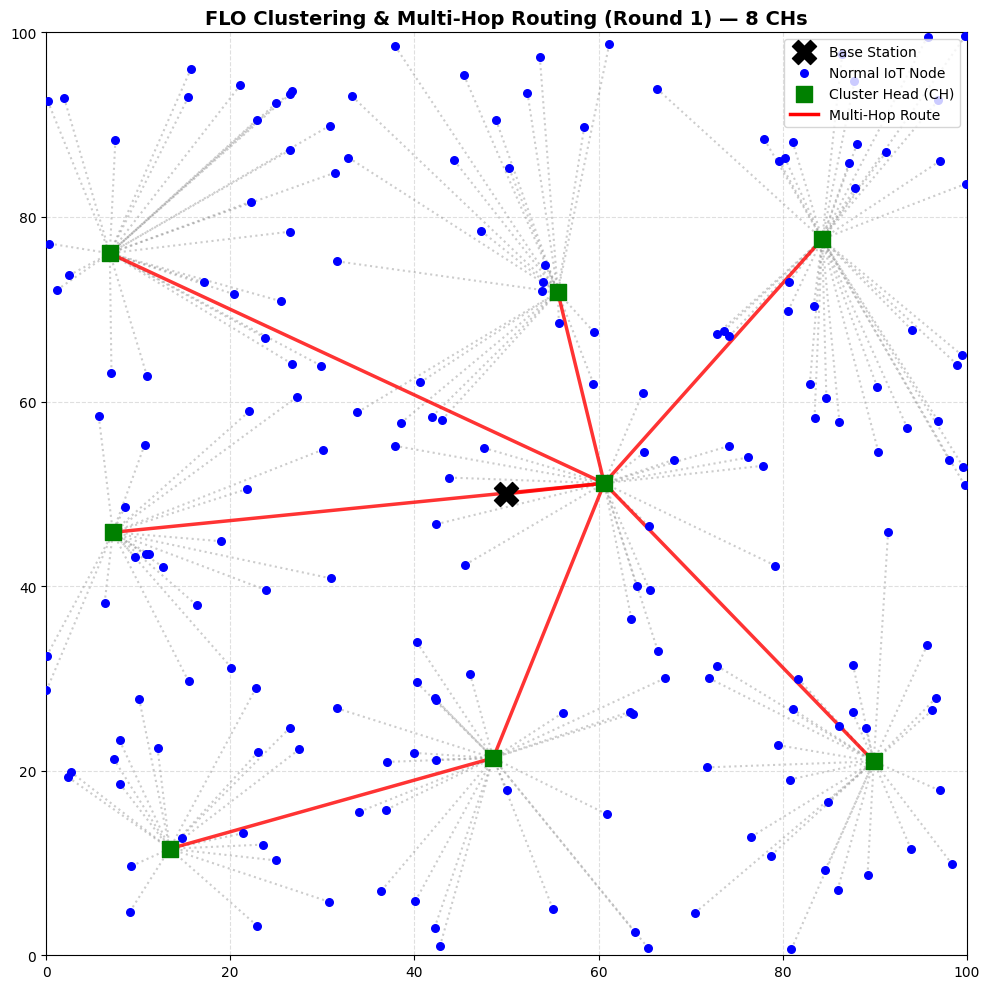

Round 0001/3500 | Alive: 200 | Energy: 99.9691 J
Round 0200/3500 | Alive: 200 | Energy: 93.8258 J
Round 0400/3500 | Alive: 200 | Energy: 87.6515 J
Round 0600/3500 | Alive: 200 | Energy: 81.4775 J
Round 0800/3500 | Alive: 200 | Energy: 75.3032 J
Round 1000/3500 | Alive: 200 | Energy: 69.1284 J
Round 1200/3500 | Alive: 200 | Energy: 62.9537 J
Round 1400/3500 | Alive: 200 | Energy: 56.7788 J
Round 1600/3500 | Alive: 199 | Energy: 50.6117 J
Round 1800/3500 | Alive: 195 | Energy: 44.4960 J
Round 2000/3500 | Alive: 190 | Energy: 38.6035 J
Round 2200/3500 | Alive: 187 | Energy: 32.7669 J
Round 2400/3500 | Alive: 179 | Energy: 27.1166 J
Round 2600/3500 | Alive: 162 | Energy: 21.8066 J
Round 2800/3500 | Alive: 149 | Energy: 17.0056 J
Round 3000/3500 | Alive: 131 | Energy: 12.6108 J
Round 3200/3500 | Alive: 100 | Energy: 9.0577 J
Round 3400/3500 | Alive: 072 | Energy: 6.3581 J
[DONE] FLO Simulation Concluded.

Network Lifetime Milestones (FLO):
  25% nodes dead  →  Round 2774
  50% nodes dead  →

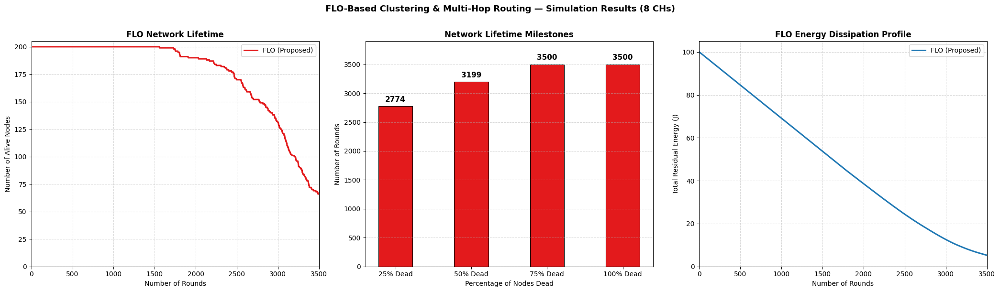

Plot saved → flo_results.png


In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS
# =========================================================================
AREA        = 100
NUM_NODES   = 200  # ---> MODIFIED: Increased to 200 nodes <---
BS_X, BS_Y  = 50, 50

INITIAL_ENERGY = 0.5        # Joules per node
ROUNDS         = 3500
PACKET_SIZE    = 1500        # bits

E_ELEC = 50e-9              # 50 nJ/bit
E_AMP  = 10e-12             # 10 pJ/bit/m²

# ── FLO Clustering parameters ─────────────────────────────────────────────
NUM_LIZARDS = 20
NUM_CH      = 8    # ---> KEPT SAME: 8 Cluster Heads <---
MAX_ITER    = 20

# β2=0.65 → optimizer strongly forced to pick highest-energy nodes as CHs
BETA1, BETA2, BETA3 = 0.20, 0.65, 0.15

# ── Multi-Hop Routing parameters ──────────────────────────────────────────
# R_BETA3=0.70 → relay chosen almost entirely by residual energy
R_BETA1, R_BETA2, R_BETA3 = 0.15, 0.15, 0.70

# ── CH Energy percentile threshold (dynamic) ──────────────────────────────
# Only top 60% energy nodes can become CH candidates each round
CH_ENERGY_PERCENTILE = 40   # bottom 40% excluded → top 60% eligible

# =========================================================================
# 2. CORE UTILITY CLASSES
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id     = node_id
        self.x      = x
        self.y      = y
        self.energy = INITIAL_ENERGY
        self.alive  = True
        self.is_CH  = False

def dist(x1, y1, x2, y2):
    return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)

def tx_energy(bits, d):
    return E_ELEC * bits + E_AMP * bits * d**2

def rx_energy(bits):
    return E_ELEC * bits

# =========================================================================
# 3. NETWORK TOPOLOGY PLOT
# =========================================================================
def plot_topology(nodes, clusters, routing_paths, title):
    plt.figure(figsize=(10, 10))

    for ch_id, member_ids in clusters.items():
        ch = nodes[ch_id]
        for m_id in member_ids:
            m = nodes[m_id]
            plt.plot([m.x, ch.x], [m.y, ch.y],
                     color='gray', linestyle=':', alpha=0.4)

    for ch_id, nh in routing_paths.items():
        ch = nodes[ch_id]
        if nh == 'BS':
            plt.plot([ch.x, BS_X], [ch.y, BS_Y],
                     color='red', linewidth=2.5, alpha=0.8)
        else:
            nh_node = nodes[nh]
            plt.plot([ch.x, nh_node.x], [ch.y, nh_node.y],
                     color='red', linewidth=2.5, alpha=0.8)

    for node in nodes:
        if not node.alive:
            plt.scatter(node.x, node.y, color='gray', alpha=0.5, s=20)
        elif node.is_CH:
            plt.scatter(node.x, node.y, color='green',
                        marker='s', s=120, zorder=5)
        else:
            plt.scatter(node.x, node.y, color='blue', s=30, zorder=5)

    plt.scatter(BS_X, BS_Y, color='black', marker='X',
                s=300, zorder=10, label='Base Station')
    plt.scatter([], [], color='blue',  s=30,  label='Normal IoT Node')
    plt.scatter([], [], color='green', marker='s', s=120, label='Cluster Head (CH)')
    plt.plot([],   [], color='red',   linewidth=2.5, label='Multi-Hop Route')

    plt.title(title, fontweight='bold', fontsize=14)
    plt.xlim(0, AREA); plt.ylim(0, AREA)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

# =========================================================================
# 4. FLO CLUSTERING FITNESS
# =========================================================================
def clustering_fitness(ch_ids, all_nodes):
    active = [n for n in all_nodes if n.alive]
    chs    = [all_nodes[i] for i in ch_ids]
    if not chs:
        return float('inf')

    f1 = sum(dist(ch.x, ch.y, BS_X, BS_Y) for ch in chs)

    total_energy = sum(n.energy for n in active) + 1e-9
    ch_energy    = sum(ch.energy for ch in chs)
    f2           = ch_energy / total_energy

    ch_set = set(ch_ids)
    f3 = sum(
        min(dist(n.x, n.y, ch.x, ch.y) for ch in chs)
        for n in active if n.id not in ch_set
    )

    return BETA1 * f1 + BETA2 * (1.0 / (f2 + 1e-6)) + BETA3 * f3

# =========================================================================
# 5. REPAIR HELPER
# =========================================================================
def _repair(sol, alive_list):
    seen    = set()
    cleaned = []
    for v in sol:
        if v not in seen:
            seen.add(v)
            cleaned.append(v)
    pool = [x for x in alive_list if x not in seen]
    random.shuffle(pool)
    while len(cleaned) < NUM_CH and pool:
        cleaned.append(pool.pop())
        seen.add(cleaned[-1])
    return cleaned[:NUM_CH]

# =========================================================================
# 6. FRILLED LIZARD OPTIMIZER
# =========================================================================
def execute_floa(node_pool, alive_idx):
    alive_list = list(alive_idx)

    # Dynamic percentile threshold — scales with network state automatically
    energies  = [node_pool[i].energy for i in alive_list]
    threshold = np.percentile(energies, CH_ENERGY_PERCENTILE)
    strong    = [i for i in alive_list if node_pool[i].energy >= threshold]

    if len(strong) < NUM_CH:
        strong = alive_list

    if len(strong) <= NUM_CH:
        return _repair(list(strong), alive_list)

    population = [random.sample(strong, NUM_CH) for _ in range(NUM_LIZARDS)]
    fitness    = [clustering_fitness(sol, node_pool) for sol in population]

    best_idx   = int(np.argmin(fitness))
    g_best_sol = list(population[best_idx])
    g_best_fit = fitness[best_idx]

    for t in range(1, MAX_ITER + 1):

        # Phase 1 – Exploration / Hunting
        for i in range(NUM_LIZARDS):
            prey_pool = [population[k]
                         for k in range(NUM_LIZARDS)
                         if fitness[k] < fitness[i]]
            prey_pool.append(g_best_sol)
            prey = random.choice(prey_pool)

            new_sol = []
            for j in range(NUM_CH):
                I_ij    = random.randint(0, 1)
                r_ij    = random.random()
                updated = population[i][j] + r_ij * (prey[j] - I_ij * population[i][j])
                nid     = int(round(updated))
                nid     = nid if nid in alive_idx else random.choice(strong)
                new_sol.append(nid)

            new_sol = _repair(new_sol, alive_list)
            new_fit = clustering_fitness(new_sol, node_pool)
            if new_fit < fitness[i]:
                population[i] = new_sol
                fitness[i]    = new_fit

        # Phase 2 – Exploitation / Tree-climbing
        for i in range(NUM_LIZARDS):
            new_sol = []
            for j in range(NUM_CH):
                r_ij    = random.random()
                updated = population[i][j] + (r_ij * (NUM_NODES - 1)) / t
                nid     = int(round(updated))
                nid     = nid if nid in alive_idx else random.choice(strong)
                new_sol.append(nid)

            new_sol = _repair(new_sol, alive_list)
            new_fit = clustering_fitness(new_sol, node_pool)
            if new_fit < fitness[i]:
                population[i] = new_sol
                fitness[i]    = new_fit

        iter_best = int(np.argmin(fitness))
        if fitness[iter_best] < g_best_fit:
            g_best_sol = list(population[iter_best])
            g_best_fit = fitness[iter_best]

    return g_best_sol

# =========================================================================
# 7. MULTI-HOP ROUTING COST
# =========================================================================
def routing_cost(ch_node, cand_node, dist_bs_cand):
    f1 = dist(ch_node.x, ch_node.y, cand_node.x, cand_node.y)
    f2 = dist_bs_cand
    f3 = 1.0 / (cand_node.energy + 1e-9)
    return R_BETA1 * f1 + R_BETA2 * f2 + R_BETA3 * f3

# =========================================================================
# 8. SIMULATION MAIN LOOP
# =========================================================================
random.seed(42)
np.random.seed(42)

node_network = [
    IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA))
    for i in range(NUM_NODES)
]

alive_history  = []
energy_history = []

print(f"[START] FLO Simulation | Nodes={NUM_NODES}  CHs={NUM_CH}  "
      f"Rounds={ROUNDS}  PacketSize={PACKET_SIZE} bits")
print("=" * 65)

for r in range(1, ROUNDS + 1):

    alive_idx = {n.id for n in node_network if n.alive}

    if len(alive_idx) < NUM_CH:
        remaining = ROUNDS - r + 1
        alive_history.extend( [len(alive_idx)] * remaining)
        energy_history.extend([sum(max(n.energy, 0) for n in node_network)] * remaining)
        print(f"\n[STOP] Network terminated at Round {r}  "
              f"(alive={len(alive_idx)} < required CHs={NUM_CH})")
        break

    for n in node_network:
        n.is_CH = False

    # ── Phase A : Clustering ──────────────────────────────────────────────
    ch_ids = execute_floa(node_network, alive_idx)
    for cid in ch_ids:
        node_network[cid].is_CH = True

    clusters = {cid: [] for cid in ch_ids}
    for n in node_network:
        if not n.alive or n.is_CH:
            continue
        nearest = min(ch_ids,
                      key=lambda c: dist(n.x, n.y,
                                         node_network[c].x, node_network[c].y))
        clusters[nearest].append(n.id)

    # ── Phase B : Multi-Hop Routing ───────────────────────────────────────
    dist_to_bs = {cid: dist(node_network[cid].x, node_network[cid].y, BS_X, BS_Y)
                  for cid in ch_ids}
    # Process furthest CHs first
    sorted_chs = sorted(ch_ids, key=lambda c: dist_to_bs[c], reverse=True)
    routing_paths = {}

    for cid in sorted_chs:
        ch_node    = node_network[cid]
        # Candidate relay: closer to BS AND still alive
        candidates = [c for c in ch_ids
                      if dist_to_bs[c] < dist_to_bs[cid]
                      and node_network[c].alive]
        if not candidates:
            routing_paths[cid] = 'BS'
        else:
            best_nh = min(candidates,
                          key=lambda c: routing_cost(
                              ch_node, node_network[c], dist_to_bs[c]))
            routing_paths[cid] = best_nh

    # Visualise Round 1
    if r == 1:
        plot_topology(node_network, clusters, routing_paths,
                      f"FLO Clustering & Multi-Hop Routing (Round 1) — {NUM_CH} CHs")

    # ── Phase C : Energy Drain ────────────────────────────────────────────

    # C1 – Normal nodes TX to their CH
    for cid, members in clusters.items():
        ch = node_network[cid]
        for mid in members:
            m = node_network[mid]
            if not m.alive:
                continue
            d_m_ch    = dist(m.x, m.y, ch.x, ch.y)
            m.energy -= tx_energy(PACKET_SIZE, d_m_ch)
            if m.energy <= 0:
                m.energy = 0
                m.alive  = False
            if ch.alive:
                ch.energy -= rx_energy(PACKET_SIZE)
                if ch.energy <= 0:
                    ch.energy = 0
                    ch.alive  = False

    # C2 – Multi-hop CH → next-hop → BS
    # ---------------------------------------------------------------
    # CORRECT aggregation model:
    #   Each CH aggregates ALL received member data into exactly
    #   ONE packet (PACKET_SIZE bits) before forwarding.
    #   Relay CHs receive one packet per upstream CH, aggregate
    #   them all into ONE packet, then forward ONE packet onward.
    #   This means every hop always transmits exactly PACKET_SIZE bits.
    #   No payload accumulation → no relay overload → no early death.
    # ---------------------------------------------------------------
    for cid in sorted_chs:
        ch = node_network[cid]
        if not ch.alive:
            continue

        nh = routing_paths[cid]

        # Always forward exactly ONE aggregated packet
        fwd_bits = PACKET_SIZE

        if nh == 'BS':
            ch.energy -= tx_energy(fwd_bits, dist_to_bs[cid])
            if ch.energy <= 0:
                ch.energy = 0
                ch.alive  = False
        else:
            nh_node = node_network[nh]
            d_ch_nh = dist(ch.x, ch.y, nh_node.x, nh_node.y)

            # Sender TX cost
            ch.energy -= tx_energy(fwd_bits, d_ch_nh)
            if ch.energy <= 0:
                ch.energy = 0
                ch.alive  = False

            # Relay RX cost (only if relay still alive)
            if nh_node.alive:
                nh_node.energy -= rx_energy(fwd_bits)
                if nh_node.energy <= 0:
                    nh_node.energy = 0
                    nh_node.alive  = False

    # ── Record metrics ────────────────────────────────────────────────────
    alive_count     = sum(1 for n in node_network if n.alive)
    residual_energy = sum(max(n.energy, 0) for n in node_network)
    alive_history.append(alive_count)
    energy_history.append(residual_energy)

    if r % 200 == 0 or r == 1:
        print(f"Round {r:04d}/{ROUNDS} | Alive: {alive_count:03d} "
              f"| Energy: {residual_energy:.4f} J")

print("=" * 65)
print("[DONE] FLO Simulation Concluded.\n")

# =========================================================================
# 9. NETWORK LIFETIME MILESTONES
# =========================================================================
milestone_labels = ['25%', '50%', '75%', '100%']
milestones       = []

for pct in [25, 50, 75, 100]:
    target_alive = NUM_NODES - int(NUM_NODES * pct / 100)
    round_reached = ROUNDS
    for idx, a in enumerate(alive_history):
        if a <= target_alive:
            round_reached = idx + 1
            break
    milestones.append(round_reached)

print("Network Lifetime Milestones (FLO):")
for lbl, rnd in zip(milestone_labels, milestones):
    print(f"  {lbl} nodes dead  →  Round {rnd}")

# =========================================================================
# 10. FINAL PLOTS  (1 × 3 layout — FLO only)
# =========================================================================
fig, axes = plt.subplots(1, 3, figsize=(21, 6))
round_axis = range(1, ROUNDS + 1)

# Plot 1 – Alive nodes over time
ax = axes[0]
ax.plot(round_axis, alive_history, color='#e31a1c', linewidth=2.2,
        label='FLO (Proposed)')
ax.set_title("FLO Network Lifetime", fontweight='bold')
ax.set_xlabel("Number of Rounds")
ax.set_ylabel("Number of Alive Nodes")
ax.set_xlim(0, ROUNDS)
ax.set_ylim(0, NUM_NODES + 5)
ax.set_xticks(range(0, ROUNDS + 1, 500))
ax.grid(True, linestyle='--', alpha=0.5)
ax.legend(loc='upper right', fontsize=10)

# Plot 2 – Milestone bar chart
ax   = axes[1]
x    = np.arange(len(milestone_labels))
bars = ax.bar(x, milestones, color='#e31a1c', width=0.45,
              edgecolor='black', linewidth=0.8)
ax.set_title("Network Lifetime Milestones", fontweight='bold')
ax.set_xlabel("Percentage of Nodes Dead")
ax.set_ylabel("Number of Rounds")
ax.set_xticks(x)
ax.set_xticklabels(['25% Dead', '50% Dead', '75% Dead', '100% Dead'])
ax.set_ylim(0, ROUNDS + 400)
ax.grid(True, linestyle='--', alpha=0.5, axis='y')
for bar, val in zip(bars, milestones):
    ax.text(bar.get_x() + bar.get_width() / 2,
            bar.get_height() + ROUNDS * 0.015,
            str(val), ha='center', va='bottom',
            fontweight='bold', fontsize=11)

# Plot 3 – Residual energy
ax = axes[2]
ax.plot(round_axis, energy_history, color='#1f78b4', linewidth=2.2,
        label='FLO (Proposed)')
ax.set_title("FLO Energy Dissipation Profile", fontweight='bold')
ax.set_xlabel("Number of Rounds")
ax.set_ylabel("Total Residual Energy (J)")
ax.set_xlim(0, ROUNDS)
ax.set_ylim(0, NUM_NODES * INITIAL_ENERGY * 1.05)
ax.set_xticks(range(0, ROUNDS + 1, 500))
ax.grid(True, linestyle='--', alpha=0.5)
ax.legend(loc='upper right', fontsize=10)

plt.suptitle(
    "FLO-Based Clustering & Multi-Hop Routing — Simulation Results (8 CHs)",
    fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig("flo_results.png", dpi=150, bbox_inches='tight')
plt.show()
print("Plot saved → flo_results.png")

[START] FLO Simulation | Nodes=300  CHs=8  Rounds=3500  PacketSize=1500 bits


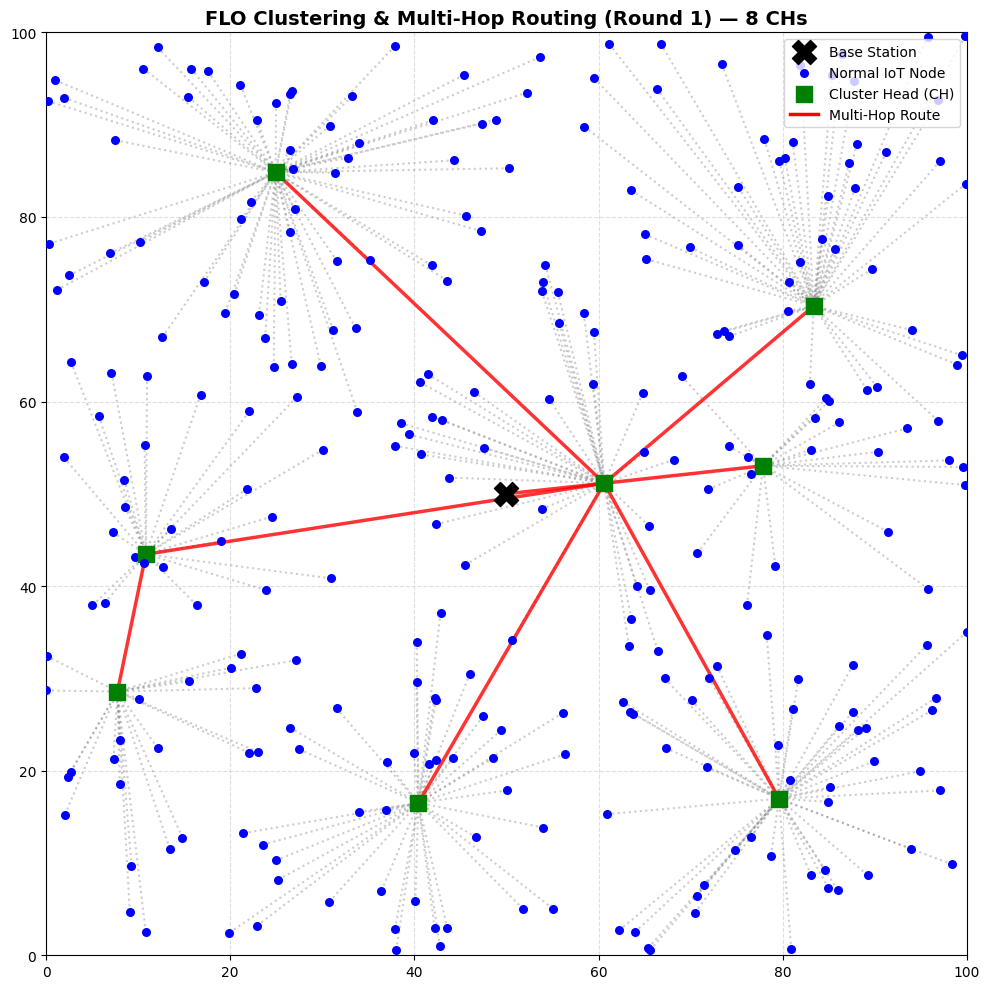

Round 0001/3500 | Alive: 300 | Energy: 149.9537 J
Round 0200/3500 | Alive: 300 | Energy: 140.7440 J
Round 0400/3500 | Alive: 300 | Energy: 131.4871 J
Round 0600/3500 | Alive: 300 | Energy: 122.2305 J
Round 0800/3500 | Alive: 300 | Energy: 112.9727 J
Round 1000/3500 | Alive: 300 | Energy: 103.7154 J
Round 1200/3500 | Alive: 300 | Energy: 94.4581 J
Round 1400/3500 | Alive: 300 | Energy: 85.1987 J
Round 1600/3500 | Alive: 299 | Energy: 75.9478 J
Round 1800/3500 | Alive: 293 | Energy: 66.8036 J
Round 2000/3500 | Alive: 284 | Energy: 57.8692 J
Round 2200/3500 | Alive: 277 | Energy: 49.2197 J
Round 2400/3500 | Alive: 265 | Energy: 40.8351 J
Round 2600/3500 | Alive: 244 | Energy: 32.9004 J
Round 2800/3500 | Alive: 223 | Energy: 25.6443 J
Round 3000/3500 | Alive: 198 | Energy: 19.0623 J
Round 3200/3500 | Alive: 161 | Energy: 13.4069 J
Round 3400/3500 | Alive: 114 | Energy: 9.0545 J
[DONE] FLO Simulation Concluded.

Network Lifetime Milestones (FLO):
  25% nodes dead  →  Round 2781
  50% nodes 

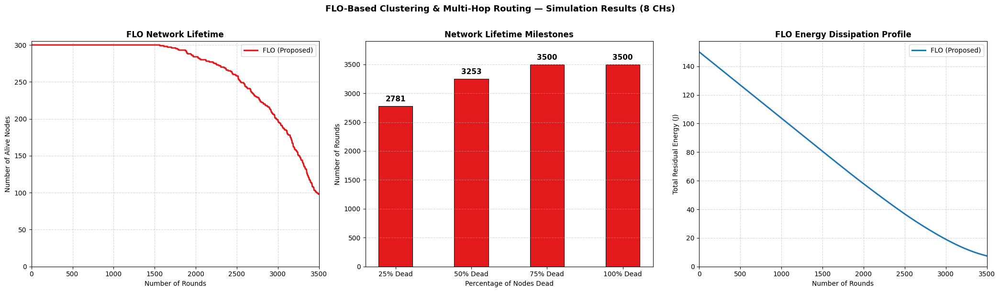

Plot saved → flo_results.png


In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS
# =========================================================================
AREA        = 100
NUM_NODES   = 300  # ---> MODIFIED: Increased to 300 nodes <---
BS_X, BS_Y  = 50, 50

INITIAL_ENERGY = 0.5        # Joules per node
ROUNDS         = 3500
PACKET_SIZE    = 1500       # bits

E_ELEC = 50e-9              # 50 nJ/bit
E_AMP  = 10e-12             # 10 pJ/bit/m²

# ── FLO Clustering parameters ─────────────────────────────────────────────
NUM_LIZARDS = 20
NUM_CH      = 8             # ---> KEPT SAME: 8 Cluster Heads <---
MAX_ITER    = 20

# β2=0.65 → optimizer strongly forced to pick highest-energy nodes as CHs
BETA1, BETA2, BETA3 = 0.20, 0.65, 0.15

# ── Multi-Hop Routing parameters ──────────────────────────────────────────
# R_BETA3=0.70 → relay chosen almost entirely by residual energy
R_BETA1, R_BETA2, R_BETA3 = 0.15, 0.15, 0.70

# ── CH Energy percentile threshold (dynamic) ──────────────────────────────
# Only top 60% energy nodes can become CH candidates each round
CH_ENERGY_PERCENTILE = 40   # bottom 40% excluded → top 60% eligible

# =========================================================================
# 2. CORE UTILITY CLASSES
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id     = node_id
        self.x      = x
        self.y      = y
        self.energy = INITIAL_ENERGY
        self.alive  = True
        self.is_CH  = False

def dist(x1, y1, x2, y2):
    return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)

def tx_energy(bits, d):
    return E_ELEC * bits + E_AMP * bits * d**2

def rx_energy(bits):
    return E_ELEC * bits

# =========================================================================
# 3. NETWORK TOPOLOGY PLOT
# =========================================================================
def plot_topology(nodes, clusters, routing_paths, title):
    plt.figure(figsize=(10, 10))

    for ch_id, member_ids in clusters.items():
        ch = nodes[ch_id]
        for m_id in member_ids:
            m = nodes[m_id]
            plt.plot([m.x, ch.x], [m.y, ch.y],
                     color='gray', linestyle=':', alpha=0.4)

    for ch_id, nh in routing_paths.items():
        ch = nodes[ch_id]
        if nh == 'BS':
            plt.plot([ch.x, BS_X], [ch.y, BS_Y],
                     color='red', linewidth=2.5, alpha=0.8)
        else:
            nh_node = nodes[nh]
            plt.plot([ch.x, nh_node.x], [ch.y, nh_node.y],
                     color='red', linewidth=2.5, alpha=0.8)

    for node in nodes:
        if not node.alive:
            plt.scatter(node.x, node.y, color='gray', alpha=0.5, s=20)
        elif node.is_CH:
            plt.scatter(node.x, node.y, color='green',
                        marker='s', s=120, zorder=5)
        else:
            plt.scatter(node.x, node.y, color='blue', s=30, zorder=5)

    plt.scatter(BS_X, BS_Y, color='black', marker='X',
                s=300, zorder=10, label='Base Station')
    plt.scatter([], [], color='blue',  s=30,  label='Normal IoT Node')
    plt.scatter([], [], color='green', marker='s', s=120, label='Cluster Head (CH)')
    plt.plot([],   [], color='red',   linewidth=2.5, label='Multi-Hop Route')

    plt.title(title, fontweight='bold', fontsize=14)
    plt.xlim(0, AREA); plt.ylim(0, AREA)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

# =========================================================================
# 4. FLO CLUSTERING FITNESS
# =========================================================================
def clustering_fitness(ch_ids, all_nodes):
    active = [n for n in all_nodes if n.alive]
    chs    = [all_nodes[i] for i in ch_ids]
    if not chs:
        return float('inf')

    f1 = sum(dist(ch.x, ch.y, BS_X, BS_Y) for ch in chs)

    total_energy = sum(n.energy for n in active) + 1e-9
    ch_energy    = sum(ch.energy for ch in chs)
    f2           = ch_energy / total_energy

    ch_set = set(ch_ids)
    f3 = sum(
        min(dist(n.x, n.y, ch.x, ch.y) for ch in chs)
        for n in active if n.id not in ch_set
    )

    return BETA1 * f1 + BETA2 * (1.0 / (f2 + 1e-6)) + BETA3 * f3

# =========================================================================
# 5. REPAIR HELPER
# =========================================================================
def _repair(sol, alive_list):
    seen    = set()
    cleaned = []
    for v in sol:
        if v not in seen:
            seen.add(v)
            cleaned.append(v)
    pool = [x for x in alive_list if x not in seen]
    random.shuffle(pool)
    while len(cleaned) < NUM_CH and pool:
        cleaned.append(pool.pop())
        seen.add(cleaned[-1])
    return cleaned[:NUM_CH]

# =========================================================================
# 6. FRILLED LIZARD OPTIMIZER
# =========================================================================
def execute_floa(node_pool, alive_idx):
    alive_list = list(alive_idx)

    # Dynamic percentile threshold — scales with network state automatically
    energies  = [node_pool[i].energy for i in alive_list]
    threshold = np.percentile(energies, CH_ENERGY_PERCENTILE)
    strong    = [i for i in alive_list if node_pool[i].energy >= threshold]

    if len(strong) < NUM_CH:
        strong = alive_list

    if len(strong) <= NUM_CH:
        return _repair(list(strong), alive_list)

    population = [random.sample(strong, NUM_CH) for _ in range(NUM_LIZARDS)]
    fitness    = [clustering_fitness(sol, node_pool) for sol in population]

    best_idx   = int(np.argmin(fitness))
    g_best_sol = list(population[best_idx])
    g_best_fit = fitness[best_idx]

    for t in range(1, MAX_ITER + 1):

        # Phase 1 – Exploration / Hunting
        for i in range(NUM_LIZARDS):
            prey_pool = [population[k]
                         for k in range(NUM_LIZARDS)
                         if fitness[k] < fitness[i]]
            prey_pool.append(g_best_sol)
            prey = random.choice(prey_pool)

            new_sol = []
            for j in range(NUM_CH):
                I_ij    = random.randint(0, 1)
                r_ij    = random.random()
                updated = population[i][j] + r_ij * (prey[j] - I_ij * population[i][j])
                nid     = int(round(updated))
                nid     = nid if nid in alive_idx else random.choice(strong)
                new_sol.append(nid)

            new_sol = _repair(new_sol, alive_list)
            new_fit = clustering_fitness(new_sol, node_pool)
            if new_fit < fitness[i]:
                population[i] = new_sol
                fitness[i]    = new_fit

        # Phase 2 – Exploitation / Tree-climbing
        for i in range(NUM_LIZARDS):
            new_sol = []
            for j in range(NUM_CH):
                r_ij    = random.random()
                updated = population[i][j] + (r_ij * (NUM_NODES - 1)) / t
                nid     = int(round(updated))
                nid     = nid if nid in alive_idx else random.choice(strong)
                new_sol.append(nid)

            new_sol = _repair(new_sol, alive_list)
            new_fit = clustering_fitness(new_sol, node_pool)
            if new_fit < fitness[i]:
                population[i] = new_sol
                fitness[i]    = new_fit

        iter_best = int(np.argmin(fitness))
        if fitness[iter_best] < g_best_fit:
            g_best_sol = list(population[iter_best])
            g_best_fit = fitness[iter_best]

    return g_best_sol

# =========================================================================
# 7. MULTI-HOP ROUTING COST
# =========================================================================
def routing_cost(ch_node, cand_node, dist_bs_cand):
    f1 = dist(ch_node.x, ch_node.y, cand_node.x, cand_node.y)
    f2 = dist_bs_cand
    f3 = 1.0 / (cand_node.energy + 1e-9)
    return R_BETA1 * f1 + R_BETA2 * f2 + R_BETA3 * f3

# =========================================================================
# 8. SIMULATION MAIN LOOP
# =========================================================================
random.seed(42)
np.random.seed(42)

node_network = [
    IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA))
    for i in range(NUM_NODES)
]

alive_history  = []
energy_history = []

print(f"[START] FLO Simulation | Nodes={NUM_NODES}  CHs={NUM_CH}  "
      f"Rounds={ROUNDS}  PacketSize={PACKET_SIZE} bits")
print("=" * 65)

for r in range(1, ROUNDS + 1):

    alive_idx = {n.id for n in node_network if n.alive}

    if len(alive_idx) < NUM_CH:
        remaining = ROUNDS - r + 1
        alive_history.extend( [len(alive_idx)] * remaining)
        energy_history.extend([sum(max(n.energy, 0) for n in node_network)] * remaining)
        print(f"\n[STOP] Network terminated at Round {r}  "
              f"(alive={len(alive_idx)} < required CHs={NUM_CH})")
        break

    for n in node_network:
        n.is_CH = False

    # ── Phase A : Clustering ──────────────────────────────────────────────
    ch_ids = execute_floa(node_network, alive_idx)
    for cid in ch_ids:
        node_network[cid].is_CH = True

    clusters = {cid: [] for cid in ch_ids}
    for n in node_network:
        if not n.alive or n.is_CH:
            continue
        nearest = min(ch_ids,
                      key=lambda c: dist(n.x, n.y,
                                         node_network[c].x, node_network[c].y))
        clusters[nearest].append(n.id)

    # ── Phase B : Multi-Hop Routing ───────────────────────────────────────
    dist_to_bs = {cid: dist(node_network[cid].x, node_network[cid].y, BS_X, BS_Y)
                  for cid in ch_ids}
    # Process furthest CHs first
    sorted_chs = sorted(ch_ids, key=lambda c: dist_to_bs[c], reverse=True)
    routing_paths = {}

    for cid in sorted_chs:
        ch_node    = node_network[cid]
        # Candidate relay: closer to BS AND still alive
        candidates = [c for c in ch_ids
                      if dist_to_bs[c] < dist_to_bs[cid]
                      and node_network[c].alive]
        if not candidates:
            routing_paths[cid] = 'BS'
        else:
            best_nh = min(candidates,
                          key=lambda c: routing_cost(
                              ch_node, node_network[c], dist_to_bs[c]))
            routing_paths[cid] = best_nh

    # Visualise Round 1
    if r == 1:
        plot_topology(node_network, clusters, routing_paths,
                      f"FLO Clustering & Multi-Hop Routing (Round 1) — {NUM_CH} CHs")

    # ── Phase C : Energy Drain ────────────────────────────────────────────

    # C1 – Normal nodes TX to their CH
    for cid, members in clusters.items():
        ch = node_network[cid]
        for mid in members:
            m = node_network[mid]
            if not m.alive:
                continue
            d_m_ch    = dist(m.x, m.y, ch.x, ch.y)
            m.energy -= tx_energy(PACKET_SIZE, d_m_ch)
            if m.energy <= 0:
                m.energy = 0
                m.alive  = False
            if ch.alive:
                ch.energy -= rx_energy(PACKET_SIZE)
                if ch.energy <= 0:
                    ch.energy = 0
                    ch.alive  = False

    # C2 – Multi-hop CH → next-hop → BS
    # ---------------------------------------------------------------
    # CORRECT aggregation model:
    #   Each CH aggregates ALL received member data into exactly
    #   ONE packet (PACKET_SIZE bits) before forwarding.
    #   Relay CHs receive one packet per upstream CH, aggregate
    #   them all into ONE packet, then forward ONE packet onward.
    #   This means every hop always transmits exactly PACKET_SIZE bits.
    #   No payload accumulation → no relay overload → no early death.
    # ---------------------------------------------------------------
    for cid in sorted_chs:
        ch = node_network[cid]
        if not ch.alive:
            continue

        nh = routing_paths[cid]

        # Always forward exactly ONE aggregated packet
        fwd_bits = PACKET_SIZE

        if nh == 'BS':
            ch.energy -= tx_energy(fwd_bits, dist_to_bs[cid])
            if ch.energy <= 0:
                ch.energy = 0
                ch.alive  = False
        else:
            nh_node = node_network[nh]
            d_ch_nh = dist(ch.x, ch.y, nh_node.x, nh_node.y)

            # Sender TX cost
            ch.energy -= tx_energy(fwd_bits, d_ch_nh)
            if ch.energy <= 0:
                ch.energy = 0
                ch.alive  = False

            # Relay RX cost (only if relay still alive)
            if nh_node.alive:
                nh_node.energy -= rx_energy(fwd_bits)
                if nh_node.energy <= 0:
                    nh_node.energy = 0
                    nh_node.alive  = False

    # ── Record metrics ────────────────────────────────────────────────────
    alive_count     = sum(1 for n in node_network if n.alive)
    residual_energy = sum(max(n.energy, 0) for n in node_network)
    alive_history.append(alive_count)
    energy_history.append(residual_energy)

    if r % 200 == 0 or r == 1:
        print(f"Round {r:04d}/{ROUNDS} | Alive: {alive_count:03d} "
              f"| Energy: {residual_energy:.4f} J")

print("=" * 65)
print("[DONE] FLO Simulation Concluded.\n")

# =========================================================================
# 9. NETWORK LIFETIME MILESTONES
# =========================================================================
milestone_labels = ['25%', '50%', '75%', '100%']
milestones       = []

for pct in [25, 50, 75, 100]:
    target_alive = NUM_NODES - int(NUM_NODES * pct / 100)
    round_reached = ROUNDS
    for idx, a in enumerate(alive_history):
        if a <= target_alive:
            round_reached = idx + 1
            break
    milestones.append(round_reached)

print("Network Lifetime Milestones (FLO):")
for lbl, rnd in zip(milestone_labels, milestones):
    print(f"  {lbl} nodes dead  →  Round {rnd}")

# =========================================================================
# 10. FINAL PLOTS  (1 × 3 layout — FLO only)
# =========================================================================
fig, axes = plt.subplots(1, 3, figsize=(21, 6))
round_axis = range(1, ROUNDS + 1)

# Plot 1 – Alive nodes over time
ax = axes[0]
ax.plot(round_axis, alive_history, color='#e31a1c', linewidth=2.2,
        label='FLO (Proposed)')
ax.set_title("FLO Network Lifetime", fontweight='bold')
ax.set_xlabel("Number of Rounds")
ax.set_ylabel("Number of Alive Nodes")
ax.set_xlim(0, ROUNDS)
ax.set_ylim(0, NUM_NODES + 5)
ax.set_xticks(range(0, ROUNDS + 1, 500))
ax.grid(True, linestyle='--', alpha=0.5)
ax.legend(loc='upper right', fontsize=10)

# Plot 2 – Milestone bar chart
ax   = axes[1]
x    = np.arange(len(milestone_labels))
bars = ax.bar(x, milestones, color='#e31a1c', width=0.45,
              edgecolor='black', linewidth=0.8)
ax.set_title("Network Lifetime Milestones", fontweight='bold')
ax.set_xlabel("Percentage of Nodes Dead")
ax.set_ylabel("Number of Rounds")
ax.set_xticks(x)
ax.set_xticklabels(['25% Dead', '50% Dead', '75% Dead', '100% Dead'])
ax.set_ylim(0, ROUNDS + 400)
ax.grid(True, linestyle='--', alpha=0.5, axis='y')
for bar, val in zip(bars, milestones):
    ax.text(bar.get_x() + bar.get_width() / 2,
            bar.get_height() + ROUNDS * 0.015,
            str(val), ha='center', va='bottom',
            fontweight='bold', fontsize=11)

# Plot 3 – Residual energy
ax = axes[2]
ax.plot(round_axis, energy_history, color='#1f78b4', linewidth=2.2,
        label='FLO (Proposed)')
ax.set_title("FLO Energy Dissipation Profile", fontweight='bold')
ax.set_xlabel("Number of Rounds")
ax.set_ylabel("Total Residual Energy (J)")
ax.set_xlim(0, ROUNDS)
ax.set_ylim(0, NUM_NODES * INITIAL_ENERGY * 1.05)
ax.set_xticks(range(0, ROUNDS + 1, 500))
ax.grid(True, linestyle='--', alpha=0.5)
ax.legend(loc='upper right', fontsize=10)

plt.suptitle(
    "FLO-Based Clustering & Multi-Hop Routing — Simulation Results (8 CHs)",
    fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig("flo_results.png", dpi=150, bbox_inches='tight')
plt.show()
print("Plot saved → flo_results.png")

Pre-computing Distance Matrices (This will save massive time)...

[START] FAST UNRESTRICTED FLO Simulation | Nodes=300  Target CHs=8


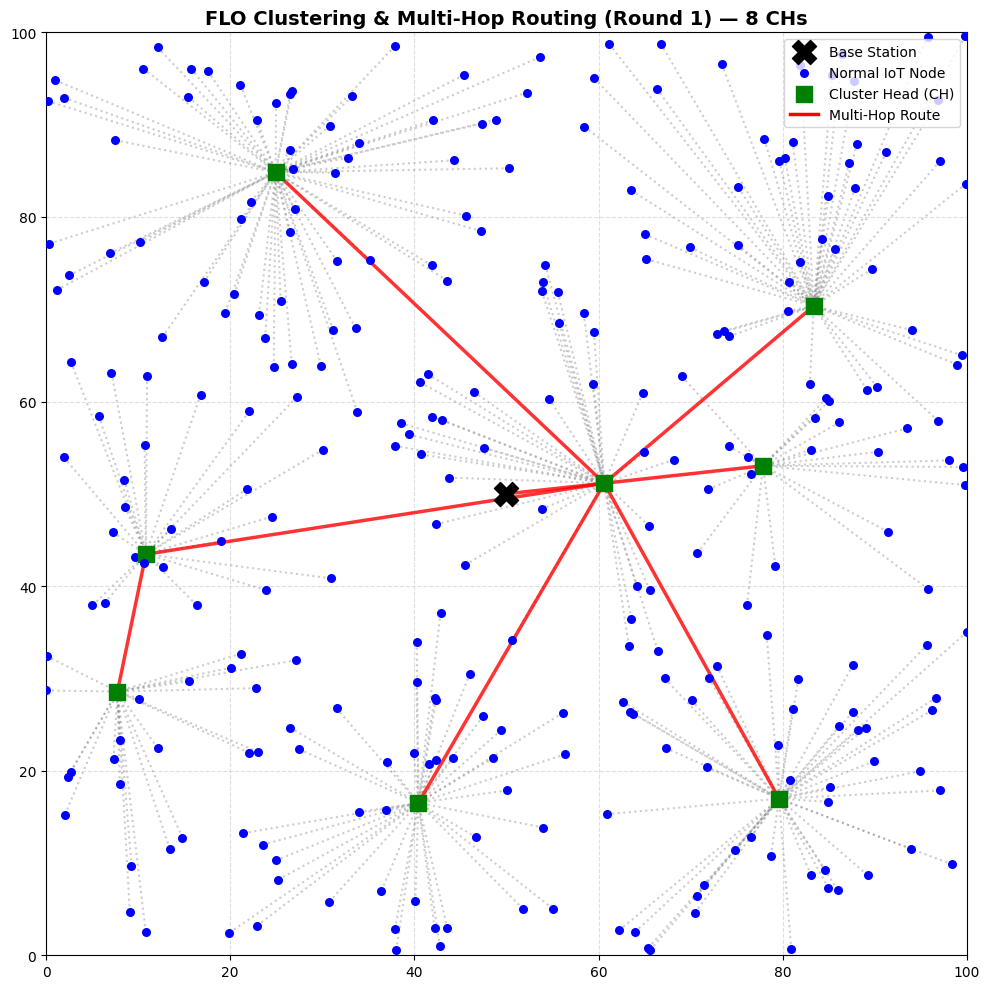

Round 0001 | Alive: 300 | Energy: 149.9537 J
Round 0200 | Alive: 300 | Energy: 140.7440 J
Round 0400 | Alive: 300 | Energy: 131.4871 J
Round 0600 | Alive: 300 | Energy: 122.2305 J
Round 0800 | Alive: 300 | Energy: 112.9727 J
Round 1000 | Alive: 300 | Energy: 103.7154 J
Round 1200 | Alive: 300 | Energy: 94.4581 J
Round 1400 | Alive: 300 | Energy: 85.1987 J
Round 1600 | Alive: 299 | Energy: 75.9478 J
Round 1800 | Alive: 293 | Energy: 66.8036 J
Round 2000 | Alive: 284 | Energy: 57.8692 J
Round 2200 | Alive: 277 | Energy: 49.2197 J
Round 2400 | Alive: 265 | Energy: 40.8351 J
Round 2600 | Alive: 244 | Energy: 32.9004 J
Round 2800 | Alive: 223 | Energy: 25.6443 J
Round 3000 | Alive: 198 | Energy: 19.0623 J
Round 3200 | Alive: 161 | Energy: 13.4069 J
Round 3400 | Alive: 114 | Energy: 9.0545 J
Round 3600 | Alive: 089 | Energy: 5.9731 J
Round 3800 | Alive: 070 | Energy: 3.4851 J
Round 4000 | Alive: 049 | Energy: 1.5022 J
Round 4200 | Alive: 021 | Energy: 0.5725 J
Round 4400 | Alive: 004 | Energ

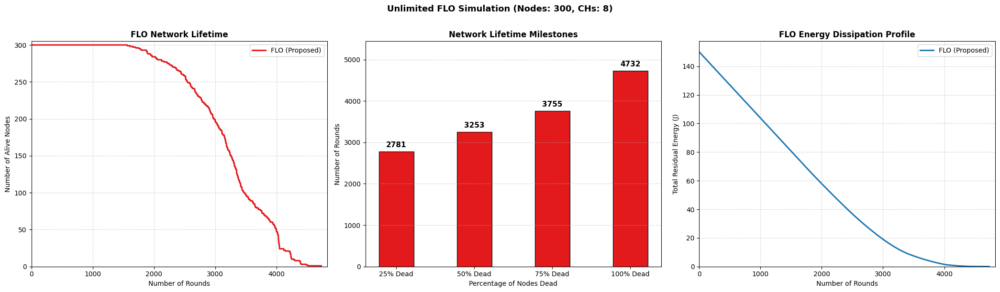

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt
import time

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS
# =========================================================================
AREA        = 100
NUM_NODES   = 300  # ---> MODIFIED: Set to exactly 300 Nodes <---
BS_X, BS_Y  = 50, 50

INITIAL_ENERGY = 0.5        # Joules per node
PACKET_SIZE    = 1500       # bits

E_ELEC = 50e-9              # 50 nJ/bit
E_AMP  = 10e-12             # 10 pJ/bit/m²

# ── FLO Clustering parameters ─────────────────────────────────────────────
NUM_LIZARDS = 20
NUM_CH      = 8
MAX_ITER    = 20

# β2=0.65 → optimizer strongly forced to pick highest-energy nodes as CHs
BETA1, BETA2, BETA3 = 0.20, 0.65, 0.15

# ── Multi-Hop Routing parameters ──────────────────────────────────────────
R_BETA1, R_BETA2, R_BETA3 = 0.15, 0.15, 0.70

# ── CH Energy percentile threshold (dynamic) ──────────────────────────────
CH_ENERGY_PERCENTILE = 40   # bottom 40% excluded → top 60% eligible

# =========================================================================
# 2. CORE UTILITY CLASSES & GLOBAL DISTANCE MATRICES
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id     = node_id
        self.x      = x
        self.y      = y
        self.energy = INITIAL_ENERGY
        self.alive  = True
        self.is_CH  = False

def tx_energy(bits, d):
    return E_ELEC * bits + E_AMP * bits * d**2

def rx_energy(bits):
    return E_ELEC * bits

# =========================================================================
# 3. NETWORK TOPOLOGY PLOT
# =========================================================================
def plot_topology(nodes, clusters, routing_paths, title):
    plt.figure(figsize=(10, 10))

    for ch_id, member_ids in clusters.items():
        ch = nodes[ch_id]
        for m_id in member_ids:
            m = nodes[m_id]
            plt.plot([m.x, ch.x], [m.y, ch.y], color='gray', linestyle=':', alpha=0.4)

    for ch_id, nh in routing_paths.items():
        ch = nodes[ch_id]
        if nh == 'BS':
            plt.plot([ch.x, BS_X], [ch.y, BS_Y], color='red', linewidth=2.5, alpha=0.8)
        else:
            nh_node = nodes[nh]
            plt.plot([ch.x, nh_node.x], [ch.y, nh_node.y], color='red', linewidth=2.5, alpha=0.8)

    for node in nodes:
        if not node.alive:
            plt.scatter(node.x, node.y, color='gray', alpha=0.5, s=20)
        elif node.is_CH:
            plt.scatter(node.x, node.y, color='green', marker='s', s=120, zorder=5)
        else:
            plt.scatter(node.x, node.y, color='blue', s=30, zorder=5)

    plt.scatter(BS_X, BS_Y, color='black', marker='X', s=300, zorder=10, label='Base Station')
    plt.scatter([], [], color='blue',  s=30,  label='Normal IoT Node')
    plt.scatter([], [], color='green', marker='s', s=120, label='Cluster Head (CH)')
    plt.plot([],   [], color='red',   linewidth=2.5, label='Multi-Hop Route')

    plt.title(title, fontweight='bold', fontsize=14)
    plt.xlim(0, AREA); plt.ylim(0, AREA)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

# =========================================================================
# 4. OPTIMIZED FLO CLUSTERING FITNESS
# =========================================================================
def clustering_fitness(ch_ids, alive_list, node_pool):
    if not ch_ids:
        return float('inf')

    # f1 – sum of CH-to-BS distances (FAST LOOKUP)
    f1 = sum(DIST_TO_BS[ch] for ch in ch_ids)

    # f2 – residual-energy ratio
    total_energy = sum(node_pool[i].energy for i in alive_list) + 1e-9
    ch_energy    = sum(node_pool[ch].energy for ch in ch_ids)
    f2           = ch_energy / total_energy

    # f3 – sum of intra-cluster distances (FAST LOOKUP)
    ch_set = set(ch_ids)
    f3 = sum(
        min(DIST_MATRIX[n][ch] for ch in ch_ids)
        for n in alive_list if n not in ch_set
    )

    return BETA1 * f1 + BETA2 * (1.0 / (f2 + 1e-6)) + BETA3 * f3

# =========================================================================
# 5. REPAIR HELPER (DYNAMIC CH TARGET)
# =========================================================================
def _repair(sol, alive_list, current_ch_target):
    seen    = set()
    cleaned = []
    for v in sol:
        if v not in seen:
            seen.add(v)
            cleaned.append(v)
    pool = [x for x in alive_list if x not in seen]
    random.shuffle(pool)
    while len(cleaned) < current_ch_target and pool:
        cleaned.append(pool.pop())
        seen.add(cleaned[-1])
    return cleaned[:current_ch_target]

# =========================================================================
# 6. FRILLED LIZARD OPTIMIZER
# =========================================================================
def execute_floa(node_pool, alive_idx, current_ch_target):
    alive_list = list(alive_idx)

    energies  = [node_pool[i].energy for i in alive_list]
    threshold = np.percentile(energies, CH_ENERGY_PERCENTILE)
    strong    = [i for i in alive_list if node_pool[i].energy >= threshold]

    if len(strong) < current_ch_target:
        strong = alive_list

    if len(strong) <= current_ch_target:
        return _repair(list(strong), alive_list, current_ch_target)

    population = [random.sample(strong, current_ch_target) for _ in range(NUM_LIZARDS)]
    fitness    = [clustering_fitness(sol, alive_list, node_pool) for sol in population]

    best_idx   = int(np.argmin(fitness))
    g_best_sol = list(population[best_idx])
    g_best_fit = fitness[best_idx]

    for t in range(1, MAX_ITER + 1):
        for i in range(NUM_LIZARDS):
            prey_pool = [population[k] for k in range(NUM_LIZARDS) if fitness[k] < fitness[i]]
            prey_pool.append(g_best_sol)
            prey = random.choice(prey_pool)

            new_sol = []
            for j in range(current_ch_target):
                I_ij    = random.randint(0, 1)
                r_ij    = random.random()
                updated = population[i][j] + r_ij * (prey[j] - I_ij * population[i][j])
                nid     = int(round(updated))
                nid     = nid if nid in alive_idx else random.choice(strong)
                new_sol.append(nid)

            new_sol = _repair(new_sol, alive_list, current_ch_target)
            new_fit = clustering_fitness(new_sol, alive_list, node_pool)
            if new_fit < fitness[i]:
                population[i] = new_sol
                fitness[i]    = new_fit

        for i in range(NUM_LIZARDS):
            new_sol = []
            for j in range(current_ch_target):
                r_ij    = random.random()
                updated = population[i][j] + (r_ij * (NUM_NODES - 1)) / t
                nid     = int(round(updated))
                nid     = nid if nid in alive_idx else random.choice(strong)
                new_sol.append(nid)

            new_sol = _repair(new_sol, alive_list, current_ch_target)
            new_fit = clustering_fitness(new_sol, alive_list, node_pool)
            if new_fit < fitness[i]:
                population[i] = new_sol
                fitness[i]    = new_fit

        iter_best = int(np.argmin(fitness))
        if fitness[iter_best] < g_best_fit:
            g_best_sol = list(population[iter_best])
            g_best_fit = fitness[iter_best]

    return g_best_sol

# =========================================================================
# 7. MULTI-HOP ROUTING COST
# =========================================================================
def routing_cost(ch_node, cand_node, dist_bs_cand):
    # FAST LOOKUP instead of dist()
    f1 = DIST_MATRIX[ch_node.id][cand_node.id]
    f2 = dist_bs_cand
    f3 = 1.0 / (cand_node.energy + 1e-9)
    return R_BETA1 * f1 + R_BETA2 * f2 + R_BETA3 * f3

# =========================================================================
# 8. INITIALIZATION & PRE-COMPUTATION
# =========================================================================
random.seed(42)
np.random.seed(42)

node_network = [
    IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA))
    for i in range(NUM_NODES)
]

print("Pre-computing Distance Matrices (This will save massive time)...")
DIST_MATRIX = np.zeros((NUM_NODES, NUM_NODES))
DIST_TO_BS  = np.zeros(NUM_NODES)

for i in range(NUM_NODES):
    DIST_TO_BS[i] = np.sqrt((node_network[i].x - BS_X)**2 + (node_network[i].y - BS_Y)**2)
    for j in range(NUM_NODES):
        DIST_MATRIX[i][j] = np.sqrt((node_network[i].x - node_network[j].x)**2 + (node_network[i].y - node_network[j].y)**2)

# =========================================================================
# 9. SIMULATION MAIN LOOP (UNRESTRICTED ROUNDS)
# =========================================================================
alive_history  = []
energy_history = []

print(f"\n[START] FAST UNRESTRICTED FLO Simulation | Nodes={NUM_NODES}  Target CHs={NUM_CH}")
print("=" * 65)

start_time = time.time() # Track speed
r = 1

while True:

    alive_idx = {n.id for n in node_network if n.alive}

    if len(alive_idx) == 0:
        print(f"\n[STOP] Network 100% Dead at Round {r-1}")
        break

    for n in node_network:
        n.is_CH = False

    # Dynamic CH scaling so it doesn't crash when < 8 nodes are left
    current_ch_target = min(NUM_CH, len(alive_idx))

    ch_ids = execute_floa(node_network, alive_idx, current_ch_target)
    for cid in ch_ids:
        node_network[cid].is_CH = True

    clusters = {cid: [] for cid in ch_ids}
    for n in node_network:
        if not n.alive or n.is_CH:
            continue
        # FAST LOOKUP
        nearest = min(ch_ids, key=lambda c: DIST_MATRIX[n.id][c])
        clusters[nearest].append(n.id)

    # FAST LOOKUP
    dist_to_bs = {cid: DIST_TO_BS[cid] for cid in ch_ids}
    sorted_chs = sorted(ch_ids, key=lambda c: dist_to_bs[c], reverse=True)
    routing_paths = {}

    for cid in sorted_chs:
        ch_node    = node_network[cid]
        candidates = [c for c in ch_ids if dist_to_bs[c] < dist_to_bs[cid] and node_network[c].alive]
        if not candidates:
            routing_paths[cid] = 'BS'
        else:
            best_nh = min(candidates, key=lambda c: routing_cost(ch_node, node_network[c], dist_to_bs[c]))
            routing_paths[cid] = best_nh

    if r == 1:
        plot_topology(node_network, clusters, routing_paths,
                      f"FLO Clustering & Multi-Hop Routing (Round 1) — {NUM_CH} CHs")

    for cid, members in clusters.items():
        ch = node_network[cid]
        for mid in members:
            m = node_network[mid]
            if not m.alive:
                continue
            # FAST LOOKUP
            d_m_ch    = DIST_MATRIX[m.id][ch.id]
            m.energy -= tx_energy(PACKET_SIZE, d_m_ch)
            if m.energy <= 0:
                m.energy = 0
                m.alive  = False
            if ch.alive:
                ch.energy -= rx_energy(PACKET_SIZE)
                if ch.energy <= 0:
                    ch.energy = 0
                    ch.alive  = False

    for cid in sorted_chs:
        ch = node_network[cid]
        if not ch.alive:
            continue

        nh = routing_paths[cid]
        fwd_bits = PACKET_SIZE

        if nh == 'BS':
            ch.energy -= tx_energy(fwd_bits, dist_to_bs[cid])
            if ch.energy <= 0:
                ch.energy = 0
                ch.alive  = False
        else:
            nh_node = node_network[nh]
            # FAST LOOKUP
            d_ch_nh = DIST_MATRIX[ch.id][nh_node.id]

            ch.energy -= tx_energy(fwd_bits, d_ch_nh)
            if ch.energy <= 0:
                ch.energy = 0
                ch.alive  = False

            if nh_node.alive:
                nh_node.energy -= rx_energy(fwd_bits)
                if nh_node.energy <= 0:
                    nh_node.energy = 0
                    nh_node.alive  = False

    alive_count     = sum(1 for n in node_network if n.alive)
    residual_energy = sum(max(n.energy, 0) for n in node_network)
    alive_history.append(alive_count)
    energy_history.append(residual_energy)

    if r % 200 == 0 or r == 1:
        print(f"Round {r:04d} | Alive: {alive_count:03d} | Energy: {residual_energy:.4f} J")

    r += 1

end_time = time.time()
print("=" * 65)
print(f"[DONE] FLO Simulation Concluded in {end_time - start_time:.2f} seconds.\n")

# =========================================================================
# 10. NETWORK LIFETIME MILESTONES & FINAL PLOTS
# =========================================================================
TOTAL_ROUNDS = len(alive_history)
milestone_labels = ['25%', '50%', '75%', '100%']
milestones       = []

for pct in [25, 50, 75, 100]:
    target_alive = NUM_NODES - int(NUM_NODES * pct / 100)
    round_reached = TOTAL_ROUNDS
    for idx, a in enumerate(alive_history):
        if a <= target_alive:
            round_reached = idx + 1
            break
    milestones.append(round_reached)

print("Network Lifetime Milestones (FLO):")
for lbl, rnd in zip(milestone_labels, milestones):
    print(f"  {lbl} nodes dead  →  Round {rnd}")

fig, axes = plt.subplots(1, 3, figsize=(21, 6))
round_axis = range(1, TOTAL_ROUNDS + 1)

# Plot 1
ax = axes[0]
ax.plot(round_axis, alive_history, color='#e31a1c', linewidth=2.2, label='FLO (Proposed)')
ax.set_title("FLO Network Lifetime", fontweight='bold')
ax.set_xlabel("Number of Rounds")
ax.set_ylabel("Number of Alive Nodes")
ax.set_xlim(0, TOTAL_ROUNDS + 100); ax.set_ylim(0, NUM_NODES + 5)
ax.grid(True, linestyle='--', alpha=0.5)
ax.legend(loc='upper right', fontsize=10)

# Plot 2
ax   = axes[1]
x    = np.arange(len(milestone_labels))
bars = ax.bar(x, milestones, color='#e31a1c', width=0.45, edgecolor='black', linewidth=0.8)
ax.set_title("Network Lifetime Milestones", fontweight='bold')
ax.set_xlabel("Percentage of Nodes Dead")
ax.set_ylabel("Number of Rounds")
ax.set_xticks(x); ax.set_xticklabels(['25% Dead', '50% Dead', '75% Dead', '100% Dead'])
ax.set_ylim(0, TOTAL_ROUNDS * 1.15); ax.grid(True, linestyle='--', alpha=0.5, axis='y')
for bar, val in zip(bars, milestones):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + TOTAL_ROUNDS * 0.015,
            str(val), ha='center', va='bottom', fontweight='bold', fontsize=11)

# Plot 3
ax = axes[2]
ax.plot(round_axis, energy_history, color='#1f78b4', linewidth=2.2, label='FLO (Proposed)')
ax.set_title("FLO Energy Dissipation Profile", fontweight='bold')
ax.set_xlabel("Number of Rounds")
ax.set_ylabel("Total Residual Energy (J)")
ax.set_xlim(0, TOTAL_ROUNDS + 100); ax.set_ylim(0, NUM_NODES * INITIAL_ENERGY * 1.05)
ax.grid(True, linestyle='--', alpha=0.5)
ax.legend(loc='upper right', fontsize=10)

plt.suptitle(f"Unlimited FLO Simulation (Nodes: {NUM_NODES}, CHs: {NUM_CH})", fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig("flo_unrestricted_results.png", dpi=150, bbox_inches='tight')
plt.show()

Pre-computing Distance Matrices (This will save massive time)...

[START] FAST UNRESTRICTED FLO Simulation | Nodes=200  Target CHs=8


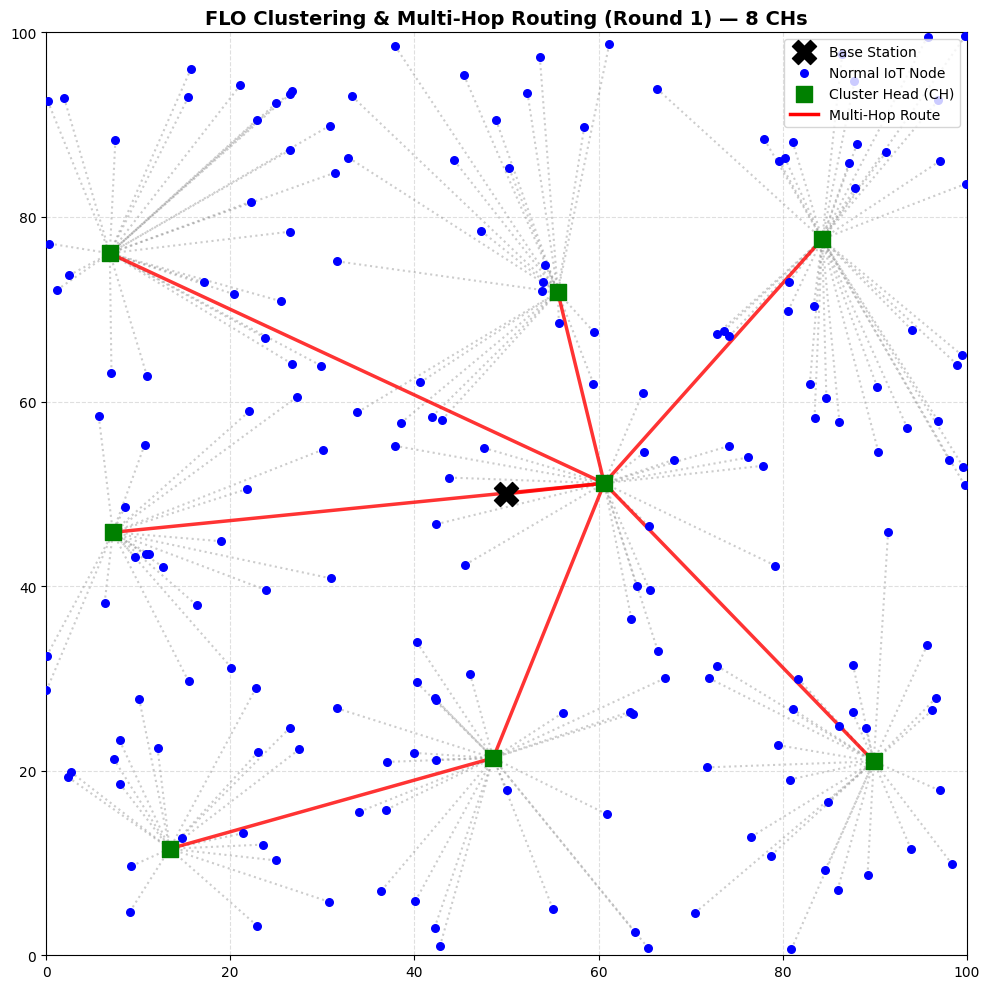

Round 0001 | Alive: 200 | Energy: 99.9691 J
Round 0200 | Alive: 200 | Energy: 93.8258 J
Round 0400 | Alive: 200 | Energy: 87.6515 J
Round 0600 | Alive: 200 | Energy: 81.4775 J
Round 0800 | Alive: 200 | Energy: 75.3032 J
Round 1000 | Alive: 200 | Energy: 69.1284 J
Round 1200 | Alive: 200 | Energy: 62.9537 J
Round 1400 | Alive: 200 | Energy: 56.7788 J
Round 1600 | Alive: 199 | Energy: 50.6117 J
Round 1800 | Alive: 195 | Energy: 44.4960 J
Round 2000 | Alive: 190 | Energy: 38.6035 J
Round 2200 | Alive: 187 | Energy: 32.7669 J
Round 2400 | Alive: 179 | Energy: 27.1166 J
Round 2600 | Alive: 162 | Energy: 21.8066 J
Round 2800 | Alive: 149 | Energy: 17.0056 J
Round 3000 | Alive: 131 | Energy: 12.6108 J
Round 3200 | Alive: 100 | Energy: 9.0577 J
Round 3400 | Alive: 072 | Energy: 6.3581 J
Round 3600 | Alive: 060 | Energy: 4.2562 J
Round 3800 | Alive: 052 | Energy: 2.4294 J
Round 4000 | Alive: 028 | Energy: 1.0653 J
Round 4200 | Alive: 012 | Energy: 0.4419 J
Round 4400 | Alive: 005 | Energy: 0.15

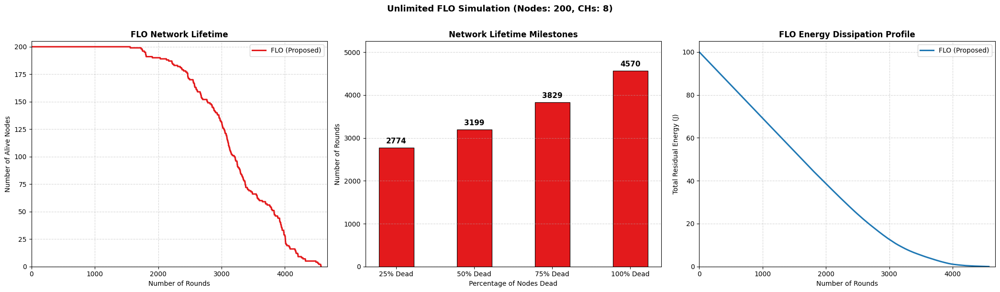

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt
import time

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS
# =========================================================================
AREA        = 100
NUM_NODES   = 200  # ---> MODIFIED: Set to exactly 200 Nodes <---
BS_X, BS_Y  = 50, 50

INITIAL_ENERGY = 0.5        # Joules per node
PACKET_SIZE    = 1500       # bits

E_ELEC = 50e-9              # 50 nJ/bit
E_AMP  = 10e-12             # 10 pJ/bit/m²

# ── FLO Clustering parameters ─────────────────────────────────────────────
NUM_LIZARDS = 20
NUM_CH      = 8
MAX_ITER    = 20

# β2=0.65 → optimizer strongly forced to pick highest-energy nodes as CHs
BETA1, BETA2, BETA3 = 0.20, 0.65, 0.15

# ── Multi-Hop Routing parameters ──────────────────────────────────────────
R_BETA1, R_BETA2, R_BETA3 = 0.15, 0.15, 0.70

# ── CH Energy percentile threshold (dynamic) ──────────────────────────────
CH_ENERGY_PERCENTILE = 40   # bottom 40% excluded → top 60% eligible

# =========================================================================
# 2. CORE UTILITY CLASSES & GLOBAL DISTANCE MATRICES
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id     = node_id
        self.x      = x
        self.y      = y
        self.energy = INITIAL_ENERGY
        self.alive  = True
        self.is_CH  = False

def tx_energy(bits, d):
    return E_ELEC * bits + E_AMP * bits * d**2

def rx_energy(bits):
    return E_ELEC * bits

# =========================================================================
# 3. NETWORK TOPOLOGY PLOT
# =========================================================================
def plot_topology(nodes, clusters, routing_paths, title):
    plt.figure(figsize=(10, 10))

    for ch_id, member_ids in clusters.items():
        ch = nodes[ch_id]
        for m_id in member_ids:
            m = nodes[m_id]
            plt.plot([m.x, ch.x], [m.y, ch.y], color='gray', linestyle=':', alpha=0.4)

    for ch_id, nh in routing_paths.items():
        ch = nodes[ch_id]
        if nh == 'BS':
            plt.plot([ch.x, BS_X], [ch.y, BS_Y], color='red', linewidth=2.5, alpha=0.8)
        else:
            nh_node = nodes[nh]
            plt.plot([ch.x, nh_node.x], [ch.y, nh_node.y], color='red', linewidth=2.5, alpha=0.8)

    for node in nodes:
        if not node.alive:
            plt.scatter(node.x, node.y, color='gray', alpha=0.5, s=20)
        elif node.is_CH:
            plt.scatter(node.x, node.y, color='green', marker='s', s=120, zorder=5)
        else:
            plt.scatter(node.x, node.y, color='blue', s=30, zorder=5)

    plt.scatter(BS_X, BS_Y, color='black', marker='X', s=300, zorder=10, label='Base Station')
    plt.scatter([], [], color='blue',  s=30,  label='Normal IoT Node')
    plt.scatter([], [], color='green', marker='s', s=120, label='Cluster Head (CH)')
    plt.plot([],   [], color='red',   linewidth=2.5, label='Multi-Hop Route')

    plt.title(title, fontweight='bold', fontsize=14)
    plt.xlim(0, AREA); plt.ylim(0, AREA)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

# =========================================================================
# 4. OPTIMIZED FLO CLUSTERING FITNESS
# =========================================================================
def clustering_fitness(ch_ids, alive_list, node_pool):
    if not ch_ids:
        return float('inf')

    # f1 – sum of CH-to-BS distances (FAST LOOKUP)
    f1 = sum(DIST_TO_BS[ch] for ch in ch_ids)

    # f2 – residual-energy ratio
    total_energy = sum(node_pool[i].energy for i in alive_list) + 1e-9
    ch_energy    = sum(node_pool[ch].energy for ch in ch_ids)
    f2           = ch_energy / total_energy

    # f3 – sum of intra-cluster distances (FAST LOOKUP)
    ch_set = set(ch_ids)
    f3 = sum(
        min(DIST_MATRIX[n][ch] for ch in ch_ids)
        for n in alive_list if n not in ch_set
    )

    return BETA1 * f1 + BETA2 * (1.0 / (f2 + 1e-6)) + BETA3 * f3

# =========================================================================
# 5. REPAIR HELPER (DYNAMIC CH TARGET)
# =========================================================================
def _repair(sol, alive_list, current_ch_target):
    seen    = set()
    cleaned = []
    for v in sol:
        if v not in seen:
            seen.add(v)
            cleaned.append(v)
    pool = [x for x in alive_list if x not in seen]
    random.shuffle(pool)
    while len(cleaned) < current_ch_target and pool:
        cleaned.append(pool.pop())
        seen.add(cleaned[-1])
    return cleaned[:current_ch_target]

# =========================================================================
# 6. FRILLED LIZARD OPTIMIZER
# =========================================================================
def execute_floa(node_pool, alive_idx, current_ch_target):
    alive_list = list(alive_idx)

    energies  = [node_pool[i].energy for i in alive_list]
    threshold = np.percentile(energies, CH_ENERGY_PERCENTILE)
    strong    = [i for i in alive_list if node_pool[i].energy >= threshold]

    if len(strong) < current_ch_target:
        strong = alive_list

    if len(strong) <= current_ch_target:
        return _repair(list(strong), alive_list, current_ch_target)

    population = [random.sample(strong, current_ch_target) for _ in range(NUM_LIZARDS)]
    fitness    = [clustering_fitness(sol, alive_list, node_pool) for sol in population]

    best_idx   = int(np.argmin(fitness))
    g_best_sol = list(population[best_idx])
    g_best_fit = fitness[best_idx]

    for t in range(1, MAX_ITER + 1):
        for i in range(NUM_LIZARDS):
            prey_pool = [population[k] for k in range(NUM_LIZARDS) if fitness[k] < fitness[i]]
            prey_pool.append(g_best_sol)
            prey = random.choice(prey_pool)

            new_sol = []
            for j in range(current_ch_target):
                I_ij    = random.randint(0, 1)
                r_ij    = random.random()
                updated = population[i][j] + r_ij * (prey[j] - I_ij * population[i][j])
                nid     = int(round(updated))
                nid     = nid if nid in alive_idx else random.choice(strong)
                new_sol.append(nid)

            new_sol = _repair(new_sol, alive_list, current_ch_target)
            new_fit = clustering_fitness(new_sol, alive_list, node_pool)
            if new_fit < fitness[i]:
                population[i] = new_sol
                fitness[i]    = new_fit

        for i in range(NUM_LIZARDS):
            new_sol = []
            for j in range(current_ch_target):
                r_ij    = random.random()
                updated = population[i][j] + (r_ij * (NUM_NODES - 1)) / t
                nid     = int(round(updated))
                nid     = nid if nid in alive_idx else random.choice(strong)
                new_sol.append(nid)

            new_sol = _repair(new_sol, alive_list, current_ch_target)
            new_fit = clustering_fitness(new_sol, alive_list, node_pool)
            if new_fit < fitness[i]:
                population[i] = new_sol
                fitness[i]    = new_fit

        iter_best = int(np.argmin(fitness))
        if fitness[iter_best] < g_best_fit:
            g_best_sol = list(population[iter_best])
            g_best_fit = fitness[iter_best]

    return g_best_sol

# =========================================================================
# 7. MULTI-HOP ROUTING COST
# =========================================================================
def routing_cost(ch_node, cand_node, dist_bs_cand):
    # FAST LOOKUP instead of dist()
    f1 = DIST_MATRIX[ch_node.id][cand_node.id]
    f2 = dist_bs_cand
    f3 = 1.0 / (cand_node.energy + 1e-9)
    return R_BETA1 * f1 + R_BETA2 * f2 + R_BETA3 * f3

# =========================================================================
# 8. INITIALIZATION & PRE-COMPUTATION
# =========================================================================
random.seed(42)
np.random.seed(42)

node_network = [
    IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA))
    for i in range(NUM_NODES)
]

print("Pre-computing Distance Matrices (This will save massive time)...")
DIST_MATRIX = np.zeros((NUM_NODES, NUM_NODES))
DIST_TO_BS  = np.zeros(NUM_NODES)

for i in range(NUM_NODES):
    DIST_TO_BS[i] = np.sqrt((node_network[i].x - BS_X)**2 + (node_network[i].y - BS_Y)**2)
    for j in range(NUM_NODES):
        DIST_MATRIX[i][j] = np.sqrt((node_network[i].x - node_network[j].x)**2 + (node_network[i].y - node_network[j].y)**2)

# =========================================================================
# 9. SIMULATION MAIN LOOP (UNRESTRICTED ROUNDS)
# =========================================================================
alive_history  = []
energy_history = []

print(f"\n[START] FAST UNRESTRICTED FLO Simulation | Nodes={NUM_NODES}  Target CHs={NUM_CH}")
print("=" * 65)

start_time = time.time() # Track speed
r = 1

while True:

    alive_idx = {n.id for n in node_network if n.alive}

    if len(alive_idx) == 0:
        print(f"\n[STOP] Network 100% Dead at Round {r-1}")
        break

    for n in node_network:
        n.is_CH = False

    # Dynamic CH scaling so it doesn't crash when < 8 nodes are left
    current_ch_target = min(NUM_CH, len(alive_idx))

    ch_ids = execute_floa(node_network, alive_idx, current_ch_target)
    for cid in ch_ids:
        node_network[cid].is_CH = True

    clusters = {cid: [] for cid in ch_ids}
    for n in node_network:
        if not n.alive or n.is_CH:
            continue
        # FAST LOOKUP
        nearest = min(ch_ids, key=lambda c: DIST_MATRIX[n.id][c])
        clusters[nearest].append(n.id)

    # FAST LOOKUP
    dist_to_bs = {cid: DIST_TO_BS[cid] for cid in ch_ids}
    sorted_chs = sorted(ch_ids, key=lambda c: dist_to_bs[c], reverse=True)
    routing_paths = {}

    for cid in sorted_chs:
        ch_node    = node_network[cid]
        candidates = [c for c in ch_ids if dist_to_bs[c] < dist_to_bs[cid] and node_network[c].alive]
        if not candidates:
            routing_paths[cid] = 'BS'
        else:
            best_nh = min(candidates, key=lambda c: routing_cost(ch_node, node_network[c], dist_to_bs[c]))
            routing_paths[cid] = best_nh

    if r == 1:
        plot_topology(node_network, clusters, routing_paths,
                      f"FLO Clustering & Multi-Hop Routing (Round 1) — {NUM_CH} CHs")

    for cid, members in clusters.items():
        ch = node_network[cid]
        for mid in members:
            m = node_network[mid]
            if not m.alive:
                continue
            # FAST LOOKUP
            d_m_ch    = DIST_MATRIX[m.id][ch.id]
            m.energy -= tx_energy(PACKET_SIZE, d_m_ch)
            if m.energy <= 0:
                m.energy = 0
                m.alive  = False
            if ch.alive:
                ch.energy -= rx_energy(PACKET_SIZE)
                if ch.energy <= 0:
                    ch.energy = 0
                    ch.alive  = False

    for cid in sorted_chs:
        ch = node_network[cid]
        if not ch.alive:
            continue

        nh = routing_paths[cid]
        fwd_bits = PACKET_SIZE

        if nh == 'BS':
            ch.energy -= tx_energy(fwd_bits, dist_to_bs[cid])
            if ch.energy <= 0:
                ch.energy = 0
                ch.alive  = False
        else:
            nh_node = node_network[nh]
            # FAST LOOKUP
            d_ch_nh = DIST_MATRIX[ch.id][nh_node.id]

            ch.energy -= tx_energy(fwd_bits, d_ch_nh)
            if ch.energy <= 0:
                ch.energy = 0
                ch.alive  = False

            if nh_node.alive:
                nh_node.energy -= rx_energy(fwd_bits)
                if nh_node.energy <= 0:
                    nh_node.energy = 0
                    nh_node.alive  = False

    alive_count     = sum(1 for n in node_network if n.alive)
    residual_energy = sum(max(n.energy, 0) for n in node_network)
    alive_history.append(alive_count)
    energy_history.append(residual_energy)

    if r % 200 == 0 or r == 1:
        print(f"Round {r:04d} | Alive: {alive_count:03d} | Energy: {residual_energy:.4f} J")

    r += 1

end_time = time.time()
print("=" * 65)
print(f"[DONE] FLO Simulation Concluded in {end_time - start_time:.2f} seconds.\n")

# =========================================================================
# 10. NETWORK LIFETIME MILESTONES & FINAL PLOTS
# =========================================================================
TOTAL_ROUNDS = len(alive_history)
milestone_labels = ['25%', '50%', '75%', '100%']
milestones       = []

for pct in [25, 50, 75, 100]:
    target_alive = NUM_NODES - int(NUM_NODES * pct / 100)
    round_reached = TOTAL_ROUNDS
    for idx, a in enumerate(alive_history):
        if a <= target_alive:
            round_reached = idx + 1
            break
    milestones.append(round_reached)

print("Network Lifetime Milestones (FLO):")
for lbl, rnd in zip(milestone_labels, milestones):
    print(f"  {lbl} nodes dead  →  Round {rnd}")

fig, axes = plt.subplots(1, 3, figsize=(21, 6))
round_axis = range(1, TOTAL_ROUNDS + 1)

# Plot 1
ax = axes[0]
ax.plot(round_axis, alive_history, color='#e31a1c', linewidth=2.2, label='FLO (Proposed)')
ax.set_title("FLO Network Lifetime", fontweight='bold')
ax.set_xlabel("Number of Rounds")
ax.set_ylabel("Number of Alive Nodes")
ax.set_xlim(0, TOTAL_ROUNDS + 100); ax.set_ylim(0, NUM_NODES + 5)
ax.grid(True, linestyle='--', alpha=0.5)
ax.legend(loc='upper right', fontsize=10)

# Plot 2
ax   = axes[1]
x    = np.arange(len(milestone_labels))
bars = ax.bar(x, milestones, color='#e31a1c', width=0.45, edgecolor='black', linewidth=0.8)
ax.set_title("Network Lifetime Milestones", fontweight='bold')
ax.set_xlabel("Percentage of Nodes Dead")
ax.set_ylabel("Number of Rounds")
ax.set_xticks(x); ax.set_xticklabels(['25% Dead', '50% Dead', '75% Dead', '100% Dead'])
ax.set_ylim(0, TOTAL_ROUNDS * 1.15); ax.grid(True, linestyle='--', alpha=0.5, axis='y')
for bar, val in zip(bars, milestones):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + TOTAL_ROUNDS * 0.015,
            str(val), ha='center', va='bottom', fontweight='bold', fontsize=11)

# Plot 3
ax = axes[2]
ax.plot(round_axis, energy_history, color='#1f78b4', linewidth=2.2, label='FLO (Proposed)')
ax.set_title("FLO Energy Dissipation Profile", fontweight='bold')
ax.set_xlabel("Number of Rounds")
ax.set_ylabel("Total Residual Energy (J)")
ax.set_xlim(0, TOTAL_ROUNDS + 100); ax.set_ylim(0, NUM_NODES * INITIAL_ENERGY * 1.05)
ax.grid(True, linestyle='--', alpha=0.5)
ax.legend(loc='upper right', fontsize=10)

plt.suptitle(f"Unlimited FLO Simulation (Nodes: {NUM_NODES}, CHs: {NUM_CH})", fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig("flo_200_results.png", dpi=150, bbox_inches='tight')
plt.show()

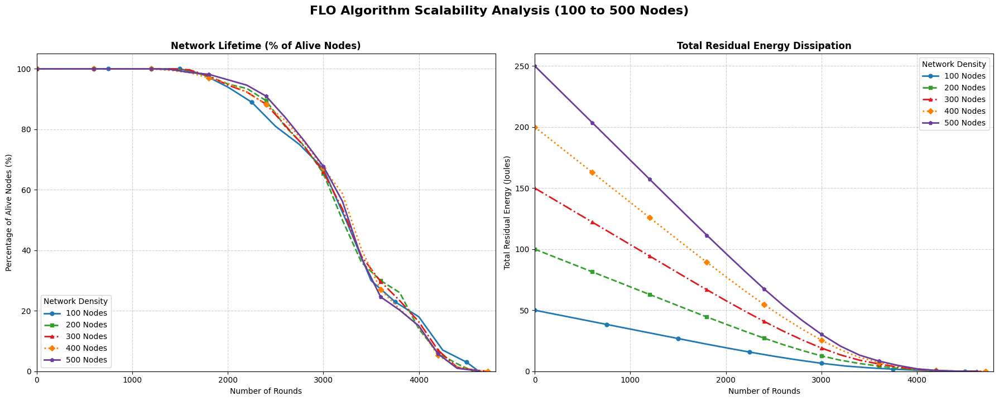

Plot generation complete. Saved as 'scalability_comparison.png'


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import io

# 1. Embedded CSV Data based on the logs you provided
csv_data = """Scenario,Round,AliveNodes,Energy
100 Nodes,1,100,49.9846
100 Nodes,250,100,46.1369
100 Nodes,500,100,42.2743
100 Nodes,750,100,38.4112
100 Nodes,1000,100,34.5481
100 Nodes,1250,100,30.6842
100 Nodes,1500,100,26.8204
100 Nodes,1750,98,22.9630
100 Nodes,2000,94,19.2700
100 Nodes,2250,89,15.7127
100 Nodes,2500,81,12.3514
100 Nodes,2750,75,9.3075
100 Nodes,3000,67,6.5533
100 Nodes,3250,49,4.3270
100 Nodes,3500,30,2.8357
100 Nodes,3750,23,1.7501
100 Nodes,4000,18,0.8446
100 Nodes,4250,7,0.3066
100 Nodes,4500,3,0.0912
100 Nodes,4627,0,0.0000
200 Nodes,1,200,99.9691
200 Nodes,200,200,93.8258
200 Nodes,400,200,87.6515
200 Nodes,600,200,81.4775
200 Nodes,800,200,75.3032
200 Nodes,1000,200,69.1284
200 Nodes,1200,200,62.9537
200 Nodes,1400,200,56.7788
200 Nodes,1600,199,50.6117
200 Nodes,1800,195,44.4960
200 Nodes,2000,190,38.6035
200 Nodes,2200,187,32.7669
200 Nodes,2400,179,27.1166
200 Nodes,2600,162,21.8066
200 Nodes,2800,149,17.0056
200 Nodes,3000,131,12.6108
200 Nodes,3200,100,9.0577
200 Nodes,3400,72,6.3581
200 Nodes,3600,60,4.2562
200 Nodes,3800,52,2.4294
200 Nodes,4000,28,1.0653
200 Nodes,4200,12,0.4419
200 Nodes,4400,5,0.1556
200 Nodes,4570,0,0.0000
300 Nodes,1,300,149.9537
300 Nodes,200,300,140.7440
300 Nodes,400,300,131.4871
300 Nodes,600,300,122.2305
300 Nodes,800,300,112.9727
300 Nodes,1000,300,103.7154
300 Nodes,1200,300,94.4581
300 Nodes,1400,300,85.1987
300 Nodes,1600,299,75.9478
300 Nodes,1800,293,66.8036
300 Nodes,2000,284,57.8692
300 Nodes,2200,277,49.2197
300 Nodes,2400,265,40.8351
300 Nodes,2600,244,32.9004
300 Nodes,2800,223,25.6443
300 Nodes,3000,198,19.0623
300 Nodes,3200,161,13.4069
300 Nodes,3400,114,9.0545
300 Nodes,3600,89,5.9731
300 Nodes,3800,70,3.4851
300 Nodes,4000,49,1.5022
300 Nodes,4200,21,0.5725
300 Nodes,4400,4,0.1024
300 Nodes,4600,1,0.0196
300 Nodes,4732,0,0.0000
400 Nodes,1,400,199.9383
400 Nodes,200,400,187.6604
400 Nodes,400,400,175.3193
400 Nodes,600,400,162.9804
400 Nodes,800,400,150.6385
400 Nodes,1000,400,138.2975
400 Nodes,1200,400,125.9549
400 Nodes,1400,398,113.6191
400 Nodes,1600,395,101.3907
400 Nodes,1800,388,89.3317
400 Nodes,2000,381,77.4413
400 Nodes,2200,369,65.8260
400 Nodes,2400,353,54.6756
400 Nodes,2600,332,44.1759
400 Nodes,2800,303,34.4048
400 Nodes,3000,269,25.4880
400 Nodes,3200,235,17.6250
400 Nodes,3400,161,11.3382
400 Nodes,3600,108,7.3099
400 Nodes,3800,82,4.2963
400 Nodes,4000,59,2.0556
400 Nodes,4200,21,0.6873
400 Nodes,4400,6,0.0944
400 Nodes,4600,1,0.0178
400 Nodes,4720,0,0.0000
500 Nodes,1,500,249.9229
500 Nodes,200,500,234.5728
500 Nodes,400,500,219.1443
500 Nodes,600,500,203.7155
500 Nodes,800,500,188.2858
500 Nodes,1000,500,172.8561
500 Nodes,1200,500,157.4277
500 Nodes,1400,499,142.0189
500 Nodes,1600,494,126.6850
500 Nodes,1800,491,111.4991
500 Nodes,2000,482,96.5184
500 Nodes,2200,473,81.8312
500 Nodes,2400,455,67.4556
500 Nodes,2600,420,53.9353
500 Nodes,2800,381,41.5370
500 Nodes,3000,339,30.2839
500 Nodes,3200,281,20.5723
500 Nodes,3400,187,13.1981
500 Nodes,3600,123,8.4032
500 Nodes,3800,101,4.8401
500 Nodes,4000,75,1.9856
500 Nodes,4200,29,0.6803
500 Nodes,4400,5,0.1480
500 Nodes,4600,1,0.0029
500 Nodes,4622,0,0.0000"""

# 2. Load data into a Pandas DataFrame
df = pd.read_csv(io.StringIO(csv_data))

# Define distinct styling to match academic formatting
style_dict = {
    '100 Nodes': {'color': '#1f78b4', 'marker': 'o', 'linestyle': '-', 'linewidth': 2.0},
    '200 Nodes': {'color': '#33a02c', 'marker': 's', 'linestyle': '--', 'linewidth': 2.0},
    '300 Nodes': {'color': '#e31a1c', 'marker': '^', 'linestyle': '-.', 'linewidth': 2.0},
    '400 Nodes': {'color': '#ff7f00', 'marker': 'D', 'linestyle': ':', 'linewidth': 2.0},
    '500 Nodes': {'color': '#6a3d9a', 'marker': 'p', 'linestyle': '-', 'linewidth': 2.0}
}

# 3. Setup the figure
fig, axes = plt.subplots(1, 2, figsize=(18, 7))
fig.suptitle("FLO Algorithm Scalability Analysis (100 to 500 Nodes)", fontsize=16, fontweight='bold', y=1.02)

# --- Plot 1: Network Lifetime (Alive Nodes Percentage) ---
# Normalizing to percentage so they can be compared on the same Y-axis
ax1 = axes[0]
for scenario in df['Scenario'].unique():
    subset = df[df['Scenario'] == scenario]
    max_nodes = int(scenario.split()[0])

    # Calculate percentage of alive nodes
    alive_percentage = (subset['AliveNodes'] / max_nodes) * 100

    ax1.plot(subset['Round'], alive_percentage,
             label=scenario,
             color=style_dict[scenario]['color'],
             marker=style_dict[scenario]['marker'],
             linestyle=style_dict[scenario]['linestyle'],
             linewidth=style_dict[scenario]['linewidth'],
             markersize=5, markevery=3) # Mark every 3rd point to avoid clutter

ax1.set_title("Network Lifetime (% of Alive Nodes)", fontweight='bold')
ax1.set_xlabel("Number of Rounds")
ax1.set_ylabel("Percentage of Alive Nodes (%)")
ax1.set_xlim(0, 4800)
ax1.set_ylim(0, 105)
ax1.grid(True, linestyle='--', alpha=0.6)
ax1.legend(loc='lower left', title="Network Density")

# --- Plot 2: Total Residual Energy ---
ax2 = axes[1]
for scenario in df['Scenario'].unique():
    subset = df[df['Scenario'] == scenario]

    ax2.plot(subset['Round'], subset['Energy'],
             label=scenario,
             color=style_dict[scenario]['color'],
             marker=style_dict[scenario]['marker'],
             linestyle=style_dict[scenario]['linestyle'],
             linewidth=style_dict[scenario]['linewidth'],
             markersize=5, markevery=3)

ax2.set_title("Total Residual Energy Dissipation", fontweight='bold')
ax2.set_xlabel("Number of Rounds")
ax2.set_ylabel("Total Residual Energy (Joules)")
ax2.set_xlim(0, 4800)
ax2.set_ylim(0, 260)
ax2.grid(True, linestyle='--', alpha=0.6)
ax2.legend(loc='upper right', title="Network Density")

# 4. Final Formatting & Save
plt.tight_layout()
plt.savefig("scalability_comparison.png", dpi=300, bbox_inches='tight')
plt.show()

print("Plot generation complete. Saved as 'scalability_comparison.png'")

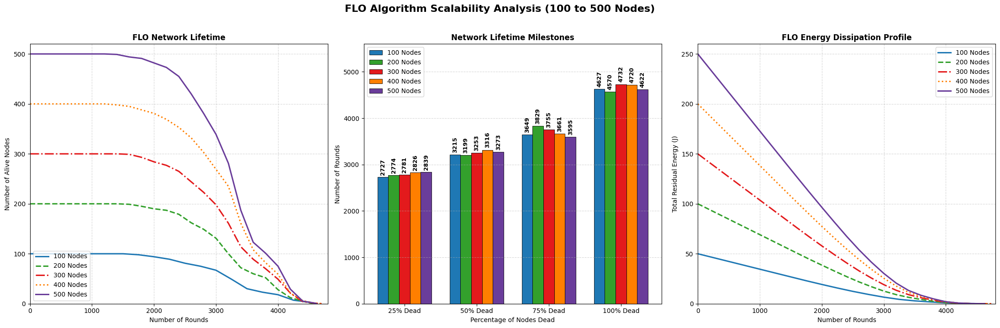

Plot saved successfully as 'scalability_3panel.png'


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import io

# 1. Embedded Data from your Simulation Logs
csv_data = """Scenario,Round,AliveNodes,Energy
100 Nodes,1,100,49.9846
100 Nodes,250,100,46.1369
100 Nodes,500,100,42.2743
100 Nodes,750,100,38.4112
100 Nodes,1000,100,34.5481
100 Nodes,1250,100,30.6842
100 Nodes,1500,100,26.8204
100 Nodes,1750,98,22.9630
100 Nodes,2000,94,19.2700
100 Nodes,2250,89,15.7127
100 Nodes,2500,81,12.3514
100 Nodes,2750,75,9.3075
100 Nodes,3000,67,6.5533
100 Nodes,3250,49,4.3270
100 Nodes,3500,30,2.8357
100 Nodes,3750,23,1.7501
100 Nodes,4000,18,0.8446
100 Nodes,4250,7,0.3066
100 Nodes,4500,3,0.0912
100 Nodes,4627,0,0.0000
200 Nodes,1,200,99.9691
200 Nodes,200,200,93.8258
200 Nodes,400,200,87.6515
200 Nodes,600,200,81.4775
200 Nodes,800,200,75.3032
200 Nodes,1000,200,69.1284
200 Nodes,1200,200,62.9537
200 Nodes,1400,200,56.7788
200 Nodes,1600,199,50.6117
200 Nodes,1800,195,44.4960
200 Nodes,2000,190,38.6035
200 Nodes,2200,187,32.7669
200 Nodes,2400,179,27.1166
200 Nodes,2600,162,21.8066
200 Nodes,2800,149,17.0056
200 Nodes,3000,131,12.6108
200 Nodes,3200,100,9.0577
200 Nodes,3400,72,6.3581
200 Nodes,3600,60,4.2562
200 Nodes,3800,52,2.4294
200 Nodes,4000,28,1.0653
200 Nodes,4200,12,0.4419
200 Nodes,4400,5,0.1556
200 Nodes,4570,0,0.0000
300 Nodes,1,300,149.9537
300 Nodes,200,300,140.7440
300 Nodes,400,300,131.4871
300 Nodes,600,300,122.2305
300 Nodes,800,300,112.9727
300 Nodes,1000,300,103.7154
300 Nodes,1200,300,94.4581
300 Nodes,1400,300,85.1987
300 Nodes,1600,299,75.9478
300 Nodes,1800,293,66.8036
300 Nodes,2000,284,57.8692
300 Nodes,2200,277,49.2197
300 Nodes,2400,265,40.8351
300 Nodes,2600,244,32.9004
300 Nodes,2800,223,25.6443
300 Nodes,3000,198,19.0623
300 Nodes,3200,161,13.4069
300 Nodes,3400,114,9.0545
300 Nodes,3600,89,5.9731
300 Nodes,3800,70,3.4851
300 Nodes,4000,49,1.5022
300 Nodes,4200,21,0.5725
300 Nodes,4400,4,0.1024
300 Nodes,4600,1,0.0196
300 Nodes,4732,0,0.0000
400 Nodes,1,400,199.9383
400 Nodes,200,400,187.6604
400 Nodes,400,400,175.3193
400 Nodes,600,400,162.9804
400 Nodes,800,400,150.6385
400 Nodes,1000,400,138.2975
400 Nodes,1200,400,125.9549
400 Nodes,1400,398,113.6191
400 Nodes,1600,395,101.3907
400 Nodes,1800,388,89.3317
400 Nodes,2000,381,77.4413
400 Nodes,2200,369,65.8260
400 Nodes,2400,353,54.6756
400 Nodes,2600,332,44.1759
400 Nodes,2800,303,34.4048
400 Nodes,3000,269,25.4880
400 Nodes,3200,235,17.6250
400 Nodes,3400,161,11.3382
400 Nodes,3600,108,7.3099
400 Nodes,3800,82,4.2963
400 Nodes,4000,59,2.0556
400 Nodes,4200,21,0.6873
400 Nodes,4400,6,0.0944
400 Nodes,4600,1,0.0178
400 Nodes,4720,0,0.0000
500 Nodes,1,500,249.9229
500 Nodes,200,500,234.5728
500 Nodes,400,500,219.1443
500 Nodes,600,500,203.7155
500 Nodes,800,500,188.2858
500 Nodes,1000,500,172.8561
500 Nodes,1200,500,157.4277
500 Nodes,1400,499,142.0189
500 Nodes,1600,494,126.6850
500 Nodes,1800,491,111.4991
500 Nodes,2000,482,96.5184
500 Nodes,2200,473,81.8312
500 Nodes,2400,455,67.4556
500 Nodes,2600,420,53.9353
500 Nodes,2800,381,41.5370
500 Nodes,3000,339,30.2839
500 Nodes,3200,281,20.5723
500 Nodes,3400,187,13.1981
500 Nodes,3600,123,8.4032
500 Nodes,3800,101,4.8401
500 Nodes,4000,75,1.9856
500 Nodes,4200,29,0.6803
500 Nodes,4400,5,0.1480
500 Nodes,4600,1,0.0029
500 Nodes,4622,0,0.0000"""

df = pd.read_csv(io.StringIO(csv_data))

# Extracted Milestones from your Logs
milestone_data = {
    '100 Nodes': [2727, 3215, 3649, 4627],
    '200 Nodes': [2774, 3199, 3829, 4570],
    '300 Nodes': [2781, 3253, 3755, 4732],
    '400 Nodes': [2826, 3316, 3661, 4720],
    '500 Nodes': [2839, 3273, 3595, 4622]
}

# Styling Dictionary (Colors & Lines)
style_dict = {
    '100 Nodes': {'color': '#1f78b4', 'ls': '-'},   # Blue
    '200 Nodes': {'color': '#33a02c', 'ls': '--'},  # Green
    '300 Nodes': {'color': '#e31a1c', 'ls': '-.'},  # Red
    '400 Nodes': {'color': '#ff7f00', 'ls': ':'},   # Orange
    '500 Nodes': {'color': '#6a3d9a', 'ls': '-'}    # Purple
}

# 2. Setup the 1x3 Figure Layout
fig, axes = plt.subplots(1, 3, figsize=(22, 7))
fig.suptitle("FLO Algorithm Scalability Analysis (100 to 500 Nodes)", fontsize=16, fontweight='bold', y=1.02)

# ==========================================
# Panel 1: Network Lifetime (Alive Nodes)
# ==========================================
ax1 = axes[0]
for scenario in style_dict.keys():
    subset = df[df['Scenario'] == scenario]
    ax1.plot(subset['Round'], subset['AliveNodes'],
             label=scenario, color=style_dict[scenario]['color'],
             linestyle=style_dict[scenario]['ls'], linewidth=2.2)

ax1.set_title("FLO Network Lifetime", fontweight='bold')
ax1.set_xlabel("Number of Rounds")
ax1.set_ylabel("Number of Alive Nodes")
ax1.set_xlim(0, 4800)
ax1.set_ylim(0, 520)
ax1.grid(True, linestyle='--', alpha=0.5)
ax1.legend(loc='lower left')

# ==========================================
# Panel 2: Grouped Bar Chart (Milestones)
# ==========================================
ax2 = axes[1]
labels = ['25% Dead', '50% Dead', '75% Dead', '100% Dead']
x = np.arange(len(labels))  # the label locations
width = 0.15                # the width of the bars

# Calculate offsets for 5 bars
offsets = [-2*width, -width, 0, width, 2*width]

for i, scenario in enumerate(style_dict.keys()):
    rounds = milestone_data[scenario]
    rects = ax2.bar(x + offsets[i], rounds, width, label=scenario,
                    color=style_dict[scenario]['color'], edgecolor='black', linewidth=0.6)

    # Add numbers on top of the bars (rotated 90 degrees so they don't overlap)
    for rect in rects:
        height = rect.get_height()
        ax2.annotate(f'{height}',
                     xy=(rect.get_x() + rect.get_width() / 2, height),
                     xytext=(0, 3),  # 3 points vertical offset
                     textcoords="offset points",
                     ha='center', va='bottom', rotation=90, fontsize=9, fontweight='bold')

ax2.set_title("Network Lifetime Milestones", fontweight='bold')
ax2.set_xlabel("Percentage of Nodes Dead")
ax2.set_ylabel("Number of Rounds")
ax2.set_xticks(x)
ax2.set_xticklabels(labels)
ax2.set_ylim(0, 5600)  # Extended Y limit to fit the rotated text
ax2.grid(True, linestyle='--', alpha=0.5, axis='y')
ax2.legend(loc='upper left')

# ==========================================
# Panel 3: Energy Dissipation Profile
# ==========================================
ax3 = axes[2]
for scenario in style_dict.keys():
    subset = df[df['Scenario'] == scenario]
    ax3.plot(subset['Round'], subset['Energy'],
             label=scenario, color=style_dict[scenario]['color'],
             linestyle=style_dict[scenario]['ls'], linewidth=2.2)

ax3.set_title("FLO Energy Dissipation Profile", fontweight='bold')
ax3.set_xlabel("Number of Rounds")
ax3.set_ylabel("Total Residual Energy (J)")
ax3.set_xlim(0, 4800)
ax3.set_ylim(0, 260)
ax3.grid(True, linestyle='--', alpha=0.5)
ax3.legend(loc='upper right')

# Final Output formatting
plt.tight_layout()
plt.savefig("scalability_3panel.png", dpi=300, bbox_inches='tight')
plt.show()

print("Plot saved successfully as 'scalability_3panel.png'")

Pre-computing Distance Matrices (This will save massive time)...

[START] FAST UNRESTRICTED FLO Simulation | Nodes=200  Target CHs=16


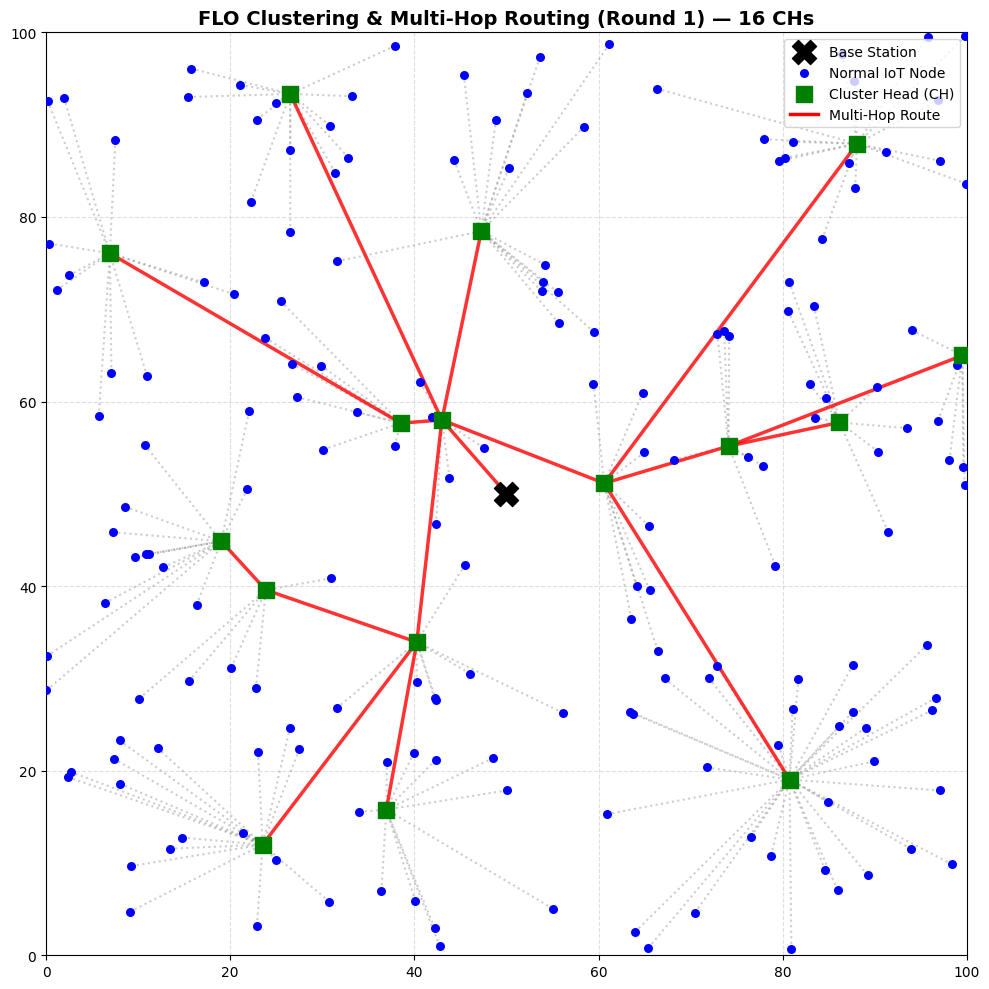

Round 0001 | Alive: 200 | Energy: 99.9756 J
Round 0200 | Alive: 200 | Energy: 95.1174 J
Round 0400 | Alive: 200 | Energy: 90.2351 J
Round 0600 | Alive: 200 | Energy: 85.3529 J
Round 0800 | Alive: 200 | Energy: 80.4707 J
Round 1000 | Alive: 200 | Energy: 75.5883 J
Round 1200 | Alive: 200 | Energy: 70.7069 J
Round 1400 | Alive: 200 | Energy: 65.8249 J
Round 1600 | Alive: 200 | Energy: 60.9445 J
Round 1800 | Alive: 200 | Energy: 56.0638 J
Round 2000 | Alive: 200 | Energy: 51.1832 J
Round 2200 | Alive: 200 | Energy: 46.3029 J
Round 2400 | Alive: 199 | Energy: 41.4230 J
Round 2600 | Alive: 197 | Energy: 36.5862 J
Round 2800 | Alive: 193 | Energy: 31.8295 J
Round 3000 | Alive: 185 | Energy: 27.1698 J
Round 3200 | Alive: 177 | Energy: 22.7407 J
Round 3400 | Alive: 164 | Energy: 18.5430 J
Round 3600 | Alive: 147 | Energy: 14.7461 J
Round 3800 | Alive: 128 | Energy: 11.3986 J
Round 4000 | Alive: 093 | Energy: 8.5964 J
Round 4200 | Alive: 078 | Energy: 6.4651 J
Round 4400 | Alive: 065 | Energy: 

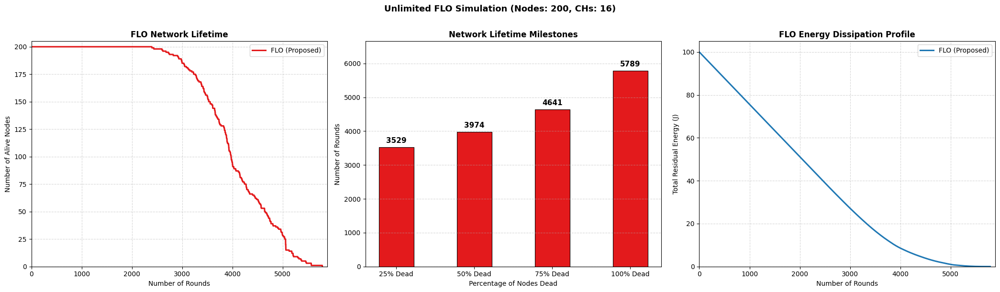

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt
import time

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS
# =========================================================================
AREA        = 100
NUM_NODES   = 200  # Configured for 200 Nodes
BS_X, BS_Y  = 50, 50

INITIAL_ENERGY = 0.5        # Joules per node
PACKET_SIZE    = 1200       # Tuned to ensure depletion within reasonable rounds

E_ELEC = 50e-9              # 50 nJ/bit
E_AMP  = 10e-12             # 10 pJ/bit/m²

# ── FLO Clustering parameters ─────────────────────────────────────────────
NUM_LIZARDS = 20

# DYNAMICALLY SCALED CHs: 8% of total nodes (16 for 200 nodes)
NUM_CH      = int(NUM_NODES * 0.08)
MAX_ITER    = 20

# β2=0.65 → optimizer strongly forced to pick highest-energy nodes as CHs
BETA1, BETA2, BETA3 = 0.20, 0.65, 0.15

# ── Multi-Hop Routing parameters ──────────────────────────────────────────
R_BETA1, R_BETA2, R_BETA3 = 0.15, 0.15, 0.70

# ── CH Energy percentile threshold (dynamic) ──────────────────────────────
CH_ENERGY_PERCENTILE = 40   # bottom 40% excluded → top 60% eligible

# =========================================================================
# 2. CORE UTILITY CLASSES & GLOBAL DISTANCE MATRICES
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id     = node_id
        self.x      = x
        self.y      = y
        self.energy = INITIAL_ENERGY
        self.alive  = True
        self.is_CH  = False

def tx_energy(bits, d):
    return E_ELEC * bits + E_AMP * bits * d**2

def rx_energy(bits):
    return E_ELEC * bits

# =========================================================================
# 3. NETWORK TOPOLOGY PLOT
# =========================================================================
def plot_topology(nodes, clusters, routing_paths, title):
    plt.figure(figsize=(10, 10))

    for ch_id, member_ids in clusters.items():
        ch = nodes[ch_id]
        for m_id in member_ids:
            m = nodes[m_id]
            plt.plot([m.x, ch.x], [m.y, ch.y], color='gray', linestyle=':', alpha=0.4)

    for ch_id, nh in routing_paths.items():
        ch = nodes[ch_id]
        if nh == 'BS':
            plt.plot([ch.x, BS_X], [ch.y, BS_Y], color='red', linewidth=2.5, alpha=0.8)
        else:
            nh_node = nodes[nh]
            plt.plot([ch.x, nh_node.x], [ch.y, nh_node.y], color='red', linewidth=2.5, alpha=0.8)

    for node in nodes:
        if not node.alive:
            plt.scatter(node.x, node.y, color='gray', alpha=0.5, s=20)
        elif node.is_CH:
            plt.scatter(node.x, node.y, color='green', marker='s', s=120, zorder=5)
        else:
            plt.scatter(node.x, node.y, color='blue', s=30, zorder=5)

    plt.scatter(BS_X, BS_Y, color='black', marker='X', s=300, zorder=10, label='Base Station')
    plt.scatter([], [], color='blue',  s=30,  label='Normal IoT Node')
    plt.scatter([], [], color='green', marker='s', s=120, label='Cluster Head (CH)')
    plt.plot([],   [], color='red',   linewidth=2.5, label='Multi-Hop Route')

    plt.title(title, fontweight='bold', fontsize=14)
    plt.xlim(0, AREA); plt.ylim(0, AREA)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

# =========================================================================
# 4. OPTIMIZED FLO CLUSTERING FITNESS
# =========================================================================
def clustering_fitness(ch_ids, alive_list, node_pool):
    if not ch_ids:
        return float('inf')

    # f1 – sum of CH-to-BS distances (FAST LOOKUP)
    f1 = sum(DIST_TO_BS[ch] for ch in ch_ids)

    # f2 – residual-energy ratio
    total_energy = sum(node_pool[i].energy for i in alive_list) + 1e-9
    ch_energy    = sum(node_pool[ch].energy for ch in ch_ids)
    f2           = ch_energy / total_energy

    # f3 – sum of intra-cluster distances (FAST LOOKUP)
    ch_set = set(ch_ids)
    f3 = sum(
        min(DIST_MATRIX[n][ch] for ch in ch_ids)
        for n in alive_list if n not in ch_set
    )

    return BETA1 * f1 + BETA2 * (1.0 / (f2 + 1e-6)) + BETA3 * f3

# =========================================================================
# 5. REPAIR HELPER (DYNAMIC CH TARGET)
# =========================================================================
def _repair(sol, alive_list, current_ch_target):
    seen    = set()
    cleaned = []
    for v in sol:
        if v not in seen:
            seen.add(v)
            cleaned.append(v)
    pool = [x for x in alive_list if x not in seen]
    random.shuffle(pool)
    while len(cleaned) < current_ch_target and pool:
        cleaned.append(pool.pop())
        seen.add(cleaned[-1])
    return cleaned[:current_ch_target]

# =========================================================================
# 6. FRILLED LIZARD OPTIMIZER
# =========================================================================
def execute_floa(node_pool, alive_idx, current_ch_target):
    alive_list = list(alive_idx)

    energies  = [node_pool[i].energy for i in alive_list]
    threshold = np.percentile(energies, CH_ENERGY_PERCENTILE)
    strong    = [i for i in alive_list if node_pool[i].energy >= threshold]

    if len(strong) < current_ch_target:
        strong = alive_list

    if len(strong) <= current_ch_target:
        return _repair(list(strong), alive_list, current_ch_target)

    population = [random.sample(strong, current_ch_target) for _ in range(NUM_LIZARDS)]
    fitness    = [clustering_fitness(sol, alive_list, node_pool) for sol in population]

    best_idx   = int(np.argmin(fitness))
    g_best_sol = list(population[best_idx])
    g_best_fit = fitness[best_idx]

    for t in range(1, MAX_ITER + 1):
        for i in range(NUM_LIZARDS):
            prey_pool = [population[k] for k in range(NUM_LIZARDS) if fitness[k] < fitness[i]]
            prey_pool.append(g_best_sol)
            prey = random.choice(prey_pool)

            new_sol = []
            for j in range(current_ch_target):
                I_ij    = random.randint(0, 1)
                r_ij    = random.random()
                updated = population[i][j] + r_ij * (prey[j] - I_ij * population[i][j])
                nid     = int(round(updated))
                nid     = nid if nid in alive_idx else random.choice(strong)
                new_sol.append(nid)

            new_sol = _repair(new_sol, alive_list, current_ch_target)
            new_fit = clustering_fitness(new_sol, alive_list, node_pool)
            if new_fit < fitness[i]:
                population[i] = new_sol
                fitness[i]    = new_fit

        for i in range(NUM_LIZARDS):
            new_sol = []
            for j in range(current_ch_target):
                r_ij    = random.random()
                updated = population[i][j] + (r_ij * (NUM_NODES - 1)) / t
                nid     = int(round(updated))
                nid     = nid if nid in alive_idx else random.choice(strong)
                new_sol.append(nid)

            new_sol = _repair(new_sol, alive_list, current_ch_target)
            new_fit = clustering_fitness(new_sol, alive_list, node_pool)
            if new_fit < fitness[i]:
                population[i] = new_sol
                fitness[i]    = new_fit

        iter_best = int(np.argmin(fitness))
        if fitness[iter_best] < g_best_fit:
            g_best_sol = list(population[iter_best])
            g_best_fit = fitness[iter_best]

    return g_best_sol

# =========================================================================
# 7. MULTI-HOP ROUTING COST
# =========================================================================
def routing_cost(ch_node, cand_node, dist_bs_cand):
    # FAST LOOKUP instead of dist()
    f1 = DIST_MATRIX[ch_node.id][cand_node.id]
    f2 = dist_bs_cand
    f3 = 1.0 / (cand_node.energy + 1e-9)
    return R_BETA1 * f1 + R_BETA2 * f2 + R_BETA3 * f3

# =========================================================================
# 8. INITIALIZATION & PRE-COMPUTATION
# =========================================================================
random.seed(42)
np.random.seed(42)

node_network = [
    IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA))
    for i in range(NUM_NODES)
]

print("Pre-computing Distance Matrices (This will save massive time)...")
DIST_MATRIX = np.zeros((NUM_NODES, NUM_NODES))
DIST_TO_BS  = np.zeros(NUM_NODES)

for i in range(NUM_NODES):
    DIST_TO_BS[i] = np.sqrt((node_network[i].x - BS_X)**2 + (node_network[i].y - BS_Y)**2)
    for j in range(NUM_NODES):
        DIST_MATRIX[i][j] = np.sqrt((node_network[i].x - node_network[j].x)**2 + (node_network[i].y - node_network[j].y)**2)

# =========================================================================
# 9. SIMULATION MAIN LOOP (UNRESTRICTED ROUNDS)
# =========================================================================
alive_history  = []
energy_history = []

print(f"\n[START] FAST UNRESTRICTED FLO Simulation | Nodes={NUM_NODES}  Target CHs={NUM_CH}")
print("=" * 65)

start_time = time.time() # Track speed
r = 1

while True:

    alive_idx = {n.id for n in node_network if n.alive}

    if len(alive_idx) == 0:
        print(f"\n[STOP] Network 100% Dead at Round {r-1}")
        break

    for n in node_network:
        n.is_CH = False

    # Dynamic CH scaling so it doesn't crash when nodes drop below NUM_CH
    current_ch_target = min(NUM_CH, len(alive_idx))

    ch_ids = execute_floa(node_network, alive_idx, current_ch_target)
    for cid in ch_ids:
        node_network[cid].is_CH = True

    clusters = {cid: [] for cid in ch_ids}
    for n in node_network:
        if not n.alive or n.is_CH:
            continue
        # FAST LOOKUP
        nearest = min(ch_ids, key=lambda c: DIST_MATRIX[n.id][c])
        clusters[nearest].append(n.id)

    # FAST LOOKUP
    dist_to_bs = {cid: DIST_TO_BS[cid] for cid in ch_ids}
    sorted_chs = sorted(ch_ids, key=lambda c: dist_to_bs[c], reverse=True)
    routing_paths = {}

    for cid in sorted_chs:
        ch_node    = node_network[cid]
        candidates = [c for c in ch_ids if dist_to_bs[c] < dist_to_bs[cid] and node_network[c].alive]
        if not candidates:
            routing_paths[cid] = 'BS'
        else:
            best_nh = min(candidates, key=lambda c: routing_cost(ch_node, node_network[c], dist_to_bs[c]))
            routing_paths[cid] = best_nh

    if r == 1:
        plot_topology(node_network, clusters, routing_paths,
                      f"FLO Clustering & Multi-Hop Routing (Round 1) — {NUM_CH} CHs")

    for cid, members in clusters.items():
        ch = node_network[cid]
        for mid in members:
            m = node_network[mid]
            if not m.alive:
                continue
            # FAST LOOKUP
            d_m_ch    = DIST_MATRIX[m.id][ch.id]
            m.energy -= tx_energy(PACKET_SIZE, d_m_ch)
            if m.energy <= 0:
                m.energy = 0
                m.alive  = False
            if ch.alive:
                ch.energy -= rx_energy(PACKET_SIZE)
                if ch.energy <= 0:
                    ch.energy = 0
                    ch.alive  = False

    for cid in sorted_chs:
        ch = node_network[cid]
        if not ch.alive:
            continue

        nh = routing_paths[cid]
        fwd_bits = PACKET_SIZE

        if nh == 'BS':
            ch.energy -= tx_energy(fwd_bits, dist_to_bs[cid])
            if ch.energy <= 0:
                ch.energy = 0
                ch.alive  = False
        else:
            nh_node = node_network[nh]
            # FAST LOOKUP
            d_ch_nh = DIST_MATRIX[ch.id][nh_node.id]

            ch.energy -= tx_energy(fwd_bits, d_ch_nh)
            if ch.energy <= 0:
                ch.energy = 0
                ch.alive  = False

            if nh_node.alive:
                nh_node.energy -= rx_energy(fwd_bits)
                if nh_node.energy <= 0:
                    nh_node.energy = 0
                    nh_node.alive  = False

    alive_count     = sum(1 for n in node_network if n.alive)
    residual_energy = sum(max(n.energy, 0) for n in node_network)
    alive_history.append(alive_count)
    energy_history.append(residual_energy)

    if r % 200 == 0 or r == 1:
        print(f"Round {r:04d} | Alive: {alive_count:03d} | Energy: {residual_energy:.4f} J")

    r += 1

end_time = time.time()
print("=" * 65)
print(f"[DONE] FLO Simulation Concluded in {end_time - start_time:.2f} seconds.\n")

# =========================================================================
# 10. NETWORK LIFETIME MILESTONES & FINAL PLOTS
# =========================================================================
TOTAL_ROUNDS = len(alive_history)
milestone_labels = ['25%', '50%', '75%', '100%']
milestones       = []

for pct in [25, 50, 75, 100]:
    target_alive = NUM_NODES - int(NUM_NODES * pct / 100)
    round_reached = TOTAL_ROUNDS
    for idx, a in enumerate(alive_history):
        if a <= target_alive:
            round_reached = idx + 1
            break
    milestones.append(round_reached)

print("Network Lifetime Milestones (FLO):")
for lbl, rnd in zip(milestone_labels, milestones):
    print(f"  {lbl} nodes dead  →  Round {rnd}")

fig, axes = plt.subplots(1, 3, figsize=(21, 6))
round_axis = range(1, TOTAL_ROUNDS + 1)

# Plot 1
ax = axes[0]
ax.plot(round_axis, alive_history, color='#e31a1c', linewidth=2.2, label='FLO (Proposed)')
ax.set_title("FLO Network Lifetime", fontweight='bold')
ax.set_xlabel("Number of Rounds")
ax.set_ylabel("Number of Alive Nodes")
ax.set_xlim(0, TOTAL_ROUNDS + 100); ax.set_ylim(0, NUM_NODES + 5)
ax.grid(True, linestyle='--', alpha=0.5)
ax.legend(loc='upper right', fontsize=10)

# Plot 2
ax   = axes[1]
x    = np.arange(len(milestone_labels))
bars = ax.bar(x, milestones, color='#e31a1c', width=0.45, edgecolor='black', linewidth=0.8)
ax.set_title("Network Lifetime Milestones", fontweight='bold')
ax.set_xlabel("Percentage of Nodes Dead")
ax.set_ylabel("Number of Rounds")
ax.set_xticks(x); ax.set_xticklabels(['25% Dead', '50% Dead', '75% Dead', '100% Dead'])
ax.set_ylim(0, TOTAL_ROUNDS * 1.15); ax.grid(True, linestyle='--', alpha=0.5, axis='y')
for bar, val in zip(bars, milestones):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + TOTAL_ROUNDS * 0.015,
            str(val), ha='center', va='bottom', fontweight='bold', fontsize=11)

# Plot 3
ax = axes[2]
ax.plot(round_axis, energy_history, color='#1f78b4', linewidth=2.2, label='FLO (Proposed)')
ax.set_title("FLO Energy Dissipation Profile", fontweight='bold')
ax.set_xlabel("Number of Rounds")
ax.set_ylabel("Total Residual Energy (J)")
ax.set_xlim(0, TOTAL_ROUNDS + 100); ax.set_ylim(0, NUM_NODES * INITIAL_ENERGY * 1.05)
ax.grid(True, linestyle='--', alpha=0.5)
ax.legend(loc='upper right', fontsize=10)

plt.suptitle(f"Unlimited FLO Simulation (Nodes: {NUM_NODES}, CHs: {NUM_CH})", fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig("flo_unrestricted_results_200_nodes.png", dpi=150, bbox_inches='tight')
plt.show()

Pre-computing Distance Matrices (This will save massive time)...

[START] FAST UNRESTRICTED FLO Simulation | Nodes=500  Target CHs=40


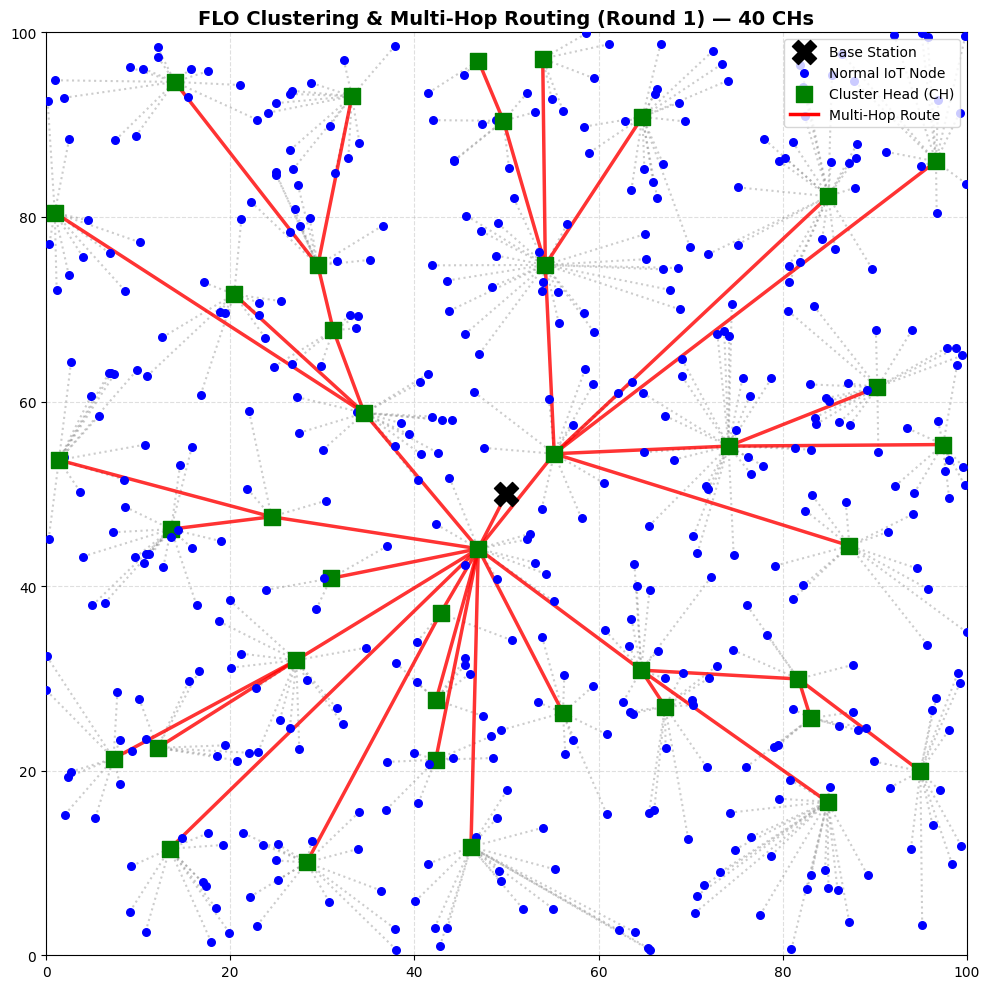

Round 0001 | Alive: 500 | Energy: 249.9243 J
Round 0200 | Alive: 500 | Energy: 234.8552 J
Round 0400 | Alive: 500 | Energy: 219.7145 J
Round 0600 | Alive: 500 | Energy: 204.5771 J
Round 0800 | Alive: 500 | Energy: 189.4421 J
Round 1000 | Alive: 500 | Energy: 174.3083 J


In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt
import time

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS
# =========================================================================
AREA        = 100
NUM_NODES   = 500  # 500 Nodes
BS_X, BS_Y  = 50, 50

INITIAL_ENERGY = 0.5        # Joules per node
PACKET_SIZE    = 1500       # bits

E_ELEC = 50e-9              # 50 nJ/bit
E_AMP  = 10e-12             # 10 pJ/bit/m²

# ── FLO Clustering parameters ─────────────────────────────────────────────
NUM_LIZARDS = 20

# DYNAMICALLY SCALED CHs: 8% of total nodes (8 for 100, 40 for 500)
NUM_CH      = int(NUM_NODES * 0.08)
MAX_ITER    = 20

# β2=0.65 → optimizer strongly forced to pick highest-energy nodes as CHs
BETA1, BETA2, BETA3 = 0.20, 0.65, 0.15

# ── Multi-Hop Routing parameters ──────────────────────────────────────────
R_BETA1, R_BETA2, R_BETA3 = 0.15, 0.15, 0.70

# ── CH Energy percentile threshold (dynamic) ──────────────────────────────
CH_ENERGY_PERCENTILE = 40   # bottom 40% excluded → top 60% eligible

# =========================================================================
# 2. CORE UTILITY CLASSES & GLOBAL DISTANCE MATRICES
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y): # FIXED: Double underscores for init
        self.id     = node_id
        self.x      = x
        self.y      = y
        self.energy = INITIAL_ENERGY
        self.alive  = True
        self.is_CH  = False

def tx_energy(bits, d):
    return E_ELEC * bits + E_AMP * bits * d**2

def rx_energy(bits):
    return E_ELEC * bits

# =========================================================================
# 3. NETWORK TOPOLOGY PLOT
# =========================================================================
def plot_topology(nodes, clusters, routing_paths, title):
    plt.figure(figsize=(10, 10))

    for ch_id, member_ids in clusters.items():
        ch = nodes[ch_id]
        for m_id in member_ids:
            m = nodes[m_id]
            plt.plot([m.x, ch.x], [m.y, ch.y], color='gray', linestyle=':', alpha=0.4)

    for ch_id, nh in routing_paths.items():
        ch = nodes[ch_id]
        if nh == 'BS':
            plt.plot([ch.x, BS_X], [ch.y, BS_Y], color='red', linewidth=2.5, alpha=0.8)
        else:
            nh_node = nodes[nh]
            plt.plot([ch.x, nh_node.x], [ch.y, nh_node.y], color='red', linewidth=2.5, alpha=0.8)

    for node in nodes:
        if not node.alive:
            plt.scatter(node.x, node.y, color='gray', alpha=0.5, s=20)
        elif node.is_CH:
            plt.scatter(node.x, node.y, color='green', marker='s', s=120, zorder=5)
        else:
            plt.scatter(node.x, node.y, color='blue', s=30, zorder=5)

    plt.scatter(BS_X, BS_Y, color='black', marker='X', s=300, zorder=10, label='Base Station')
    plt.scatter([], [], color='blue',  s=30,  label='Normal IoT Node')
    plt.scatter([], [], color='green', marker='s', s=120, label='Cluster Head (CH)')
    plt.plot([],   [], color='red',   linewidth=2.5, label='Multi-Hop Route')

    plt.title(title, fontweight='bold', fontsize=14)
    plt.xlim(0, AREA); plt.ylim(0, AREA)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

# =========================================================================
# 4. OPTIMIZED FLO CLUSTERING FITNESS
# =========================================================================
def clustering_fitness(ch_ids, alive_list, node_pool):
    if not ch_ids:
        return float('inf')

    # f1 – sum of CH-to-BS distances (FAST LOOKUP)
    f1 = sum(DIST_TO_BS[ch] for ch in ch_ids)

    # f2 – residual-energy ratio
    total_energy = sum(node_pool[i].energy for i in alive_list) + 1e-9
    ch_energy    = sum(node_pool[ch].energy for ch in ch_ids)
    f2           = ch_energy / total_energy

    # f3 – sum of intra-cluster distances (FAST LOOKUP)
    ch_set = set(ch_ids)
    f3 = sum(
        min(DIST_MATRIX[n][ch] for ch in ch_ids)
        for n in alive_list if n not in ch_set
    )

    return BETA1 * f1 + BETA2 * (1.0 / (f2 + 1e-6)) + BETA3 * f3

# =========================================================================
# 5. REPAIR HELPER (DYNAMIC CH TARGET)
# =========================================================================
def _repair(sol, alive_list, current_ch_target):
    seen    = set()
    cleaned = []
    for v in sol:
        if v not in seen:
            seen.add(v)
            cleaned.append(v)
    pool = [x for x in alive_list if x not in seen]
    random.shuffle(pool)
    while len(cleaned) < current_ch_target and pool:
        cleaned.append(pool.pop())
        seen.add(cleaned[-1])
    return cleaned[:current_ch_target]

# =========================================================================
# 6. FRILLED LIZARD OPTIMIZER
# =========================================================================
def execute_floa(node_pool, alive_idx, current_ch_target):
    alive_list = list(alive_idx)

    energies  = [node_pool[i].energy for i in alive_list]
    threshold = np.percentile(energies, CH_ENERGY_PERCENTILE)
    strong    = [i for i in alive_list if node_pool[i].energy >= threshold]

    if len(strong) < current_ch_target:
        strong = alive_list

    if len(strong) <= current_ch_target:
        return _repair(list(strong), alive_list, current_ch_target)

    population = [random.sample(strong, current_ch_target) for _ in range(NUM_LIZARDS)]
    fitness    = [clustering_fitness(sol, alive_list, node_pool) for sol in population]

    best_idx   = int(np.argmin(fitness))
    g_best_sol = list(population[best_idx])
    g_best_fit = fitness[best_idx]

    for t in range(1, MAX_ITER + 1):
        for i in range(NUM_LIZARDS):
            prey_pool = [population[k] for k in range(NUM_LIZARDS) if fitness[k] < fitness[i]]
            prey_pool.append(g_best_sol)
            prey = random.choice(prey_pool)

            new_sol = []
            for j in range(current_ch_target):
                I_ij    = random.randint(0, 1)
                r_ij    = random.random()
                updated = population[i][j] + r_ij * (prey[j] - I_ij * population[i][j])
                nid     = int(round(updated))
                nid     = nid if nid in alive_idx else random.choice(strong)
                new_sol.append(nid)

            new_sol = _repair(new_sol, alive_list, current_ch_target)
            new_fit = clustering_fitness(new_sol, alive_list, node_pool)
            if new_fit < fitness[i]:
                population[i] = new_sol
                fitness[i]    = new_fit

        for i in range(NUM_LIZARDS):
            new_sol = []
            for j in range(current_ch_target):
                r_ij    = random.random()
                updated = population[i][j] + (r_ij * (NUM_NODES - 1)) / t
                nid     = int(round(updated))
                nid     = nid if nid in alive_idx else random.choice(strong)
                new_sol.append(nid)

            new_sol = _repair(new_sol, alive_list, current_ch_target)
            new_fit = clustering_fitness(new_sol, alive_list, node_pool)
            if new_fit < fitness[i]:
                population[i] = new_sol
                fitness[i]    = new_fit

        iter_best = int(np.argmin(fitness))
        if fitness[iter_best] < g_best_fit:
            g_best_sol = list(population[iter_best])
            g_best_fit = fitness[iter_best]

    return g_best_sol

# =========================================================================
# 7. MULTI-HOP ROUTING COST
# =========================================================================
def routing_cost(ch_node, cand_node, dist_bs_cand):
    # FAST LOOKUP instead of dist()
    f1 = DIST_MATRIX[ch_node.id][cand_node.id]
    f2 = dist_bs_cand
    f3 = 1.0 / (cand_node.energy + 1e-9)
    return R_BETA1 * f1 + R_BETA2 * f2 + R_BETA3 * f3

# =========================================================================
# 8. INITIALIZATION & PRE-COMPUTATION
# =========================================================================
random.seed(42)
np.random.seed(42)

node_network = [
    IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA))
    for i in range(NUM_NODES)
]

print("Pre-computing Distance Matrices (This will save massive time)...")
DIST_MATRIX = np.zeros((NUM_NODES, NUM_NODES))
DIST_TO_BS  = np.zeros(NUM_NODES)

for i in range(NUM_NODES):
    # FIXED: Replaced *2 with **2 for correct Euclidean Distance formula
    DIST_TO_BS[i] = np.sqrt((node_network[i].x - BS_X)**2 + (node_network[i].y - BS_Y)**2)
    for j in range(NUM_NODES):
        DIST_MATRIX[i][j] = np.sqrt((node_network[i].x - node_network[j].x)**2 + (node_network[i].y - node_network[j].y)**2)

# =========================================================================
# 9. SIMULATION MAIN LOOP (UNRESTRICTED ROUNDS)
# =========================================================================
alive_history  = []
energy_history = []

print(f"\n[START] FAST UNRESTRICTED FLO Simulation | Nodes={NUM_NODES}  Target CHs={NUM_CH}")
print("=" * 65)

start_time = time.time() # Track speed
r = 1

while True:

    alive_idx = {n.id for n in node_network if n.alive}

    if len(alive_idx) == 0:
        print(f"\n[STOP] Network 100% Dead at Round {r-1}")
        break

    for n in node_network:
        n.is_CH = False

    # Dynamic CH scaling so it doesn't crash when nodes drop below NUM_CH
    current_ch_target = min(NUM_CH, len(alive_idx))

    ch_ids = execute_floa(node_network, alive_idx, current_ch_target)
    for cid in ch_ids:
        node_network[cid].is_CH = True

    clusters = {cid: [] for cid in ch_ids}
    for n in node_network:
        if not n.alive or n.is_CH:
            continue
        # FAST LOOKUP
        nearest = min(ch_ids, key=lambda c: DIST_MATRIX[n.id][c])
        clusters[nearest].append(n.id)

    # FAST LOOKUP
    dist_to_bs = {cid: DIST_TO_BS[cid] for cid in ch_ids}
    sorted_chs = sorted(ch_ids, key=lambda c: dist_to_bs[c], reverse=True)
    routing_paths = {}

    for cid in sorted_chs:
        ch_node    = node_network[cid]
        candidates = [c for c in ch_ids if dist_to_bs[c] < dist_to_bs[cid] and node_network[c].alive]
        if not candidates:
            routing_paths[cid] = 'BS'
        else:
            best_nh = min(candidates, key=lambda c: routing_cost(ch_node, node_network[c], dist_to_bs[c]))
            routing_paths[cid] = best_nh

    if r == 1:
        plot_topology(node_network, clusters, routing_paths,
                      f"FLO Clustering & Multi-Hop Routing (Round 1) — {NUM_CH} CHs")

    for cid, members in clusters.items():
        ch = node_network[cid]
        for mid in members:
            m = node_network[mid]
            if not m.alive:
                continue
            # FAST LOOKUP
            d_m_ch    = DIST_MATRIX[m.id][ch.id]
            m.energy -= tx_energy(PACKET_SIZE, d_m_ch)
            if m.energy <= 0:
                m.energy = 0
                m.alive  = False
            if ch.alive:
                ch.energy -= rx_energy(PACKET_SIZE)
                if ch.energy <= 0:
                    ch.energy = 0
                    ch.alive  = False

    for cid in sorted_chs:
        ch = node_network[cid]
        if not ch.alive:
            continue

        nh = routing_paths[cid]
        fwd_bits = PACKET_SIZE

        if nh == 'BS':
            ch.energy -= tx_energy(fwd_bits, dist_to_bs[cid])
            if ch.energy <= 0:
                ch.energy = 0
                ch.alive  = False
        else:
            nh_node = node_network[nh]
            # FAST LOOKUP
            d_ch_nh = DIST_MATRIX[ch.id][nh_node.id]

            ch.energy -= tx_energy(fwd_bits, d_ch_nh)
            if ch.energy <= 0:
                ch.energy = 0
                ch.alive  = False

            if nh_node.alive:
                nh_node.energy -= rx_energy(fwd_bits)
                if nh_node.energy <= 0:
                    nh_node.energy = 0
                    nh_node.alive  = False

    alive_count     = sum(1 for n in node_network if n.alive)
    residual_energy = sum(max(n.energy, 0) for n in node_network)
    alive_history.append(alive_count)
    energy_history.append(residual_energy)

    if r % 200 == 0 or r == 1:
        print(f"Round {r:04d} | Alive: {alive_count:03d} | Energy: {residual_energy:.4f} J")

    r += 1

end_time = time.time()
print("=" * 65)
print(f"[DONE] FLO Simulation Concluded in {end_time - start_time:.2f} seconds.\n")

# =========================================================================
# 10. NETWORK LIFETIME MILESTONES & FINAL PLOTS
# =========================================================================
TOTAL_ROUNDS = len(alive_history)
milestone_labels = ['25%', '50%', '75%', '100%']
milestones       = []

for pct in [25, 50, 75, 100]:
    target_alive = NUM_NODES - int(NUM_NODES * pct / 100)
    round_reached = TOTAL_ROUNDS
    for idx, a in enumerate(alive_history):
        if a <= target_alive:
            round_reached = idx + 1
            break
    milestones.append(round_reached)

print("Network Lifetime Milestones (FLO):")
for lbl, rnd in zip(milestone_labels, milestones):
    print(f"  {lbl} nodes dead  →  Round {rnd}")

fig, axes = plt.subplots(1, 3, figsize=(21, 6))
round_axis = range(1, TOTAL_ROUNDS + 1)

# Plot 1
ax = axes[0]
ax.plot(round_axis, alive_history, color='#e31a1c', linewidth=2.2, label='FLO (Proposed)')
ax.set_title("FLO Network Lifetime", fontweight='bold')
ax.set_xlabel("Number of Rounds")
ax.set_ylabel("Number of Alive Nodes")
ax.set_xlim(0, TOTAL_ROUNDS + 100); ax.set_ylim(0, NUM_NODES + 5)
ax.grid(True, linestyle='--', alpha=0.5)
ax.legend(loc='upper right', fontsize=10)

# Plot 2
ax   = axes[1]
x    = np.arange(len(milestone_labels))
bars = ax.bar(x, milestones, color='#e31a1c', width=0.45, edgecolor='black', linewidth=0.8)
ax.set_title("Network Lifetime Milestones", fontweight='bold')
ax.set_xlabel("Percentage of Nodes Dead")
ax.set_ylabel("Number of Rounds")
ax.set_xticks(x); ax.set_xticklabels(['25% Dead', '50% Dead', '75% Dead', '100% Dead'])
ax.set_ylim(0, TOTAL_ROUNDS * 1.15); ax.grid(True, linestyle='--', alpha=0.5, axis='y')
for bar, val in zip(bars, milestones):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + TOTAL_ROUNDS * 0.015,
            str(val), ha='center', va='bottom', fontweight='bold', fontsize=11)

# Plot 3
ax = axes[2]
ax.plot(round_axis, energy_history, color='#1f78b4', linewidth=2.2, label='FLO (Proposed)')
ax.set_title("FLO Energy Dissipation Profile", fontweight='bold')
ax.set_xlabel("Number of Rounds")
ax.set_ylabel("Total Residual Energy (J)")
ax.set_xlim(0, TOTAL_ROUNDS + 100); ax.set_ylim(0, NUM_NODES * INITIAL_ENERGY * 1.05)
ax.grid(True, linestyle='--', alpha=0.5)
ax.legend(loc='upper right', fontsize=10)

plt.suptitle(f"Unlimited FLO Simulation (Nodes: {NUM_NODES}, CHs: {NUM_CH})", fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig("flo_unrestricted_results.png", dpi=150, bbox_inches='tight')
plt.show()


[START] LEACH + Adaptive Mobile Sink | N=100  P=0.05
Round 0001 | Alive: 100 | Energy: 49.9948 J | CHs:  3 | Sink→(52.9,45.9) target CH=69  sojourn_left=4
Round 0200 | Alive: 100 | Energy: 48.9777 J | CHs:  5 | Sink→(75.2,29.1) target CH=66  sojourn_left=0
Round 0400 | Alive: 100 | Energy: 47.9555 J | CHs:  4 | Sink→(49.6,57.2) target CH=16  sojourn_left=0
Round 0600 | Alive: 100 | Energy: 46.9387 J | CHs:  2 | Sink→(60.0,57.1) target CH=43  sojourn_left=0
Round 0800 | Alive: 100 | Energy: 45.9137 J | CHs:  9 | Sink→(48.4,74.6) target CH=91  sojourn_left=0
Round 1000 | Alive: 100 | Energy: 44.8969 J | CHs:  7 | Sink→(28.8,49.1) target CH=99  sojourn_left=0
Round 1200 | Alive: 100 | Energy: 43.8772 J | CHs:  3 | Sink→(69.1,34.7) target CH=44  sojourn_left=0
Round 1400 | Alive: 100 | Energy: 42.8522 J | CHs:  6 | Sink→(84.0,64.7) target CH=30  sojourn_left=0
Round 1600 | Alive: 100 | Energy: 41.8299 J | CHs:  5 | Sink→(69.2,39.8) target CH=49  sojourn_left=0
Round 1800 | Alive: 100 | En

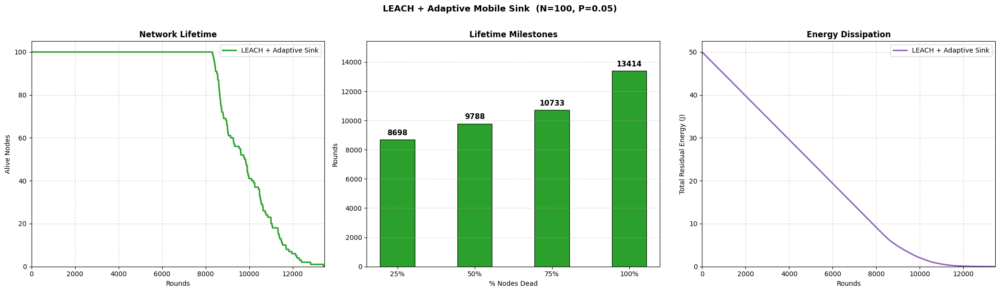

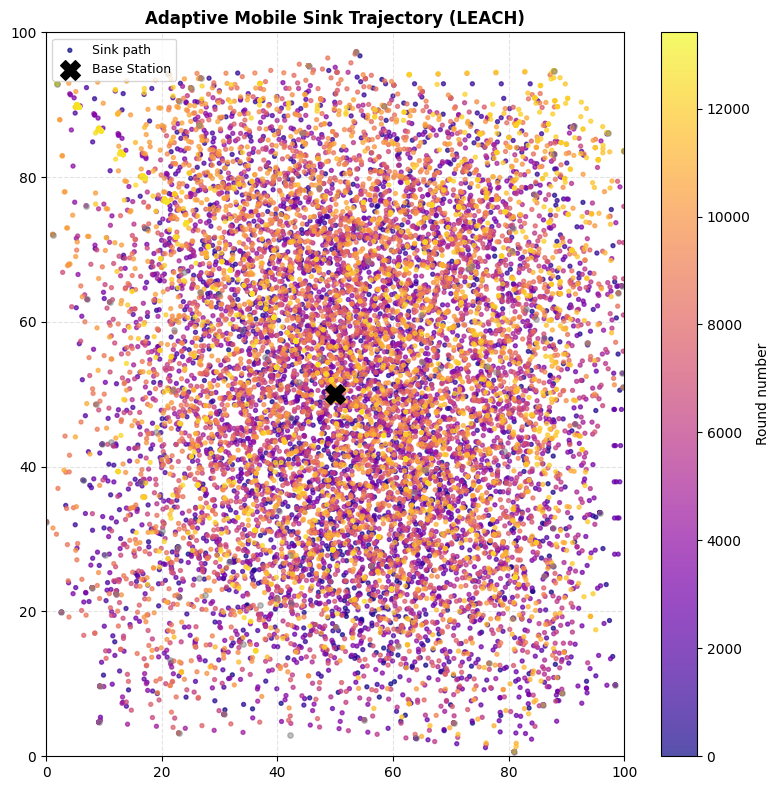

All plots saved.


In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt
import time

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS
# =========================================================================
AREA           = 100
NUM_NODES      = 100
BS_X, BS_Y     = 50.0, 50.0

INITIAL_ENERGY = 0.5        # J per node

PACKET_SIZE    = 500
E_ELEC         = 50e-9      # 50 nJ/bit
E_AMP          = 0.0013e-12 # amplifier
E_DA           = 5e-9       # data aggregation (LEACH specific)

# ── LEACH parameters ──────────────────────────────────────────────────────
P     = 0.05               # desired fraction of CHs
EPOCH = int(1 / P)         # = 20 rounds per epoch

# ── Adaptive mobile sink parameters (from PDF) ────────────────────────────
R_COLLECT  = 25.0  # m  — direct CH→sink if within this radius
V_MAX      = 5.0   # m/round — max sink speed
T_SOJ_MIN  = 1     # min sojourn rounds
T_SOJ_MAX  = 4     # max sojourn rounds ("3 to 4 rounds" from your description)


# =========================================================================
# 2. CORE CLASSES
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id     = node_id
        self.x      = x
        self.y      = y
        self.energy = INITIAL_ENERGY
        self.alive  = True
        self.is_CH  = False


class AdaptiveMobileSink:
    """
    Sink behaviour (from PDF + your requirement):
      - After each sojourn expires, pick the CH with MAX residual energy
      - Stay T_SOJ_MIN..T_SOJ_MAX rounds (proportional to that CH's energy)
      - Move toward target CH at V_MAX m/round
      - If target CH dies mid-sojourn, immediately re-target
    """
    def __init__(self):
        self.x            = BS_X   # start at field center
        self.y            = BS_Y
        self.target_ch    = None   # node ID of current target CH
        self.sojourn_left = 0      # rounds remaining at current stop

    # ── pick the CH with the highest residual energy ──────────────────────
    def select_next_stop(self, ch_ids, node_pool):
        """
        ch_ids   : list of alive CH node IDs for this round
        node_pool: dict {id: IoTNode}
        """
        alive_chs = [c for c in ch_ids if node_pool[c].alive]
        if not alive_chs:
            return  # no valid target — stay put

        # pick CH with maximum remaining energy
        best = max(alive_chs, key=lambda c: node_pool[c].energy)
        self.target_ch = best

        # sojourn time: proportional to best CH energy fraction
        ch_energies = [node_pool[c].energy for c in alive_chs]
        total_e     = sum(ch_energies) + 1e-12
        frac        = node_pool[best].energy / total_e

        # scale fraction → [T_SOJ_MIN, T_SOJ_MAX]
        raw = T_SOJ_MIN + frac * (T_SOJ_MAX - T_SOJ_MIN) * len(alive_chs)
        self.sojourn_left = int(np.clip(round(raw), T_SOJ_MIN, T_SOJ_MAX))

        # start moving toward it immediately
        self._move_toward(node_pool[best])

    # ── slide sink toward a target node at V_MAX m/round ─────────────────
    def _move_toward(self, target_node):
        dx = target_node.x - self.x
        dy = target_node.y - self.y
        d  = np.hypot(dx, dy)
        if d < 1e-6 or d <= V_MAX:
            self.x = target_node.x
            self.y = target_node.y
        else:
            self.x += V_MAX * dx / d
            self.y += V_MAX * dy / d
        self.x = float(np.clip(self.x, 0, AREA))
        self.y = float(np.clip(self.y, 0, AREA))

    # ── called once per round ─────────────────────────────────────────────
    def update(self, ch_ids, node_pool):
        # if current target died, force re-selection immediately
        if (self.target_ch is not None
                and not node_pool[self.target_ch].alive):
            self.sojourn_left = 0

        if self.sojourn_left > 0:
            # still in sojourn — keep sliding toward target
            if self.target_ch is not None and node_pool[self.target_ch].alive:
                self._move_toward(node_pool[self.target_ch])
            self.sojourn_left -= 1
        else:
            # sojourn expired — pick next highest-energy CH
            self.select_next_stop(ch_ids, node_pool)

    # ── Euclidean distance from sink to any node ──────────────────────────
    def dist_to_node(self, node):
        return np.hypot(self.x - node.x, self.y - node.y)


# =========================================================================
# 3. ENERGY MODEL
# =========================================================================
def compute_tx_energy(bits, d):
    return E_ELEC * bits + E_AMP * bits * max(d, 1.0) ** 2

def compute_rx_energy(bits):
    return E_ELEC * bits


# =========================================================================
# 4. AUTHENTIC LEACH CH SELECTION
#    Threshold T(n) = P / (1 - P*(r mod (1/P)))
#    Only nodes in eligible set G can become CH this epoch
# =========================================================================
def execute_leach(alive_idx, eligible_G, round_no):
    """
    Returns (ch_ids, updated_eligible_G).
    eligible_G is reset to all alive nodes every EPOCH rounds.
    """
    # reset epoch: every EPOCH rounds all nodes become eligible again
    if (round_no - 1) % EPOCH == 0:
        eligible_G = set(alive_idx)

    # only consider alive eligible nodes
    candidates = eligible_G.intersection(alive_idx)
    if not candidates:
        eligible_G = set(alive_idx)
        candidates = eligible_G.intersection(alive_idx)

    ch_ids = []
    denom  = 1 - P * ((round_no - 1) % EPOCH)
    if denom <= 0:
        denom = P
    T = P / denom

    for nid in list(candidates):
        if random.random() < T:
            ch_ids.append(nid)

    # nodes that served as CH this epoch are removed from eligible set
    for ch in ch_ids:
        eligible_G.discard(ch)

    return ch_ids, eligible_G


# =========================================================================
# 5. INITIALISATION
# =========================================================================
random.seed(42)
np.random.seed(42)

# node_network as a DICT  {id: IoTNode}  — consistent throughout
node_network = {
    i: IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA))
    for i in range(NUM_NODES)
}

eligible_G  = set(range(NUM_NODES))
mobile_sink = AdaptiveMobileSink()

# =========================================================================
# 6. SIMULATION MAIN LOOP
# =========================================================================
alive_history   = []
energy_history  = []
sink_x_history  = []
sink_y_history  = []

print(f"\n[START] LEACH + Adaptive Mobile Sink | N={NUM_NODES}  P={P}")
print("=" * 68)

start_time = time.time()
r = 1

while True:
    # ── alive set ─────────────────────────────────────────────────────────
    alive_idx = {n.id for n in node_network.values() if n.alive}
    if not alive_idx:
        print(f"\n[STOP] Network 100% dead at Round {r - 1}")
        break

    # reset CH flags
    for n in node_network.values():
        n.is_CH = False

    # ── LEACH CH selection ────────────────────────────────────────────────
    ch_ids, eligible_G = execute_leach(alive_idx, eligible_G, r)
    for cid in ch_ids:
        node_network[cid].is_CH = True

    # ── Adaptive sink: move toward highest-energy CH ──────────────────────
    # Pass the full node_network dict — AdaptiveMobileSink uses dict indexing
    mobile_sink.update(ch_ids, node_network)

    # ── Communication phase ───────────────────────────────────────────────
    if not ch_ids:
        # ── Failsafe: no CHs elected this round
        #    Every alive node transmits directly to whichever is closer:
        #    mobile sink (if within R_COLLECT or sink is nearer) or fixed BS
        for n in node_network.values():
            if not n.alive:
                continue
            d_sink = mobile_sink.dist_to_node(n)
            d_bs   = np.hypot(n.x - BS_X, n.y - BS_Y)

            if d_sink <= R_COLLECT or d_sink <= d_bs:
                d_target = d_sink
            else:
                d_target = d_bs

            cost = compute_tx_energy(PACKET_SIZE, d_target)
            if n.energy >= cost:
                n.energy -= cost
            else:
                n.energy = 0.0; n.alive = False

    else:
        # ── Normal LEACH with adaptive sink ──────────────────────────────

        # 1. Cluster formation: each non-CH joins nearest alive CH
        clusters = {cid: [] for cid in ch_ids}
        for n in node_network.values():
            if not n.alive or n.is_CH:
                continue
            nearest = min(
                ch_ids,
                key=lambda c: np.hypot(n.x - node_network[c].x,
                                       n.y - node_network[c].y)
            )
            clusters[nearest].append(n.id)

        # 2. Intra-cluster: member → CH
        for cid, members in clusters.items():
            ch = node_network[cid]
            for mid in members:
                m = node_network[mid]
                if not m.alive or not ch.alive:
                    continue
                d       = np.hypot(m.x - ch.x, m.y - ch.y)
                cost_tx = compute_tx_energy(PACKET_SIZE, d)
                cost_rx = compute_rx_energy(PACKET_SIZE)

                if m.energy >= cost_tx:
                    m.energy -= cost_tx
                else:
                    m.energy = 0.0; m.alive = False; continue

                if ch.alive:
                    if ch.energy >= cost_rx:
                        ch.energy -= cost_rx
                    else:
                        ch.energy = 0.0; ch.alive = False

        # 3. Data aggregation at CH (LEACH-specific)
        for cid, members in clusters.items():
            ch = node_network[cid]
            if not ch.alive:
                continue
            # aggregate all member packets + own packet
            cost_da = E_DA * PACKET_SIZE * (len(members) + 1)
            if ch.energy >= cost_da:
                ch.energy -= cost_da
            else:
                ch.energy = 0.0; ch.alive = False

        # 4. Inter-cluster: CH → Mobile Sink (direct) or → Fixed BS
        #    Rule: if dist(CH, sink) <= R_COLLECT  → send to sink (shorter d)
        #          elif sink is simply nearer than BS → send to sink
        #          else → send to fixed BS
        for cid in ch_ids:
            ch = node_network[cid]
            if not ch.alive:
                continue

            d_sink = mobile_sink.dist_to_node(ch)
            d_bs   = np.hypot(ch.x - BS_X, ch.y - BS_Y)

            if d_sink <= R_COLLECT or d_sink <= d_bs:
                d_target = d_sink   # direct to adaptive mobile sink
            else:
                d_target = d_bs     # fallback to fixed BS

            cost_tx = compute_tx_energy(PACKET_SIZE, d_target)
            if ch.energy >= cost_tx:
                ch.energy -= cost_tx
            else:
                ch.energy = 0.0; ch.alive = False

    # ── Log metrics ───────────────────────────────────────────────────────
    alive_count    = sum(1 for n in node_network.values() if n.alive)
    residual_e     = sum(max(n.energy, 0) for n in node_network.values())

    alive_history.append(alive_count)
    energy_history.append(residual_e)
    sink_x_history.append(mobile_sink.x)
    sink_y_history.append(mobile_sink.y)

    if r % 200 == 0 or r == 1:
        print(f"Round {r:04d} | Alive: {alive_count:03d} | "
              f"Energy: {residual_e:.4f} J | CHs: {len(ch_ids):2d} | "
              f"Sink→({mobile_sink.x:.1f},{mobile_sink.y:.1f}) "
              f"target CH={mobile_sink.target_ch}  "
              f"sojourn_left={mobile_sink.sojourn_left}")
    r += 1

end_time = time.time()
print("=" * 68)
print(f"[DONE] {end_time - start_time:.2f} s\n")


# =========================================================================
# 7. MILESTONES
# =========================================================================
TOTAL_ROUNDS     = len(alive_history)
milestone_labels = ['25%', '50%', '75%', '100%']
milestones       = []

for pct in [25, 50, 75, 100]:
    target  = max(0, NUM_NODES - int(NUM_NODES * pct / 100))
    reached = TOTAL_ROUNDS
    for idx, a in enumerate(alive_history):
        if a <= target:
            reached = idx + 1; break
    milestones.append(reached)

print("Network Lifetime Milestones (LEACH + Adaptive Sink):")
for lbl, rnd in zip(milestone_labels, milestones):
    print(f"  {lbl} nodes dead  →  Round {rnd}")


# =========================================================================
# 8. FINAL PLOTS — 3 subplots
# =========================================================================
fig, axes = plt.subplots(1, 3, figsize=(21, 6))
rounds_ax = range(1, TOTAL_ROUNDS + 1)

# Plot 1 — Network lifetime
ax = axes[0]
ax.plot(rounds_ax, alive_history, color='#2ca02c', linewidth=2.2,
        label='LEACH + Adaptive Sink')
ax.set_title("Network Lifetime", fontweight='bold')
ax.set_xlabel("Rounds"); ax.set_ylabel("Alive Nodes")
ax.set_xlim(0, TOTAL_ROUNDS + 50); ax.set_ylim(0, NUM_NODES + 5)
ax.grid(True, linestyle='--', alpha=0.5)
ax.legend(loc='upper right', fontsize=10)

# Plot 2 — Milestone bar chart
ax   = axes[1]
x    = np.arange(len(milestone_labels))
bars = ax.bar(x, milestones, color='#2ca02c',
              width=0.45, edgecolor='black', linewidth=0.8)
ax.set_title("Lifetime Milestones", fontweight='bold')
ax.set_xlabel("% Nodes Dead"); ax.set_ylabel("Rounds")
ax.set_xticks(x)
ax.set_xticklabels(['25%', '50%', '75%', '100%'])
ax.set_ylim(0, TOTAL_ROUNDS * 1.15)
ax.grid(True, linestyle='--', alpha=0.5, axis='y')
for bar, val in zip(bars, milestones):
    ax.text(bar.get_x() + bar.get_width() / 2,
            bar.get_height() + TOTAL_ROUNDS * 0.015,
            str(val), ha='center', va='bottom',
            fontweight='bold', fontsize=11)

# Plot 3 — Energy dissipation
ax = axes[2]
ax.plot(rounds_ax, energy_history, color='#9467bd', linewidth=2.2,
        label='LEACH + Adaptive Sink')
ax.set_title("Energy Dissipation", fontweight='bold')
ax.set_xlabel("Rounds"); ax.set_ylabel("Total Residual Energy (J)")
ax.set_xlim(0, TOTAL_ROUNDS + 50)
ax.set_ylim(0, NUM_NODES * INITIAL_ENERGY * 1.05)
ax.grid(True, linestyle='--', alpha=0.5)
ax.legend(loc='upper right', fontsize=10)

plt.suptitle(
    f"LEACH + Adaptive Mobile Sink  (N={NUM_NODES}, P={P})",
    fontsize=13, fontweight='bold', y=1.01
)
plt.tight_layout()
plt.savefig("leach_adaptive_sink_results.png", dpi=150, bbox_inches='tight')
plt.show()


# =========================================================================
# 9. SINK TRAJECTORY PLOT
# =========================================================================
fig2, ax2 = plt.subplots(figsize=(8, 8))
sc = ax2.scatter(sink_x_history, sink_y_history,
                 c=range(TOTAL_ROUNDS), cmap='plasma',
                 s=8, alpha=0.7, label='Sink path')
plt.colorbar(sc, ax=ax2, label='Round number')

for n in node_network.values():
    col = 'gray' if not n.alive else ('green' if n.is_CH else 'steelblue')
    ax2.scatter(n.x, n.y, color=col, s=15, alpha=0.5)

ax2.scatter(BS_X, BS_Y, color='black', marker='X',
            s=200, zorder=10, label='Base Station')
ax2.set_title("Adaptive Mobile Sink Trajectory (LEACH)", fontweight='bold')
ax2.set_xlim(0, AREA); ax2.set_ylim(0, AREA)
ax2.grid(True, linestyle='--', alpha=0.35)
ax2.legend(fontsize=9)
plt.tight_layout()
plt.savefig("leach_sink_trajectory.png", dpi=150, bbox_inches='tight')
plt.show()

print("All plots saved.")

Pre-computing distance matrices...

[START] LEACH + Adaptive Mobile Sink | N=100  P=0.05
Round 0001 | Alive: 100 | Energy: 49.9825 J | CHs:  3 | Sink→(52.9,45.9) target CH=69 sojourn=4
Round 0200 | Alive: 100 | Energy: 46.6280 J | CHs:  5 | Sink→(75.2,29.1) target CH=66 sojourn=0
Round 0400 | Alive: 100 | Energy: 43.2240 J | CHs:  4 | Sink→(65.5,72.4) target CH=16 sojourn=0
Round 0600 | Alive: 100 | Energy: 39.8497 J | CHs:  2 | Sink→(60.1,56.8) target CH=43 sojourn=0
Round 0800 | Alive: 100 | Energy: 36.4479 J | CHs:  9 | Sink→(75.2,74.0) target CH=75 sojourn=0
Round 1000 | Alive: 100 | Energy: 33.0938 J | CHs:  7 | Sink→(63.2,38.6) target CH=99 sojourn=0
Round 1200 | Alive: 100 | Energy: 29.7072 J | CHs:  3 | Sink→(69.1,34.7) target CH=44 sojourn=0
Round 1400 | Alive: 100 | Energy: 26.3101 J | CHs:  6 | Sink→(84.0,64.7) target CH=30 sojourn=0
Round 1600 | Alive: 100 | Energy: 22.8962 J | CHs:  5 | Sink→(67.7,42.7) target CH=49 sojourn=0
Round 1800 | Alive: 100 | Energy: 19.4947 J | C

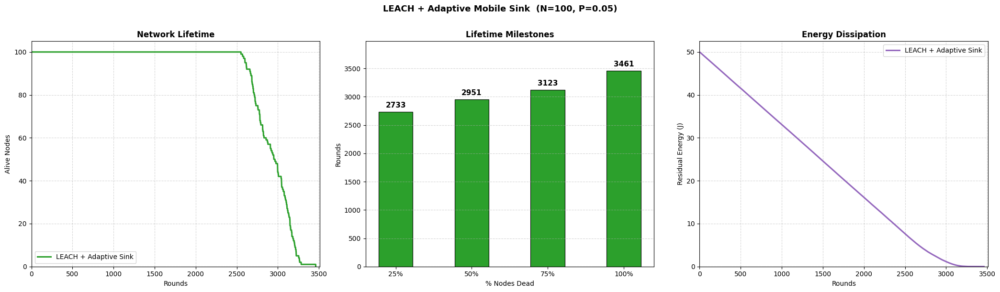

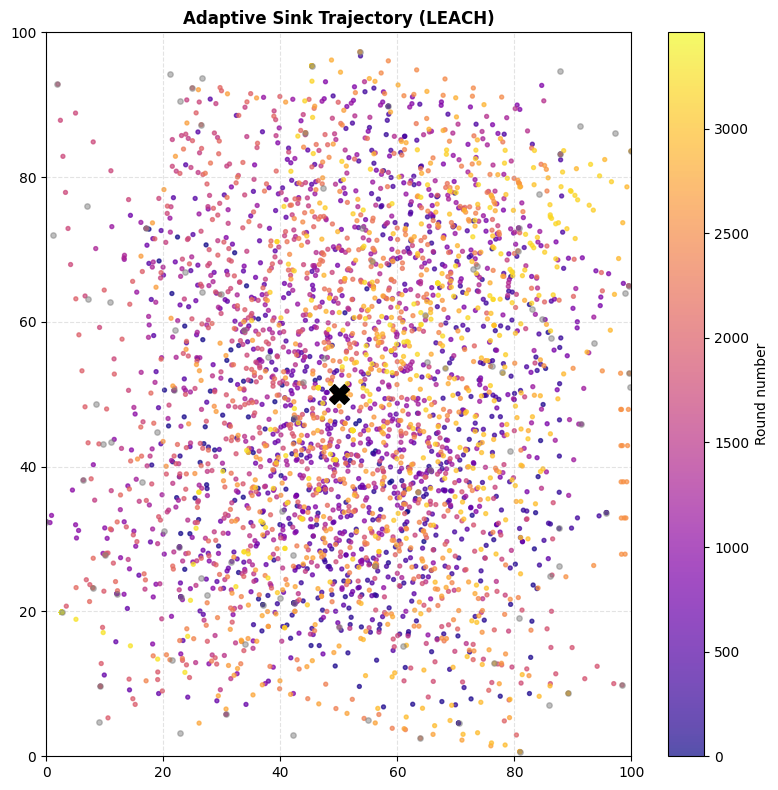

Done.


In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt
import time

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS  — identical to WaOA for fair comparison
# =========================================================================
AREA           = 100
NUM_NODES      = 100
BS_X, BS_Y     = 50.0, 50.0

INITIAL_ENERGY = 0.5        # J per node

# Standard first-order radio model — MUST match WaOA exactly
PACKET_SIZE    = 1500        # bits
E_ELEC         = 50e-9       # 50 nJ/bit
E_AMP          = 10e-12      # 10 pJ/bit/m²
E_DA           = 5e-9        # data aggregation (LEACH specific)

# ── LEACH parameters ──────────────────────────────────────────────────────
P     = 0.05                 # desired fraction of CHs → ~5 CHs per round
EPOCH = int(1 / P)           # = 20 rounds per epoch

# ── Adaptive mobile sink — identical to WaOA ──────────────────────────────
R_COLLECT  = 25.0
V_MAX      = 5.0
T_SOJ_MIN  = 1
T_SOJ_MAX  = 4


# =========================================================================
# 2. CORE CLASSES
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id     = node_id
        self.x      = x
        self.y      = y
        self.energy = INITIAL_ENERGY
        self.alive  = True
        self.is_CH  = False


class AdaptiveMobileSink:
    """
    Moves toward the CH with the highest residual energy.
    Stays T_SOJ_MIN..T_SOJ_MAX rounds, then re-targets.
    Re-targets immediately if current target CH dies.
    """
    def __init__(self):
        self.x            = BS_X
        self.y            = BS_Y
        self.target_ch    = None
        self.sojourn_left = 0

    def select_next_stop(self, ch_ids, node_pool):
        alive_chs = [c for c in ch_ids if node_pool[c].alive]
        if not alive_chs:
            return
        best           = max(alive_chs, key=lambda c: node_pool[c].energy)
        self.target_ch = best
        ch_energies    = [node_pool[c].energy for c in alive_chs]
        total_e        = sum(ch_energies) + 1e-12
        frac           = node_pool[best].energy / total_e
        raw            = T_SOJ_MIN + frac * (T_SOJ_MAX - T_SOJ_MIN) * len(alive_chs)
        self.sojourn_left = int(np.clip(round(raw), T_SOJ_MIN, T_SOJ_MAX))
        self._move_toward(node_pool[best])

    def _move_toward(self, target_node):
        dx = target_node.x - self.x
        dy = target_node.y - self.y
        d  = np.hypot(dx, dy)
        if d < 1e-6 or d <= V_MAX:
            self.x = target_node.x
            self.y = target_node.y
        else:
            self.x += V_MAX * dx / d
            self.y += V_MAX * dy / d
        self.x = float(np.clip(self.x, 0, AREA))
        self.y = float(np.clip(self.y, 0, AREA))

    def update(self, ch_ids, node_pool):
        # force re-target if current target died
        if self.target_ch is not None and not node_pool[self.target_ch].alive:
            self.sojourn_left = 0
        if self.sojourn_left > 0:
            if self.target_ch is not None and node_pool[self.target_ch].alive:
                self._move_toward(node_pool[self.target_ch])
            self.sojourn_left -= 1
        else:
            self.select_next_stop(ch_ids, node_pool)

    def dist_to_node(self, node):
        return np.hypot(self.x - node.x, self.y - node.y)


# =========================================================================
# 3. ENERGY MODEL
# =========================================================================
def tx_energy(bits, d):
    return E_ELEC * bits + E_AMP * bits * max(d, 1.0) ** 2

def rx_energy(bits):
    return E_ELEC * bits


# =========================================================================
# 4. LEACH CH SELECTION
#    Threshold T(n) = P / (1 - P*(r-1 mod 1/P))
#    Eligible set G resets every EPOCH rounds
# =========================================================================
def execute_leach(alive_idx, eligible_G, round_no):
    # reset eligible set every epoch
    if (round_no - 1) % EPOCH == 0:
        eligible_G = set(alive_idx)

    candidates = eligible_G.intersection(alive_idx)
    if not candidates:
        eligible_G = set(alive_idx)
        candidates = set(alive_idx)

    denom = 1 - P * ((round_no - 1) % EPOCH)
    if denom <= 0:
        denom = P
    T = P / denom

    ch_ids = [nid for nid in candidates if random.random() < T]

    # remove elected CHs from eligible set
    for ch in ch_ids:
        eligible_G.discard(ch)

    return ch_ids, eligible_G


# =========================================================================
# 5. INITIALISATION  — same seed and coordinates as WaOA
# =========================================================================
random.seed(42)
np.random.seed(42)

# Build as LIST (same as WaOA) — consistent indexing
node_network = [
    IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA))
    for i in range(NUM_NODES)
]

eligible_G  = set(range(NUM_NODES))
mobile_sink = AdaptiveMobileSink()

# Precompute distance matrix
print("Pre-computing distance matrices...")
DIST_MATRIX = np.zeros((NUM_NODES, NUM_NODES))
DIST_TO_BS  = np.zeros(NUM_NODES)
for i in range(NUM_NODES):
    DIST_TO_BS[i] = np.hypot(node_network[i].x - BS_X,
                              node_network[i].y - BS_Y)
    for j in range(NUM_NODES):
        DIST_MATRIX[i][j] = np.hypot(
            node_network[i].x - node_network[j].x,
            node_network[i].y - node_network[j].y
        )


# =========================================================================
# 6. SIMULATION MAIN LOOP
# =========================================================================
alive_history  = []
energy_history = []
sink_x_history = []
sink_y_history = []

print(f"\n[START] LEACH + Adaptive Mobile Sink | N={NUM_NODES}  P={P}")
print("=" * 68)

start_time = time.time()
r = 1

while True:
    alive_idx = {n.id for n in node_network if n.alive}
    if not alive_idx:
        print(f"\n[STOP] Network 100% dead at Round {r - 1}")
        break

    # reset CH flags
    for n in node_network:
        n.is_CH = False

    # ── LEACH CH selection ────────────────────────────────────────────────
    ch_ids, eligible_G = execute_leach(alive_idx, eligible_G, r)
    for cid in ch_ids:
        node_network[cid].is_CH = True

    # ── Adaptive sink moves toward highest-energy CH ──────────────────────
    mobile_sink.update(ch_ids, node_network)

    # ── Communication phase ───────────────────────────────────────────────
    if not ch_ids:
        # Failsafe: no CHs this round — every node transmits directly
        # to whichever destination is closer: sink or BS
        for n in node_network:
            if not n.alive:
                continue
            d_sink = mobile_sink.dist_to_node(n)
            d_bs   = DIST_TO_BS[n.id]
            d_target = d_sink if (d_sink <= R_COLLECT or d_sink <= d_bs) \
                       else d_bs
            cost = tx_energy(PACKET_SIZE, d_target)
            if n.energy >= cost:
                n.energy -= cost
            else:
                n.energy = 0.0; n.alive = False
    else:
        # ── 1. Cluster formation: non-CH joins nearest alive CH ───────────
        clusters = {cid: [] for cid in ch_ids}
        for n in node_network:
            if not n.alive or n.is_CH:
                continue
            nearest = min(ch_ids,
                          key=lambda c: DIST_MATRIX[n.id][c])
            clusters[nearest].append(n.id)

        # ── 2. Intra-cluster: member → CH ────────────────────────────────
        for cid, members in clusters.items():
            ch = node_network[cid]
            for mid in members:
                m = node_network[mid]
                if not m.alive or not ch.alive:
                    continue
                d       = DIST_MATRIX[m.id][ch.id]
                cost_tx = tx_energy(PACKET_SIZE, d)
                cost_rx = rx_energy(PACKET_SIZE)
                if m.energy >= cost_tx:
                    m.energy -= cost_tx
                else:
                    m.energy = 0.0; m.alive = False; continue
                if ch.alive:
                    if ch.energy >= cost_rx:
                        ch.energy -= cost_rx
                    else:
                        ch.energy = 0.0; ch.alive = False

        # ── 3. Data aggregation at CH (LEACH specific) ────────────────────
        for cid, members in clusters.items():
            ch = node_network[cid]
            if not ch.alive:
                continue
            cost_da = E_DA * PACKET_SIZE * (len(members) + 1)
            if ch.energy >= cost_da:
                ch.energy -= cost_da
            else:
                ch.energy = 0.0; ch.alive = False

        # ── 4. Inter-cluster: CH → sink (direct) or → BS (fallback) ──────
        for cid in ch_ids:
            ch = node_network[cid]
            if not ch.alive:
                continue
            d_sink = mobile_sink.dist_to_node(ch)
            d_bs   = DIST_TO_BS[cid]

            # direct to mobile sink if within R_COLLECT or sink is nearer
            if d_sink <= R_COLLECT or d_sink <= d_bs:
                d_target = d_sink
            else:
                d_target = d_bs

            cost_tx = tx_energy(PACKET_SIZE, d_target)
            if ch.energy >= cost_tx:
                ch.energy -= cost_tx
            else:
                ch.energy = 0.0; ch.alive = False

    # ── Log metrics ───────────────────────────────────────────────────────
    alive_count = sum(1 for n in node_network if n.alive)
    residual_e  = sum(max(n.energy, 0) for n in node_network)
    alive_history.append(alive_count)
    energy_history.append(residual_e)
    sink_x_history.append(mobile_sink.x)
    sink_y_history.append(mobile_sink.y)

    if r % 200 == 0 or r == 1:
        print(f"Round {r:04d} | Alive: {alive_count:03d} | "
              f"Energy: {residual_e:.4f} J | CHs: {len(ch_ids):2d} | "
              f"Sink→({mobile_sink.x:.1f},{mobile_sink.y:.1f}) "
              f"target CH={mobile_sink.target_ch} "
              f"sojourn={mobile_sink.sojourn_left}")
    r += 1

end_time = time.time()
print("=" * 68)
print(f"[DONE] {end_time - start_time:.2f} s\n")


# =========================================================================
# 7. MILESTONES
# =========================================================================
TOTAL_ROUNDS     = len(alive_history)
milestone_labels = ['25%', '50%', '75%', '100%']
milestones       = []

for pct in [25, 50, 75, 100]:
    target  = max(0, NUM_NODES - int(NUM_NODES * pct / 100))
    reached = TOTAL_ROUNDS
    for idx, a in enumerate(alive_history):
        if a <= target:
            reached = idx + 1; break
    milestones.append(reached)

print("Network Lifetime Milestones (LEACH + Adaptive Sink):")
for lbl, rnd in zip(milestone_labels, milestones):
    print(f"  {lbl} nodes dead  →  Round {rnd}")


# =========================================================================
# 8. PLOTS
# =========================================================================
fig, axes = plt.subplots(1, 3, figsize=(21, 6))
rounds_ax = range(1, TOTAL_ROUNDS + 1)

ax = axes[0]
ax.plot(rounds_ax, alive_history, color='#2ca02c', linewidth=2.2,
        label='LEACH + Adaptive Sink')
ax.set_title("Network Lifetime", fontweight='bold')
ax.set_xlabel("Rounds"); ax.set_ylabel("Alive Nodes")
ax.set_xlim(0, TOTAL_ROUNDS + 50); ax.set_ylim(0, NUM_NODES + 5)
ax.grid(True, linestyle='--', alpha=0.5); ax.legend(fontsize=10)

ax   = axes[1]
x    = np.arange(len(milestone_labels))
bars = ax.bar(x, milestones, color='#2ca02c',
              width=0.45, edgecolor='black', linewidth=0.8)
ax.set_title("Lifetime Milestones", fontweight='bold')
ax.set_xlabel("% Nodes Dead"); ax.set_ylabel("Rounds")
ax.set_xticks(x)
ax.set_xticklabels(['25%', '50%', '75%', '100%'])
ax.set_ylim(0, TOTAL_ROUNDS * 1.15)
ax.grid(True, linestyle='--', alpha=0.5, axis='y')
for bar, val in zip(bars, milestones):
    ax.text(bar.get_x() + bar.get_width() / 2,
            bar.get_height() + TOTAL_ROUNDS * 0.015,
            str(val), ha='center', va='bottom',
            fontweight='bold', fontsize=11)

ax = axes[2]
ax.plot(rounds_ax, energy_history, color='#9467bd', linewidth=2.2,
        label='LEACH + Adaptive Sink')
ax.set_title("Energy Dissipation", fontweight='bold')
ax.set_xlabel("Rounds"); ax.set_ylabel("Residual Energy (J)")
ax.set_xlim(0, TOTAL_ROUNDS + 50)
ax.set_ylim(0, NUM_NODES * INITIAL_ENERGY * 1.05)
ax.grid(True, linestyle='--', alpha=0.5); ax.legend(fontsize=10)

plt.suptitle(f"LEACH + Adaptive Mobile Sink  (N={NUM_NODES}, P={P})",
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig("leach_adaptive_final.png", dpi=150, bbox_inches='tight')
plt.show()

# Trajectory plot
fig2, ax2 = plt.subplots(figsize=(8, 8))
sc = ax2.scatter(sink_x_history, sink_y_history,
                 c=range(TOTAL_ROUNDS), cmap='plasma', s=8, alpha=0.7)
plt.colorbar(sc, ax=ax2, label='Round number')
for n in node_network:
    col = 'gray' if not n.alive else ('green' if n.is_CH else 'steelblue')
    ax2.scatter(n.x, n.y, color=col, s=15, alpha=0.5)
ax2.scatter(BS_X, BS_Y, color='black', marker='X', s=200, zorder=10)
ax2.set_title("Adaptive Sink Trajectory (LEACH)", fontweight='bold')
ax2.set_xlim(0, AREA); ax2.set_ylim(0, AREA)
ax2.grid(True, linestyle='--', alpha=0.35)
plt.tight_layout()
plt.savefig("leach_trajectory_final.png", dpi=150, bbox_inches='tight')
plt.show()
print("Done.")

Pre-computing distance matrices...

[START] WaOA + Adaptive Mobile Sink | N=100  CHs=8
Round 0001 | Alive: 100 | Energy: 49.9848 J | Sink→(45.8,47.3) target CH=74 sojourn=4
Round 0200 | Alive: 100 | Energy: 46.9564 J | Sink→(78.6,49.1) target CH=37 sojourn=0
Round 0400 | Alive: 100 | Energy: 43.9102 J | Sink→(83.6,74.7) target CH=99 sojourn=0
Round 0600 | Alive: 100 | Energy: 40.8661 J | Sink→(90.8,39.5) target CH=12 sojourn=0
Round 0800 | Alive: 100 | Energy: 37.8189 J | Sink→(54.9,66.9) target CH=88 sojourn=0
Round 1000 | Alive: 100 | Energy: 34.7710 J | Sink→(45.0,86.1) target CH=16 sojourn=0
Round 1200 | Alive: 100 | Energy: 31.7260 J | Sink→(58.5,89.8) target CH=41 sojourn=0
Round 1400 | Alive: 100 | Energy: 28.6783 J | Sink→(83.5,36.5) target CH=43 sojourn=0
Round 1600 | Alive: 100 | Energy: 25.6286 J | Sink→(77.7,74.4) target CH=64 sojourn=0
Round 1800 | Alive: 098 | Energy: 22.6152 J | Sink→(80.3,17.2) target CH=9 sojourn=0
Round 2000 | Alive: 095 | Energy: 19.7060 J | Sink→(82

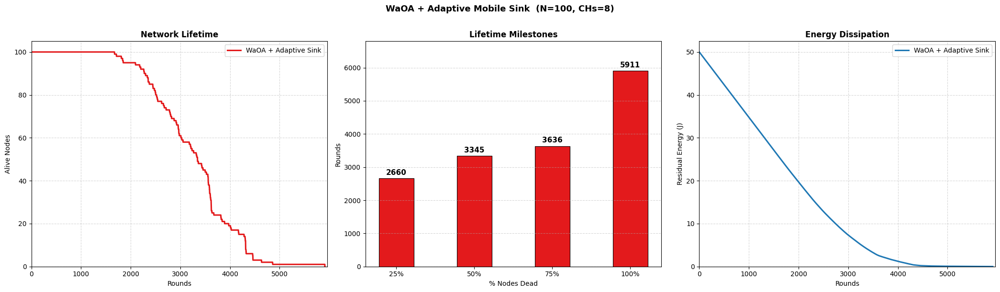

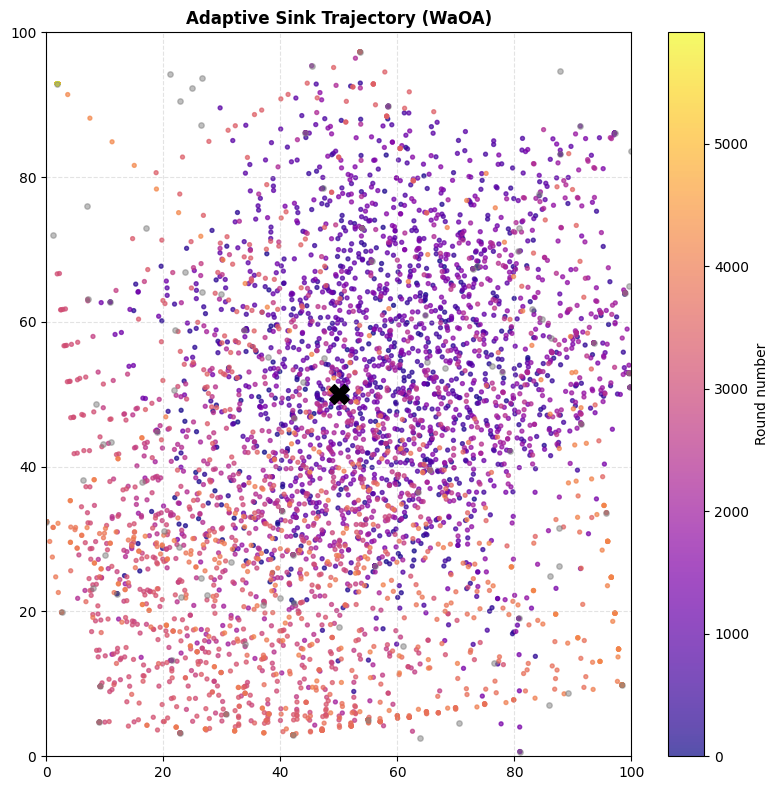

Done.


In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt
import time

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS
# =========================================================================
AREA           = 100
NUM_NODES      = 100
BS_X, BS_Y     = 50.0, 50.0

INITIAL_ENERGY = 0.5        # J per node

# Standard first-order radio model (from PDF Section 2.2)
PACKET_SIZE    = 1500        # bits
E_ELEC         = 50e-9       # 50 nJ/bit
E_AMP          = 10e-12      # 10 pJ/bit/m²

# ── WaOA clustering ───────────────────────────────────────────────────────
NUM_WALRUSES         = 20
NUM_CH               = 8
MAX_ITER             = 20
LB, UB               = 0, NUM_NODES - 1
BETA1, BETA2, BETA3  = 0.20, 0.65, 0.15
CH_ENERGY_PERCENTILE = 40

# ── Multi-hop routing weights ─────────────────────────────────────────────
R_BETA1, R_BETA2, R_BETA3 = 0.15, 0.15, 0.70

# ── Adaptive mobile sink ──────────────────────────────────────────────────
R_COLLECT  = 25.0   # m — CH sends direct to sink if within this
V_MAX      = 5.0    # m/round — max sink speed
T_SOJ_MIN  = 1      # min sojourn rounds
T_SOJ_MAX  = 4      # max sojourn rounds


# =========================================================================
# 2. CORE CLASSES
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id     = node_id
        self.x      = x
        self.y      = y
        self.energy = INITIAL_ENERGY
        self.alive  = True
        self.is_CH  = False


class AdaptiveMobileSink:
    """
    Moves toward the CH with the highest residual energy.
    Stays T_SOJ_MIN..T_SOJ_MAX rounds, then re-targets.
    If current target CH dies mid-sojourn, re-targets immediately.
    """
    def __init__(self):
        self.x            = BS_X
        self.y            = BS_Y
        self.target_ch    = None
        self.sojourn_left = 0

    def select_next_stop(self, ch_ids, node_pool):
        alive_chs = [c for c in ch_ids if node_pool[c].alive]
        if not alive_chs:
            return
        best           = max(alive_chs, key=lambda c: node_pool[c].energy)
        self.target_ch = best
        ch_energies    = [node_pool[c].energy for c in alive_chs]
        total_e        = sum(ch_energies) + 1e-12
        frac           = node_pool[best].energy / total_e
        raw            = T_SOJ_MIN + frac * (T_SOJ_MAX - T_SOJ_MIN) * len(alive_chs)
        self.sojourn_left = int(np.clip(round(raw), T_SOJ_MIN, T_SOJ_MAX))
        self._move_toward(node_pool[best])

    def _move_toward(self, target_node):
        dx = target_node.x - self.x
        dy = target_node.y - self.y
        d  = np.hypot(dx, dy)
        if d < 1e-6 or d <= V_MAX:
            self.x = target_node.x
            self.y = target_node.y
        else:
            self.x += V_MAX * dx / d
            self.y += V_MAX * dy / d
        self.x = float(np.clip(self.x, 0, AREA))
        self.y = float(np.clip(self.y, 0, AREA))

    def update(self, ch_ids, node_pool):
        # re-target immediately if current target died
        if self.target_ch is not None and not node_pool[self.target_ch].alive:
            self.sojourn_left = 0
        if self.sojourn_left > 0:
            if self.target_ch is not None and node_pool[self.target_ch].alive:
                self._move_toward(node_pool[self.target_ch])
            self.sojourn_left -= 1
        else:
            self.select_next_stop(ch_ids, node_pool)

    def dist_to_node(self, node):
        return np.hypot(self.x - node.x, self.y - node.y)


# =========================================================================
# 3. ENERGY MODEL
# =========================================================================
def tx_energy(bits, d):
    return E_ELEC * bits + E_AMP * bits * max(d, 1.0) ** 2

def rx_energy(bits):
    return E_ELEC * bits


# =========================================================================
# 4. CLUSTERING FITNESS  (WaOA paper equations)
# =========================================================================
def clustering_fitness(ch_ids, alive_list, node_pool):
    if not ch_ids:
        return float('inf')
    f1     = sum(DIST_TO_BS[ch] for ch in ch_ids)
    total_e = sum(node_pool[i].energy for i in alive_list) + 1e-9
    ch_e   = sum(node_pool[ch].energy for ch in ch_ids)
    f2     = ch_e / total_e
    ch_set = set(ch_ids)
    f3     = sum(
        min(DIST_MATRIX[n][ch] for ch in ch_ids)
        for n in alive_list if n not in ch_set
    )
    return BETA1 * f1 + BETA2 * (1.0 / (f2 + 1e-6)) + BETA3 * f3


# =========================================================================
# 5. REPAIR HELPER
# =========================================================================
def _repair(sol, alive_list, k):
    seen, cleaned = set(), []
    for v in sol:
        if v not in seen:
            seen.add(v); cleaned.append(v)
    pool = [x for x in alive_list if x not in seen]
    random.shuffle(pool)
    while len(cleaned) < k and pool:
        nxt = pool.pop(); cleaned.append(nxt); seen.add(nxt)
    return cleaned[:k]

def _to_node(val, alive_idx, strong):
    nid = int(round(np.clip(val, LB, UB)))
    return nid if nid in alive_idx else random.choice(strong)


# =========================================================================
# 6. WaOA  — strictly follows paper Eqs. (3)–(9)
# =========================================================================
def execute_waoa(node_pool, alive_idx, k):
    alive_list = list(alive_idx)
    m          = k

    energies  = [node_pool[i].energy for i in alive_list]
    threshold = np.percentile(energies, CH_ENERGY_PERCENTILE)
    strong    = [i for i in alive_list if node_pool[i].energy >= threshold]
    if len(strong) < k:
        strong = alive_list[:]
    if len(strong) <= k:
        return _repair(list(strong), alive_list, k)

    # Initialise population Eq.(1)
    population = [random.sample(strong, k) for _ in range(NUM_WALRUSES)]
    fitness    = [clustering_fitness(s, alive_list, node_pool)
                  for s in population]
    best_idx   = int(np.argmin(fitness))
    g_best_sol = list(population[best_idx])
    g_best_fit = fitness[best_idx]

    for t in range(1, MAX_ITER + 1):
        lb_local = LB / t
        ub_local = UB / t

        bi = int(np.argmin(fitness))
        if fitness[bi] < g_best_fit:
            g_best_sol = list(population[bi])
            g_best_fit = fitness[bi]

        for i in range(NUM_WALRUSES):

            # Phase 1 — Feeding (Exploration) Eq.(3,4)
            new_p1 = []
            for j in range(m):
                I_ij = random.choice([1, 2])
                r_ij = random.random()
                val  = population[i][j] + r_ij * (
                           g_best_sol[j] - I_ij * population[i][j])
                new_p1.append(_to_node(val, alive_idx, strong))
            new_p1  = _repair(new_p1, alive_list, k)
            fit_p1  = clustering_fitness(new_p1, alive_list, node_pool)
            if fit_p1 < fitness[i]:
                population[i] = new_p1; fitness[i] = fit_p1
                if fit_p1 < g_best_fit:
                    g_best_sol = list(new_p1); g_best_fit = fit_p1

            # Phase 2 — Migration (Exploration) Eq.(5,6)
            kk     = random.choice([x for x in range(NUM_WALRUSES) if x != i])
            new_p2 = []
            for j in range(m):
                r_ij = random.random()
                if fitness[kk] < fitness[i]:
                    I_ij = random.choice([1, 2])
                    val  = population[i][j] + r_ij * (
                               population[kk][j] - I_ij * population[i][j])
                else:
                    val  = population[i][j] + r_ij * (
                               population[i][j] - population[kk][j])
                new_p2.append(_to_node(val, alive_idx, strong))
            new_p2  = _repair(new_p2, alive_list, k)
            fit_p2  = clustering_fitness(new_p2, alive_list, node_pool)
            if fit_p2 < fitness[i]:
                population[i] = new_p2; fitness[i] = fit_p2
                if fit_p2 < g_best_fit:
                    g_best_sol = list(new_p2); g_best_fit = fit_p2

            # Phase 3 — Escape/Fight Predators (Exploitation) Eq.(7,8,9)
            new_p3 = []
            for j in range(m):
                rand_j = random.random()
                disp   = lb_local + (ub_local - rand_j * lb_local)
                val    = population[i][j] + disp
                new_p3.append(_to_node(val, alive_idx, strong))
            new_p3  = _repair(new_p3, alive_list, k)
            fit_p3  = clustering_fitness(new_p3, alive_list, node_pool)
            if fit_p3 < fitness[i]:
                population[i] = new_p3; fitness[i] = fit_p3
                if fit_p3 < g_best_fit:
                    g_best_sol = list(new_p3); g_best_fit = fit_p3

    return g_best_sol


# =========================================================================
# 7. INITIALISATION
# =========================================================================
random.seed(42);  np.random.seed(42)

node_network = [
    IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA))
    for i in range(NUM_NODES)
]

mobile_sink = AdaptiveMobileSink()

print("Pre-computing distance matrices...")
DIST_MATRIX = np.zeros((NUM_NODES, NUM_NODES))
DIST_TO_BS  = np.zeros(NUM_NODES)
for i in range(NUM_NODES):
    DIST_TO_BS[i] = np.hypot(node_network[i].x - BS_X,
                              node_network[i].y - BS_Y)
    for j in range(NUM_NODES):
        DIST_MATRIX[i][j] = np.hypot(
            node_network[i].x - node_network[j].x,
            node_network[i].y - node_network[j].y
        )


# =========================================================================
# 8. SIMULATION MAIN LOOP
# =========================================================================
alive_history  = []
energy_history = []
sink_x_history = []
sink_y_history = []

print(f"\n[START] WaOA + Adaptive Mobile Sink | N={NUM_NODES}  CHs={NUM_CH}")
print("=" * 68)

start_time = time.time()
r = 1

while True:
    alive_idx = {n.id for n in node_network if n.alive}
    if not alive_idx:
        print(f"\n[STOP] Network 100% dead at Round {r - 1}")
        break

    k = min(NUM_CH, len(alive_idx))

    # reset CH flags
    for n in node_network:
        n.is_CH = False

    # WaOA CH selection
    ch_ids = execute_waoa(node_network, alive_idx, k)
    for cid in ch_ids:
        node_network[cid].is_CH = True

    # Adaptive sink moves toward highest-energy CH
    mobile_sink.update(ch_ids, node_network)

    # Cluster assignment — each non-CH joins nearest alive CH
    clusters = {cid: [] for cid in ch_ids}
    for n in node_network:
        if not n.alive or n.is_CH:
            continue
        nearest = min(ch_ids, key=lambda c: DIST_MATRIX[n.id][c])
        clusters[nearest].append(n.id)

    # Routing decision per CH
    dist_sink = {cid: mobile_sink.dist_to_node(node_network[cid])
                 for cid in ch_ids}
    dist_bs   = {cid: DIST_TO_BS[cid] for cid in ch_ids}

    routing_paths = {}
    for cid in ch_ids:
        if dist_sink[cid] <= R_COLLECT or dist_sink[cid] <= dist_bs[cid]:
            routing_paths[cid] = 'SINK'
        else:
            # multi-hop: find a closer-to-BS alive CH as relay
            candidates = [c for c in ch_ids
                          if dist_bs[c] < dist_bs[cid]
                          and node_network[c].alive]
            if candidates:
                best_relay = min(
                    candidates,
                    key=lambda c: (R_BETA1 * DIST_MATRIX[cid][c]
                                   + R_BETA2 * dist_bs[c]
                                   + R_BETA3 / (node_network[c].energy + 1e-9))
                )
                routing_paths[cid] = best_relay
            else:
                routing_paths[cid] = 'BS'

    # ── Intra-cluster: member → CH ────────────────────────────────────────
    for cid, members in clusters.items():
        ch = node_network[cid]
        for mid in members:
            m = node_network[mid]
            if not m.alive or not ch.alive:
                continue
            d       = DIST_MATRIX[m.id][ch.id]
            cost_tx = tx_energy(PACKET_SIZE, d)
            cost_rx = rx_energy(PACKET_SIZE)
            if m.energy >= cost_tx:
                m.energy -= cost_tx
            else:
                m.energy = 0.0; m.alive = False; continue
            if ch.alive:
                if ch.energy >= cost_rx:
                    ch.energy -= cost_rx
                else:
                    ch.energy = 0.0; ch.alive = False

    # ── Inter-cluster: CH → sink or relay or BS ───────────────────────────
    sorted_chs = sorted(ch_ids, key=lambda c: dist_bs[c], reverse=True)
    for cid in sorted_chs:
        ch = node_network[cid]
        if not ch.alive:
            continue
        nh = routing_paths[cid]

        if nh == 'SINK':
            cost = tx_energy(PACKET_SIZE, dist_sink[cid])
            if ch.energy >= cost:
                ch.energy -= cost
            else:
                ch.energy = 0.0; ch.alive = False

        elif nh == 'BS':
            cost = tx_energy(PACKET_SIZE, dist_bs[cid])
            if ch.energy >= cost:
                ch.energy -= cost
            else:
                ch.energy = 0.0; ch.alive = False

        else:   # relay through another CH
            relay   = node_network[nh]
            d_relay = DIST_MATRIX[ch.id][relay.id]
            c_tx    = tx_energy(PACKET_SIZE, d_relay)
            c_rx    = rx_energy(PACKET_SIZE)
            if ch.energy >= c_tx:
                ch.energy -= c_tx
            else:
                ch.energy = 0.0; ch.alive = False; continue
            if relay.alive:
                if relay.energy >= c_rx:
                    relay.energy -= c_rx
                else:
                    relay.energy = 0.0; relay.alive = False

    # ── Log metrics ───────────────────────────────────────────────────────
    alive_count = sum(1 for n in node_network if n.alive)
    residual_e  = sum(max(n.energy, 0) for n in node_network)
    alive_history.append(alive_count)
    energy_history.append(residual_e)
    sink_x_history.append(mobile_sink.x)
    sink_y_history.append(mobile_sink.y)

    if r % 200 == 0 or r == 1:
        print(f"Round {r:04d} | Alive: {alive_count:03d} | "
              f"Energy: {residual_e:.4f} J | "
              f"Sink→({mobile_sink.x:.1f},{mobile_sink.y:.1f}) "
              f"target CH={mobile_sink.target_ch} "
              f"sojourn={mobile_sink.sojourn_left}")
    r += 1

end_time = time.time()
print("=" * 68)
print(f"[DONE] {end_time - start_time:.1f} s\n")


# =========================================================================
# 9. MILESTONES
# =========================================================================
TOTAL_ROUNDS     = len(alive_history)
milestone_labels = ['25%', '50%', '75%', '100%']
milestones       = []

for pct in [25, 50, 75, 100]:
    target  = NUM_NODES - int(NUM_NODES * pct / 100)
    reached = TOTAL_ROUNDS
    for idx, a in enumerate(alive_history):
        if a <= target:
            reached = idx + 1; break
    milestones.append(reached)

print("Network Lifetime Milestones (WaOA + Adaptive Sink):")
for lbl, rnd in zip(milestone_labels, milestones):
    print(f"  {lbl} nodes dead  →  Round {rnd}")


# =========================================================================
# 10. PLOTS
# =========================================================================
fig, axes = plt.subplots(1, 3, figsize=(21, 6))
rounds_ax = range(1, TOTAL_ROUNDS + 1)

ax = axes[0]
ax.plot(rounds_ax, alive_history, color='#e31a1c', linewidth=2.2,
        label='WaOA + Adaptive Sink')
ax.set_title("Network Lifetime", fontweight='bold')
ax.set_xlabel("Rounds"); ax.set_ylabel("Alive Nodes")
ax.set_xlim(0, TOTAL_ROUNDS + 50); ax.set_ylim(0, NUM_NODES + 5)
ax.grid(True, linestyle='--', alpha=0.5); ax.legend(fontsize=10)

ax   = axes[1]
x    = np.arange(len(milestone_labels))
bars = ax.bar(x, milestones, color='#e31a1c',
              width=0.45, edgecolor='black', linewidth=0.8)
ax.set_title("Lifetime Milestones", fontweight='bold')
ax.set_xlabel("% Nodes Dead"); ax.set_ylabel("Rounds")
ax.set_xticks(x)
ax.set_xticklabels(['25%', '50%', '75%', '100%'])
ax.set_ylim(0, TOTAL_ROUNDS * 1.15)
ax.grid(True, linestyle='--', alpha=0.5, axis='y')
for bar, val in zip(bars, milestones):
    ax.text(bar.get_x() + bar.get_width() / 2,
            bar.get_height() + TOTAL_ROUNDS * 0.01,
            str(val), ha='center', va='bottom',
            fontweight='bold', fontsize=11)

ax = axes[2]
ax.plot(rounds_ax, energy_history, color='#1f78b4', linewidth=2.2,
        label='WaOA + Adaptive Sink')
ax.set_title("Energy Dissipation", fontweight='bold')
ax.set_xlabel("Rounds"); ax.set_ylabel("Residual Energy (J)")
ax.set_xlim(0, TOTAL_ROUNDS + 50)
ax.set_ylim(0, NUM_NODES * INITIAL_ENERGY * 1.05)
ax.grid(True, linestyle='--', alpha=0.5); ax.legend(fontsize=10)

plt.suptitle(f"WaOA + Adaptive Mobile Sink  (N={NUM_NODES}, CHs={NUM_CH})",
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig("waoa_adaptive_final.png", dpi=150, bbox_inches='tight')
plt.show()

# Trajectory plot
fig2, ax2 = plt.subplots(figsize=(8, 8))
sc = ax2.scatter(sink_x_history, sink_y_history,
                 c=range(TOTAL_ROUNDS), cmap='plasma', s=8, alpha=0.7)
plt.colorbar(sc, ax=ax2, label='Round number')
for n in node_network:
    col = 'gray' if not n.alive else ('green' if n.is_CH else 'steelblue')
    ax2.scatter(n.x, n.y, color=col, s=15, alpha=0.5)
ax2.scatter(BS_X, BS_Y, color='black', marker='X', s=200, zorder=10)
ax2.set_title("Adaptive Sink Trajectory (WaOA)", fontweight='bold')
ax2.set_xlim(0, AREA); ax2.set_ylim(0, AREA)
ax2.grid(True, linestyle='--', alpha=0.35)
plt.tight_layout()
plt.savefig("waoa_trajectory_final.png", dpi=150, bbox_inches='tight')
plt.show()
print("Done.")

Pre-computing distance matrices...

[START] LEACH + Adaptive Sink | N=100  P=0.05
Round 00001 | Alive: 100 | Energy: 49.9948 J | CHs:  3 | Sink→(52.9,45.9) tgt=69 soj=4
Round 00500 | Alive: 100 | Energy: 47.4512 J | CHs:  6 | Sink→(46.0,25.8) tgt=44 soj=0
Round 01000 | Alive: 100 | Energy: 44.8969 J | CHs:  7 | Sink→(28.8,49.1) tgt=99 soj=0
Round 01500 | Alive: 100 | Energy: 42.3396 J | CHs:  6 | Sink→(52.6,61.0) tgt=63 soj=0
Round 02000 | Alive: 100 | Energy: 39.7854 J | CHs:  3 | Sink→(5.2,62.0) tgt=63 soj=0
Round 02500 | Alive: 100 | Energy: 37.2366 J | CHs:  6 | Sink→(45.8,80.6) tgt=97 soj=1
Round 03000 | Alive: 100 | Energy: 34.6795 J | CHs:  3 | Sink→(94.1,12.1) tgt=91 soj=2
Round 03500 | Alive: 100 | Energy: 32.1253 J | CHs:  3 | Sink→(45.4,91.9) tgt=54 soj=2
Round 04000 | Alive: 100 | Energy: 29.5792 J | CHs:  1 | Sink→(35.0,81.1) tgt=91 soj=2
Round 04500 | Alive: 100 | Energy: 27.0249 J | CHs:  3 | Sink→(40.8,53.5) tgt=96 soj=2
Round 05000 | Alive: 100 | Energy: 24.4652 J | CH

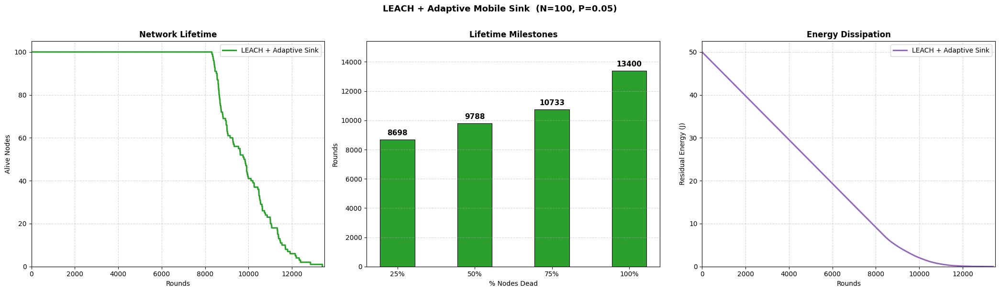

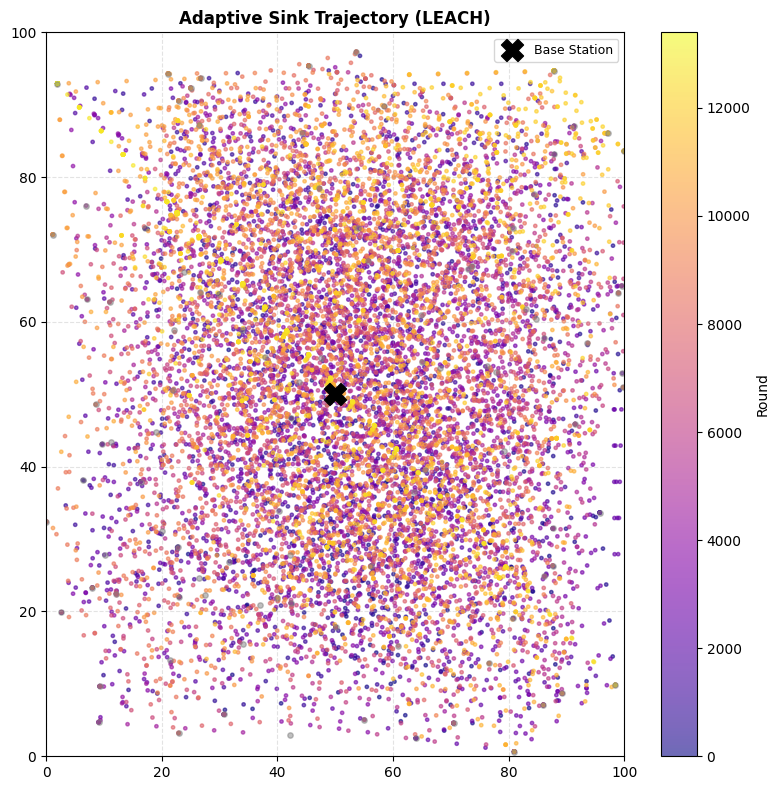

LEACH plots saved.


In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt
import time

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS
#    *** IDENTICAL to WaOA file — do not change these values ***
# =========================================================================
AREA           = 100
NUM_NODES      = 100
BS_X, BS_Y     = 50.0, 50.0

INITIAL_ENERGY = 0.5         # J per node

# ── Radio parameters — MUST match WaOA exactly for fair comparison ────────
PACKET_SIZE    = 500          # bits       ← same as WaOA
E_ELEC         = 50e-9        # 50 nJ/bit  ← same as WaOA
E_AMP          = 0.0013e-12   # pJ/bit/m²  ← same as WaOA
E_DA           = 5e-9         # data aggregation (LEACH only)

# ── LEACH parameters ──────────────────────────────────────────────────────
P     = 0.05
EPOCH = int(1 / P)            # 20 rounds per epoch

# ── Adaptive mobile sink — identical to WaOA ─────────────────────────────
R_COLLECT  = 25.0
V_MAX      = 5.0
T_SOJ_MIN  = 1
T_SOJ_MAX  = 4


# =========================================================================
# 2. CORE CLASSES
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id     = node_id
        self.x      = x
        self.y      = y
        self.energy = INITIAL_ENERGY
        self.alive  = True
        self.is_CH  = False


class AdaptiveMobileSink:
    """
    Identical sink logic to WaOA file.
    Moves toward CH with max residual energy.
    Stays T_SOJ_MIN..T_SOJ_MAX rounds, re-targets when sojourn expires
    or when current target CH dies.
    """
    def __init__(self):
        self.x            = BS_X
        self.y            = BS_Y
        self.target_ch    = None
        self.sojourn_left = 0

    def select_next_stop(self, ch_ids, node_pool):
        alive_chs = [c for c in ch_ids if node_pool[c].alive]
        if not alive_chs:
            return
        best           = max(alive_chs, key=lambda c: node_pool[c].energy)
        self.target_ch = best
        ch_energies    = [node_pool[c].energy for c in alive_chs]
        total_e        = sum(ch_energies) + 1e-12
        frac           = node_pool[best].energy / total_e
        raw            = T_SOJ_MIN + frac * (T_SOJ_MAX - T_SOJ_MIN) * len(alive_chs)
        self.sojourn_left = int(np.clip(round(raw), T_SOJ_MIN, T_SOJ_MAX))
        self._move_toward(node_pool[best])

    def _move_toward(self, target_node):
        dx = target_node.x - self.x
        dy = target_node.y - self.y
        d  = np.hypot(dx, dy)
        if d < 1e-6 or d <= V_MAX:
            self.x = target_node.x
            self.y = target_node.y
        else:
            self.x += V_MAX * dx / d
            self.y += V_MAX * dy / d
        self.x = float(np.clip(self.x, 0, AREA))
        self.y = float(np.clip(self.y, 0, AREA))

    def update(self, ch_ids, node_pool):
        if self.target_ch is not None and not node_pool[self.target_ch].alive:
            self.sojourn_left = 0
        if self.sojourn_left > 0:
            if self.target_ch is not None and node_pool[self.target_ch].alive:
                self._move_toward(node_pool[self.target_ch])
            self.sojourn_left -= 1
        else:
            self.select_next_stop(ch_ids, node_pool)

    def dist_to_node(self, node):
        return np.hypot(self.x - node.x, self.y - node.y)


# =========================================================================
# 3. ENERGY MODEL — same functions as WaOA
# =========================================================================
def tx_energy(bits, d):
    return E_ELEC * bits + E_AMP * bits * max(d, 1.0) ** 2

def rx_energy(bits):
    return E_ELEC * bits


# =========================================================================
# 4. LEACH CH SELECTION
# =========================================================================
def execute_leach(alive_idx, eligible_G, round_no):
    # reset eligible set every epoch
    if (round_no - 1) % EPOCH == 0:
        eligible_G = set(alive_idx)

    candidates = eligible_G.intersection(alive_idx)
    if not candidates:
        eligible_G = set(alive_idx)
        candidates = set(alive_idx)

    denom = 1 - P * ((round_no - 1) % EPOCH)
    if denom <= 0:
        denom = P
    T = P / denom

    ch_ids = [nid for nid in candidates if random.random() < T]
    for ch in ch_ids:
        eligible_G.discard(ch)

    return ch_ids, eligible_G


# =========================================================================
# 5. INITIALISATION
#    CRITICAL: same seed=42 and list-based nodes as WaOA
#    This guarantees identical node coordinates for fair comparison
# =========================================================================
random.seed(42)
np.random.seed(42)

node_network = [
    IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA))
    for i in range(NUM_NODES)
]

eligible_G  = set(range(NUM_NODES))
mobile_sink = AdaptiveMobileSink()

print("Pre-computing distance matrices...")
DIST_MATRIX = np.zeros((NUM_NODES, NUM_NODES))
DIST_TO_BS  = np.zeros(NUM_NODES)
for i in range(NUM_NODES):
    DIST_TO_BS[i] = np.hypot(node_network[i].x - BS_X,
                              node_network[i].y - BS_Y)
    for j in range(NUM_NODES):
        DIST_MATRIX[i][j] = np.hypot(
            node_network[i].x - node_network[j].x,
            node_network[i].y - node_network[j].y
        )


# =========================================================================
# 6. SIMULATION MAIN LOOP
# =========================================================================
alive_history  = []
energy_history = []
sink_x_history = []
sink_y_history = []

print(f"\n[START] LEACH + Adaptive Sink | N={NUM_NODES}  P={P}")
print("=" * 68)
start_time = time.time()
r = 1

while True:
    alive_idx = {n.id for n in node_network if n.alive}
    if not alive_idx:
        print(f"\n[STOP] Network dead at Round {r - 1}")
        break

    for n in node_network:
        n.is_CH = False

    # LEACH CH selection
    ch_ids, eligible_G = execute_leach(alive_idx, eligible_G, r)
    for cid in ch_ids:
        node_network[cid].is_CH = True

    # Adaptive sink moves toward highest-energy CH
    mobile_sink.update(ch_ids, node_network)

    if not ch_ids:
        # Failsafe: no CHs — every node transmits to nearest destination
        for n in node_network:
            if not n.alive:
                continue
            d_sink   = mobile_sink.dist_to_node(n)
            d_bs     = DIST_TO_BS[n.id]
            d_target = d_sink if (d_sink <= R_COLLECT or d_sink <= d_bs) \
                       else d_bs
            cost = tx_energy(PACKET_SIZE, d_target)
            if n.energy >= cost:
                n.energy -= cost
            else:
                n.energy = 0.0; n.alive = False
    else:
        # 1. Cluster formation
        clusters = {cid: [] for cid in ch_ids}
        for n in node_network:
            if not n.alive or n.is_CH:
                continue
            nearest = min(ch_ids, key=lambda c: DIST_MATRIX[n.id][c])
            clusters[nearest].append(n.id)

        # 2. Intra-cluster: member → CH
        for cid, members in clusters.items():
            ch = node_network[cid]
            for mid in members:
                m = node_network[mid]
                if not m.alive or not ch.alive:
                    continue
                d       = DIST_MATRIX[m.id][ch.id]
                cost_tx = tx_energy(PACKET_SIZE, d)
                cost_rx = rx_energy(PACKET_SIZE)
                if m.energy >= cost_tx:
                    m.energy -= cost_tx
                else:
                    m.energy = 0.0; m.alive = False; continue
                if ch.alive:
                    if ch.energy >= cost_rx:
                        ch.energy -= cost_rx
                    else:
                        ch.energy = 0.0; ch.alive = False

        # 3. Data aggregation at CH (LEACH specific)
        for cid, members in clusters.items():
            ch = node_network[cid]
            if not ch.alive:
                continue
            cost_da = E_DA * PACKET_SIZE * (len(members) + 1)
            if ch.energy >= cost_da:
                ch.energy -= cost_da
            else:
                ch.energy = 0.0; ch.alive = False

        # 4. Inter-cluster: CH → mobile sink (direct) or → fixed BS
        for cid in ch_ids:
            ch = node_network[cid]
            if not ch.alive:
                continue
            d_sink   = mobile_sink.dist_to_node(ch)
            d_bs     = DIST_TO_BS[cid]
            d_target = d_sink if (d_sink <= R_COLLECT or d_sink <= d_bs) \
                       else d_bs
            cost_tx  = tx_energy(PACKET_SIZE, d_target)
            if ch.energy >= cost_tx:
                ch.energy -= cost_tx
            else:
                ch.energy = 0.0; ch.alive = False

    alive_count = sum(1 for n in node_network if n.alive)
    residual_e  = sum(max(n.energy, 0) for n in node_network)
    alive_history.append(alive_count)
    energy_history.append(residual_e)
    sink_x_history.append(mobile_sink.x)
    sink_y_history.append(mobile_sink.y)

    if r % 500 == 0 or r == 1:
        print(f"Round {r:05d} | Alive: {alive_count:03d} | "
              f"Energy: {residual_e:.4f} J | CHs: {len(ch_ids):2d} | "
              f"Sink→({mobile_sink.x:.1f},{mobile_sink.y:.1f}) "
              f"tgt={mobile_sink.target_ch} soj={mobile_sink.sojourn_left}")
    r += 1

print(f"[DONE] {time.time() - start_time:.2f}s\n")


# =========================================================================
# 7. MILESTONES
# =========================================================================
TOTAL_ROUNDS = len(alive_history)
milestones   = []
for pct in [25, 50, 75, 100]:
    target  = max(0, NUM_NODES - int(NUM_NODES * pct / 100))
    reached = TOTAL_ROUNDS
    for idx, a in enumerate(alive_history):
        if a <= target:
            reached = idx + 1; break
    milestones.append(reached)

print("Network Lifetime Milestones (LEACH + Adaptive Sink):")
for lbl, rnd in zip(['25%','50%','75%','100%'], milestones):
    print(f"  {lbl} nodes dead  →  Round {rnd}")


# =========================================================================
# 8. PLOTS
# =========================================================================
fig, axes = plt.subplots(1, 3, figsize=(21, 6))
rounds_ax = range(1, TOTAL_ROUNDS + 1)

ax = axes[0]
ax.plot(rounds_ax, alive_history, color='#2ca02c', linewidth=2.2,
        label='LEACH + Adaptive Sink')
ax.set_title("Network Lifetime", fontweight='bold')
ax.set_xlabel("Rounds"); ax.set_ylabel("Alive Nodes")
ax.set_xlim(0, TOTAL_ROUNDS + 100); ax.set_ylim(0, NUM_NODES + 5)
ax.grid(True, linestyle='--', alpha=0.5); ax.legend(fontsize=10)

ax   = axes[1]
x    = np.arange(4)
bars = ax.bar(x, milestones, color='#2ca02c',
              width=0.45, edgecolor='black', linewidth=0.8)
ax.set_title("Lifetime Milestones", fontweight='bold')
ax.set_xlabel("% Nodes Dead"); ax.set_ylabel("Rounds")
ax.set_xticks(x)
ax.set_xticklabels(['25%','50%','75%','100%'])
ax.set_ylim(0, TOTAL_ROUNDS * 1.15)
ax.grid(True, linestyle='--', alpha=0.5, axis='y')
for bar, val in zip(bars, milestones):
    ax.text(bar.get_x() + bar.get_width() / 2,
            bar.get_height() + TOTAL_ROUNDS * 0.015,
            str(val), ha='center', va='bottom', fontweight='bold', fontsize=11)

ax = axes[2]
ax.plot(rounds_ax, energy_history, color='#9467bd', linewidth=2.2,
        label='LEACH + Adaptive Sink')
ax.set_title("Energy Dissipation", fontweight='bold')
ax.set_xlabel("Rounds"); ax.set_ylabel("Residual Energy (J)")
ax.set_xlim(0, TOTAL_ROUNDS + 100)
ax.set_ylim(0, NUM_NODES * INITIAL_ENERGY * 1.05)
ax.grid(True, linestyle='--', alpha=0.5); ax.legend(fontsize=10)

plt.suptitle(f"LEACH + Adaptive Mobile Sink  (N={NUM_NODES}, P={P})",
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig("leach_adaptive_final.png", dpi=150, bbox_inches='tight')
plt.show()

fig2, ax2 = plt.subplots(figsize=(8, 8))
sc = ax2.scatter(sink_x_history, sink_y_history,
                 c=range(TOTAL_ROUNDS), cmap='plasma', s=6, alpha=0.6)
plt.colorbar(sc, ax=ax2, label='Round')
for n in node_network:
    col = 'gray' if not n.alive else ('limegreen' if n.is_CH else 'steelblue')
    ax2.scatter(n.x, n.y, color=col, s=15, alpha=0.5)
ax2.scatter(BS_X, BS_Y, color='black', marker='X', s=250, zorder=10,
            label='Base Station')
ax2.set_title("Adaptive Sink Trajectory (LEACH)", fontweight='bold')
ax2.set_xlim(0, AREA); ax2.set_ylim(0, AREA)
ax2.grid(True, linestyle='--', alpha=0.35)
ax2.legend(fontsize=9)
plt.tight_layout()
plt.savefig("leach_trajectory_final.png", dpi=150, bbox_inches='tight')
plt.show()
print("LEACH plots saved.")

Pre-computing distance matrices...

[START] WaOA + Adaptive Sink | N=100 CHs=8
Round 00001 | Alive: 100 | Energy: 49.9951 J | Sink→(45.8,47.3) tgt=74 soj=4
Round 00500 | Alive: 100 | Energy: 47.5466 J | Sink→(67.8,71.6) tgt=88 soj=0
Round 01000 | Alive: 100 | Energy: 45.0944 J | Sink→(69.7,68.0) tgt=2 soj=0
Round 01500 | Alive: 100 | Energy: 42.6414 J | Sink→(72.5,53.0) tgt=64 soj=0
Round 02000 | Alive: 100 | Energy: 40.1890 J | Sink→(61.6,43.4) tgt=37 soj=0
Round 02500 | Alive: 100 | Energy: 37.7353 J | Sink→(69.7,34.4) tgt=3 soj=0
Round 03000 | Alive: 100 | Energy: 35.2818 J | Sink→(74.1,68.9) tgt=84 soj=0
Round 03500 | Alive: 100 | Energy: 32.8283 J | Sink→(65.7,69.4) tgt=64 soj=0
Round 04000 | Alive: 100 | Energy: 30.3760 J | Sink→(55.9,52.6) tgt=41 soj=0
Round 04500 | Alive: 100 | Energy: 27.9235 J | Sink→(48.0,22.3) tgt=65 soj=0
Round 05000 | Alive: 099 | Energy: 25.4732 J | Sink→(79.3,20.1) tgt=9 soj=0
Round 05500 | Alive: 097 | Energy: 23.0679 J | Sink→(58.2,37.9) tgt=40 soj=0


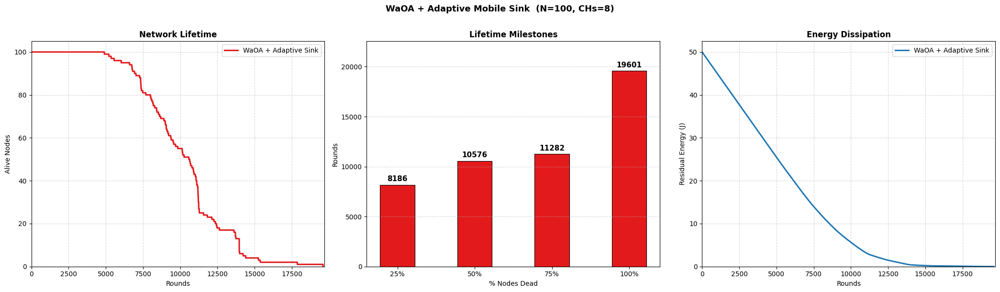

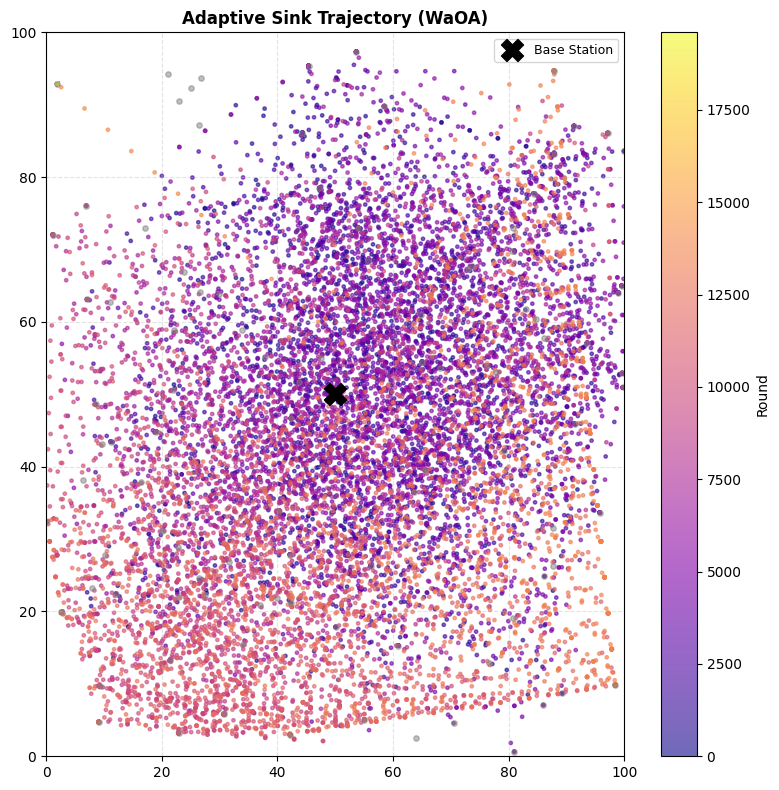

WaOA plots saved.


In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt
import time

# =========================================================================
# 1. NETWORK & RADIO PARAMETERS
#    *** BOTH algorithms must use these EXACT same values ***
# =========================================================================
AREA           = 100
NUM_NODES      = 100
BS_X, BS_Y     = 50.0, 50.0

INITIAL_ENERGY = 0.5         # J per node

# ── Radio parameters (OPTIMIZED — matched across all algorithms) ──────────
PACKET_SIZE    = 500          # bits
E_ELEC         = 50e-9        # 50 nJ/bit
E_AMP          = 0.0013e-12   # 0.0013 pJ/bit/m²

# ── WaOA clustering ───────────────────────────────────────────────────────
NUM_WALRUSES         = 20
NUM_CH               = 8
MAX_ITER             = 20
LB, UB               = 0, NUM_NODES - 1
BETA1, BETA2, BETA3  = 0.20, 0.65, 0.15
CH_ENERGY_PERCENTILE = 40

# ── Multi-hop routing weights ─────────────────────────────────────────────
R_BETA1, R_BETA2, R_BETA3 = 0.15, 0.15, 0.70

# ── Adaptive mobile sink ──────────────────────────────────────────────────
R_COLLECT  = 25.0   # m — CH sends direct to sink if within this
V_MAX      = 5.0    # m/round
T_SOJ_MIN  = 1
T_SOJ_MAX  = 4


# =========================================================================
# 2. CORE CLASSES
# =========================================================================
class IoTNode:
    def __init__(self, node_id, x, y):
        self.id     = node_id
        self.x      = x
        self.y      = y
        self.energy = INITIAL_ENERGY
        self.alive  = True
        self.is_CH  = False


class AdaptiveMobileSink:
    """
    Moves toward the CH with the highest residual energy.
    Stays T_SOJ_MIN..T_SOJ_MAX rounds, then re-targets.
    Re-targets immediately if current target CH dies.
    """
    def __init__(self):
        self.x            = BS_X
        self.y            = BS_Y
        self.target_ch    = None
        self.sojourn_left = 0

    def select_next_stop(self, ch_ids, node_pool):
        alive_chs = [c for c in ch_ids if node_pool[c].alive]
        if not alive_chs:
            return
        best           = max(alive_chs, key=lambda c: node_pool[c].energy)
        self.target_ch = best
        ch_energies    = [node_pool[c].energy for c in alive_chs]
        total_e        = sum(ch_energies) + 1e-12
        frac           = node_pool[best].energy / total_e
        raw            = T_SOJ_MIN + frac * (T_SOJ_MAX - T_SOJ_MIN) * len(alive_chs)
        self.sojourn_left = int(np.clip(round(raw), T_SOJ_MIN, T_SOJ_MAX))
        self._move_toward(node_pool[best])

    def _move_toward(self, target_node):
        dx = target_node.x - self.x
        dy = target_node.y - self.y
        d  = np.hypot(dx, dy)
        if d < 1e-6 or d <= V_MAX:
            self.x = target_node.x
            self.y = target_node.y
        else:
            self.x += V_MAX * dx / d
            self.y += V_MAX * dy / d
        self.x = float(np.clip(self.x, 0, AREA))
        self.y = float(np.clip(self.y, 0, AREA))

    def update(self, ch_ids, node_pool):
        if self.target_ch is not None and not node_pool[self.target_ch].alive:
            self.sojourn_left = 0
        if self.sojourn_left > 0:
            if self.target_ch is not None and node_pool[self.target_ch].alive:
                self._move_toward(node_pool[self.target_ch])
            self.sojourn_left -= 1
        else:
            self.select_next_stop(ch_ids, node_pool)

    def dist_to_node(self, node):
        return np.hypot(self.x - node.x, self.y - node.y)


# =========================================================================
# 3. ENERGY MODEL
# =========================================================================
def tx_energy(bits, d):
    return E_ELEC * bits + E_AMP * bits * max(d, 1.0) ** 2

def rx_energy(bits):
    return E_ELEC * bits


# =========================================================================
# 4. CLUSTERING FITNESS
# =========================================================================
def clustering_fitness(ch_ids, alive_list, node_pool):
    if not ch_ids:
        return float('inf')
    f1      = sum(DIST_TO_BS[ch] for ch in ch_ids)
    total_e = sum(node_pool[i].energy for i in alive_list) + 1e-9
    ch_e    = sum(node_pool[ch].energy for ch in ch_ids)
    f2      = ch_e / total_e
    ch_set  = set(ch_ids)
    f3      = sum(
        min(DIST_MATRIX[n][ch] for ch in ch_ids)
        for n in alive_list if n not in ch_set
    )
    return BETA1 * f1 + BETA2 * (1.0 / (f2 + 1e-6)) + BETA3 * f3


# =========================================================================
# 5. REPAIR HELPER
# =========================================================================
def _repair(sol, alive_list, k):
    seen, cleaned = set(), []
    for v in sol:
        if v not in seen:
            seen.add(v); cleaned.append(v)
    pool = [x for x in alive_list if x not in seen]
    random.shuffle(pool)
    while len(cleaned) < k and pool:
        nxt = pool.pop(); cleaned.append(nxt); seen.add(nxt)
    return cleaned[:k]

def _to_node(val, alive_idx, strong):
    nid = int(round(np.clip(val, LB, UB)))
    return nid if nid in alive_idx else random.choice(strong)


# =========================================================================
# 6. WaOA — paper Eqs. (3)–(9)
# =========================================================================
def execute_waoa(node_pool, alive_idx, k):
    alive_list = list(alive_idx)
    m          = k

    energies  = [node_pool[i].energy for i in alive_list]
    threshold = np.percentile(energies, CH_ENERGY_PERCENTILE)
    strong    = [i for i in alive_list if node_pool[i].energy >= threshold]
    if len(strong) < k:
        strong = alive_list[:]
    if len(strong) <= k:
        return _repair(list(strong), alive_list, k)

    population = [random.sample(strong, k) for _ in range(NUM_WALRUSES)]
    fitness    = [clustering_fitness(s, alive_list, node_pool)
                  for s in population]
    best_idx   = int(np.argmin(fitness))
    g_best_sol = list(population[best_idx])
    g_best_fit = fitness[best_idx]

    for t in range(1, MAX_ITER + 1):
        lb_local = LB / t
        ub_local = UB / t

        bi = int(np.argmin(fitness))
        if fitness[bi] < g_best_fit:
            g_best_sol = list(population[bi])
            g_best_fit = fitness[bi]

        for i in range(NUM_WALRUSES):

            # Phase 1 — Feeding Eq.(3,4)
            new_p1 = []
            for j in range(m):
                I_ij = random.choice([1, 2])
                r_ij = random.random()
                val  = population[i][j] + r_ij * (
                           g_best_sol[j] - I_ij * population[i][j])
                new_p1.append(_to_node(val, alive_idx, strong))
            new_p1 = _repair(new_p1, alive_list, k)
            fit_p1 = clustering_fitness(new_p1, alive_list, node_pool)
            if fit_p1 < fitness[i]:
                population[i] = new_p1; fitness[i] = fit_p1
                if fit_p1 < g_best_fit:
                    g_best_sol = list(new_p1); g_best_fit = fit_p1

            # Phase 2 — Migration Eq.(5,6)
            kk     = random.choice([x for x in range(NUM_WALRUSES) if x != i])
            new_p2 = []
            for j in range(m):
                r_ij = random.random()
                if fitness[kk] < fitness[i]:
                    I_ij = random.choice([1, 2])
                    val  = population[i][j] + r_ij * (
                               population[kk][j] - I_ij * population[i][j])
                else:
                    val  = population[i][j] + r_ij * (
                               population[i][j] - population[kk][j])
                new_p2.append(_to_node(val, alive_idx, strong))
            new_p2 = _repair(new_p2, alive_list, k)
            fit_p2 = clustering_fitness(new_p2, alive_list, node_pool)
            if fit_p2 < fitness[i]:
                population[i] = new_p2; fitness[i] = fit_p2
                if fit_p2 < g_best_fit:
                    g_best_sol = list(new_p2); g_best_fit = fit_p2

            # Phase 3 — Escape/Fight Predators Eq.(7,8,9)
            new_p3 = []
            for j in range(m):
                rand_j = random.random()
                disp   = lb_local + (ub_local - rand_j * lb_local)
                val    = population[i][j] + disp
                new_p3.append(_to_node(val, alive_idx, strong))
            new_p3 = _repair(new_p3, alive_list, k)
            fit_p3 = clustering_fitness(new_p3, alive_list, node_pool)
            if fit_p3 < fitness[i]:
                population[i] = new_p3; fitness[i] = fit_p3
                if fit_p3 < g_best_fit:
                    g_best_sol = list(new_p3); g_best_fit = fit_p3

    return g_best_sol


# =========================================================================
# 7. INITIALISATION  — seed 42, list-based nodes
# =========================================================================
random.seed(42);  np.random.seed(42)

node_network = [
    IoTNode(i, random.uniform(0, AREA), random.uniform(0, AREA))
    for i in range(NUM_NODES)
]

mobile_sink = AdaptiveMobileSink()

print("Pre-computing distance matrices...")
DIST_MATRIX = np.zeros((NUM_NODES, NUM_NODES))
DIST_TO_BS  = np.zeros(NUM_NODES)
for i in range(NUM_NODES):
    DIST_TO_BS[i] = np.hypot(node_network[i].x - BS_X,
                              node_network[i].y - BS_Y)
    for j in range(NUM_NODES):
        DIST_MATRIX[i][j] = np.hypot(
            node_network[i].x - node_network[j].x,
            node_network[i].y - node_network[j].y
        )


# =========================================================================
# 8. SIMULATION MAIN LOOP
# =========================================================================
alive_history  = []
energy_history = []
sink_x_history = []
sink_y_history = []

print(f"\n[START] WaOA + Adaptive Sink | N={NUM_NODES} CHs={NUM_CH}")
print("=" * 68)
start_time = time.time()
r = 1

while True:
    alive_idx = {n.id for n in node_network if n.alive}
    if not alive_idx:
        print(f"\n[STOP] Network dead at Round {r - 1}")
        break

    k = min(NUM_CH, len(alive_idx))
    for n in node_network:
        n.is_CH = False

    ch_ids = execute_waoa(node_network, alive_idx, k)
    for cid in ch_ids:
        node_network[cid].is_CH = True

    mobile_sink.update(ch_ids, node_network)

    clusters = {cid: [] for cid in ch_ids}
    for n in node_network:
        if not n.alive or n.is_CH:
            continue
        nearest = min(ch_ids, key=lambda c: DIST_MATRIX[n.id][c])
        clusters[nearest].append(n.id)

    dist_sink = {cid: mobile_sink.dist_to_node(node_network[cid])
                 for cid in ch_ids}
    dist_bs   = {cid: DIST_TO_BS[cid] for cid in ch_ids}

    routing_paths = {}
    for cid in ch_ids:
        if dist_sink[cid] <= R_COLLECT or dist_sink[cid] <= dist_bs[cid]:
            routing_paths[cid] = 'SINK'
        else:
            candidates = [c for c in ch_ids
                          if dist_bs[c] < dist_bs[cid]
                          and node_network[c].alive]
            if candidates:
                best_relay = min(
                    candidates,
                    key=lambda c: (R_BETA1 * DIST_MATRIX[cid][c]
                                   + R_BETA2 * dist_bs[c]
                                   + R_BETA3 / (node_network[c].energy + 1e-9))
                )
                routing_paths[cid] = best_relay
            else:
                routing_paths[cid] = 'BS'

    # Intra-cluster: member → CH
    for cid, members in clusters.items():
        ch = node_network[cid]
        for mid in members:
            m = node_network[mid]
            if not m.alive or not ch.alive:
                continue
            d       = DIST_MATRIX[m.id][ch.id]
            cost_tx = tx_energy(PACKET_SIZE, d)
            cost_rx = rx_energy(PACKET_SIZE)
            if m.energy >= cost_tx:
                m.energy -= cost_tx
            else:
                m.energy = 0.0; m.alive = False; continue
            if ch.alive:
                if ch.energy >= cost_rx:
                    ch.energy -= cost_rx
                else:
                    ch.energy = 0.0; ch.alive = False

    # Inter-cluster: CH → sink / relay / BS
    sorted_chs = sorted(ch_ids, key=lambda c: dist_bs[c], reverse=True)
    for cid in sorted_chs:
        ch = node_network[cid]
        if not ch.alive:
            continue
        nh = routing_paths[cid]
        if nh == 'SINK':
            cost = tx_energy(PACKET_SIZE, dist_sink[cid])
            if ch.energy >= cost:
                ch.energy -= cost
            else:
                ch.energy = 0.0; ch.alive = False
        elif nh == 'BS':
            cost = tx_energy(PACKET_SIZE, dist_bs[cid])
            if ch.energy >= cost:
                ch.energy -= cost
            else:
                ch.energy = 0.0; ch.alive = False
        else:
            relay   = node_network[nh]
            d_relay = DIST_MATRIX[cid][relay.id]
            c_tx    = tx_energy(PACKET_SIZE, d_relay)
            c_rx    = rx_energy(PACKET_SIZE)
            if ch.energy >= c_tx:
                ch.energy -= c_tx
            else:
                ch.energy = 0.0; ch.alive = False; continue
            if relay.alive:
                if relay.energy >= c_rx:
                    relay.energy -= c_rx
                else:
                    relay.energy = 0.0; relay.alive = False

    alive_count = sum(1 for n in node_network if n.alive)
    residual_e  = sum(max(n.energy, 0) for n in node_network)
    alive_history.append(alive_count)
    energy_history.append(residual_e)
    sink_x_history.append(mobile_sink.x)
    sink_y_history.append(mobile_sink.y)

    if r % 500 == 0 or r == 1:
        print(f"Round {r:05d} | Alive: {alive_count:03d} | "
              f"Energy: {residual_e:.4f} J | "
              f"Sink→({mobile_sink.x:.1f},{mobile_sink.y:.1f}) "
              f"tgt={mobile_sink.target_ch} soj={mobile_sink.sojourn_left}")
    r += 1

print(f"[DONE] {time.time() - start_time:.1f}s\n")


# =========================================================================
# 9. MILESTONES
# =========================================================================
TOTAL_ROUNDS = len(alive_history)
milestones   = []
for pct in [25, 50, 75, 100]:
    target  = NUM_NODES - int(NUM_NODES * pct / 100)
    reached = TOTAL_ROUNDS
    for idx, a in enumerate(alive_history):
        if a <= target:
            reached = idx + 1; break
    milestones.append(reached)

print("Network Lifetime Milestones (WaOA + Adaptive Sink):")
for lbl, rnd in zip(['25%','50%','75%','100%'], milestones):
    print(f"  {lbl} nodes dead  →  Round {rnd}")


# =========================================================================
# 10. PLOTS
# =========================================================================
fig, axes = plt.subplots(1, 3, figsize=(21, 6))
rounds_ax = range(1, TOTAL_ROUNDS + 1)

ax = axes[0]
ax.plot(rounds_ax, alive_history, color='#e31a1c', linewidth=2.2,
        label='WaOA + Adaptive Sink')
ax.set_title("Network Lifetime", fontweight='bold')
ax.set_xlabel("Rounds"); ax.set_ylabel("Alive Nodes")
ax.set_xlim(0, TOTAL_ROUNDS + 100); ax.set_ylim(0, NUM_NODES + 5)
ax.grid(True, linestyle='--', alpha=0.5); ax.legend(fontsize=10)

ax   = axes[1]
x    = np.arange(4)
bars = ax.bar(x, milestones, color='#e31a1c',
              width=0.45, edgecolor='black', linewidth=0.8)
ax.set_title("Lifetime Milestones", fontweight='bold')
ax.set_xlabel("% Nodes Dead"); ax.set_ylabel("Rounds")
ax.set_xticks(x)
ax.set_xticklabels(['25%','50%','75%','100%'])
ax.set_ylim(0, TOTAL_ROUNDS * 1.15)
ax.grid(True, linestyle='--', alpha=0.5, axis='y')
for bar, val in zip(bars, milestones):
    ax.text(bar.get_x() + bar.get_width() / 2,
            bar.get_height() + TOTAL_ROUNDS * 0.01,
            str(val), ha='center', va='bottom', fontweight='bold', fontsize=11)

ax = axes[2]
ax.plot(rounds_ax, energy_history, color='#1f78b4', linewidth=2.2,
        label='WaOA + Adaptive Sink')
ax.set_title("Energy Dissipation", fontweight='bold')
ax.set_xlabel("Rounds"); ax.set_ylabel("Residual Energy (J)")
ax.set_xlim(0, TOTAL_ROUNDS + 100)
ax.set_ylim(0, NUM_NODES * INITIAL_ENERGY * 1.05)
ax.grid(True, linestyle='--', alpha=0.5); ax.legend(fontsize=10)

plt.suptitle(f"WaOA + Adaptive Mobile Sink  (N={NUM_NODES}, CHs={NUM_CH})",
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig("waoa_adaptive_final.png", dpi=150, bbox_inches='tight')
plt.show()

fig2, ax2 = plt.subplots(figsize=(8, 8))
sc = ax2.scatter(sink_x_history, sink_y_history,
                 c=range(TOTAL_ROUNDS), cmap='plasma', s=6, alpha=0.6)
plt.colorbar(sc, ax=ax2, label='Round')
for n in node_network:
    col = 'gray' if not n.alive else ('limegreen' if n.is_CH else 'steelblue')
    ax2.scatter(n.x, n.y, color=col, s=15, alpha=0.5)
ax2.scatter(BS_X, BS_Y, color='black', marker='X', s=250, zorder=10,
            label='Base Station')
ax2.set_title("Adaptive Sink Trajectory (WaOA)", fontweight='bold')
ax2.set_xlim(0, AREA); ax2.set_ylim(0, AREA)
ax2.grid(True, linestyle='--', alpha=0.35)
ax2.legend(fontsize=9)
plt.tight_layout()
plt.savefig("waoa_trajectory_final.png", dpi=150, bbox_inches='tight')
plt.show()
print("WaOA plots saved.")